In [1]:
from astropy.io import fits
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import matplotlib.image as mp
import matplotlib.pyplot as plt
from skimage import measure
import random
import shutil
import cv2
import csv
import os

In [2]:
dir="frame3/g_fit/"    #目录路径
#获取当前目录下所有的文件路径
AllPath = []
for root,dirs,files in os.walk(dir):
    for file in files:
        #f.writelines(os.path.join(root,file)+"\n")
        if file != ".DS_Store":
            AllPath.append(os.path.join(root,file))

In [3]:
def str_2(str_origin, str_add):
    str_out = str_origin
    str_out = 'frame3/'+str_out[0:11]+str_add+str_out[12:]
    return  str_out

fileDir = "frame3/g_fit/"
pathDir = os.listdir(fileDir)
# print(pathDir[0])

# sample = random.sample(pathDir, 10) #随机选择图像
# sample = np.array(sample)

for path in AllPath:
#     print(path)
    hdulist = fits.open(path)
    ima = hdulist[0].data
    cv2.imwrite('frame2/g_png/'+path[12:27]+'.png',ima) #保存png格式图像

STRIP   ='N          '         / Strip in the stripe being tracked.              [astropy.io.fits.card]
FLAVOR  ='science    '         / Flavor of this run                              [astropy.io.fits.card]
SYS_SCN ='mean       '         / System of the scan great circle (e.g., mean)    [astropy.io.fits.card]
OBJECT  ='10 N       '         / e.g., 'stripe 50.6 degrees, north strip'        [astropy.io.fits.card]
EXPTIME ='53.911552'           / Exposure time (seconds)                         [astropy.io.fits.card]
DAVERS  ='v12_6   '            / Version of DA software                          [astropy.io.fits.card]


In [4]:
dir="frame2/g_png"    #目录路径
#获取当前目录下所有的文件路径
AllPath = []
for root,dirs,files in os.walk(dir):
    for file in files:
        #f.writelines(os.path.join(root,file)+"\n")
        if file != ".DS_Store":
            AllPath.append(os.path.join(root,file))

print(AllPath[0])

frame2/g_png/005754-g3-0747.png


In [6]:
for path in AllPath:
#     print(path)
    # 加载图像，转换为灰度，并模糊它
    image = cv2.imread(path)
    # 转换为灰度图
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # 平滑滤波，以减少高频噪声
    blurred = cv2.GaussianBlur(gray, (1, 1), 0)

    # 阈值化处理，显示模糊图像中最亮的区域（操作任意像素值p >=70，并将其设置为255（白色）。像素值< 70被设置为0（黑色））
    thresh = cv2.threshold(blurred, 4, 255, cv2.THRESH_BINARY)[1]

    # 侵蚀和膨胀处理
    # thresh = cv2.erode(thresh, None, iterations=6)
    # thresh = cv2.dilate(thresh, None, iterations=4)

    # 对阈值执行连接组件分析，图像，然后初始化一个掩码，只存储“大”图像
    labels = measure.label(thresh, connectivity=2, background=0) #八连通
    mask = np.zeros(thresh.shape, dtype="uint8")

    # 循环遍历唯一的组件
    for label in np.unique(labels):
        if label != 0:
            pass
        # 如果这是背景标签，忽略它
        else:
            continue

        # 否则，构造标签掩码并计算像素数
        labelMask = np.zeros(thresh.shape, dtype="uint8")
        labelMask[labels == label] = 255
        numPixels = cv2.countNonZero(labelMask)

        # 如果组件中的像素数足够
        if numPixels <= 0:
            continue
        # 大的，然后添加到我们的“大斑点”蒙版中
        mask = cv2.add(mask, labelMask)

    # 在蒙版中找到轮廓，然后从左到右排序
    contours, hierarchy = cv2.findContours(mask.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    #cnts = imutils.grab_contours(cnts)
    # cnts = contours.sort_contours(cnts)[0]
    def cnt_area(cnt):
        area = cv2.contourArea(cnt)
        return area

    contours.sort(key=cnt_area, reverse=True)

    #在轮廓上循环
    for (i, c) in enumerate(contours):
        # 创建文件对象
        f = open('data/g_csv/'+path[13:27]+'.csv', 'a', encoding='utf-8', newline='')
        # 基于文件对象构建 csv写入对象
        csv_writer = csv.writer(f)
        # 构建列表头
        #csv_writer.writerow(["picture", "x", "y"])

        # 画出图像上的亮点
        (x, y, w, h) = cv2.boundingRect(c)
        ((cX, cY), radius) = cv2.minEnclosingCircle(c)
        cv2.circle(image, (int(cX), int(cY)), int(radius) , (0, 0, 255), 3)
        cv2.putText(image, "#{}".format(i + 1), (x, y - 15) , cv2.FONT_HERSHEY_SIMPLEX, 0.45, (0, 0, 255), 2)
#         csv_writer.writerow([cY,cX])

# 关闭文件
#         f.close()

In [7]:
dir="data/u_csv"    #目录路径
#获取当前目录下所有的文件路径
AllPath = []
for root,dirs,files in os.walk(dir):
    for file in files:
        #f.writelines(os.path.join(root,file)+"\n")
        if file != ".DS_Store":
            AllPath.append(os.path.join(root,file))

print(AllPath[0])

data/u_csv/003893-u6-0256.csv


003893-u6-0256(1815.5,1184.5)


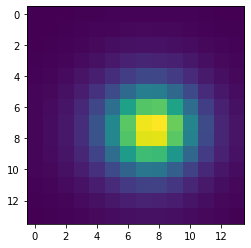

003893-u6-0256(1868.351806640625,1204.9814453125)


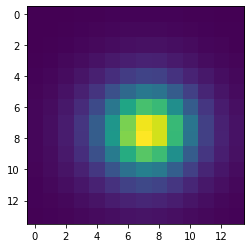

003893-u6-0256(2019.625,1086.625)


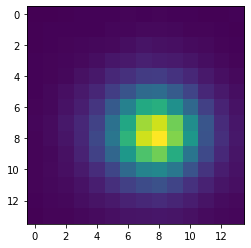

003893-u6-0256(1701.5,255.5)


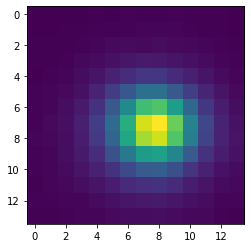

003893-u6-0256(1102.0,961.0)


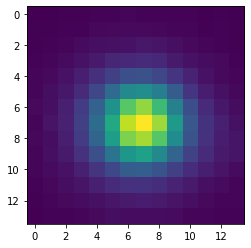

003893-u6-0256(1256.5,294.0)


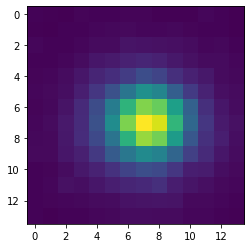

003893-u6-0256(1428.0,375.0)


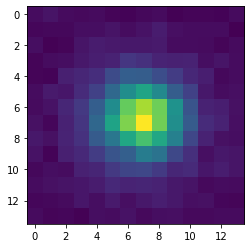

003606-u3-0158(1054.8333740234377,868.1666870117188)


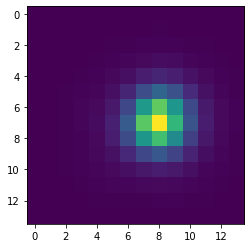

003606-u3-0158(1612.2059326171875,1350.558837890625)


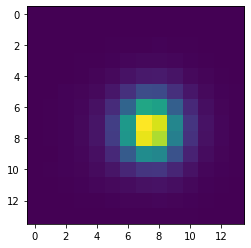

003606-u3-0158(1653.3333740234375,1393.0)


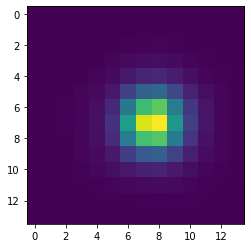

003606-u3-0158(729.9634399414062,69.06097412109375)


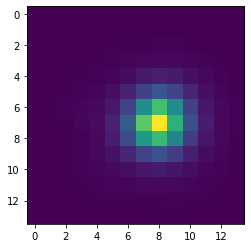

003606-u3-0158(1214.5,318.0)


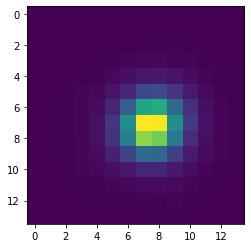

003606-u3-0158(1702.5,450.5)


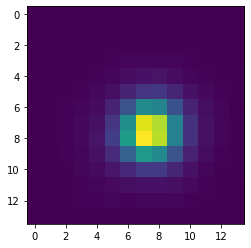

003606-u3-0158(1339.4000244140625,982.0)


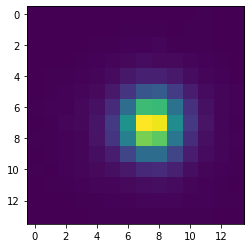

003606-u3-0158(1883.25,785.125)


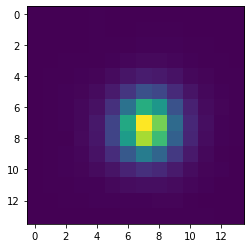

003606-u3-0158(762.0,1218.4000244140625)


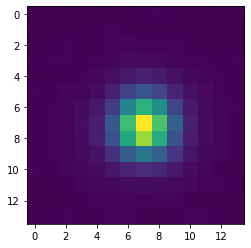

003606-u3-0158(789.0,1147.0)


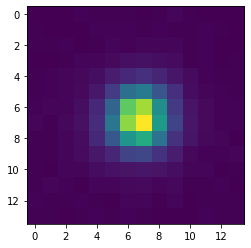

003606-u3-0158(1461.0,1115.0)


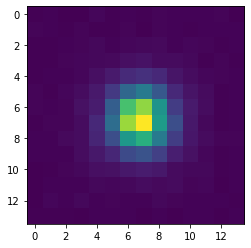

003606-u3-0158(1186.0,938.0)


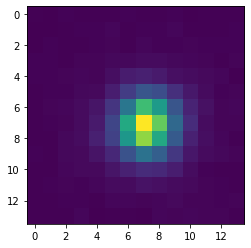

003606-u3-0158(1526.5,793.0)


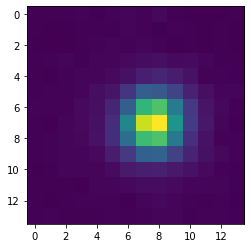

003606-u3-0158(1776.8333740234375,1028.5)


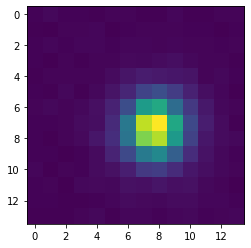

003606-u3-0158(566.25,369.25)


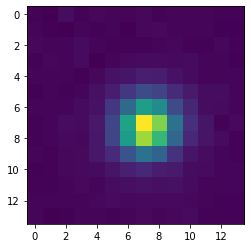

003606-u3-0158(1279.0,1154.25)


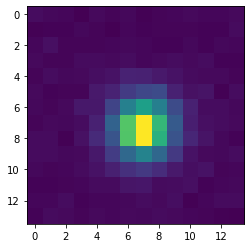

003606-u3-0158(1055.5,781.5)


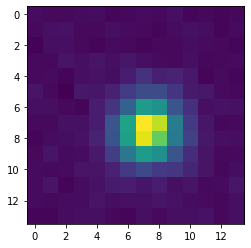

003606-u3-0158(823.0,372.0)


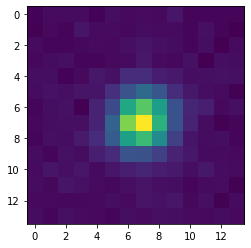

003606-u3-0158(1483.0,203.0)


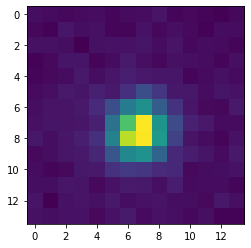

003631-u6-0326(1023.5,1162.0)


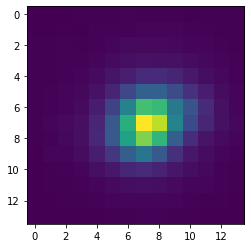

003631-u6-0326(1552.875,445.25)


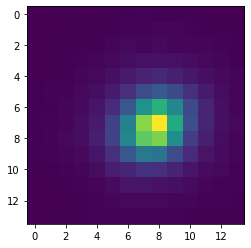

003631-u6-0326(797.7857055664062,205.2142791748047)


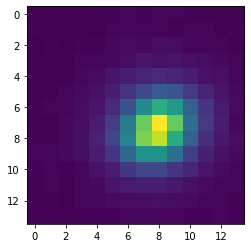

003631-u6-0326(2013.5,554.1666870117189)


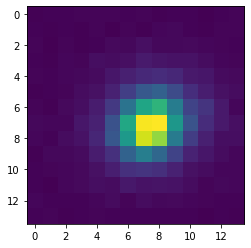

003631-u6-0326(546.5,1171.0)


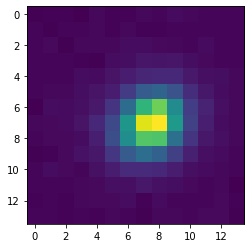

003631-u6-0326(1939.0,247.0)


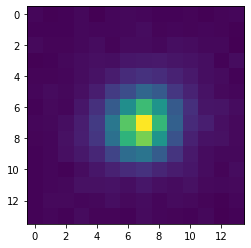

002888-u4-0107(984.1363525390624,468.4090881347656)


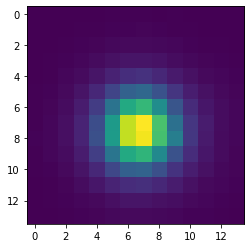

002888-u4-0107(1539.699951171875,461.70001220703125)


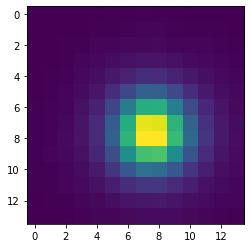

002888-u4-0107(988.6818237304688,511.31817626953125)


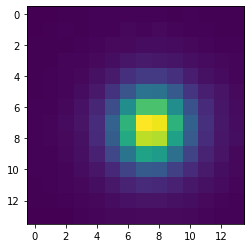

002888-u4-0107(949.7941284179688,461.6176452636719)


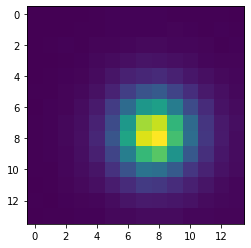

002888-u4-0107(1812.3695068359373,234.1086883544922)


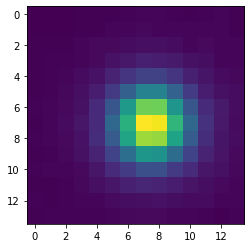

002888-u4-0107(527.625,824.5625)


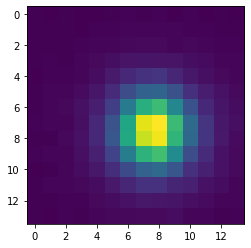

002888-u4-0107(1999.5,1188.5)


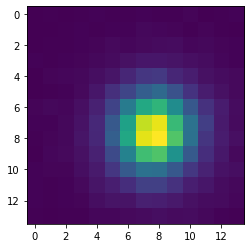

002888-u4-0107(1592.1842041015625,912.6052856445312)


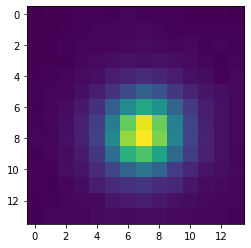

002888-u4-0107(661.6052856445312,615.1842041015625)


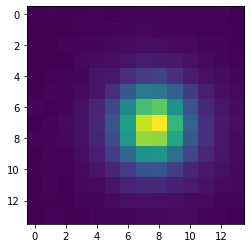

002888-u4-0107(2028.25,1004.5)


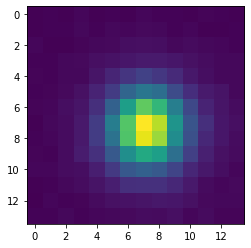

002888-u4-0107(444.5,875.5)


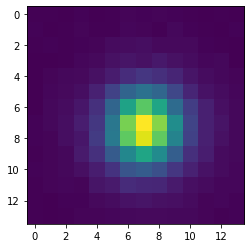

002888-u4-0107(1600.7105712890625,810.4473876953125)


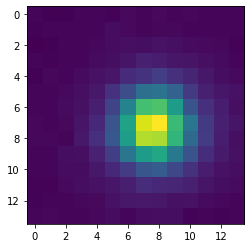

002888-u4-0107(1575.9285888671875,74.07142639160156)


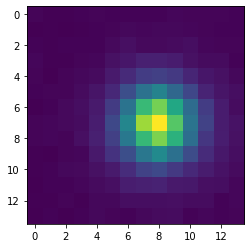

002888-u4-0107(1873.300048828125,103.3000030517578)


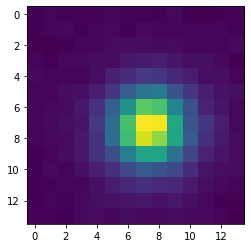

002888-u4-0107(587.5,380.0)


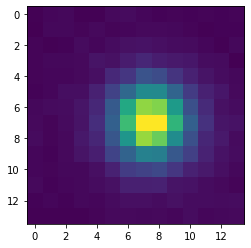

002888-u4-0107(1223.300048828125,1177.300048828125)


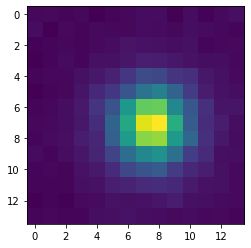

002888-u4-0107(814.0,498.6666564941406)


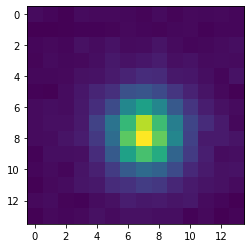

002888-u4-0107(1337.5,388.5)


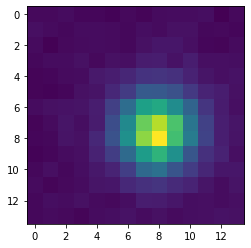

002888-u4-0107(1872.0,1338.5)


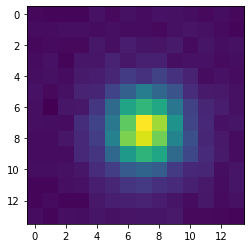

002888-u4-0107(911.0,547.0)


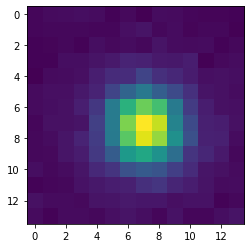

002888-u4-0107(1180.5,1142.0)


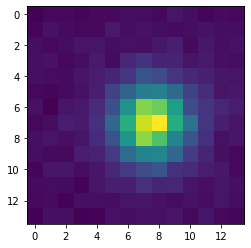

002888-u4-0107(398.0,802.5)


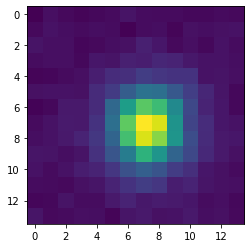

002888-u4-0107(1421.5,49.5)


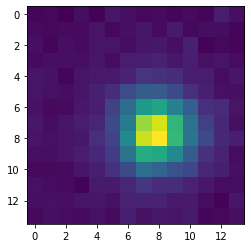

002888-u4-0107(239.0,1126.0)


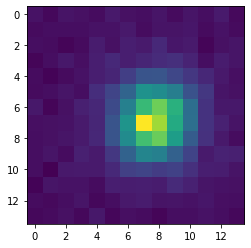

002888-u4-0107(945.0,1017.0)


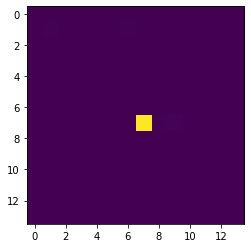

002888-u4-0107(1584.5,882.0)


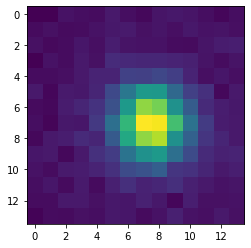

003512-u4-0044(573.5,394.0)


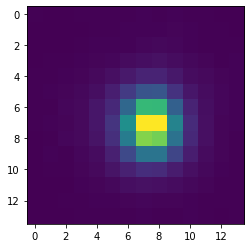

003512-u4-0044(1021.0,465.0)


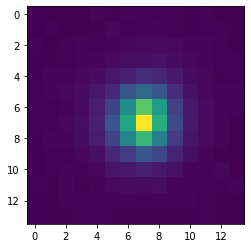

003512-u4-0044(1472.0,1333.0)


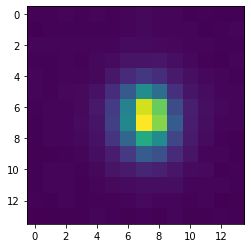

003512-u4-0044(945.1666870117188,902.5)


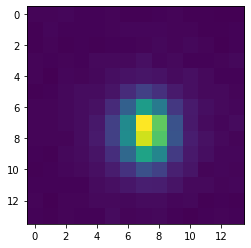

003512-u4-0044(695.5,857.8333129882812)


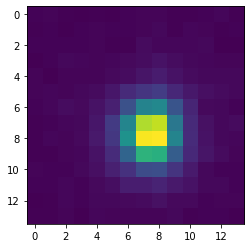

003512-u4-0044(326.8333435058594,150.5)


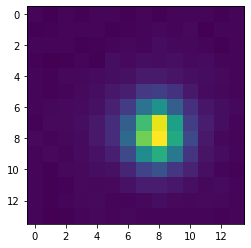

003512-u4-0044(1464.2142333984375,240.64285278320312)


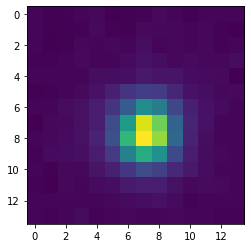

003512-u4-0044(1093.0,246.3333282470703)


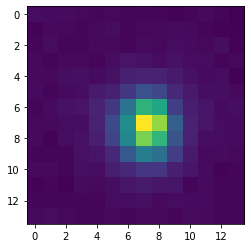

003512-u4-0044(66.5,1102.5)


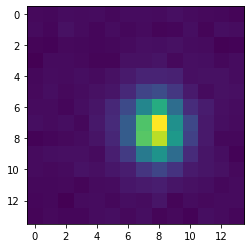

003512-u4-0044(431.0,821.5)


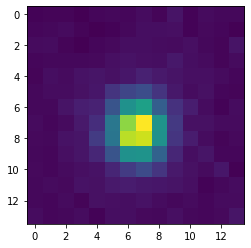

003512-u4-0044(1449.5,1468.0)


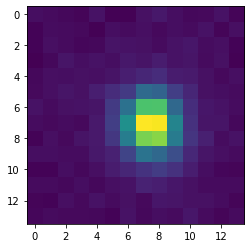

003512-u4-0044(1699.5,130.0)


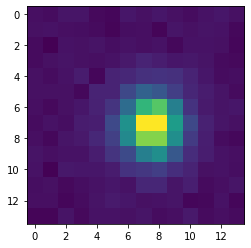

003512-u4-0044(959.5,902.0)


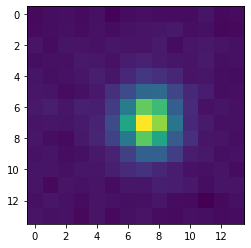

003512-u4-0044(503.5,473.5)


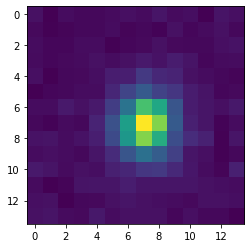

003512-u4-0044(353.0,1192.5)


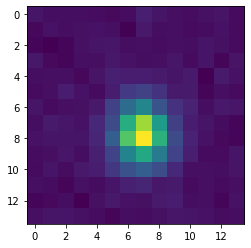

003512-u4-0044(921.0,371.0)


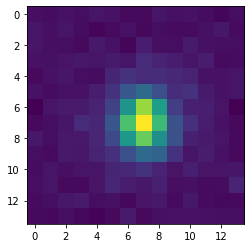

003512-u4-0044(1967.0,96.0)


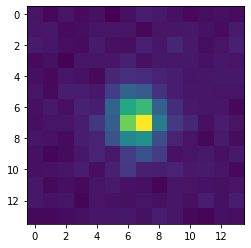

003512-u4-0044(1659.0,74.5)


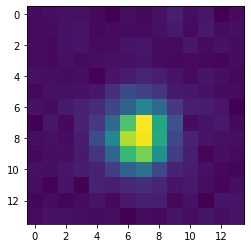

003437-u5-0300(227.6904754638672,891.6428833007812)


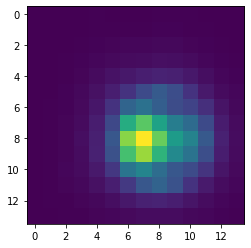

003437-u5-0300(1610.5,912.5)


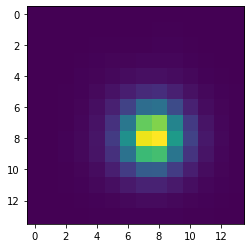

003437-u5-0300(207.78787231445312,1120.9090576171877)


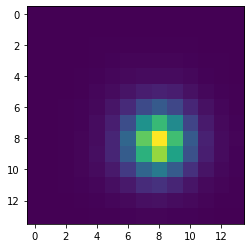

003437-u5-0300(362.6525573730469,1123.7203369140623)


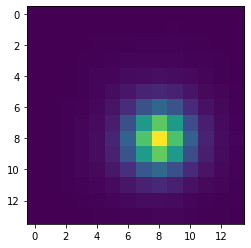

003437-u5-0300(1836.6666259765625,142.6666717529297)


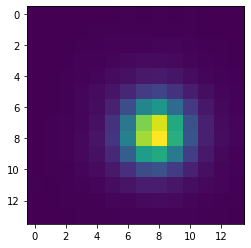

003437-u5-0300(649.5,488.5)


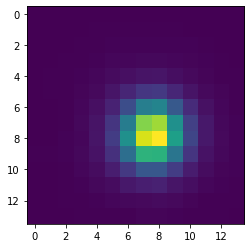

003437-u5-0300(137.5,739.5)


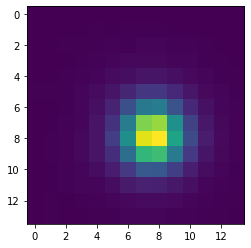

003437-u5-0300(354.25,17.5)


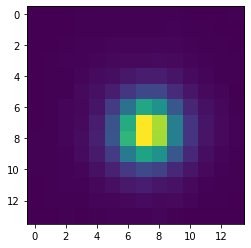

003437-u5-0300(229.05172729492188,147.2586212158203)


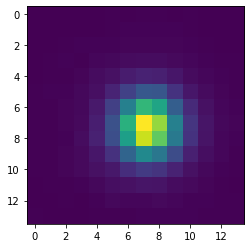

003437-u5-0300(294.5,780.5)


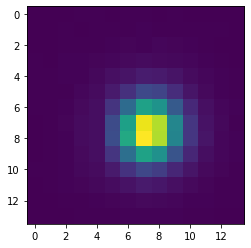

003437-u5-0300(1278.394775390625,1321.8157958984375)


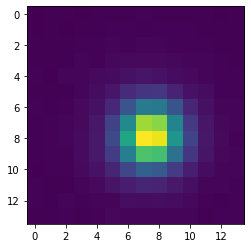

003437-u5-0300(80.19230651855469,916.7307739257812)


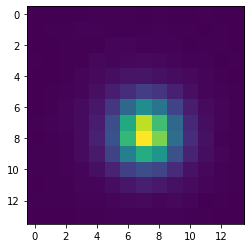

003437-u5-0300(727.3571166992188,1093.642822265625)


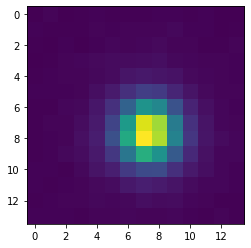

003437-u5-0300(1942.1666259765625,953.5)


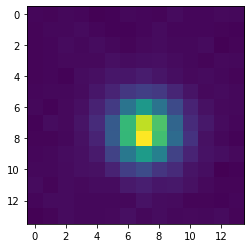

003437-u5-0300(1893.5,709.5)


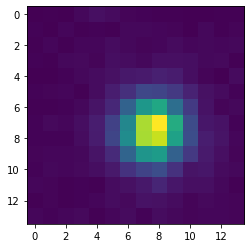

003437-u5-0300(1215.0,921.3333129882812)


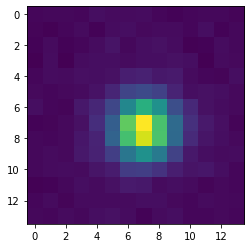

003437-u5-0300(124.5,564.5)


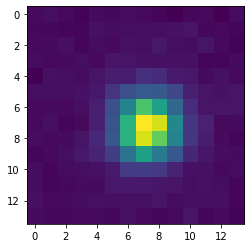

003437-u5-0300(167.75,1028.0)


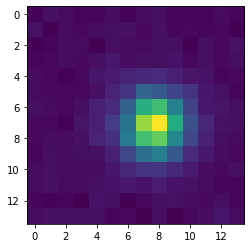

003437-u5-0300(1893.5,1363.0)


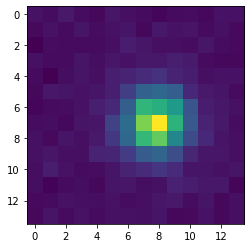

003437-u5-0300(1967.5,177.5)


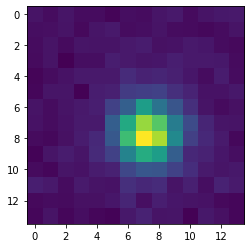

002887-u3-0234(1638.6666259765625,117.55555725097656)


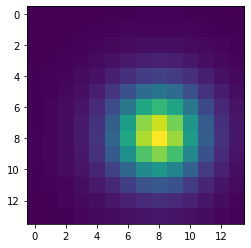

002887-u3-0234(989.5499877929688,1378.4200439453125)


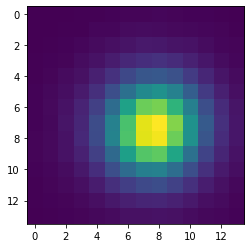

002887-u3-0234(427.0,671.5)


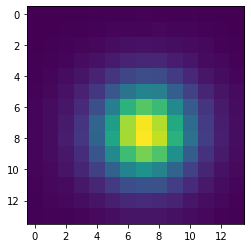

002887-u3-0234(1662.0,656.5)


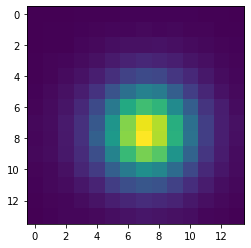

002887-u3-0234(1328.0833740234375,986.7777709960938)


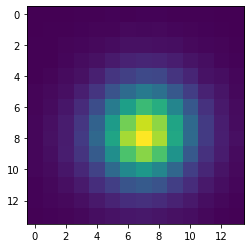

002887-u3-0234(877.3478393554688,98.73912811279295)


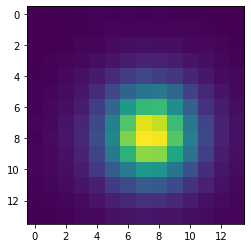

002887-u3-0234(308.5,84.5)


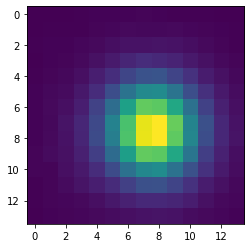

002887-u3-0234(786.1666870117188,781.5)


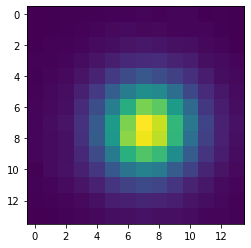

002887-u3-0234(1695.3636474609375,1193.272705078125)


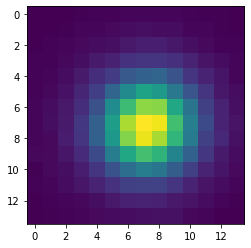

002887-u3-0234(977.6666870117188,303.6666564941406)


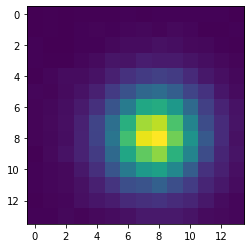

002887-u3-0234(806.5,900.0999755859375)


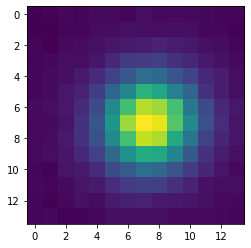

002887-u3-0234(185.03846740722656,161.73077392578125)


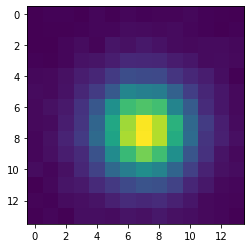

002887-u3-0234(994.2777709960938,884.5555419921875)


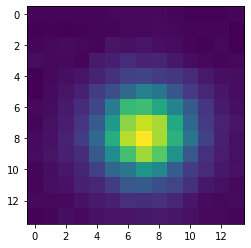

002887-u3-0234(1298.5,829.0)


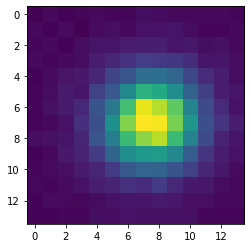

002887-u3-0234(1200.0,763.2000122070312)


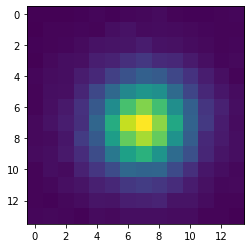

002887-u3-0234(1391.2142333984375,1002.7857055664062)


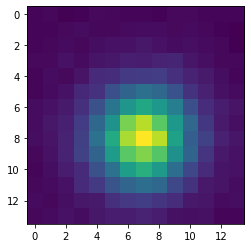

002887-u3-0234(1131.0,957.0)


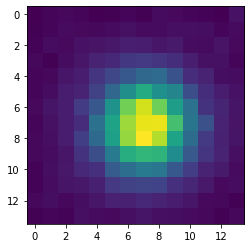

002887-u3-0234(1889.0,347.0)


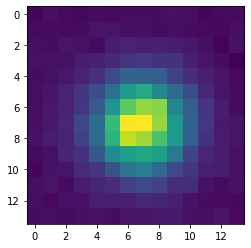

002887-u3-0234(1691.0,392.75)


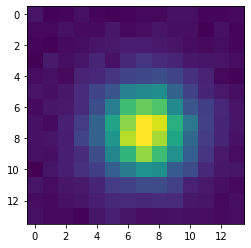

002887-u3-0234(735.5,1216.0)


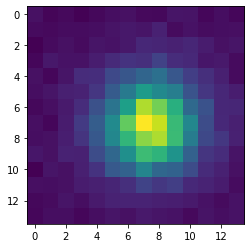

002887-u3-0234(1850.5,382.5)


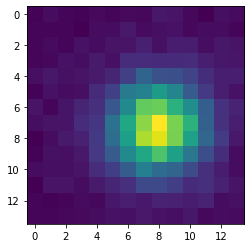

005847-u2-0753(590.0,335.5)


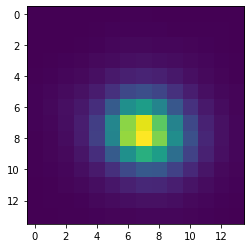

005847-u2-0753(1652.0,968.5)


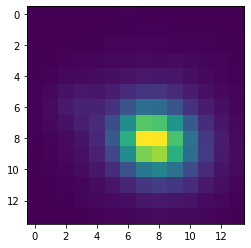

005847-u2-0753(1838.6666259765625,438.0)


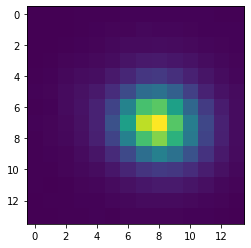

005847-u2-0753(1256.9166259765625,1232.77783203125)


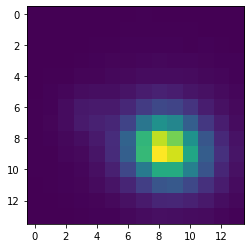

005847-u2-0753(530.3571166992189,1387.9285888671875)


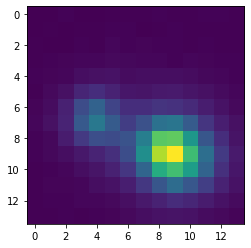

005847-u2-0753(1715.642822265625,912.6428833007812)


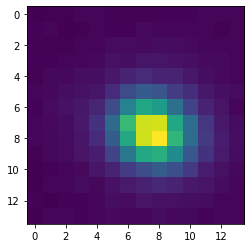

005847-u2-0753(379.5,526.0)


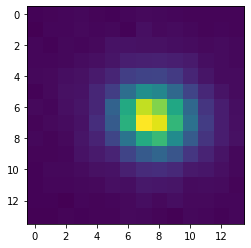

005847-u2-0753(321.0,1054.0)


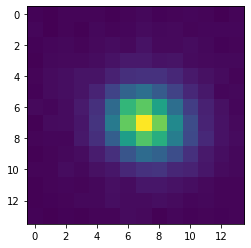

005847-u2-0753(323.5,604.5)


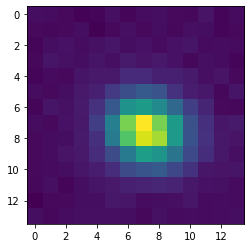

005847-u2-0753(1302.0,1458.75)


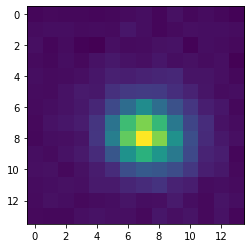

005847-u2-0753(1083.75,1347.0)


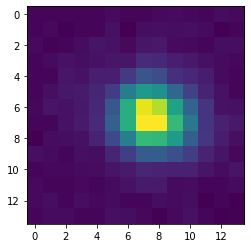

005847-u2-0753(1321.0,1454.0)


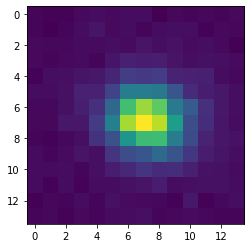

006618-u3-0164(136.08824157714844,1429.61767578125)


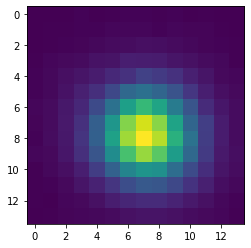

006618-u3-0164(307.5,1235.5)


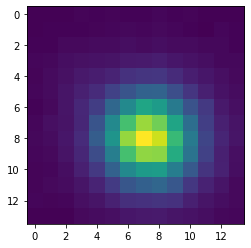

006618-u3-0164(1146.560546875,305.3484802246094)


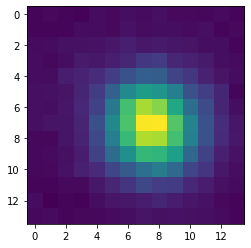

006618-u3-0164(1973.4285888671875,874.0)


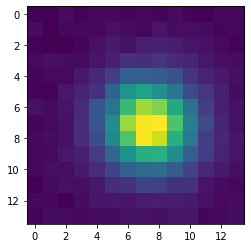

006618-u3-0164(1863.5,511.25)


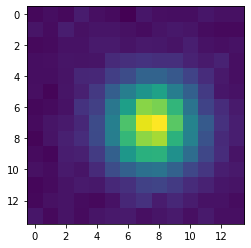

006618-u3-0164(1265.625,1359.0)


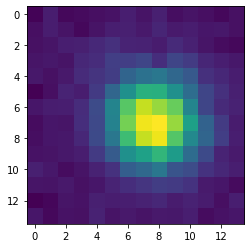

006618-u3-0164(1490.699951171875,526.7000122070311)


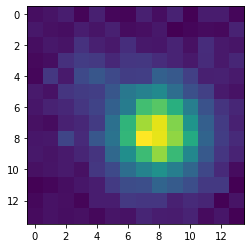

006618-u3-0164(969.0,723.0)


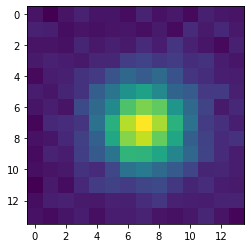

006618-u3-0164(1546.5,784.5)


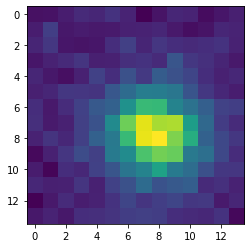

002589-u2-0100(1759.34619140625,936.576904296875)


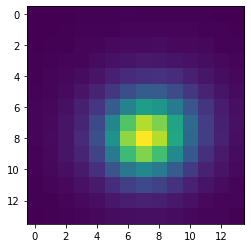

002589-u2-0100(1764.1666259765625,241.8333282470703)


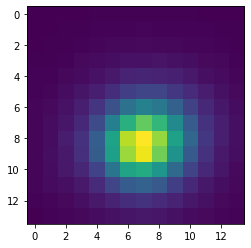

002589-u2-0100(1032.5,385.0)


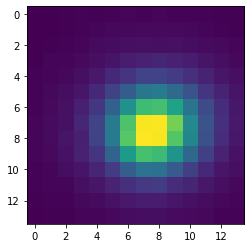

002589-u2-0100(659.0,399.5)


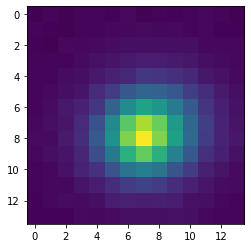

002589-u2-0100(1980.0,986.0)


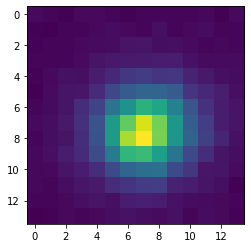

002589-u2-0100(1025.5,429.0)


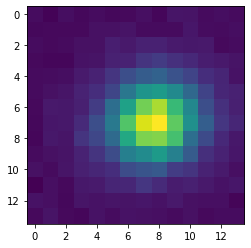

002589-u2-0100(1358.5,409.5)


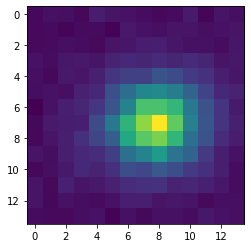

003438-u2-0124(582.576904296875,513.5)


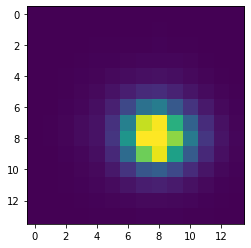

003438-u2-0124(226.0833282470703,68.5)


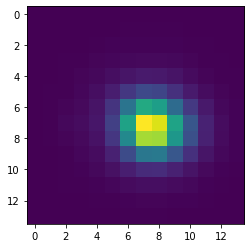

003438-u2-0124(1644.5,1147.5)


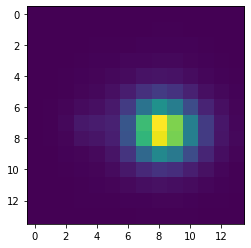

003438-u2-0124(1831.199951171875,616.0)


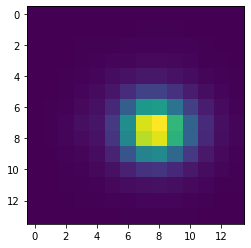

003438-u2-0124(1249.1500244140625,1412.0)


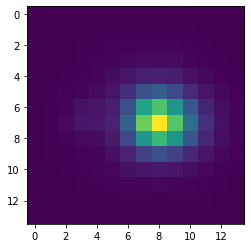

003438-u2-0124(1702.0,129.875)


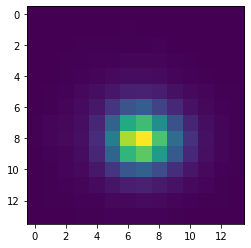

003438-u2-0124(1708.1842041015625,1090.605224609375)


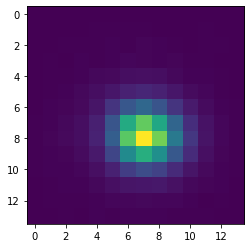

003438-u2-0124(372.0,704.0)


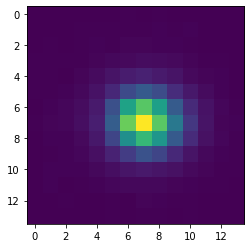

003438-u2-0124(314.0,1232.0)


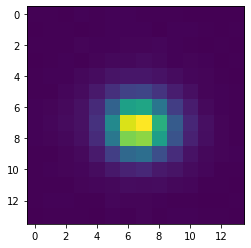

003438-u2-0124(86.0,9.0)


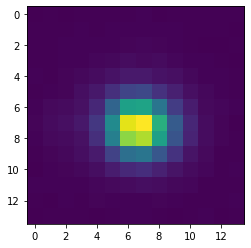

003438-u2-0124(315.78570556640625,782.7857055664062)


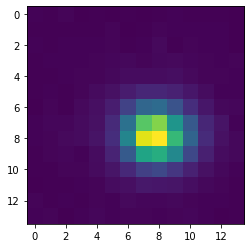

003438-u2-0124(748.5,912.8333129882812)


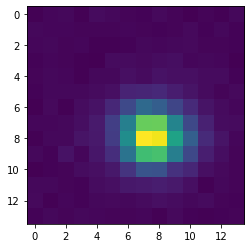

003438-u2-0124(1184.3333740234375,638.0)


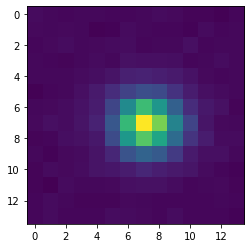

003438-u2-0124(2009.5,388.5)


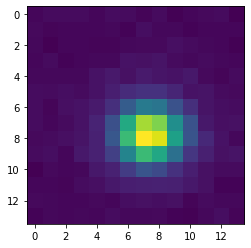

003438-u2-0124(1895.0,189.5)


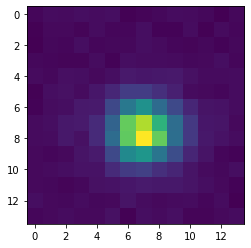

003438-u2-0124(1804.5,141.0)


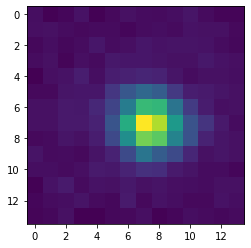

003438-u2-0124(1.5,1060.5)


/home/zouzq/.local/lib/python3.6/site-packages/ipykernel_launcher.py:20: UserWarning: Attempting to set identical left == right == -0.5 results in singular transformations; automatically expanding.


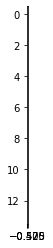

003438-u2-0124(1007.5,178.5)


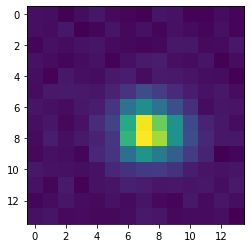

003438-u2-0124(1989.0,566.5)


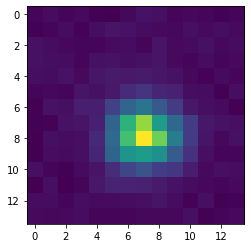

003438-u2-0124(371.5,448.0)


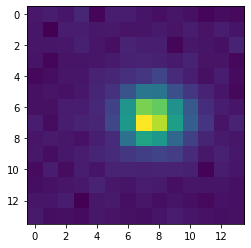

005318-u6-0073(428.39190673828125,432.6351318359375)


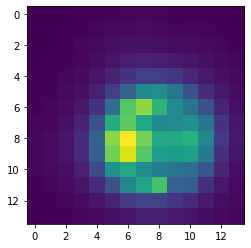

005318-u6-0073(970.3181762695312,1303.6817626953125)


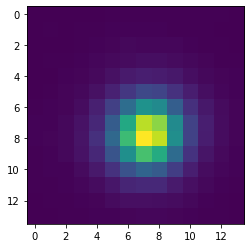

005318-u6-0073(481.0555419921875,207.27777099609372)


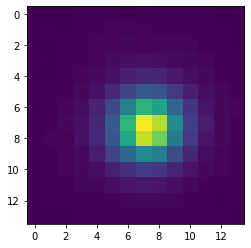

005318-u6-0073(662.9285888671875,824.0714111328125)


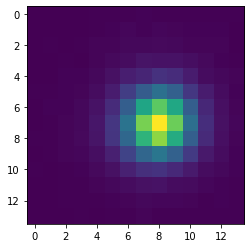

005318-u6-0073(28.78571510314941,254.7857208251953)


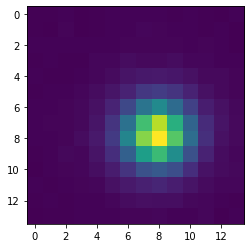

005318-u6-0073(597.0,618.0)


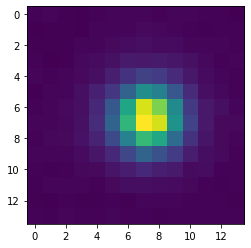

005318-u6-0073(1069.75,213.25)


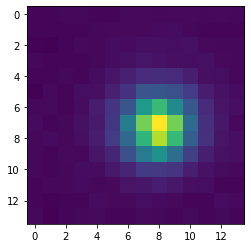

005318-u6-0073(2019.0,1332.0)


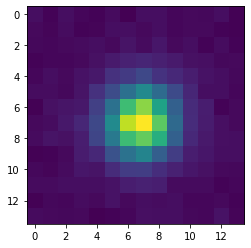

005318-u6-0073(57.0,673.0)


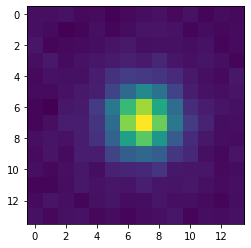

005318-u6-0073(603.0,659.5)


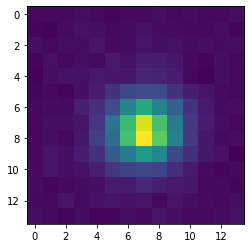

005318-u6-0073(340.0,620.0)


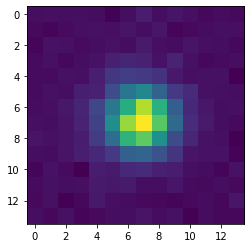

005318-u6-0073(1466.0,561.0)


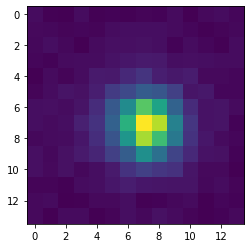

005895-u1-0663(936.0,1057.5)


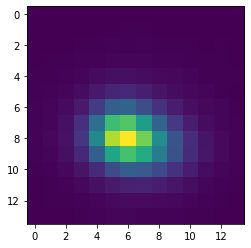

005895-u1-0663(568.5,908.0)


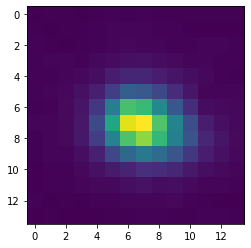

005895-u1-0663(1039.0,962.0)


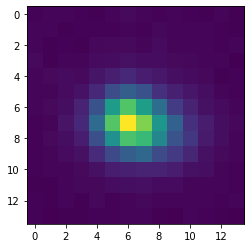

005895-u1-0663(1118.5,1088.5)


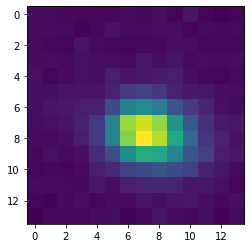

005895-u1-0663(872.0,1435.0)


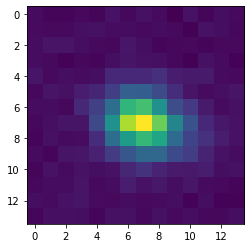

005895-u1-0663(705.5,381.0)


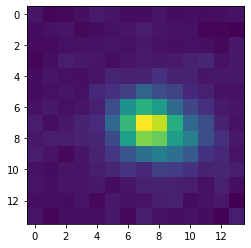

005895-u1-0663(760.0,992.5)


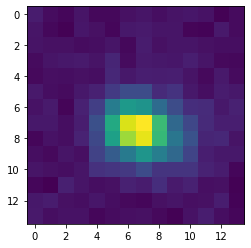

005895-u1-0663(279.0,486.0)


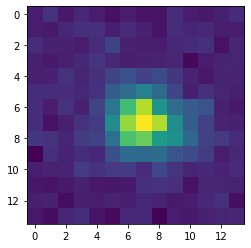

005895-u1-0663(1116.0,161.0)


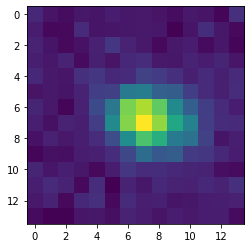

002826-u6-0203(839.9444580078125,635.6851806640625)


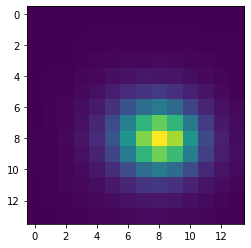

002826-u6-0203(553.5,1210.0)


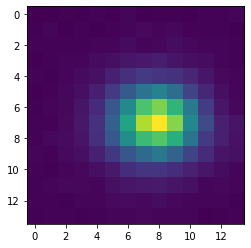

002826-u6-0203(951.4000244140624,1042.0)


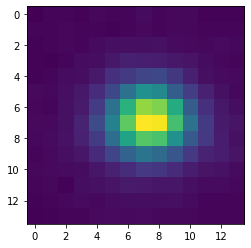

002826-u6-0203(1485.0,1413.0)


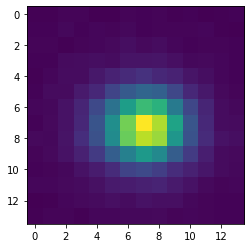

002826-u6-0203(1741.5,1108.0)


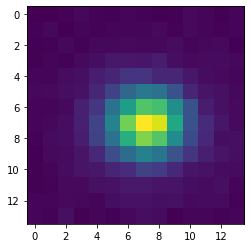

002826-u6-0203(149.5,743.0)


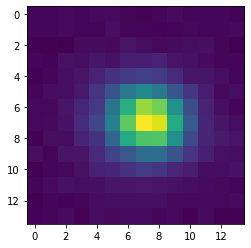

005622-u5-0173(1014.7352905273438,268.7352905273437)


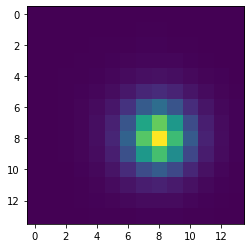

005622-u5-0173(1725.9310302734375,119.44827270507812)


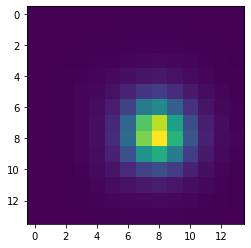

005622-u5-0173(2044.0,1345.0)


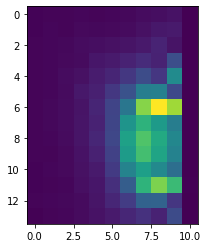

005622-u5-0173(644.38232421875,666.2647094726562)


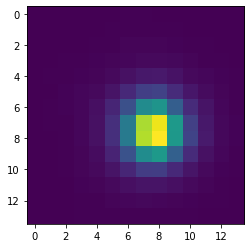

005622-u5-0173(1982.2646484375,472.7941284179688)


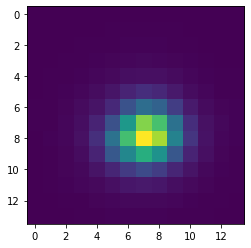

005622-u5-0173(361.7631530761719,867.131591796875)


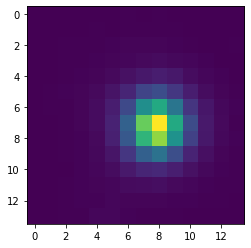

005622-u5-0173(1633.300048828125,358.70001220703125)


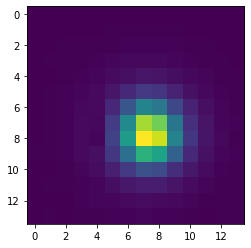

005622-u5-0173(966.65625,575.4375)


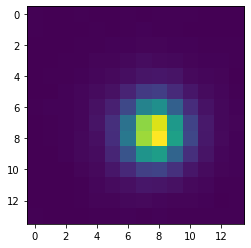

005622-u5-0173(391.5,937.5)


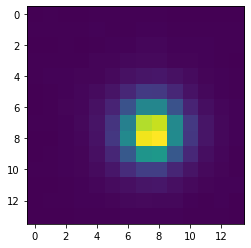

005622-u5-0173(736.0,595.2999877929688)


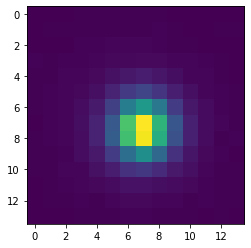

005622-u5-0173(604.25,799.125)


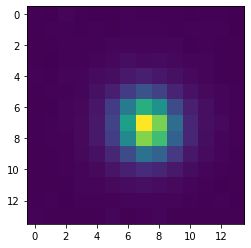

005622-u5-0173(173.5,707.0)


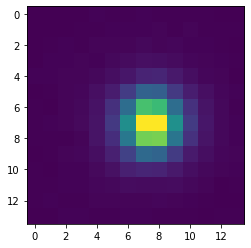

005622-u5-0173(1830.5,627.9000244140625)


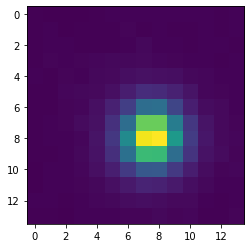

005622-u5-0173(1859.0,344.0)


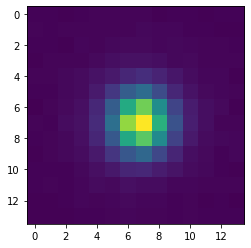

005622-u5-0173(1512.5,811.0)


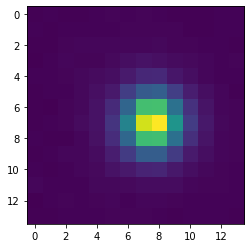

005622-u5-0173(827.3333129882812,1406.0)


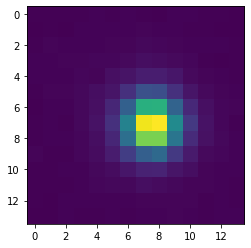

005622-u5-0173(2023.5,1061.5)


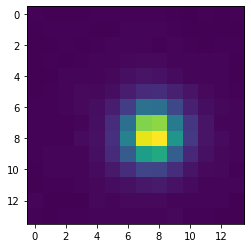

005622-u5-0173(956.5,625.5)


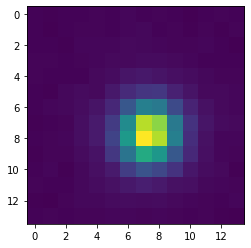

005622-u5-0173(1837.04541015625,768.9091186523438)


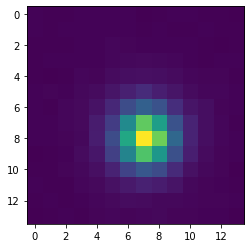

005622-u5-0173(729.5,1037.5)


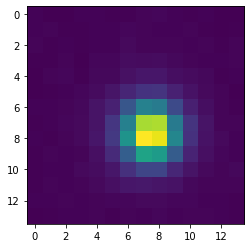

005622-u5-0173(605.5,947.5)


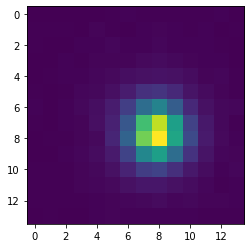

005622-u5-0173(420.5526428222656,407.7105407714844)


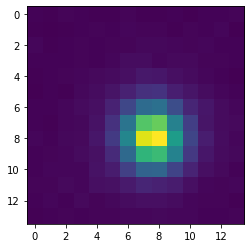

005622-u5-0173(1071.0,1251.5)


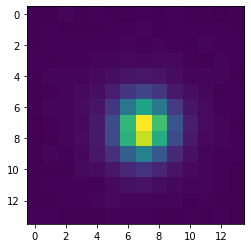

005622-u5-0173(301.4444580078125,788.7222290039062)


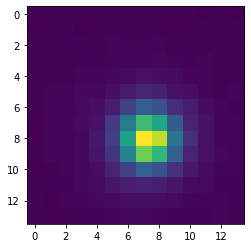

005622-u5-0173(1812.5,191.5)


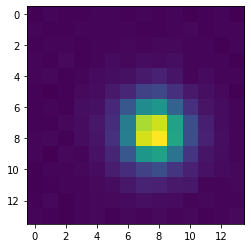

005622-u5-0173(1872.0,811.0)


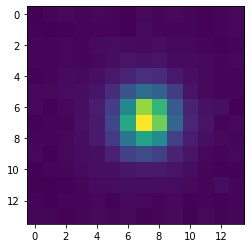

005622-u5-0173(577.7000122070312,764.2999877929688)


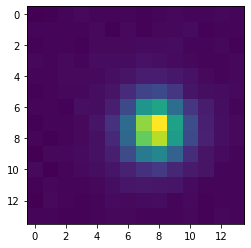

005622-u5-0173(9.300000190734863,409.70001220703125)


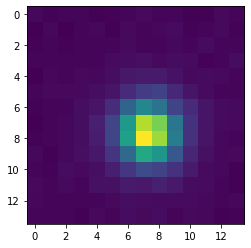

005622-u5-0173(1146.0,344.0)


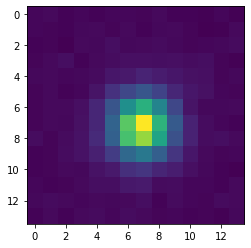

005622-u5-0173(1063.0,1051.0)


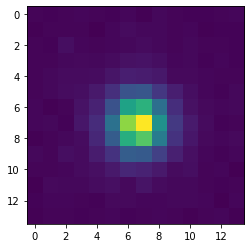

005622-u5-0173(1583.0,914.0)


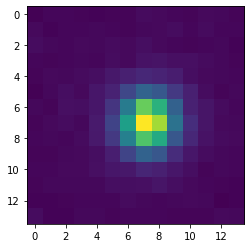

005622-u5-0173(255.0,1183.0)


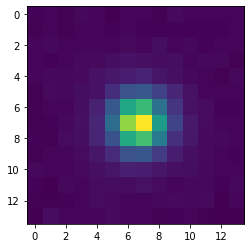

005622-u5-0173(1025.5,149.0)


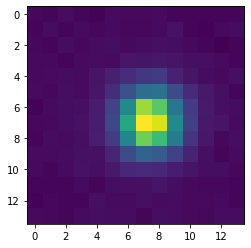

005622-u5-0173(1156.8333740234375,458.1666564941406)


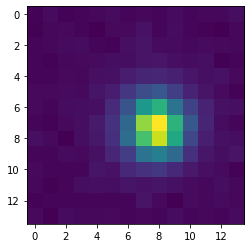

005622-u5-0173(1818.0,932.5)


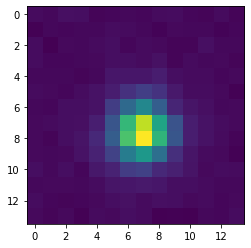

005622-u5-0173(276.5,581.0)


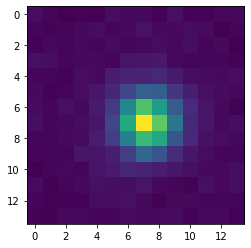

005622-u5-0173(869.5,1169.5)


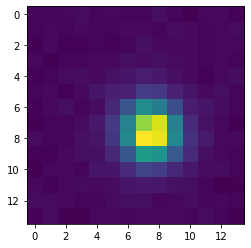

005622-u5-0173(1839.300048828125,254.6999969482422)


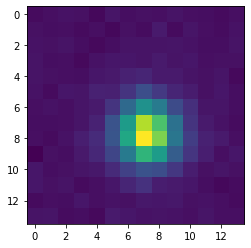

005622-u5-0173(83.5,1310.5)


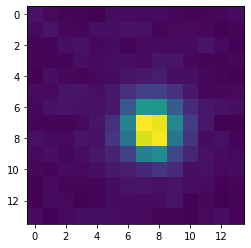

005622-u5-0173(2019.357177734375,1159.7857666015625)


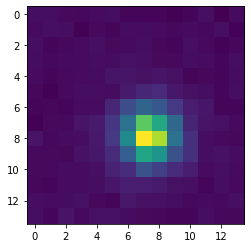

005622-u5-0173(202.5,527.5)


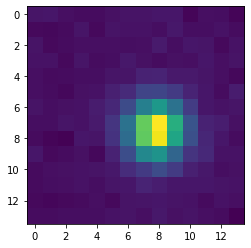

005622-u5-0173(524.0,420.6666564941406)


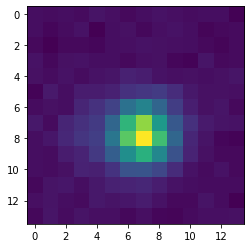

005622-u5-0173(856.0,134.33332824707028)


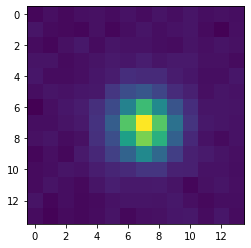

005622-u5-0173(334.5,547.5)


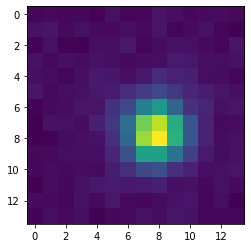

005622-u5-0173(1767.0,1341.0)


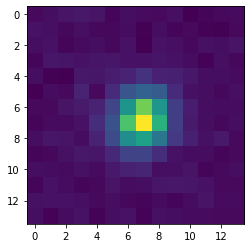

005622-u5-0173(780.0,1137.0)


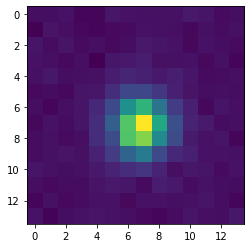

005622-u5-0173(562.0,873.0)


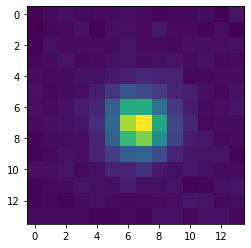

005622-u5-0173(168.0,738.0)


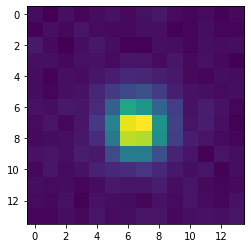

005622-u5-0173(525.25,1242.0)


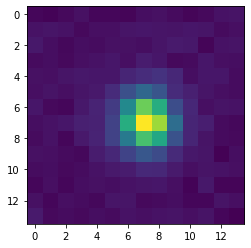

005622-u5-0173(520.75,725.0)


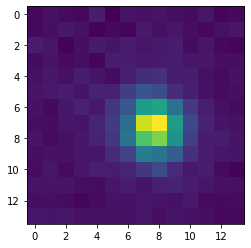

005622-u5-0173(1122.8333740234377,757.8333129882812)


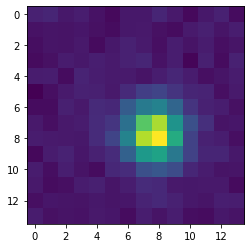

005622-u5-0173(703.0,1120.0)


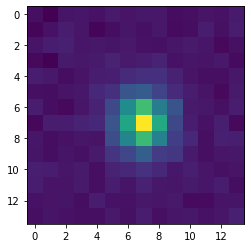

005622-u5-0173(437.0,369.5)


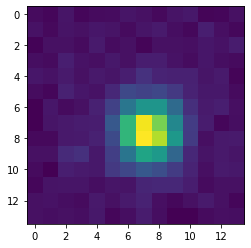

005622-u5-0173(303.0,1158.5)


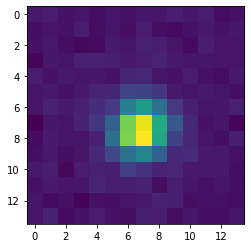

005622-u5-0173(1306.5,1457.5)


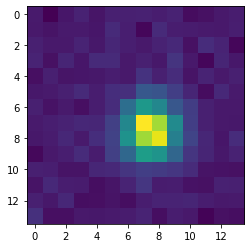

005622-u5-0173(1269.5,1433.5)


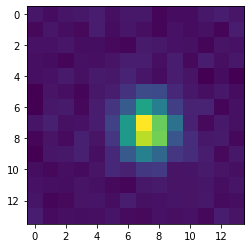

005622-u5-0173(1704.5,1266.5)


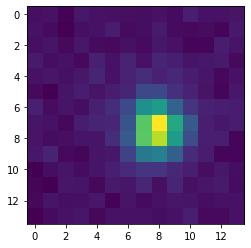

005622-u5-0173(1097.5,652.5)


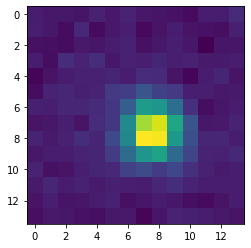

005622-u5-0173(314.5,614.5)


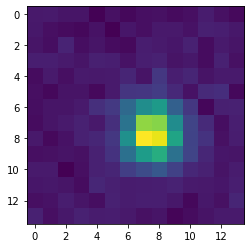

005622-u5-0173(1743.5,10.5)


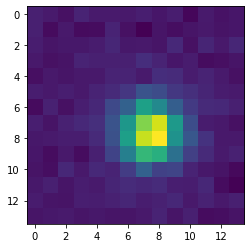

005622-u5-0173(663.5,1465.5)


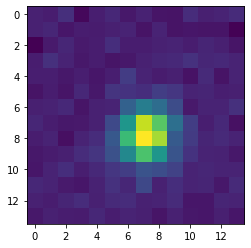

005622-u5-0173(319.5,1399.5)


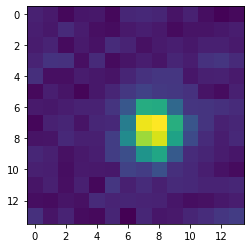

005622-u5-0173(1845.5,628.5)


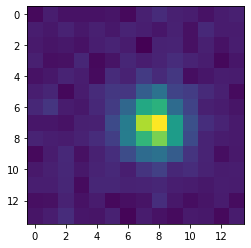

005622-u5-0173(1279.5,618.5)


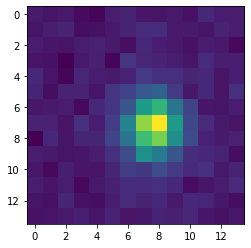

005622-u5-0173(1960.5,268.5)


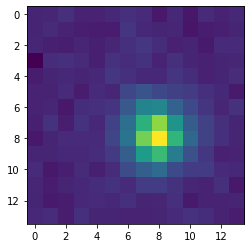

005622-u5-0173(1188.5,45.5)


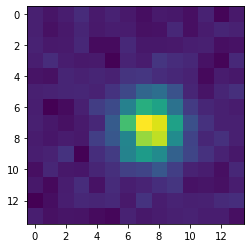

005622-u5-0173(460.5,1488.0)


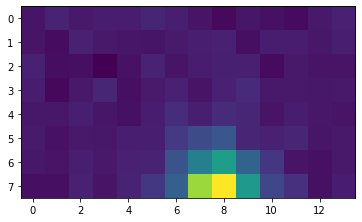

005622-u5-0173(1445.0,1457.0)


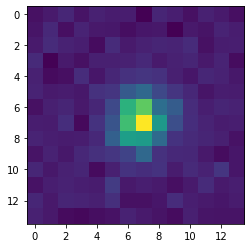

005622-u5-0173(501.0,1312.5)


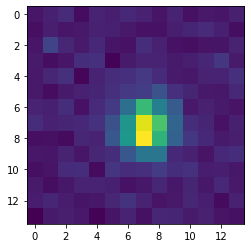

005622-u5-0173(1159.0,1282.5)


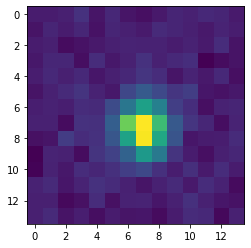

005622-u5-0173(726.0,1159.5)


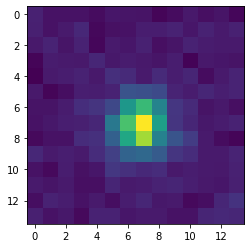

005622-u5-0173(743.0,1123.0)


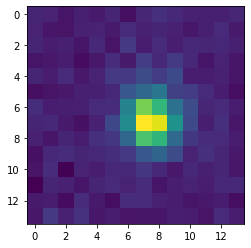

005622-u5-0173(1856.0,594.0)


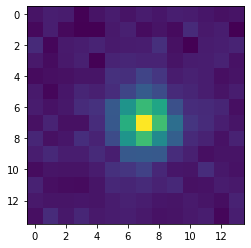

005622-u5-0173(507.5,183.0)


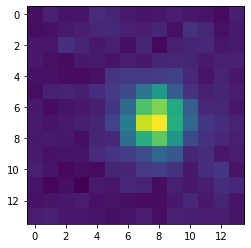

001140-u3-0017(1334.0,394.20001220703125)


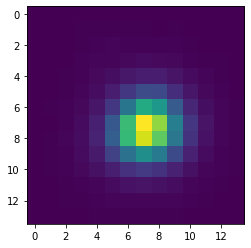

001140-u3-0017(1741.5,414.0)


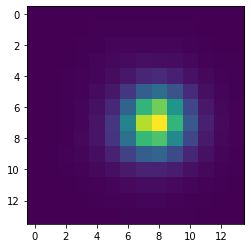

001140-u3-0017(298.1956481933594,1342.934814453125)


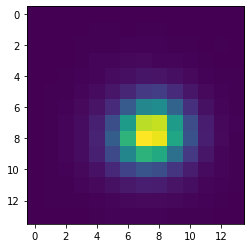

001140-u3-0017(1290.5,1145.5)


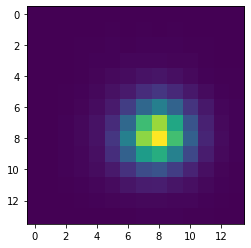

001140-u3-0017(483.3333435058594,284.3333435058594)


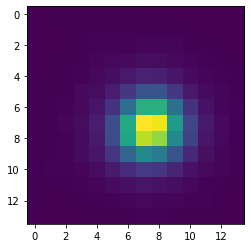

001140-u3-0017(796.0516967773438,230.7413787841797)


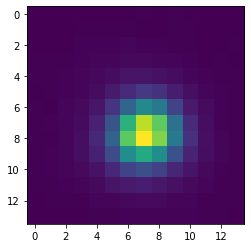

001140-u3-0017(54.5,317.5)


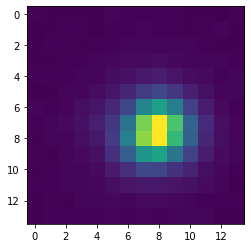

001140-u3-0017(956.5,845.1666870117188)


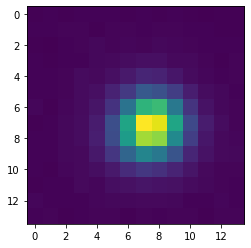

001140-u3-0017(1313.2142333984375,11.214285850524902)


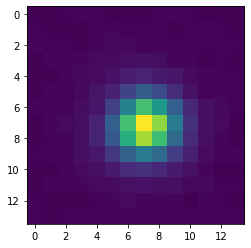

001140-u3-0017(1459.699951171875,502.70001220703125)


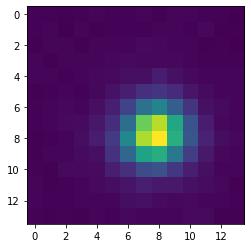

001140-u3-0017(570.0,575.5)


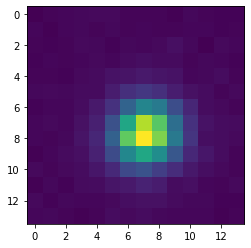

001140-u3-0017(845.5,906.8333129882812)


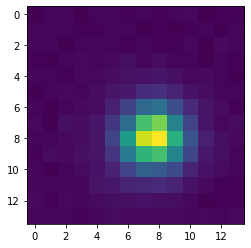

001140-u3-0017(1270.699951171875,816.2999877929688)


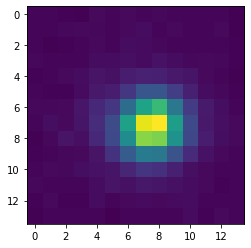

001140-u3-0017(1161.699951171875,19.299999237060547)


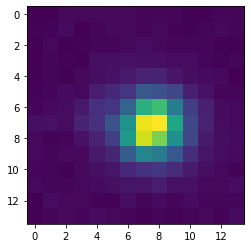

001140-u3-0017(205.3333282470703,943.0)


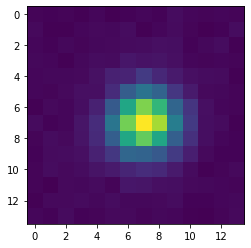

001140-u3-0017(77.0,1103.0)


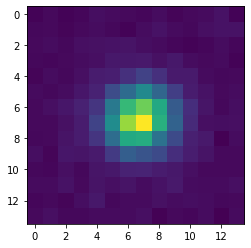

001140-u3-0017(1784.8333740234375,81.16666412353516)


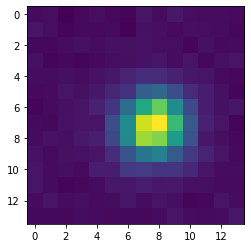

001140-u3-0017(1819.0,642.0)


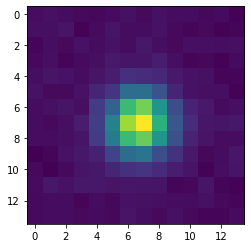

001140-u3-0017(1877.0,3.5)


/home/zouzq/.local/lib/python3.6/site-packages/ipykernel_launcher.py:20: UserWarning: Attempting to set identical bottom == top == -0.5 results in singular transformations; automatically expanding.


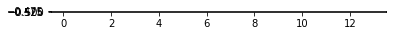

002206-u1-0198(1729.0,710.7916870117188)


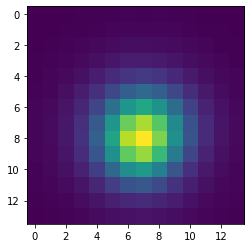

002206-u1-0198(1655.5316162109375,883.3291015625)


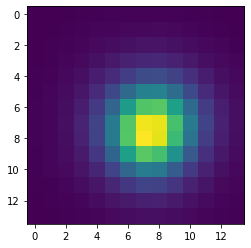

002206-u1-0198(1847.61767578125,1261.38232421875)


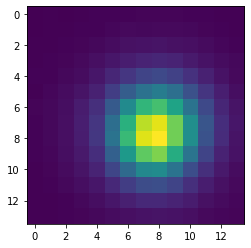

002206-u1-0198(560.7307739257811,374.8846130371094)


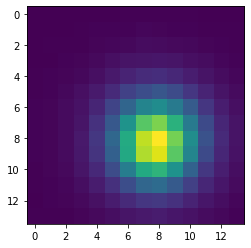

002206-u1-0198(255.5,799.5)


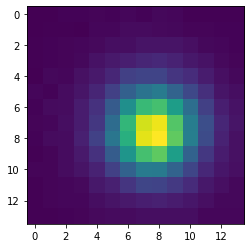

002206-u1-0198(547.54345703125,74.8043441772461)


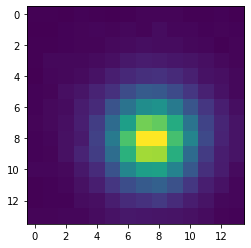

002206-u1-0198(291.72222900390625,148.94444274902344)


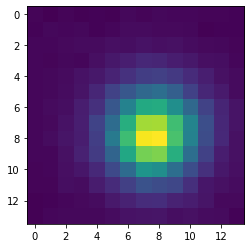

002206-u1-0198(662.0714111328125,1040.642822265625)


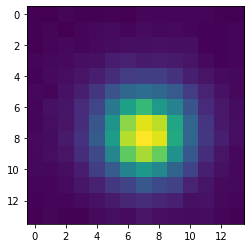

002206-u1-0198(1478.605224609375,168.1842041015625)


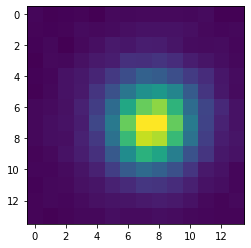

002206-u1-0198(654.5,370.5)


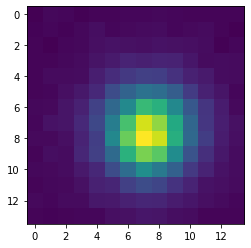

002206-u1-0198(1952.5,6.5)


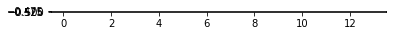

002206-u1-0198(1951.0,488.0)


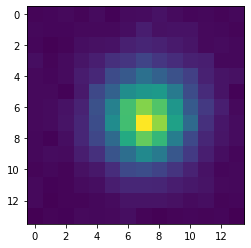

002206-u1-0198(1396.699951171875,388.2999877929688)


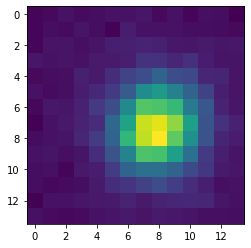

002206-u1-0198(1647.5,14.5)


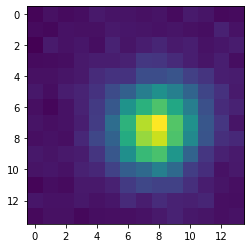

002206-u1-0198(1356.0,358.5)


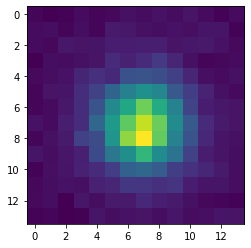

002206-u1-0198(1392.25,1174.0)


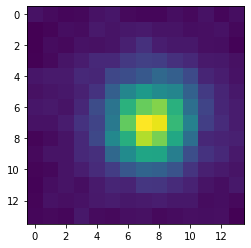

002206-u1-0198(514.0,247.0)


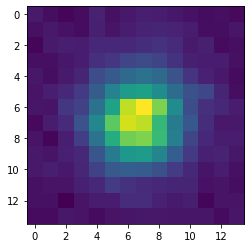

002206-u1-0198(118.0,984.5)


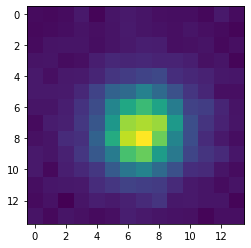

002206-u1-0198(632.5,956.5)


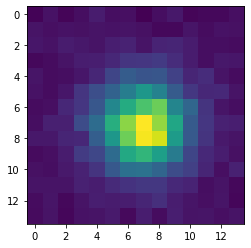

002206-u1-0198(227.5,179.5)


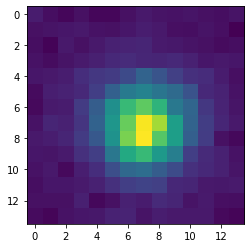

002206-u1-0198(1463.5,35.5)


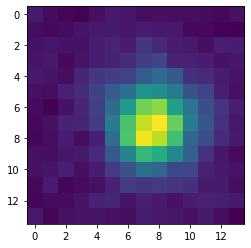

005754-u3-0747(1023.5,744.0)


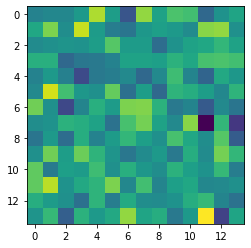

003628-u2-0130(934.9117431640624,1045.63232421875)


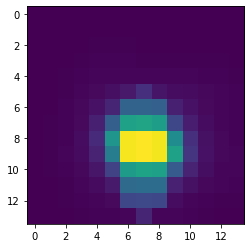

003628-u2-0130(2039.9915771484373,1177.0423583984375)


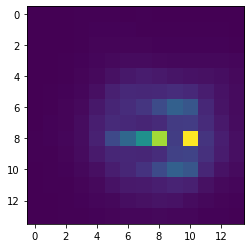

003628-u2-0130(2018.5704345703125,1382.542236328125)


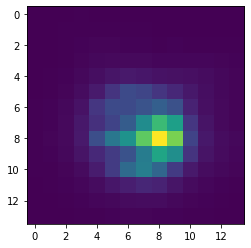

003628-u2-0130(367.0,589.5999755859375)


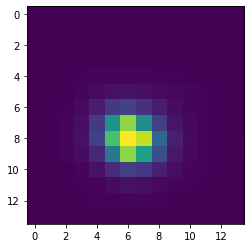

003628-u2-0130(220.5,472.5)


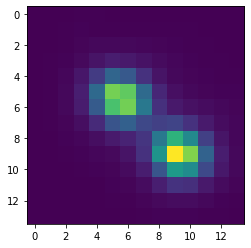

003628-u2-0130(1860.5,485.5)


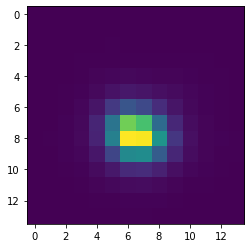

003628-u2-0130(548.3333129882811,661.0)


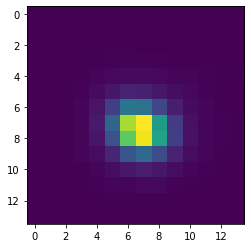

003628-u2-0130(1380.375,1130.5)


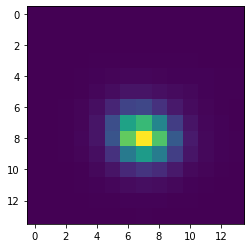

003628-u2-0130(827.5,1156.300048828125)


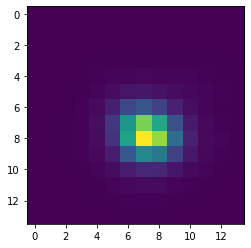

003628-u2-0130(61.44444274902344,888.388916015625)


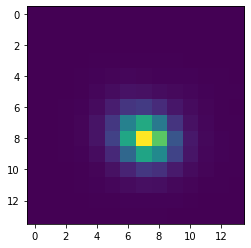

003628-u2-0130(895.0,944.0)


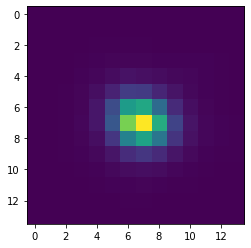

003628-u2-0130(145.625,305.5)


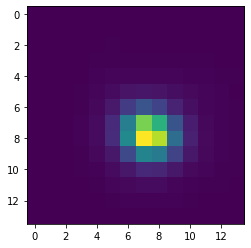

003628-u2-0130(1499.625,1441.5)


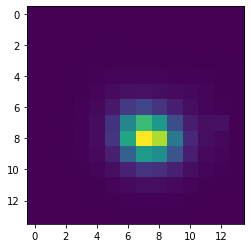

003628-u2-0130(388.8529357910156,323.6764831542969)


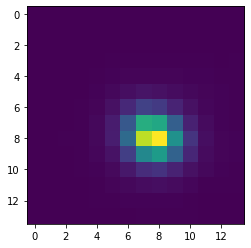

003628-u2-0130(1809.2857666015625,1421.0)


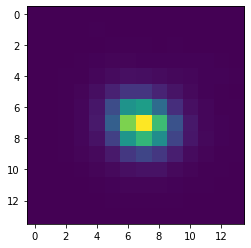

003628-u2-0130(2020.0,77.0)


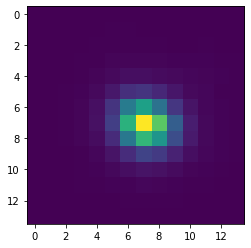

003628-u2-0130(48.0,288.0)


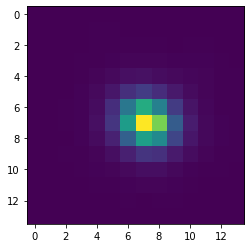

003628-u2-0130(1207.0,16.0)


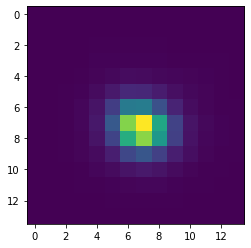

003628-u2-0130(1865.0999755859373,549.5)


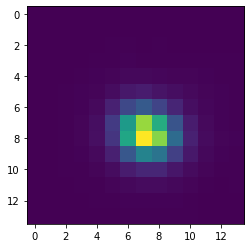

003628-u2-0130(1192.72216796875,1406.7962646484375)


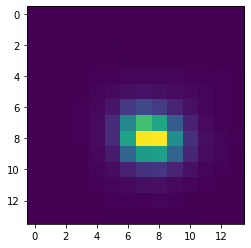

003628-u2-0130(1643.0,483.0)


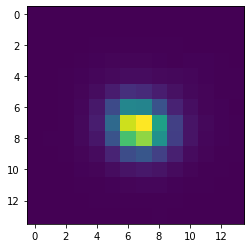

003628-u2-0130(488.5,400.5)


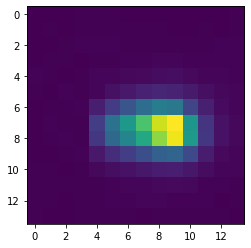

003628-u2-0130(1918.5,1041.5)


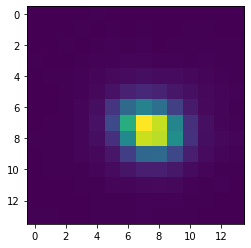

003628-u2-0130(310.5,326.0)


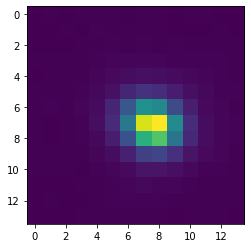

003628-u2-0130(314.5,307.0)


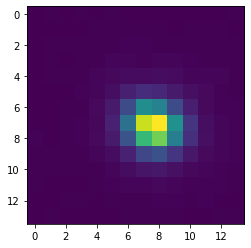

003628-u2-0130(1453.1666259765625,117.83333587646484)


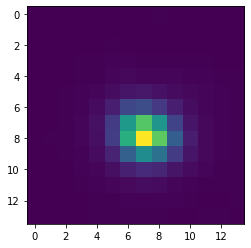

003628-u2-0130(1198.5,1078.0)


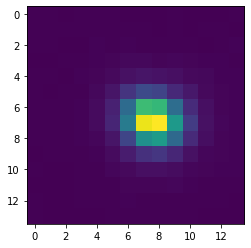

003628-u2-0130(716.1666870117188,806.8333129882812)


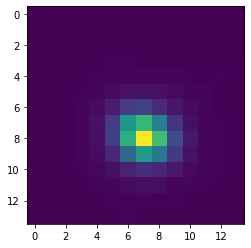

003628-u2-0130(943.1666870117188,1188.8333740234375)


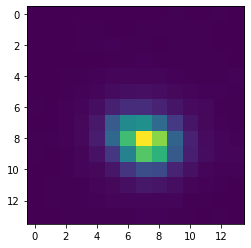

003628-u2-0130(1015.1666870117188,856.8333129882812)


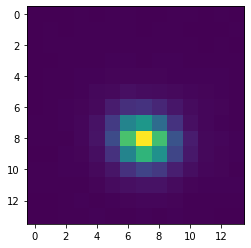

003628-u2-0130(667.2777709960938,783.5555419921875)


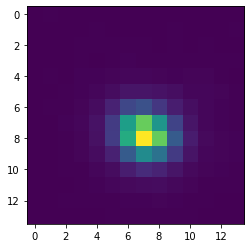

003628-u2-0130(1451.5,642.0)


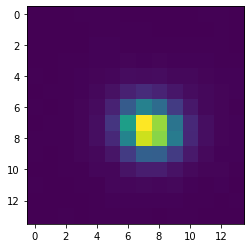

003628-u2-0130(2022.5,840.5)


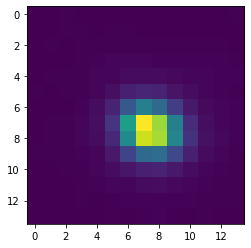

003628-u2-0130(739.7857055664062,979.7857055664062)


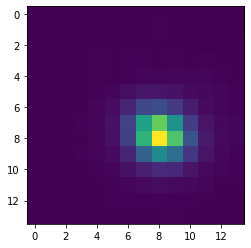

003628-u2-0130(1927.2142333984373,945.2142944335938)


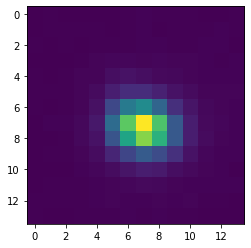

003628-u2-0130(735.0,1274.0)


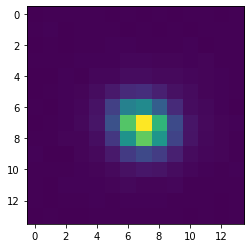

003628-u2-0130(180.5,1225.0)


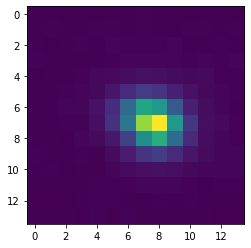

003628-u2-0130(1451.0,247.5)


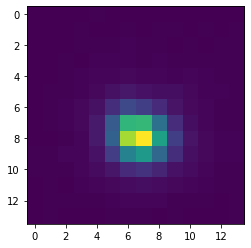

003628-u2-0130(1718.0,1401.5)


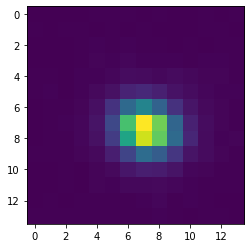

003628-u2-0130(1476.0,805.5)


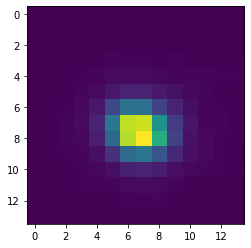

003628-u2-0130(1417.0,1279.5)


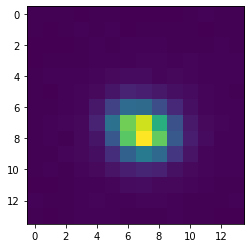

003628-u2-0130(1448.0,1215.0)


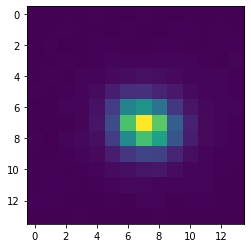

003628-u2-0130(1301.75,261.5)


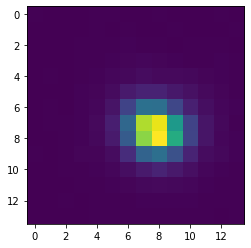

003628-u2-0130(1899.0,1393.0)


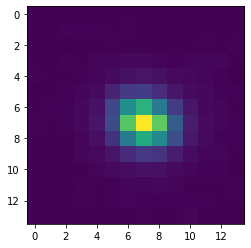

003628-u2-0130(1784.0,791.0)


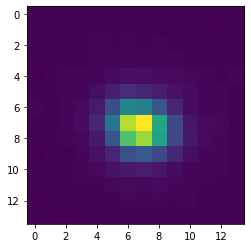

003628-u2-0130(1152.0,758.0)


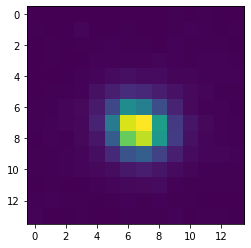

003628-u2-0130(1670.0,520.0)


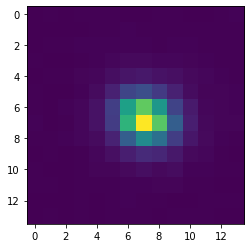

003628-u2-0130(1430.0,96.0)


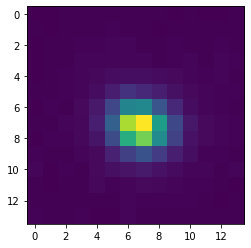

003628-u2-0130(1216.0,1358.5)


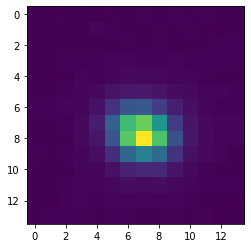

003628-u2-0130(71.0,979.5)


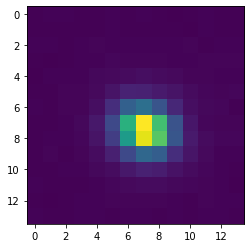

003628-u2-0130(491.0,821.5)


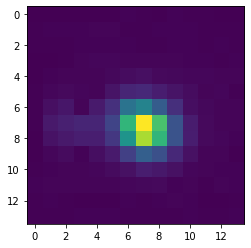

003628-u2-0130(143.0,767.0)


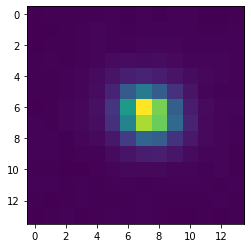

003628-u2-0130(1498.0,891.5)


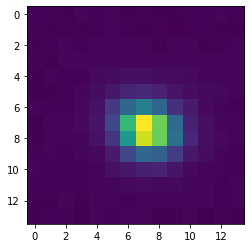

003628-u2-0130(1754.1363525390625,537.0454711914061)


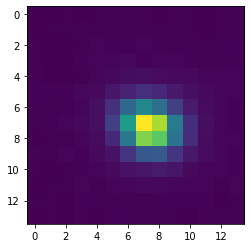

003628-u2-0130(790.1363525390625,339.0454406738281)


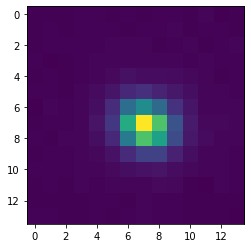

003628-u2-0130(1361.5,376.5)


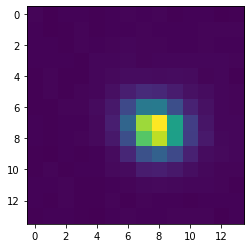

003628-u2-0130(1403.875,1177.0)


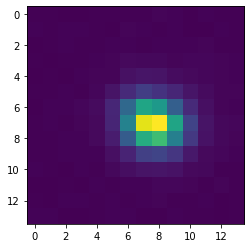

003628-u2-0130(394.5,943.5)


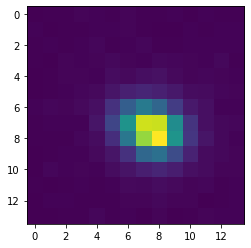

003628-u2-0130(101.0,228.5)


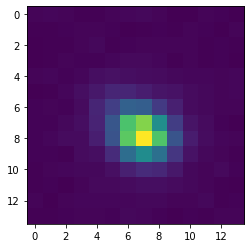

003628-u2-0130(1160.5,976.5)


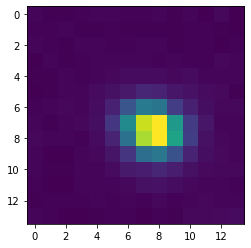

003628-u2-0130(1077.357177734375,192.2142791748047)


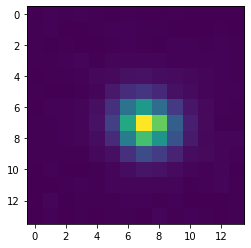

003628-u2-0130(1825.5,1386.0)


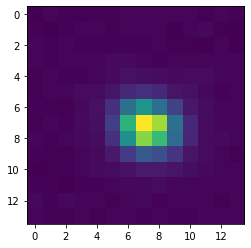

003628-u2-0130(686.5,1138.0)


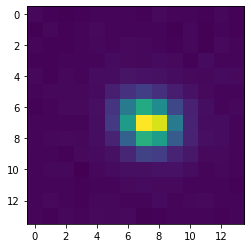

003628-u2-0130(628.5,617.0)


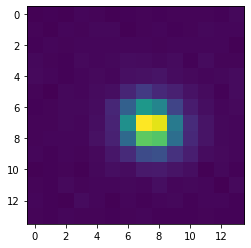

003628-u2-0130(2034.5,558.0)


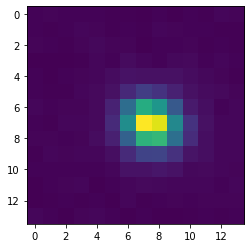

003628-u2-0130(703.5,512.5)


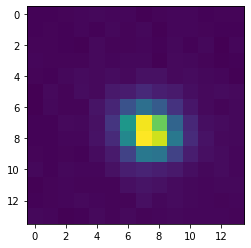

003628-u2-0130(88.5,997.5)


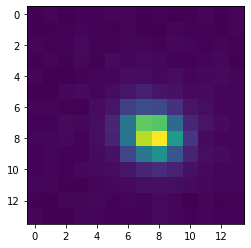

003628-u2-0130(365.3333435058594,521.0)


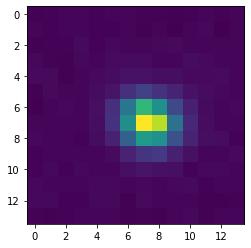

003628-u2-0130(32.66666793823242,448.0)


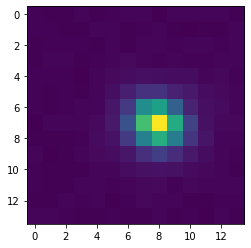

003628-u2-0130(1505.5,278.0)


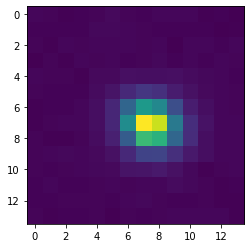

003628-u2-0130(1419.5,383.5)


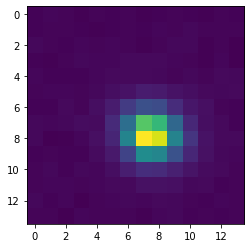

003628-u2-0130(1528.5,345.5)


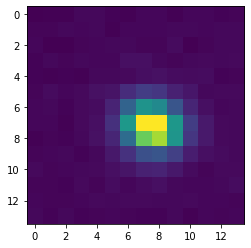

003628-u2-0130(1791.5,247.5)


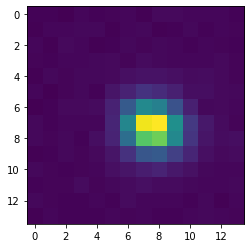

003628-u2-0130(250.5,1432.0)


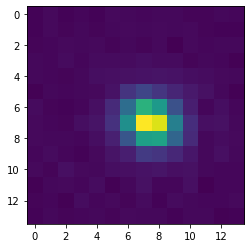

003628-u2-0130(1526.0,980.0)


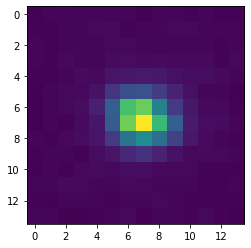

003628-u2-0130(1581.5,713.5)


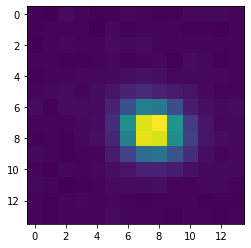

003628-u2-0130(793.0,680.0)


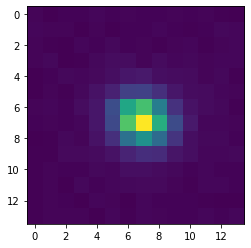

003628-u2-0130(624.0,536.0)


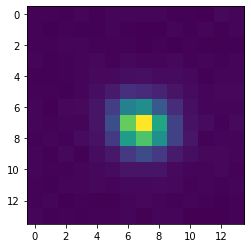

003628-u2-0130(591.0,1416.0)


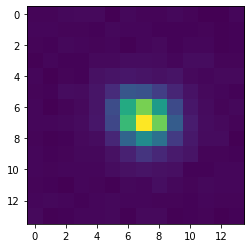

003628-u2-0130(1616.5,1355.5)


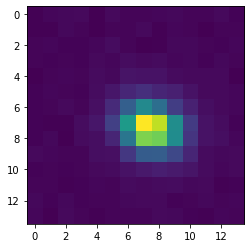

003628-u2-0130(778.0,1338.0)


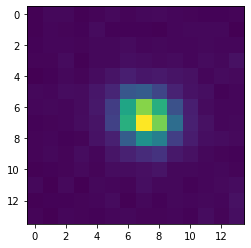

003628-u2-0130(478.0,1178.0)


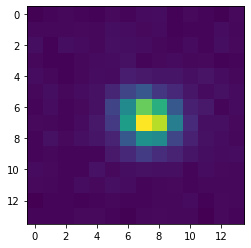

003628-u2-0130(1623.0,869.0)


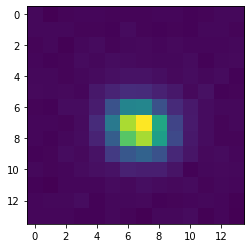

003628-u2-0130(338.0,982.75)


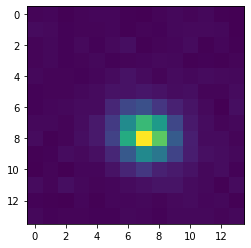

003628-u2-0130(346.75,864.0)


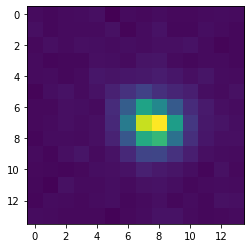

003628-u2-0130(1578.0,848.75)


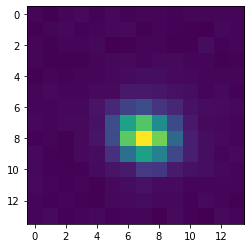

003628-u2-0130(1298.0,826.75)


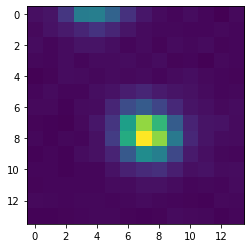

003628-u2-0130(678.0,718.0)


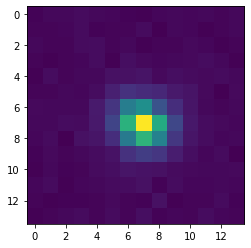

003628-u2-0130(1713.0,495.25)


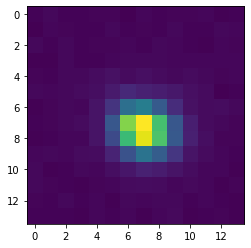

003628-u2-0130(936.75,407.0)


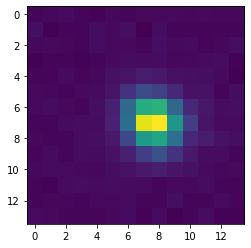

003628-u2-0130(98.75,340.0)


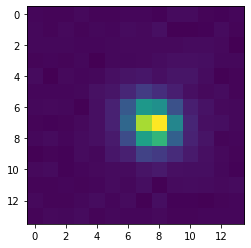

003628-u2-0130(338.0,281.25)


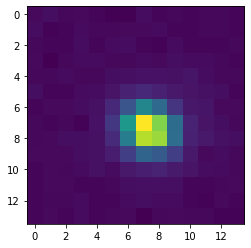

003628-u2-0130(157.0,243.75)


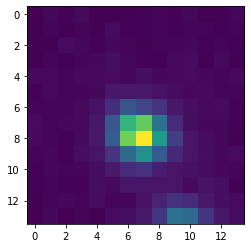

003628-u2-0130(41.0,221.25)


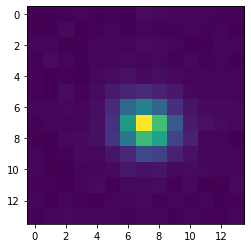

003628-u2-0130(992.1666870117188,907.1666870117188)


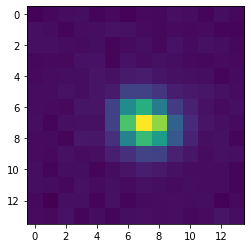

003628-u2-0130(1294.5,817.5)


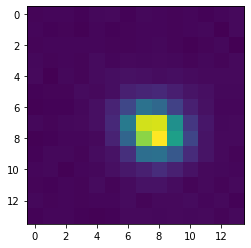

003628-u2-0130(1347.0,1460.5)


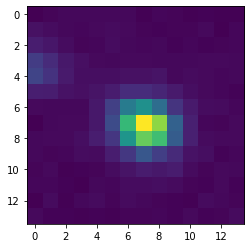

003628-u2-0130(491.0,1444.5)


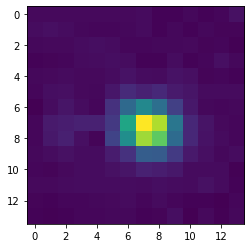

003628-u2-0130(1146.0,1441.5)


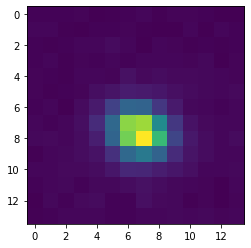

003628-u2-0130(1409.0,958.5)


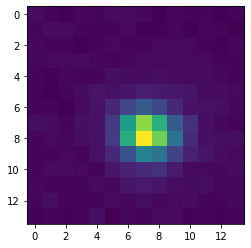

003628-u2-0130(1969.0,730.5)


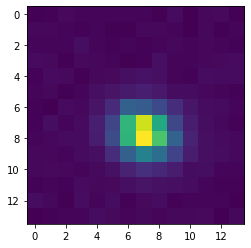

003628-u2-0130(26.0,644.5)


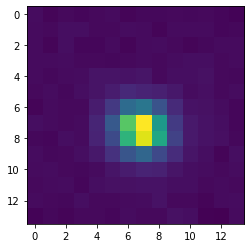

003628-u2-0130(35.0,556.5)


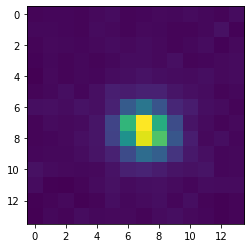

003628-u2-0130(80.0,539.5)


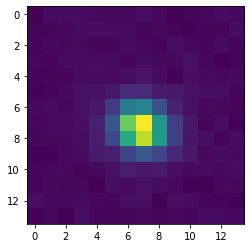

003628-u2-0130(1645.0,358.0)


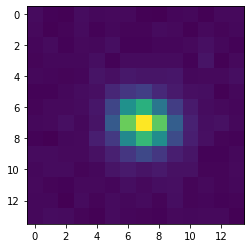

003628-u2-0130(1012.0,1472.5)


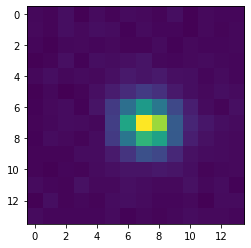

003628-u2-0130(977.0,1363.5)


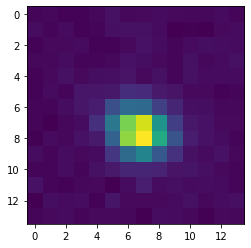

003628-u2-0130(216.0,1072.5)


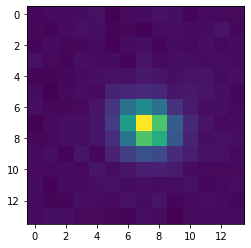

003628-u2-0130(1186.0,1059.5)


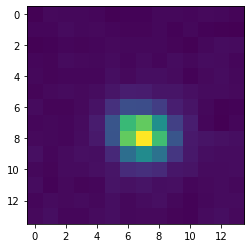

003628-u2-0130(352.0,558.5)


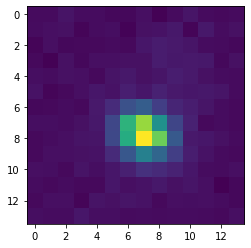

003628-u2-0130(941.0,480.5)


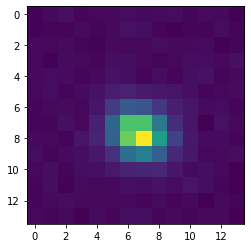

003628-u2-0130(949.5,405.0)


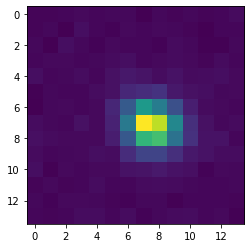

003628-u2-0130(68.0,288.5)


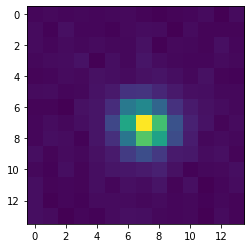

003628-u2-0130(2011.0,197.5)


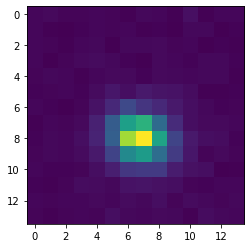

003628-u2-0130(568.0,95.5)


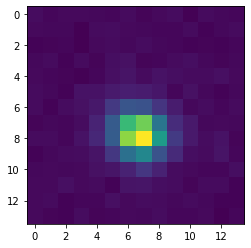

003628-u2-0130(932.5,1218.5)


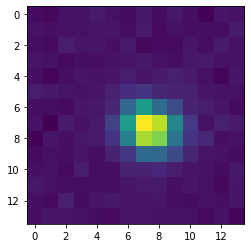

003628-u2-0130(646.5,1027.5)


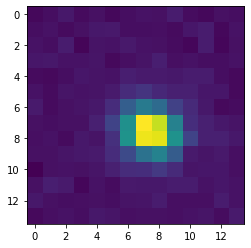

003628-u2-0130(1870.5,978.5)


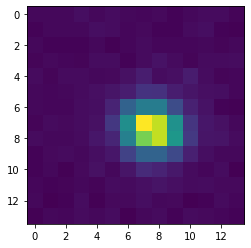

003628-u2-0130(224.5,935.5)


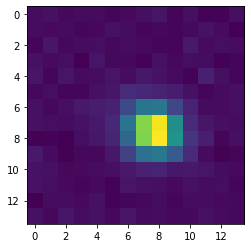

003628-u2-0130(561.5,593.5)


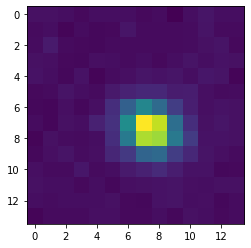

003628-u2-0130(38.5,514.5)


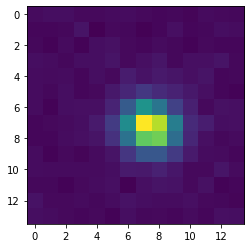

003628-u2-0130(910.5,401.5)


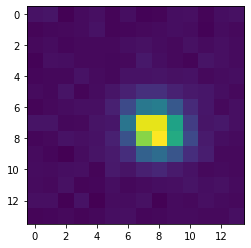

003628-u2-0130(1464.5,4.5)


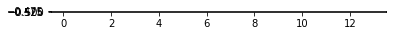

003628-u2-0130(1745.5,963.5)


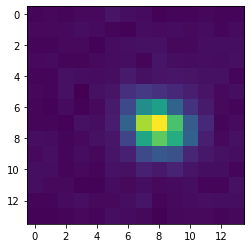

003628-u2-0130(657.5,918.5)


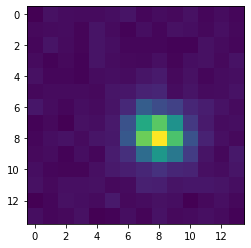

003628-u2-0130(1617.5,714.5)


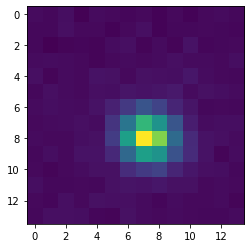

003628-u2-0130(1444.5,424.5)


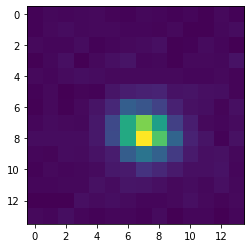

003628-u2-0130(1233.5,291.5)


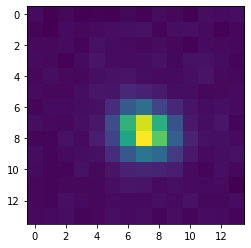

003628-u2-0130(464.5,238.5)


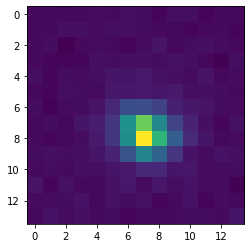

003628-u2-0130(902.5,1449.0)


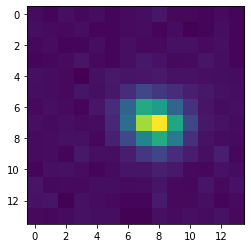

003628-u2-0130(69.5,1407.0)


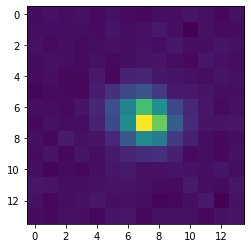

003628-u2-0130(747.0,1235.0)


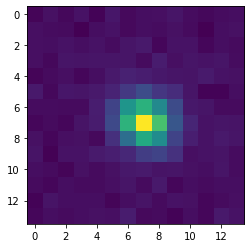

003628-u2-0130(1181.0,1234.0)


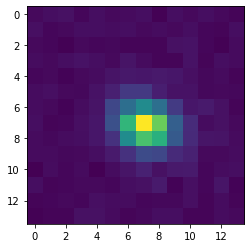

003628-u2-0130(1603.5,1192.0)


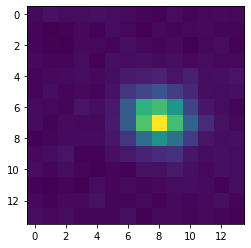

003628-u2-0130(175.0,1123.0)


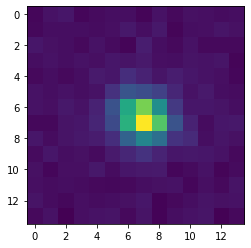

003628-u2-0130(479.0,1109.5)


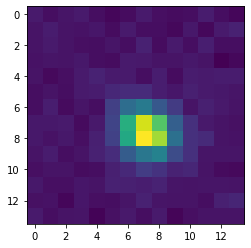

003628-u2-0130(803.0,1049.0)


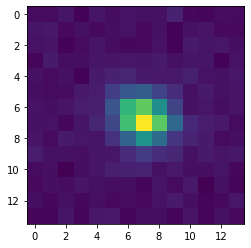

003628-u2-0130(748.5,895.0)


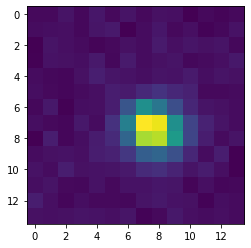

003628-u2-0130(1490.5,847.0)


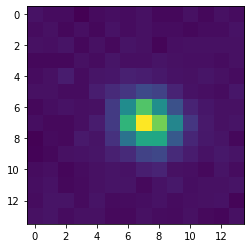

003628-u2-0130(381.0,744.0)


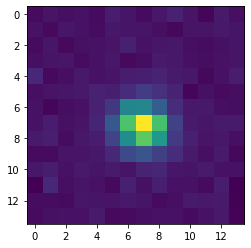

003628-u2-0130(124.0,744.5)


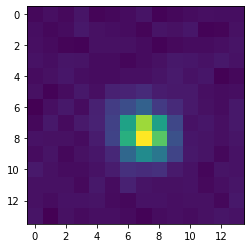

003628-u2-0130(2017.0,615.0)


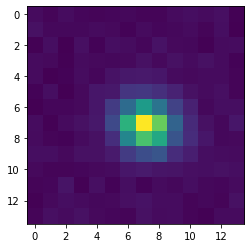

003628-u2-0130(137.0,603.0)


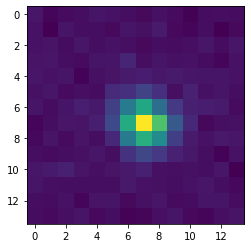

003628-u2-0130(2045.0,561.0)


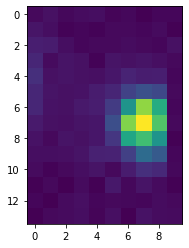

003628-u2-0130(416.0,301.0)


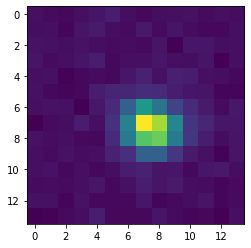

003628-u2-0130(159.5,250.0)


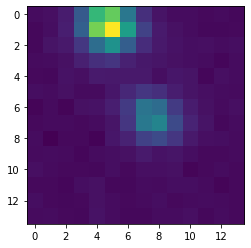

003628-u2-0130(741.0,150.0)


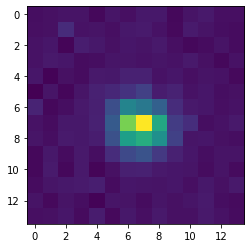

003628-u2-0130(1881.5,109.0)


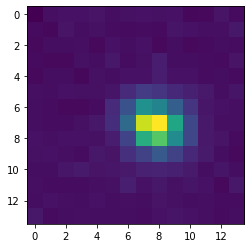

003628-u2-0130(1148.5,57.0)


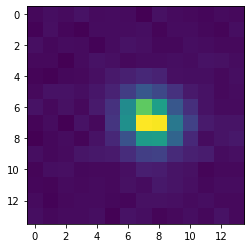

003628-u2-0130(989.0,52.5)


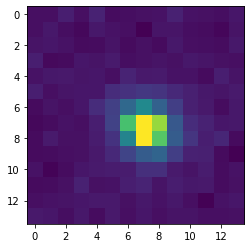

003628-u2-0130(1627.0,34.0)


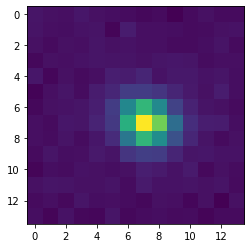

003628-u2-0130(524.0,11.5)


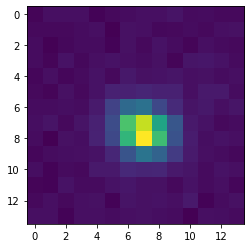

004569-u5-0015(1079.642822265625,965.6428833007812)


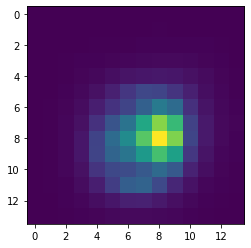

004569-u5-0015(864.5,71.0)


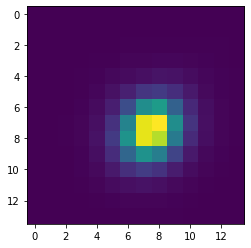

004569-u5-0015(1086.5,459.0)


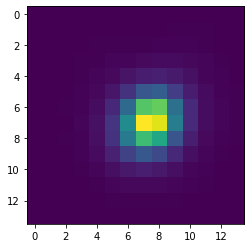

004569-u5-0015(782.0,1137.0)


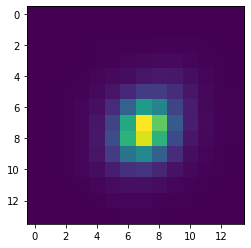

004569-u5-0015(1478.269287109375,1424.730712890625)


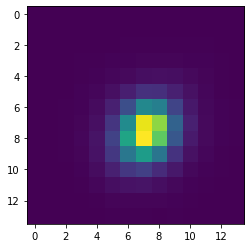

004569-u5-0015(571.7000122070312,896.7000122070312)


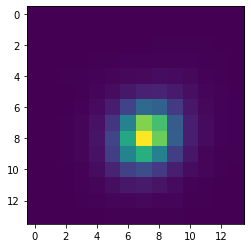

004569-u5-0015(1459.5,353.5)


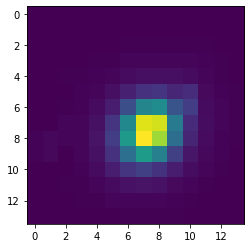

004569-u5-0015(1077.5714111328123,1140.892822265625)


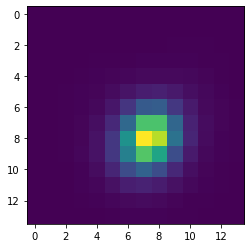

004569-u5-0015(88.0,1137.5)


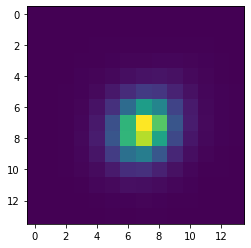

004569-u5-0015(1715.0,598.5)


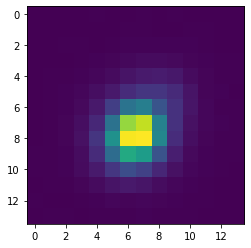

004569-u5-0015(1019.0,1461.5)


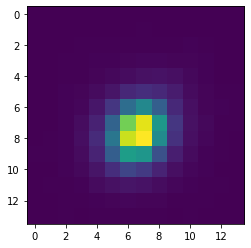

004569-u5-0015(1142.5,343.5)


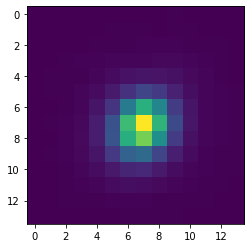

004569-u5-0015(1421.227294921875,1440.772705078125)


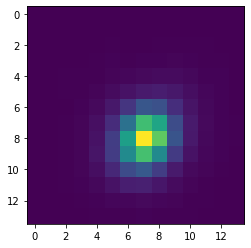

004569-u5-0015(272.0,1442.5)


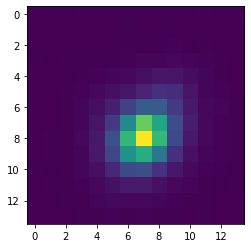

004569-u5-0015(540.0,385.0)


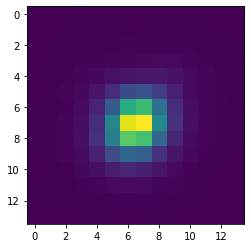

004569-u5-0015(709.5,1056.0)


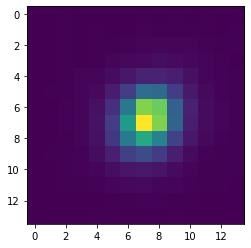

004569-u5-0015(636.0,802.5)


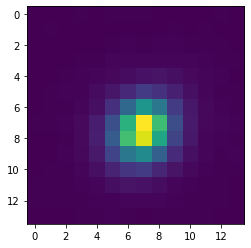

004569-u5-0015(461.5,757.0)


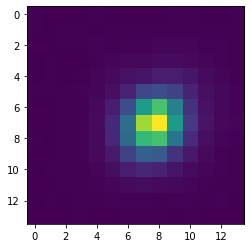

004569-u5-0015(1869.72216796875,442.27777099609375)


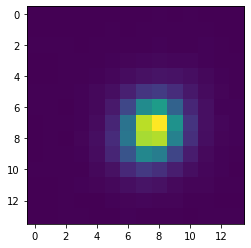

004569-u5-0015(1040.5,1177.5)


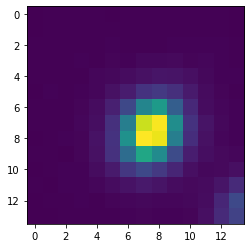

004569-u5-0015(126.35713958740234,390.7857055664063)


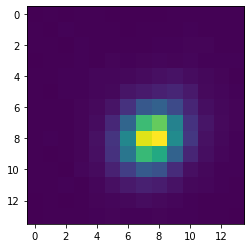

004569-u5-0015(153.0,356.0)


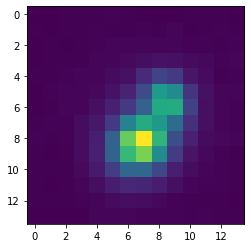

004569-u5-0015(919.5,995.5)


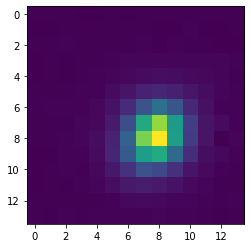

004569-u5-0015(1946.5,1087.5)


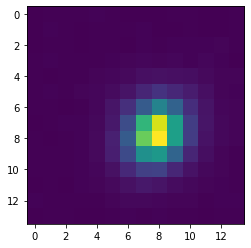

004569-u5-0015(502.5,628.5)


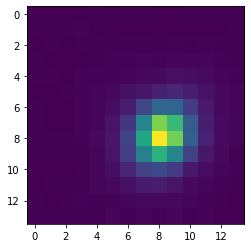

004569-u5-0015(586.6428833007812,434.3571472167969)


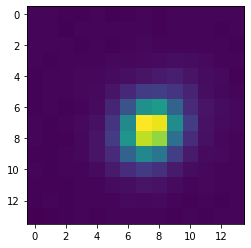

004569-u5-0015(200.1666717529297,389.1666564941406)


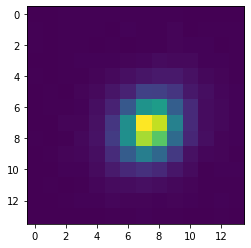

004569-u5-0015(1592.0,233.0)


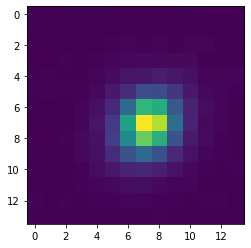

004569-u5-0015(800.2999877929688,1271.300048828125)


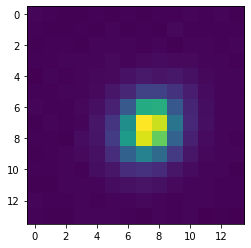

004569-u5-0015(1735.0,799.0)


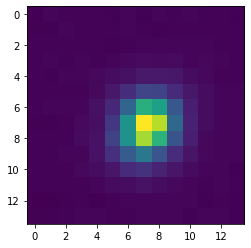

004569-u5-0015(2045.0,317.5)


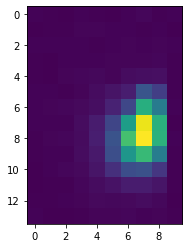

004569-u5-0015(264.0,1274.0)


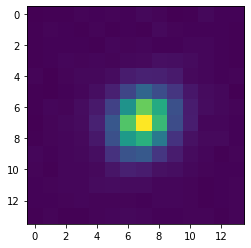

004569-u5-0015(1227.5,418.75)


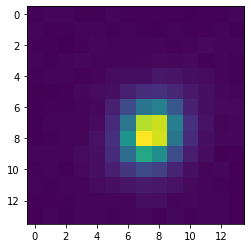

004569-u5-0015(470.5,1447.0)


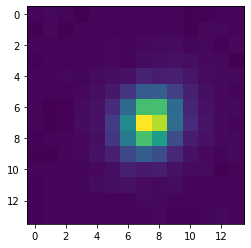

004569-u5-0015(136.5,518.5)


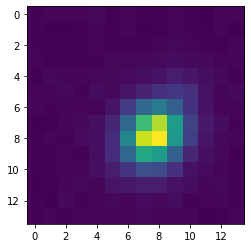

004569-u5-0015(1261.699951171875,1478.300048828125)


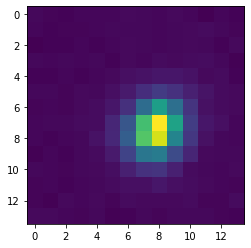

004569-u5-0015(1303.300048828125,590.7000122070312)


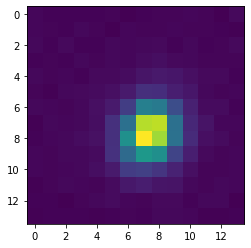

004569-u5-0015(1045.300048828125,548.7000122070311)


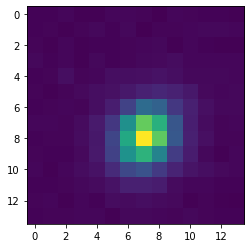

004569-u5-0015(1657.5,498.0)


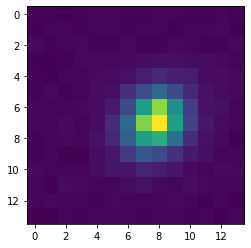

004569-u5-0015(1477.699951171875,337.29998779296875)


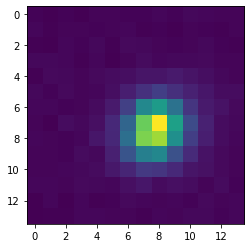

004569-u5-0015(1881.699951171875,262.29998779296875)


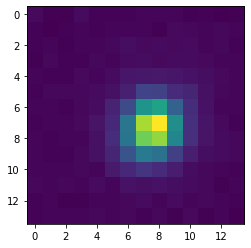

004569-u5-0015(1046.5,1182.5)


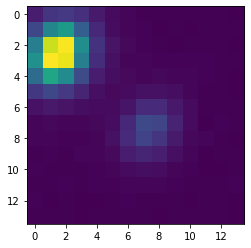

004569-u5-0015(1436.5,738.5)


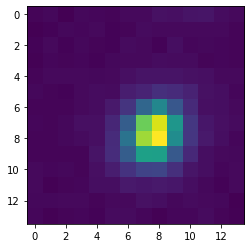

004569-u5-0015(2042.0,854.5)


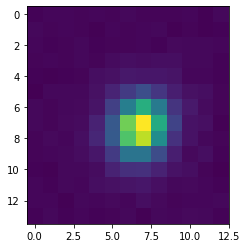

004569-u5-0015(693.0,173.5)


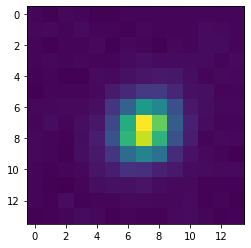

004569-u5-0015(351.3333435058594,1337.0)


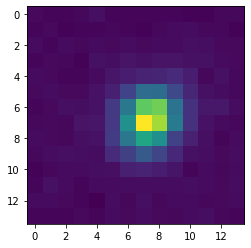

004569-u5-0015(842.0,1052.3333740234377)


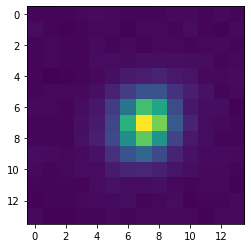

004569-u5-0015(843.3333129882812,308.0)


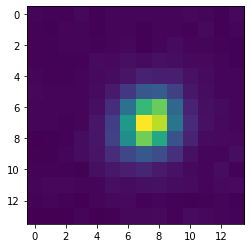

004569-u5-0015(1356.5,822.5)


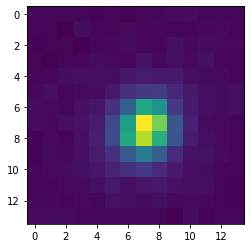

004569-u5-0015(576.0,837.0)


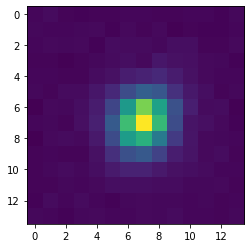

004569-u5-0015(513.0,1478.0)


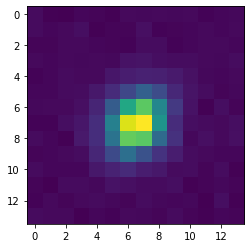

004569-u5-0015(1008.0,1435.0)


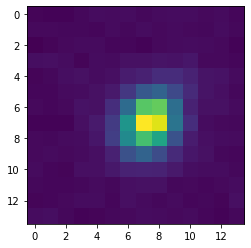

004569-u5-0015(946.0,686.0)


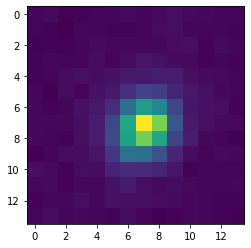

004569-u5-0015(1692.0,489.0)


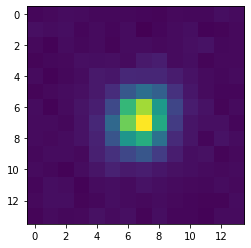

004569-u5-0015(73.0,489.0)


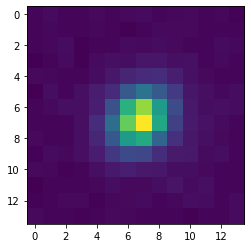

004569-u5-0015(929.0,362.0)


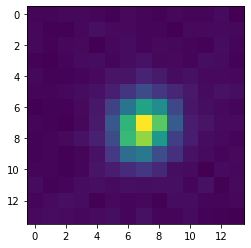

004569-u5-0015(1450.0,315.0)


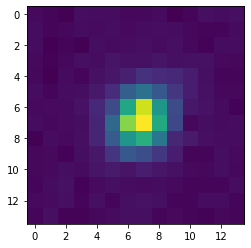

004569-u5-0015(479.0,140.0)


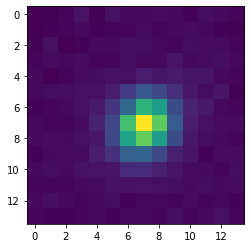

004569-u5-0015(654.8333129882812,1331.1666259765625)


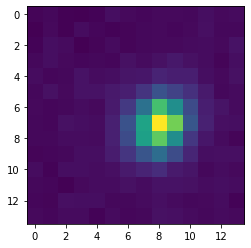

004569-u5-0015(983.1666870117188,353.8333435058594)


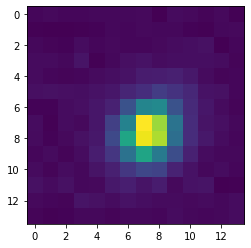

004569-u5-0015(783.0,340.0)


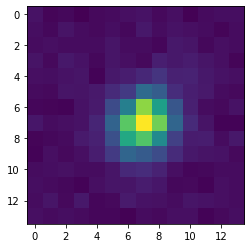

004569-u5-0015(1130.5,1076.0)


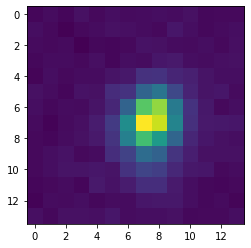

004569-u5-0015(496.5,495.0)


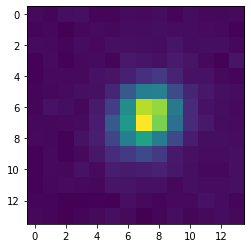

004569-u5-0015(694.0,99.5)


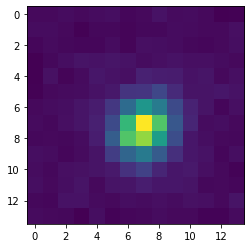

004569-u5-0015(1570.5,1488.0)


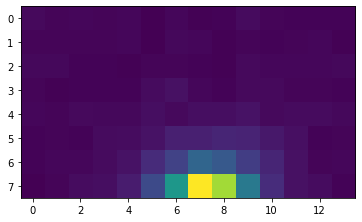

004569-u5-0015(659.5,1399.5)


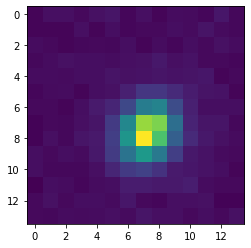

004569-u5-0015(968.5,1181.5)


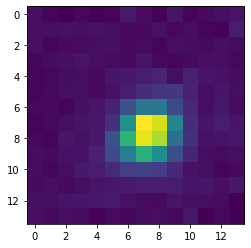

004569-u5-0015(157.5,752.5)


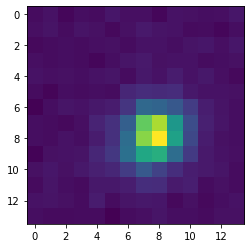

004569-u5-0015(738.5,591.5)


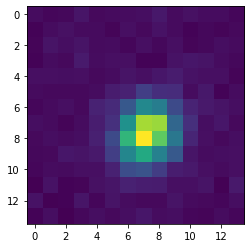

004569-u5-0015(1477.5,555.5)


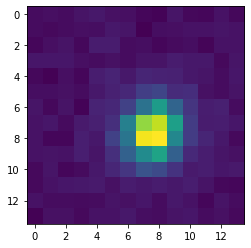

004569-u5-0015(1254.5,528.5)


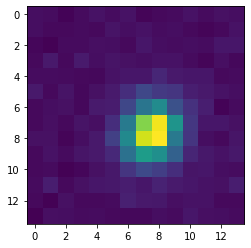

004569-u5-0015(1289.5,355.5)


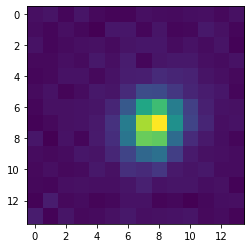

004569-u5-0015(1361.5,204.5)


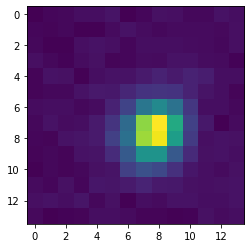

004569-u5-0015(1314.5,114.5)


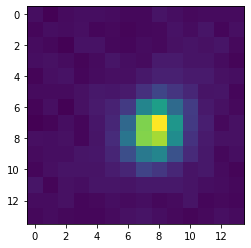

004569-u5-0015(1651.5,1049.5)


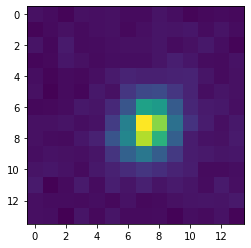

004569-u5-0015(882.5,790.5)


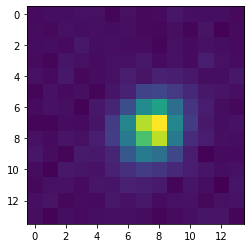

004569-u5-0015(1400.5,1488.0)


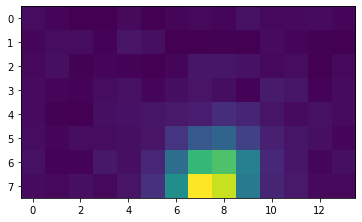

004569-u5-0015(910.0,1366.0)


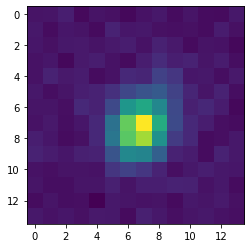

004569-u5-0015(881.0,1343.5)


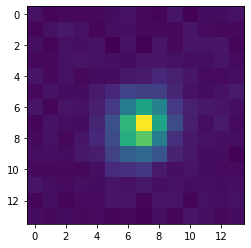

004569-u5-0015(201.5,1191.0)


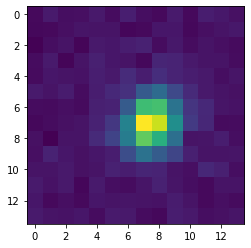

004569-u5-0015(1408.5,1049.0)


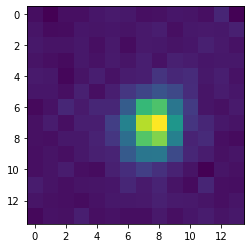

004569-u5-0015(536.5,1014.0)


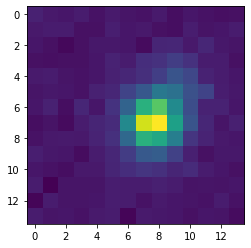

004569-u5-0015(1716.5,890.0)


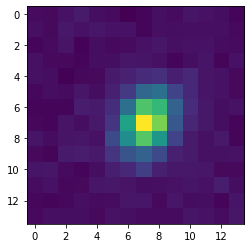

004569-u5-0015(1084.5,859.5)


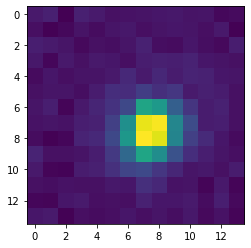

004569-u5-0015(1256.0,752.0)


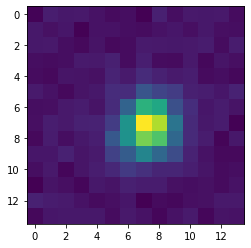

004569-u5-0015(1089.5,752.0)


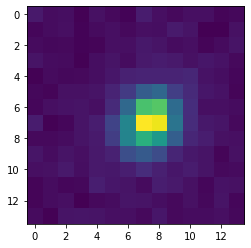

004569-u5-0015(1440.0,728.0)


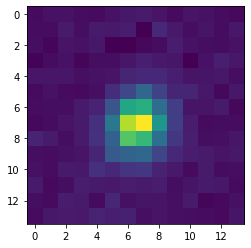

004569-u5-0015(1886.0,684.0)


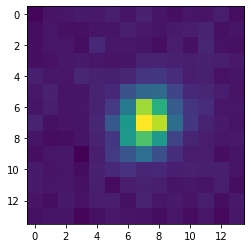

004569-u5-0015(1293.0,657.5)


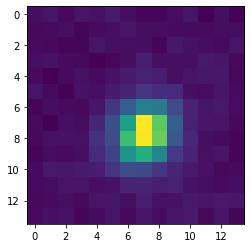

004569-u5-0015(1573.0,447.0)


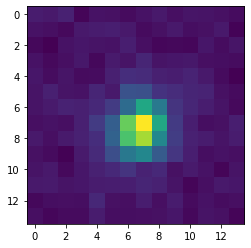

004569-u5-0015(1077.5,384.0)


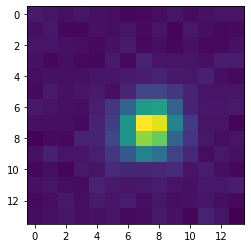

004569-u5-0015(1480.0,363.5)


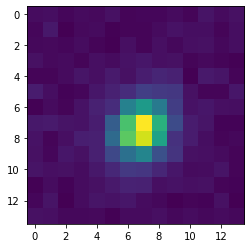

004569-u5-0015(369.0,92.0)


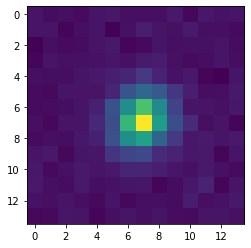

005137-u6-0303(943.8636474609376,313.8636474609375)


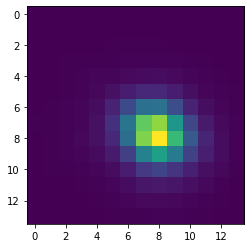

005137-u6-0303(1425.0,396.0)


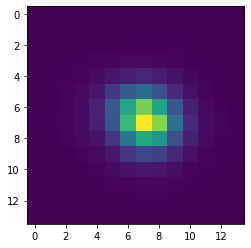

005137-u6-0303(418.0,1175.0)


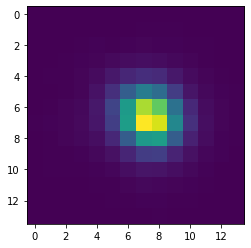

005137-u6-0303(1351.5,511.5)


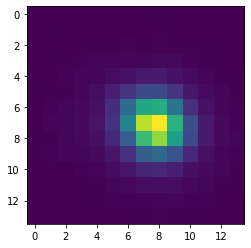

005137-u6-0303(1337.2142333984375,660.2142944335938)


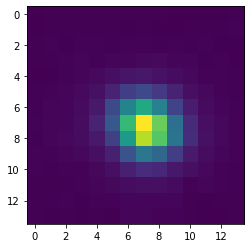

005137-u6-0303(87.5,653.75)


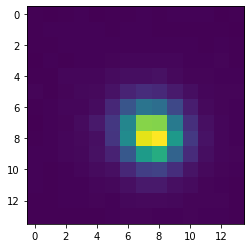

005137-u6-0303(899.0,1039.0)


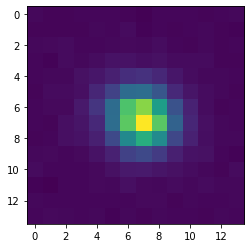

005137-u6-0303(1180.0,267.0)


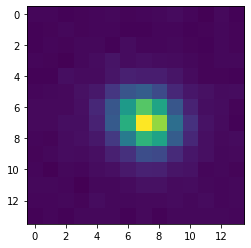

005137-u6-0303(798.0,778.5)


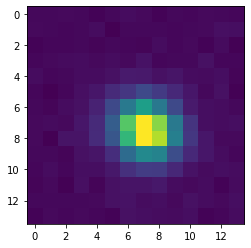

005137-u6-0303(833.5,1004.5)


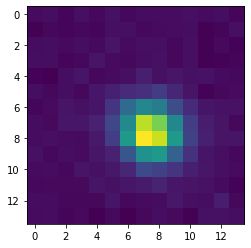

005137-u6-0303(804.0,957.0)


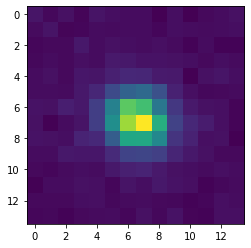

005137-u6-0303(839.0,887.0)


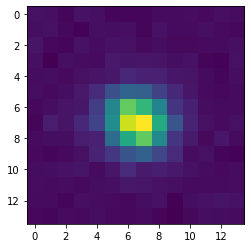

005137-u6-0303(1432.5,870.0)


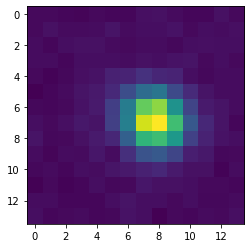

005137-u6-0303(540.5,663.0)


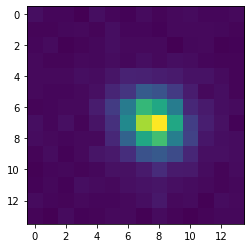

005390-u2-0131(1456.6817626953125,406.5)


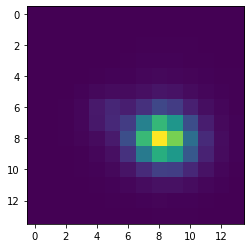

005390-u2-0131(1586.6666259765625,151.0)


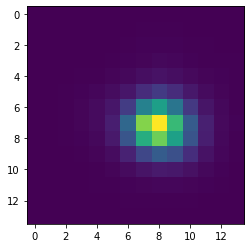

005390-u2-0131(18.0,908.0)


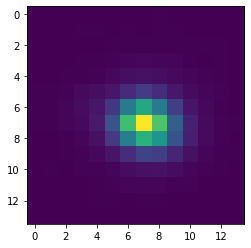

005390-u2-0131(1593.5,1223.0)


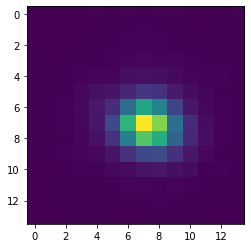

005390-u2-0131(1153.699951171875,176.5)


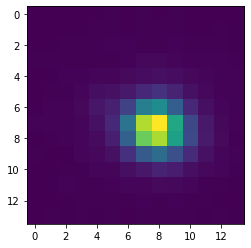

005390-u2-0131(1528.5,948.5)


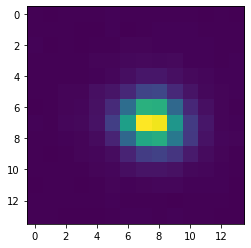

005390-u2-0131(78.25,830.5)


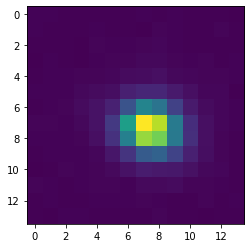

005390-u2-0131(1136.699951171875,168.6999969482422)


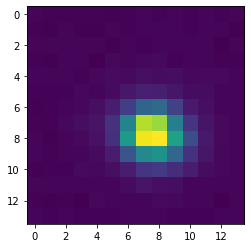

005390-u2-0131(1486.5,1190.0)


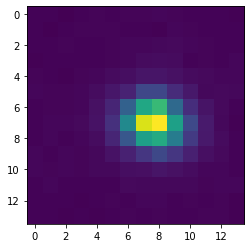

005390-u2-0131(862.3333129882812,1066.0)


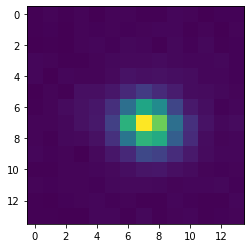

005390-u2-0131(1176.0,1284.0)


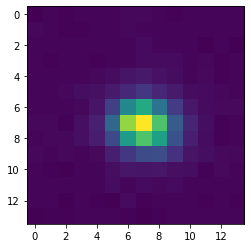

005390-u2-0131(1766.0,71.5)


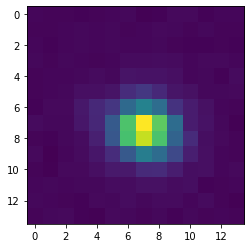

005390-u2-0131(1963.0,1110.25)


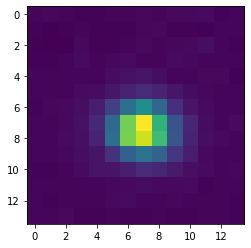

005390-u2-0131(594.8333129882812,422.1666564941406)


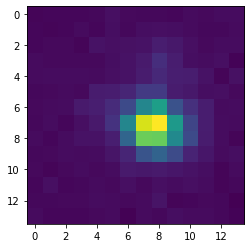

005732-u3-0053(1330.131591796875,1484.131591796875)


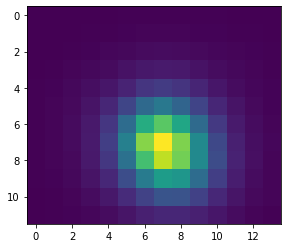

005732-u3-0053(1381.5806884765625,237.27420043945312)


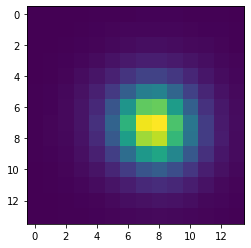

005732-u3-0053(882.7142944335938,278.7142944335937)


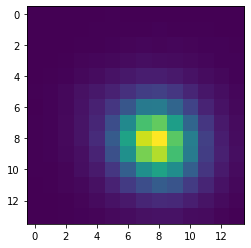

005732-u3-0053(1085.1922607421877,613.1923217773438)


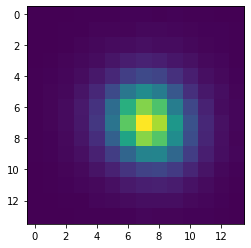

005732-u3-0053(19.0,264.0)


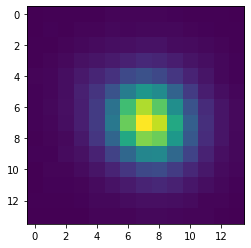

005732-u3-0053(2005.875,420.5)


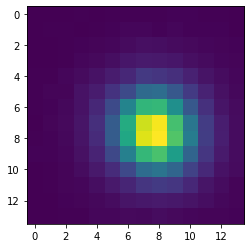

005732-u3-0053(277.0,362.5)


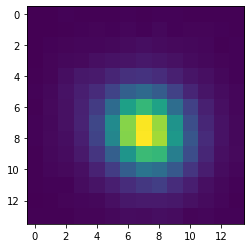

005732-u3-0053(1147.5,1159.5)


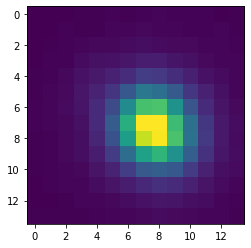

005732-u3-0053(595.0,1190.5)


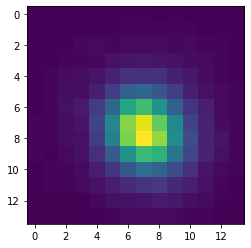

005732-u3-0053(1004.4000244140624,493.0)


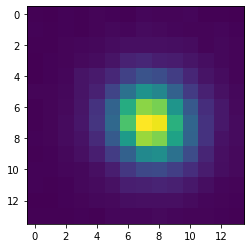

005732-u3-0053(962.5,248.5)


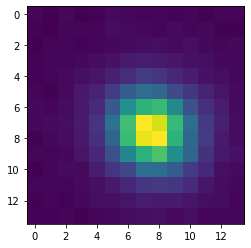

005732-u3-0053(326.5,427.0)


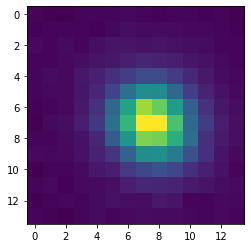

005732-u3-0053(1601.4000244140625,906.0)


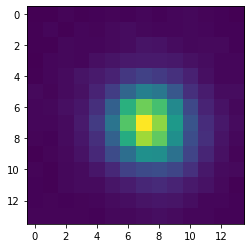

005732-u3-0053(727.5,500.0)


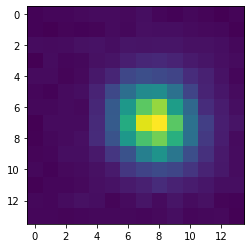

005732-u3-0053(1441.75,394.75)


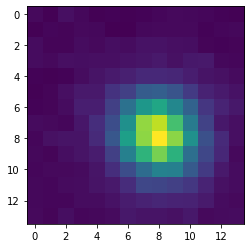

005732-u3-0053(1902.5,1009.5)


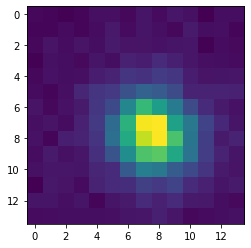

005732-u3-0053(677.5,595.5)


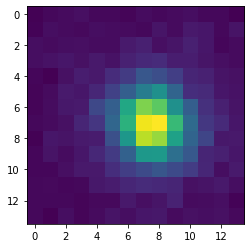

005732-u3-0053(170.0,733.0)


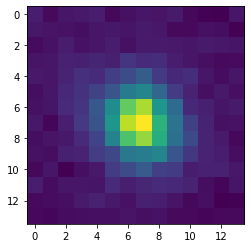

005732-u3-0053(1208.5,0.0)


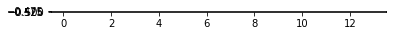

004152-u1-0114(687.5,615.5)


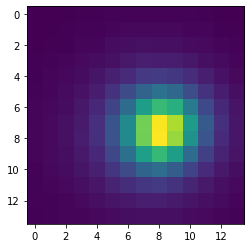

004152-u1-0114(120.74137878417969,987.8793334960938)


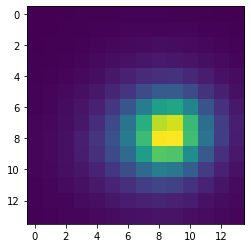

004152-u1-0114(479.0,790.5)


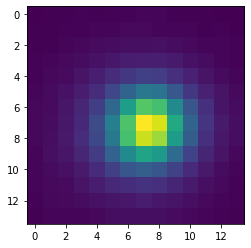

004152-u1-0114(250.6999969482422,381.70001220703125)


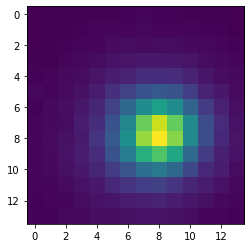

004152-u1-0114(428.1875,21.0)


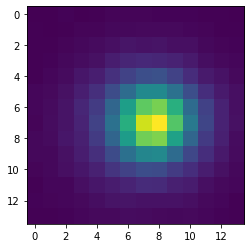

004152-u1-0114(1089.0833740234377,1418.72216796875)


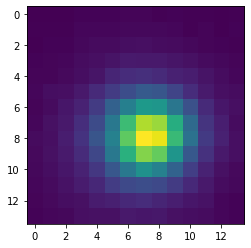

004152-u1-0114(829.0,1463.0)


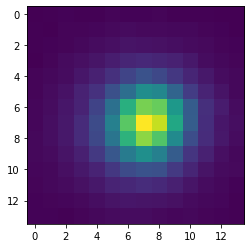

004152-u1-0114(1356.7413330078125,566.1896362304688)


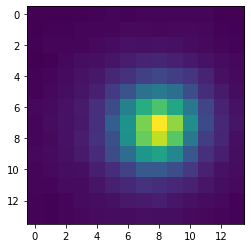

004152-u1-0114(549.5,1142.5)


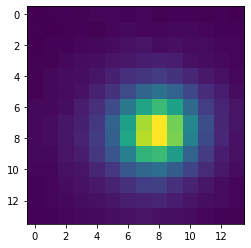

004152-u1-0114(1799.0,356.3333435058594)


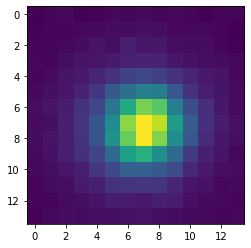

004152-u1-0114(295.1842041015625,76.39473724365234)


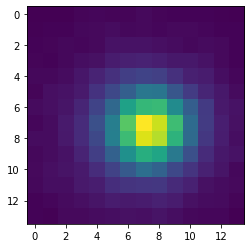

004152-u1-0114(1425.5,471.5)


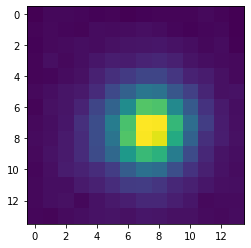

004152-u1-0114(402.5,1296.5)


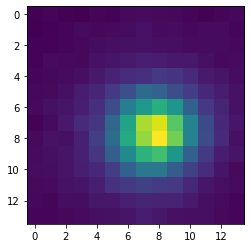

004152-u1-0114(1017.8846435546876,268.34616088867193)


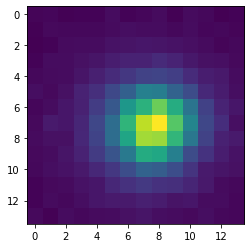

004152-u1-0114(238.2857208251953,346.6428527832031)


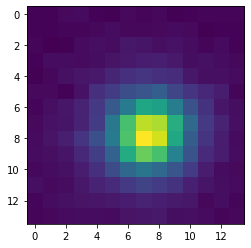

004152-u1-0114(1862.0,459.5)


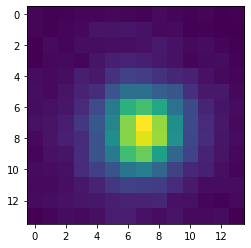

004152-u1-0114(106.0,729.5)


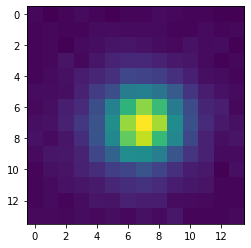

004152-u1-0114(978.3571166992188,168.7857208251953)


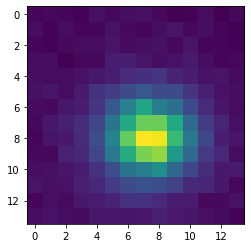

004152-u1-0114(1131.5,1045.5)


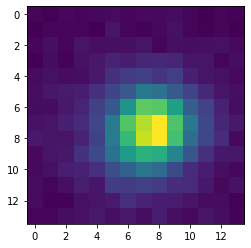

004152-u1-0114(1977.0,627.0)


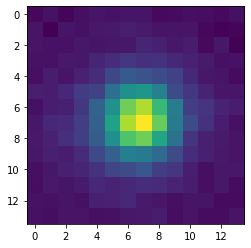

004152-u1-0114(1613.0,957.75)


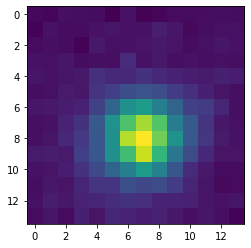

004152-u1-0114(180.1666717529297,783.1666870117188)


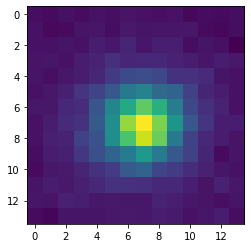

004152-u1-0114(229.5,1193.0)


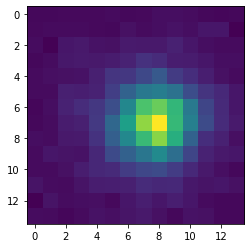

004152-u1-0114(68.0,89.25)


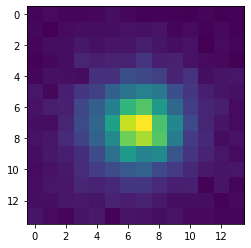

004152-u1-0114(843.5,1257.0)


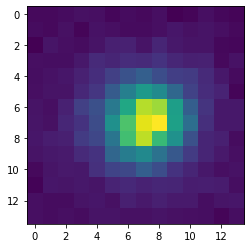

004152-u1-0114(854.5,793.5)


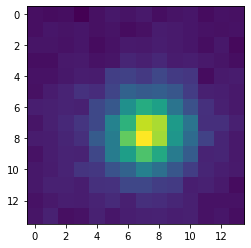

004152-u1-0114(1836.0,653.0)


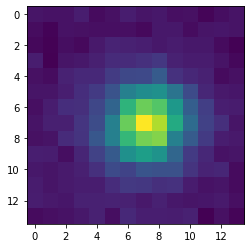

004152-u1-0114(1558.5,515.0)


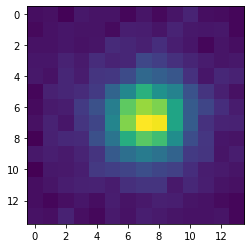

000756-u4-0373(47.67708206176758,116.70833587646484)


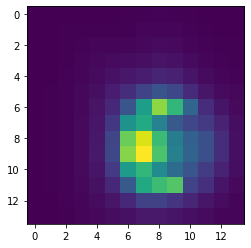

000756-u4-0373(412.5,15.0)


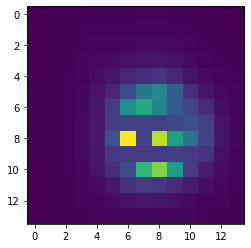

000756-u4-0373(1469.45458984375,318.2272644042969)


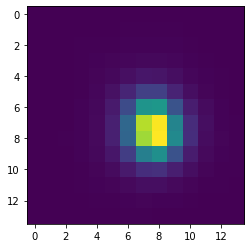

000756-u4-0373(2031.5,1398.699951171875)


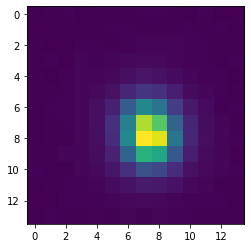

000756-u4-0373(1666.5,1445.75)


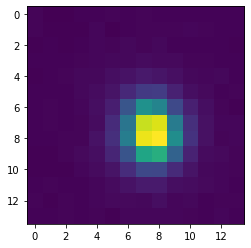

000756-u4-0373(1849.5,375.5)


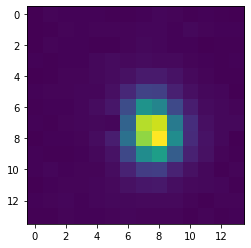

000756-u4-0373(829.1666870117188,507.5)


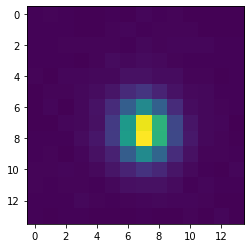

000756-u4-0373(1990.1666259765625,347.5)


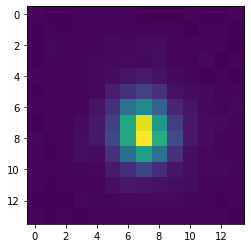

000756-u4-0373(1698.0,889.5)


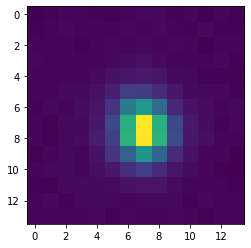

000756-u4-0373(607.0,1343.5)


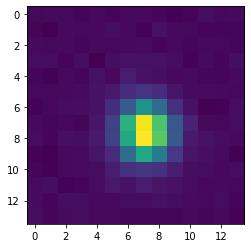

000756-u4-0373(5.25,1259.0)


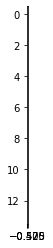

000756-u4-0373(66.75,287.0)


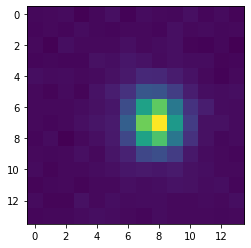

000756-u4-0373(167.5,893.0)


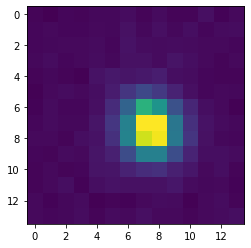

000756-u4-0373(1768.5,692.0)


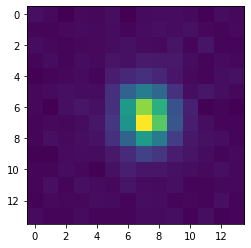

000756-u4-0373(898.5,1341.5)


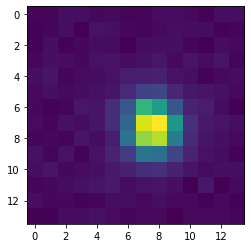

000756-u4-0373(103.5,110.5)


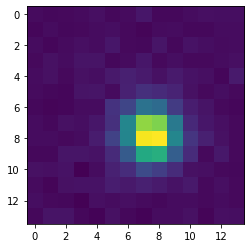

000756-u4-0373(291.5,78.5)


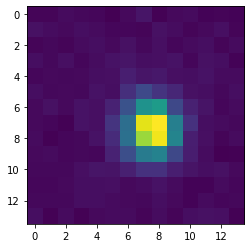

000756-u4-0373(528.0,278.5)


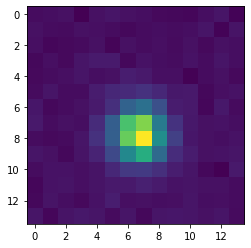

007047-u6-0160(1042.6728515625,75.59876251220703)


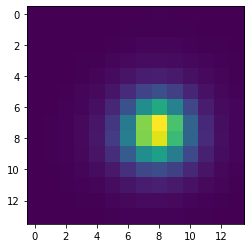

007047-u6-0160(1243.5,213.25)


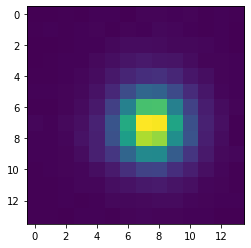

007047-u6-0160(1998.642822265625,41.21428680419922)


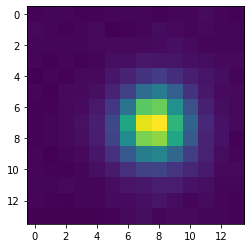

007047-u6-0160(714.75,1095.0)


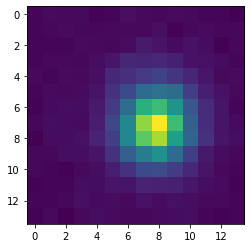

007047-u6-0160(181.8333282470703,667.1666870117188)


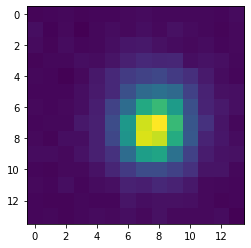

007047-u6-0160(66.5,0.0)


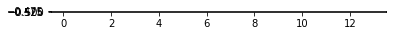

006533-u4-0286(71.5,679.5)


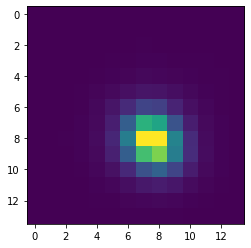

006533-u4-0286(1881.1363525390625,582.1363525390625)


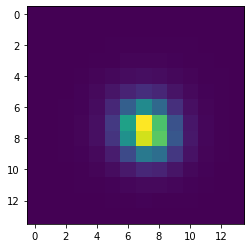

006533-u4-0286(735.7105102539062,484.6052551269531)


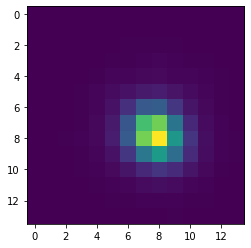

006533-u4-0286(1254.3182373046875,908.3181762695312)


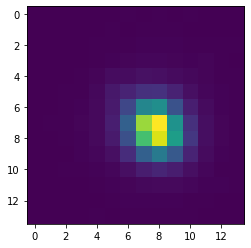

006533-u4-0286(1017.5,390.5)


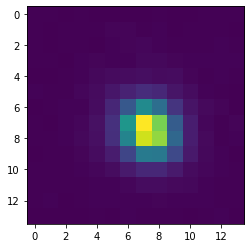

006533-u4-0286(842.5,5.5)


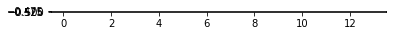

006533-u4-0286(2044.5,1027.5)


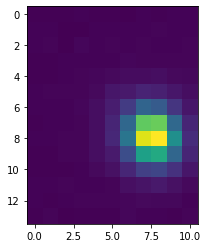

006533-u4-0286(332.0,1441.0)


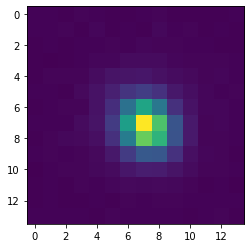

006533-u4-0286(993.0,53.0)


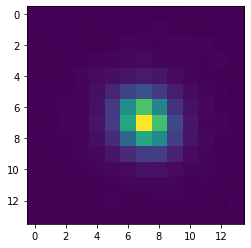

006533-u4-0286(511.0,363.0)


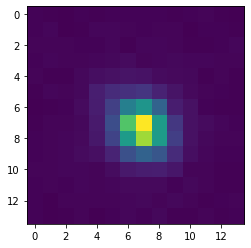

006533-u4-0286(337.0,968.0)


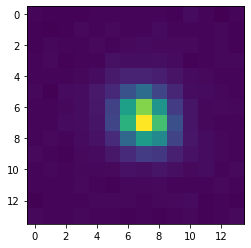

006533-u4-0286(1288.0,1446.5)


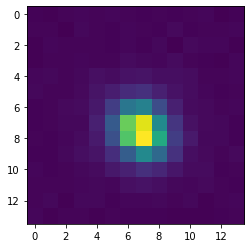

006533-u4-0286(533.75,729.5)


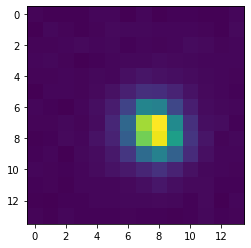

006533-u4-0286(632.0,1113.0)


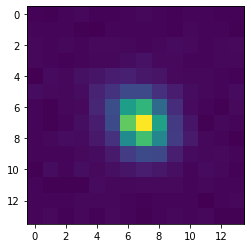

006533-u4-0286(632.0,1306.6666259765625)


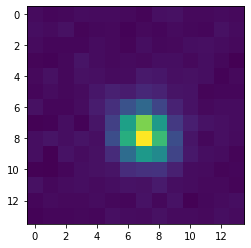

006533-u4-0286(1543.0,1011.0)


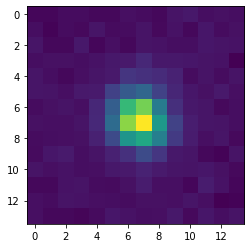

006533-u4-0286(423.0,419.75)


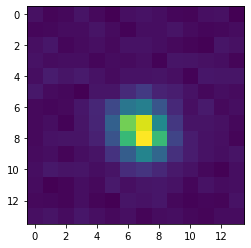

006533-u4-0286(1628.1666259765625,446.1666564941406)


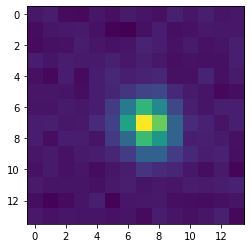

006533-u4-0286(701.0,1389.5)


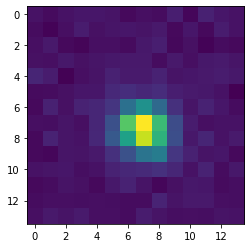

006533-u4-0286(1146.0,1001.5)


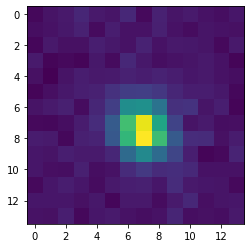

006533-u4-0286(585.5,84.5)


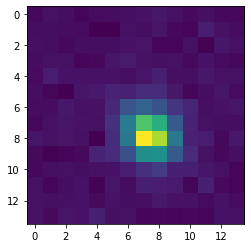

006533-u4-0286(1003.5,12.5)


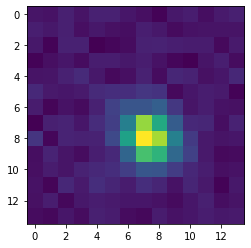

006533-u4-0286(1713.0,1235.5)


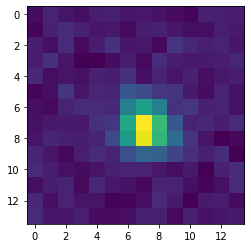

006533-u4-0286(173.0,992.0)


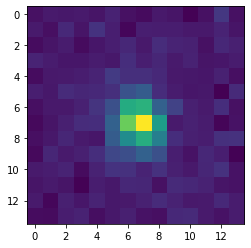

006533-u4-0286(630.5,802.0)


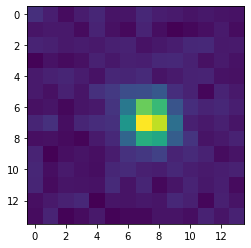

006533-u4-0286(178.0,375.0)


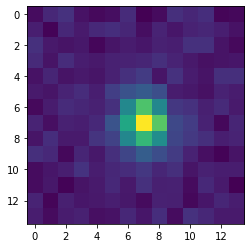

006422-u3-0120(1321.1893310546875,1399.198974609375)


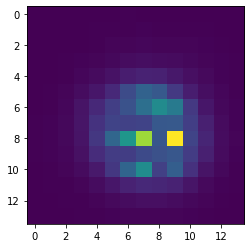

006422-u3-0120(1372.5,152.5)


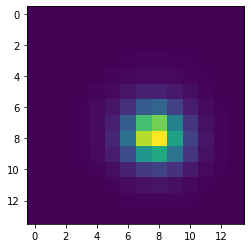

006422-u3-0120(873.7000122070312,194.3000030517578)


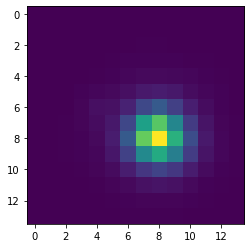

006422-u3-0120(1076.5,528.5)


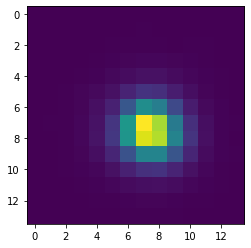

006422-u3-0120(9.94444465637207,179.22222900390625)


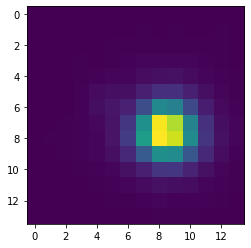

006422-u3-0120(1138.5,1074.5)


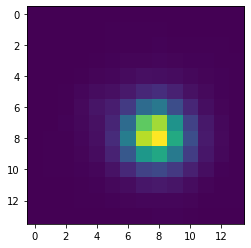

006422-u3-0120(1997.0,336.0)


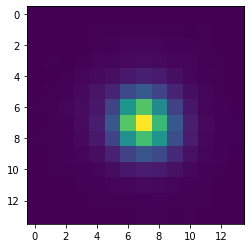

006422-u3-0120(268.0,278.0)


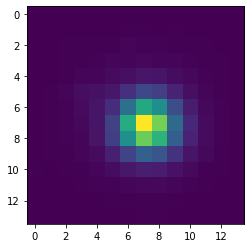

006422-u3-0120(586.1818237304688,1105.9090576171877)


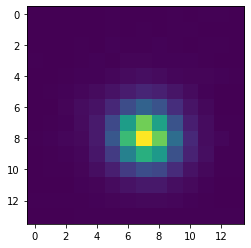

006422-u3-0120(995.5,408.5)


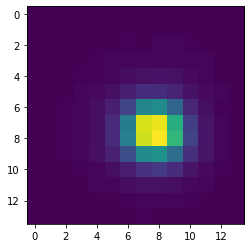

006422-u3-0120(1592.5,821.5)


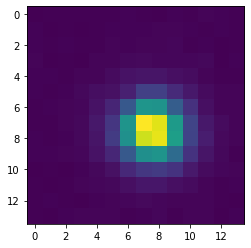

006422-u3-0120(953.7857055664062,164.2142791748047)


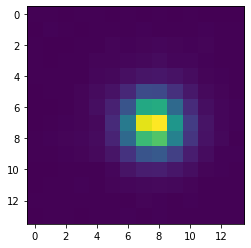

006422-u3-0120(317.71429443359375,342.6428527832031)


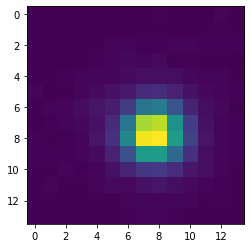

006422-u3-0120(719.0,415.5)


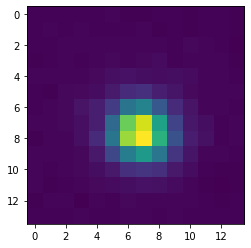

006422-u3-0120(1433.1666259765625,310.5)


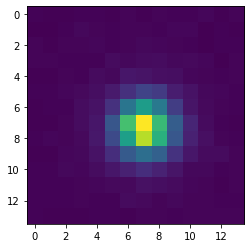

006422-u3-0120(1894.0,925.0)


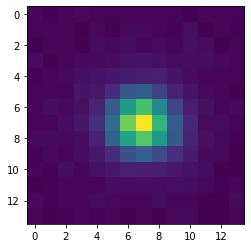

006422-u3-0120(668.8333129882812,510.8333435058594)


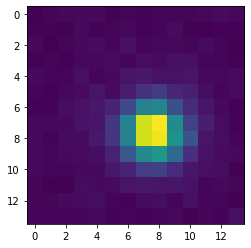

006422-u3-0120(161.0,648.5)


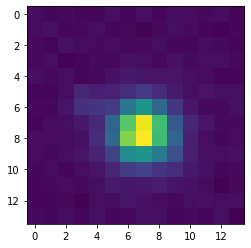

006422-u3-0120(1890.0,576.0)


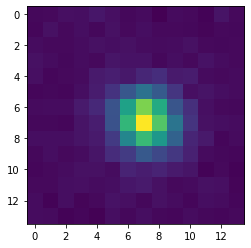

006422-u3-0120(1564.5,100.0)


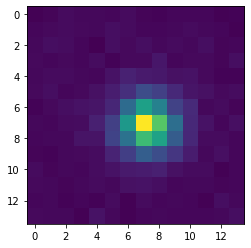

006422-u3-0120(1242.5,1267.5)


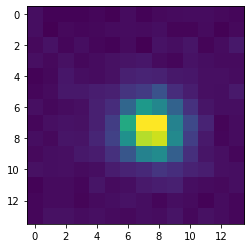

006422-u3-0120(1188.5,1143.0)


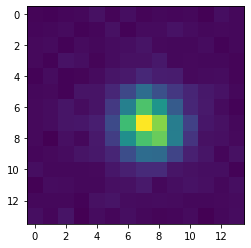

006422-u3-0120(240.5,607.0)


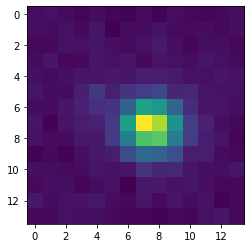

004649-u5-0446(584.3804321289062,129.16304016113278)


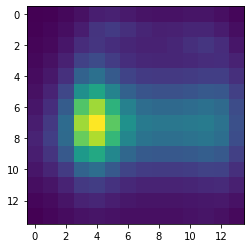

004649-u5-0446(87.4137954711914,852.7069091796875)


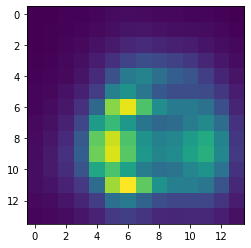

004649-u5-0446(258.42919921875,379.6593017578125)


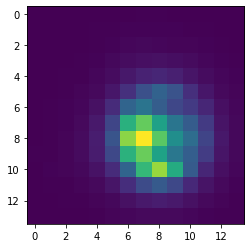

004649-u5-0446(1147.375,872.375)


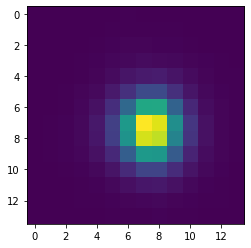

004649-u5-0446(1001.0,1054.0)


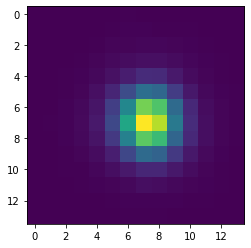

004649-u5-0446(1356.72216796875,463.9166564941406)


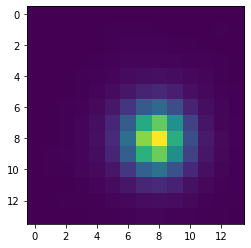

004649-u5-0446(1953.5,1060.0)


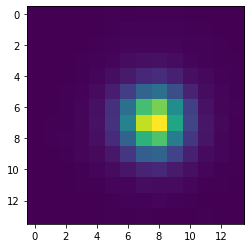

004649-u5-0446(783.0,1172.9375)


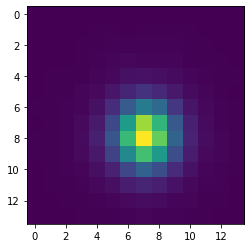

004649-u5-0446(1839.5645751953125,762.6613159179688)


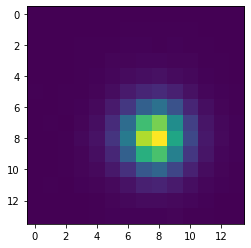

004649-u5-0446(447.5,441.0)


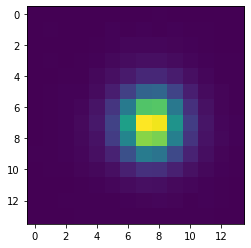

004649-u5-0446(49.16666793823242,1302.1666259765625)


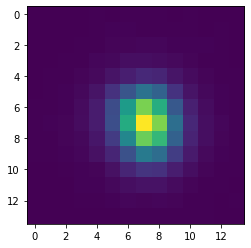

004649-u5-0446(1605.2142333984375,1282.357177734375)


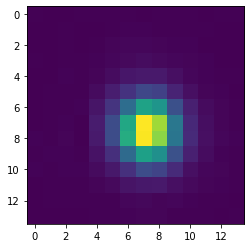

004649-u5-0446(257.5,247.5)


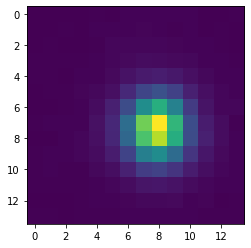

004649-u5-0446(1291.0,696.5)


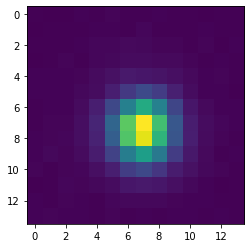

004649-u5-0446(715.5,69.69999694824219)


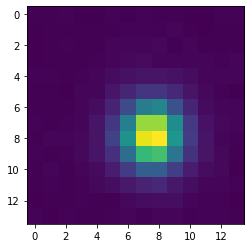

004649-u5-0446(1578.5,1043.5)


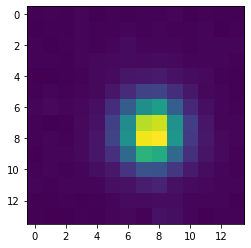

004649-u5-0446(1453.0,40.5)


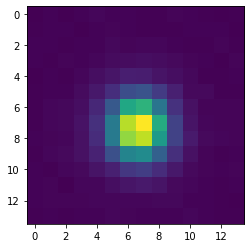

004649-u5-0446(165.0,220.0)


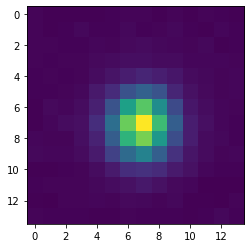

004649-u5-0446(247.35714721679688,1031.7142333984377)


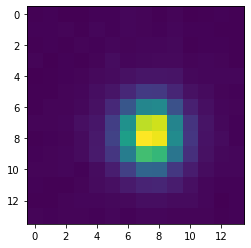

004649-u5-0446(917.0,348.0)


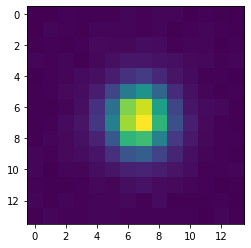

004649-u5-0446(977.5,588.0)


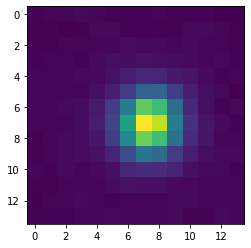

004649-u5-0446(615.5,567.0)


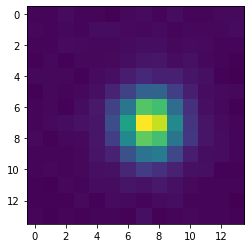

004649-u5-0446(325.1666564941406,206.8333282470703)


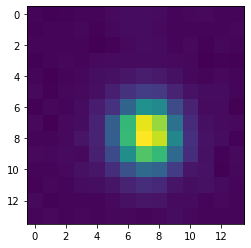

004649-u5-0446(1023.5,62.0)


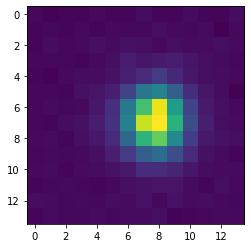

004649-u5-0446(1108.5,785.1666870117188)


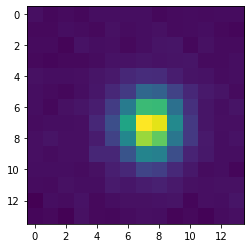

004649-u5-0446(495.5,955.5)


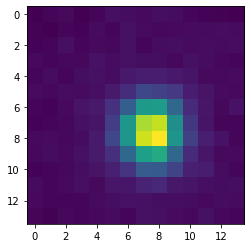

004649-u5-0446(1155.75,841.75)


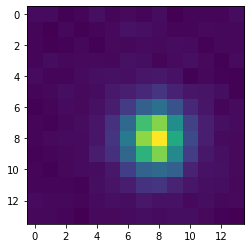

004649-u5-0446(573.0,305.0)


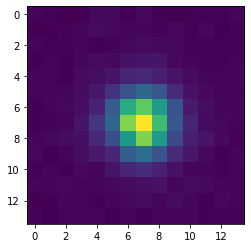

004649-u5-0446(489.0,1120.5)


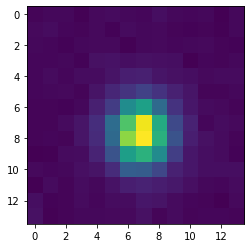

004649-u5-0446(1128.5,1044.5)


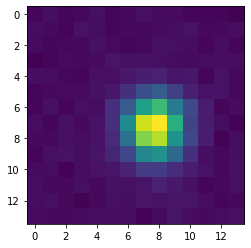

004649-u5-0446(1030.5,9.5)


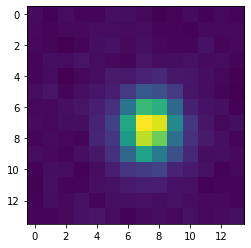

004649-u5-0446(1715.5,1464.5)


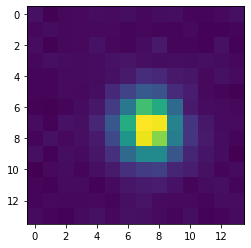

004649-u5-0446(1089.0,1383.3333740234375)


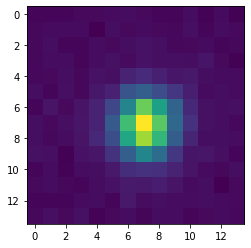

004649-u5-0446(1326.0,897.3333129882812)


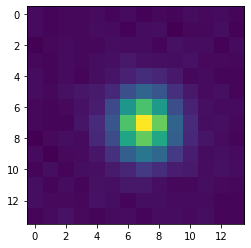

004649-u5-0446(1652.5,676.5)


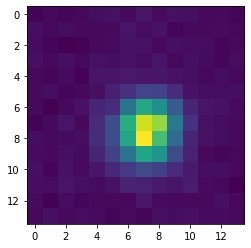

004649-u5-0446(614.0,430.3333435058594)


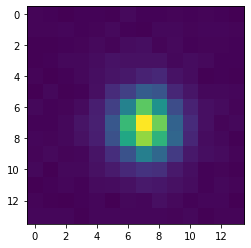

004649-u5-0446(1934.5,1361.5)


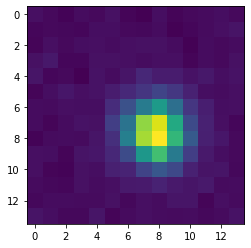

004649-u5-0446(597.0,1186.0)


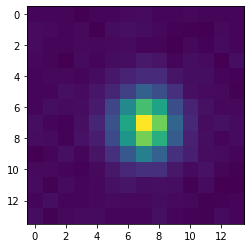

004649-u5-0446(1671.0,664.5)


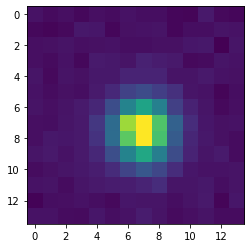

004649-u5-0446(1845.0,976.0)


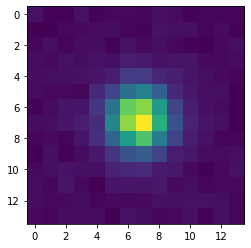

004649-u5-0446(1194.0,331.0)


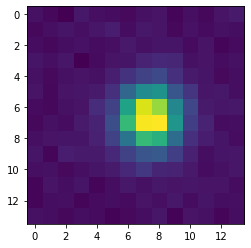

004649-u5-0446(816.0,930.75)


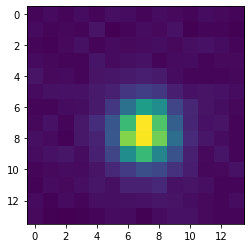

004649-u5-0446(526.75,148.0)


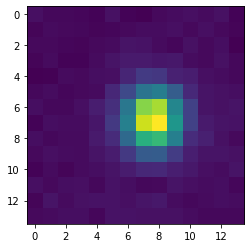

004649-u5-0446(1976.5,1331.0)


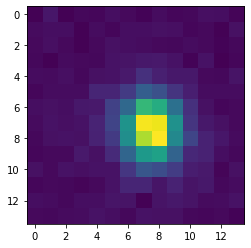

004649-u5-0446(1177.5,1028.0)


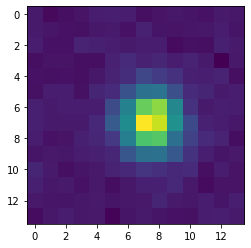

004649-u5-0446(1822.5,329.0)


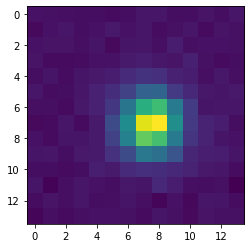

004649-u5-0446(617.0,177.5)


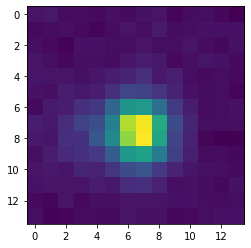

004649-u5-0446(1728.5,1420.0)


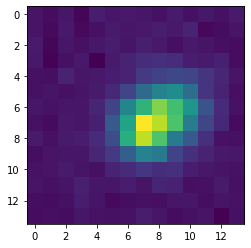

004649-u5-0446(1999.5,1184.5)


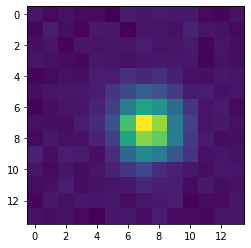

004649-u5-0446(1440.5,804.5)


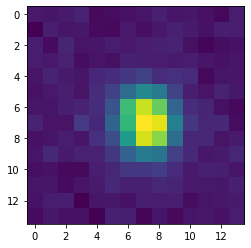

004649-u5-0446(269.5,615.5)


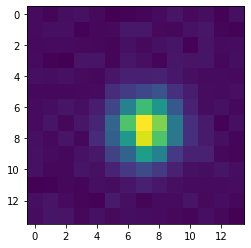

004649-u5-0446(1808.5,600.5)


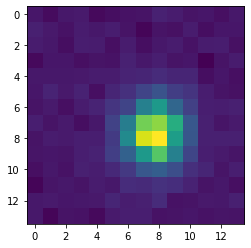

004649-u5-0446(592.5,499.5)


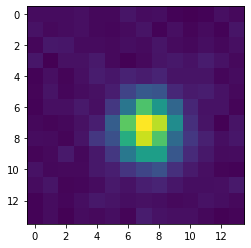

004649-u5-0446(1020.0,1194.0)


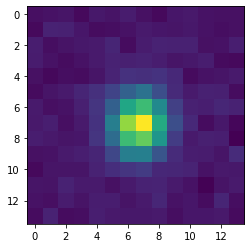

004649-u5-0446(1593.0,942.0)


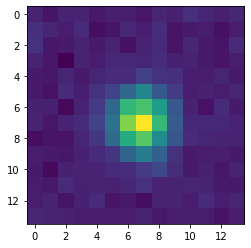

004649-u5-0446(662.0,311.0)


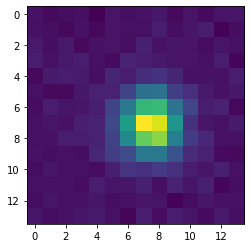

004649-u5-0446(1058.0,242.0)


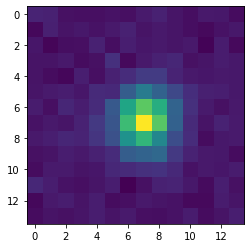

004649-u5-0446(1773.0,52.0)


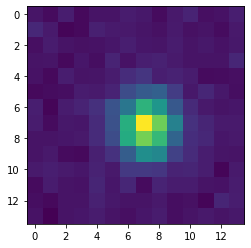

004649-u5-0446(900.0,0.0)


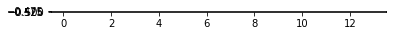

001402-u5-0110(1486.0,416.0)


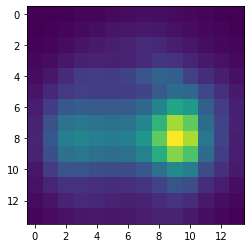

001402-u5-0110(840.5,915.5)


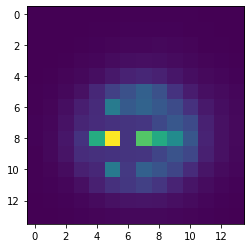

001402-u5-0110(1654.5,749.5)


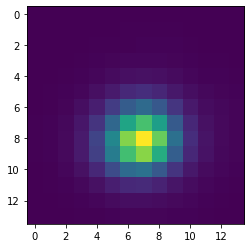

001402-u5-0110(884.0,214.5)


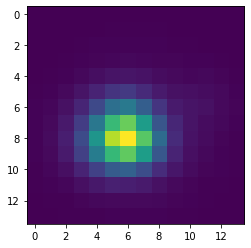

001402-u5-0110(927.5,211.0)


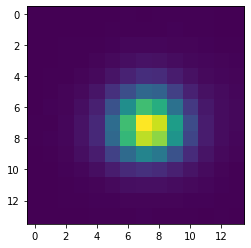

001402-u5-0110(736.1875,73.0)


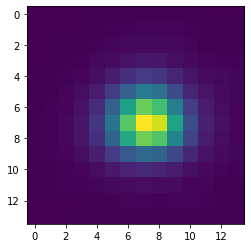

001402-u5-0110(1461.3182373046875,1099.6817626953123)


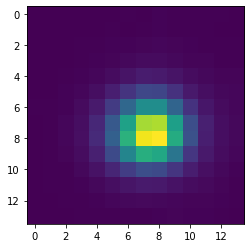

001402-u5-0110(240.875,844.5)


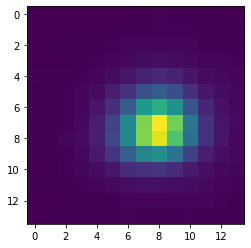

001402-u5-0110(670.5,762.5)


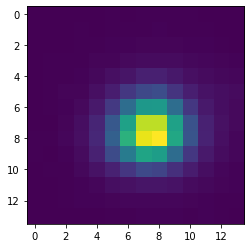

001402-u5-0110(618.5,1460.5)


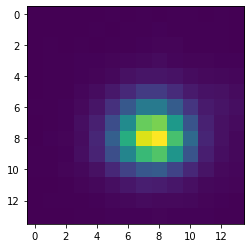

001402-u5-0110(103.71428680419922,211.0)


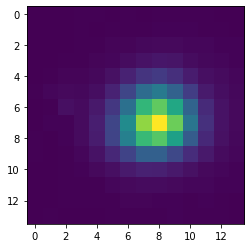

001402-u5-0110(1900.357177734375,772.5)


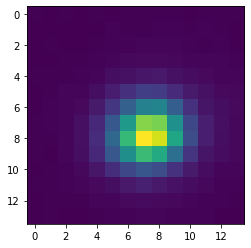

001402-u5-0110(1171.642822265625,319.5)


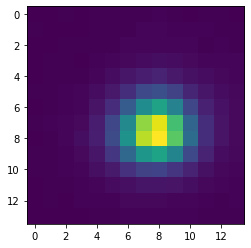

001402-u5-0110(1375.5,469.5)


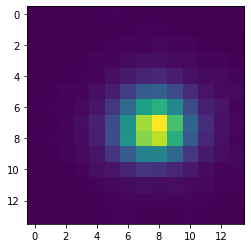

001402-u5-0110(1218.0,1283.5)


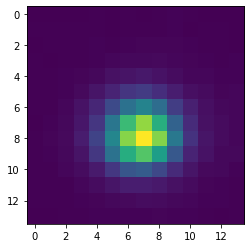

001402-u5-0110(410.5,1352.0)


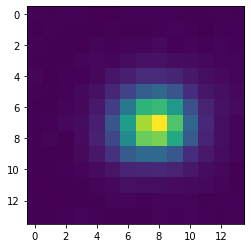

001402-u5-0110(1734.5,1364.5)


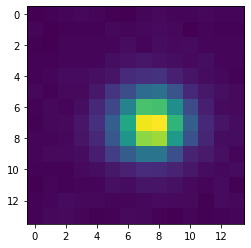

001402-u5-0110(1148.8333740234375,1394.0)


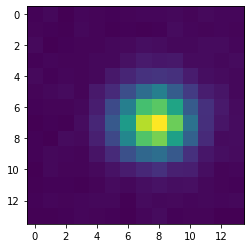

001402-u5-0110(684.0,1227.0)


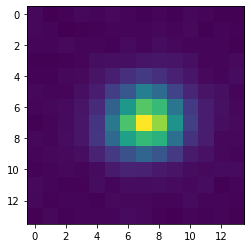

001402-u5-0110(1556.75,897.5)


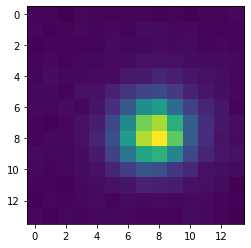

001402-u5-0110(555.75,186.5)


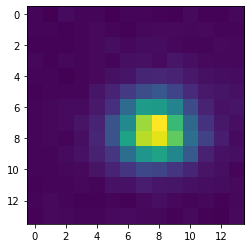

001402-u5-0110(1576.0,514.0)


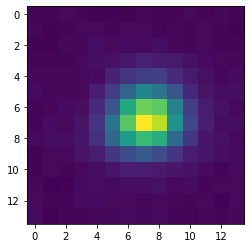

001402-u5-0110(504.5,500.5)


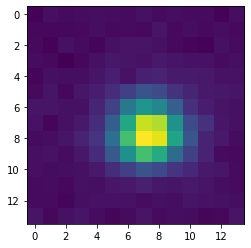

001402-u5-0110(1005.6666870117188,1347.0)


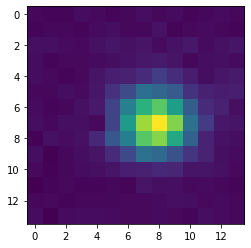

001402-u5-0110(365.3333435058594,143.0)


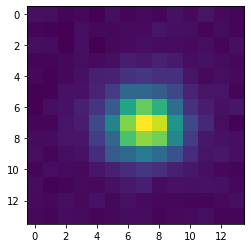

001402-u5-0110(779.0,610.0)


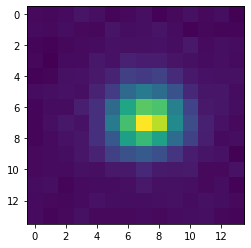

001402-u5-0110(1725.0,571.5)


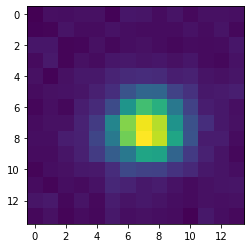

001402-u5-0110(677.5,1193.0)


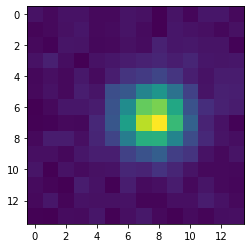

001402-u5-0110(897.0,643.0)


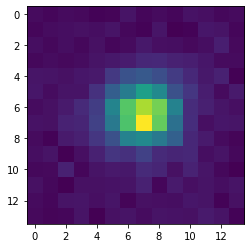

001402-u5-0110(173.0,629.0)


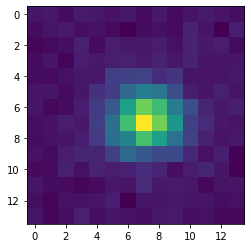

002820-u4-0225(955.0,121.0)


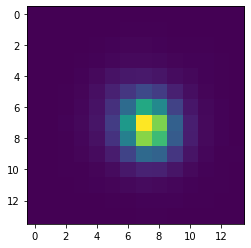

002820-u4-0225(586.5606079101562,528.6514892578125)


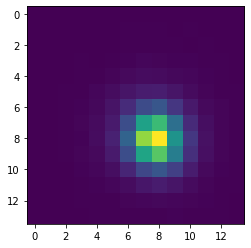

002820-u4-0225(438.1000061035156,496.1000061035156)


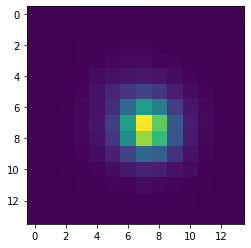

002820-u4-0225(1267.5,248.0)


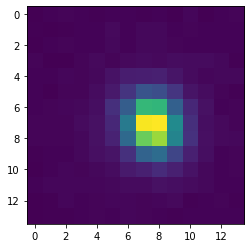

002820-u4-0225(723.5,560.5)


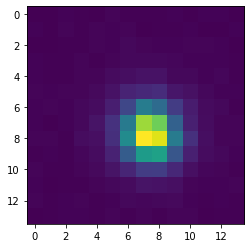

002820-u4-0225(459.8333435058594,1345.5)


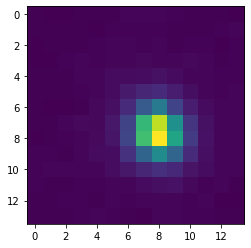

002820-u4-0225(438.5,1065.5)


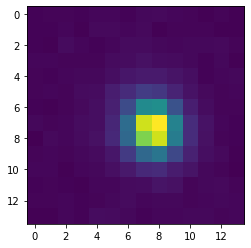

002820-u4-0225(1714.5,1219.5)


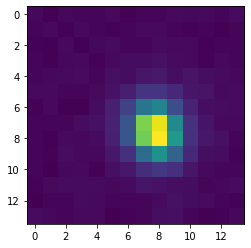

002820-u4-0225(67.0,1393.0)


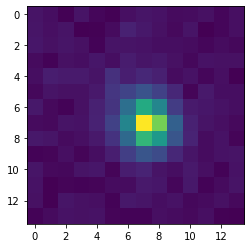

002820-u4-0225(2044.0,952.0)


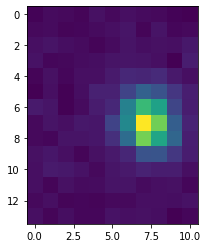

002820-u4-0225(176.5,765.0)


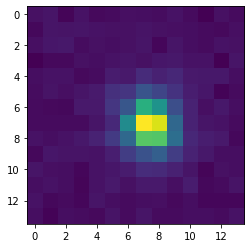

004448-u6-0071(544.9210815429689,257.78945922851557)


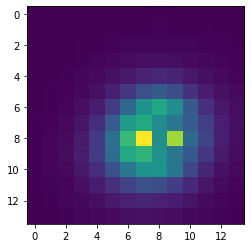

004448-u6-0071(865.6764526367188,364.3235168457031)


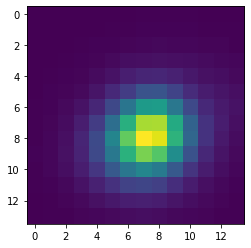

004448-u6-0071(1644.75,1194.375)


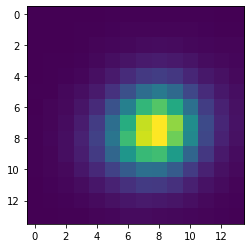

004448-u6-0071(83.65384674072266,269.34616088867193)


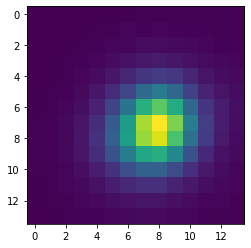

004448-u6-0071(917.8030395507812,1059.9241943359377)


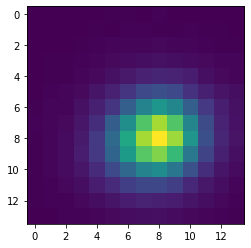

004448-u6-0071(2012.5,705.8333129882812)


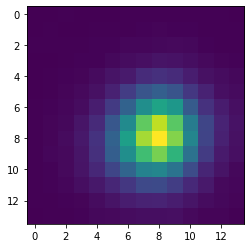

004448-u6-0071(849.5,761.5)


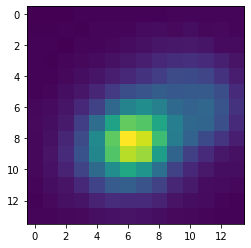

004448-u6-0071(520.5,1300.5)


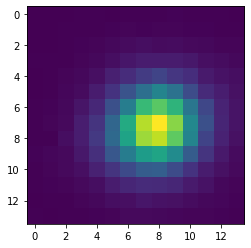

004448-u6-0071(161.0,1066.5)


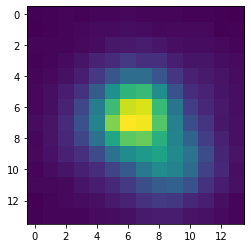

004448-u6-0071(92.0,253.3000030517578)


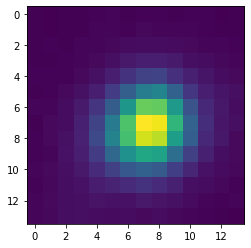

004448-u6-0071(1875.642822265625,1363.9285888671875)


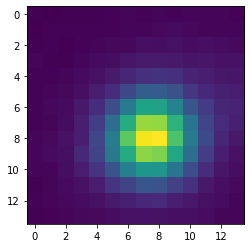

004448-u6-0071(1353.5999755859375,771.4000244140625)


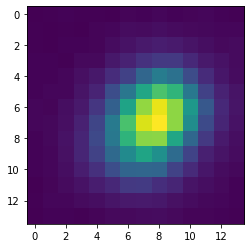

004448-u6-0071(1135.5,467.5)


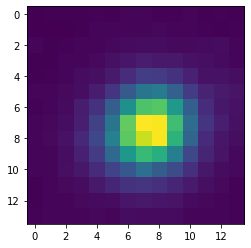

004448-u6-0071(1923.5,1385.75)


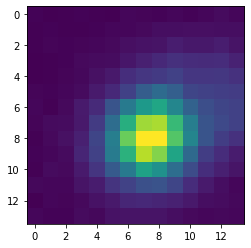

004448-u6-0071(1099.5,352.0)


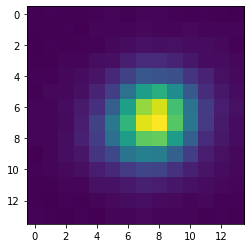

004448-u6-0071(386.5,879.5)


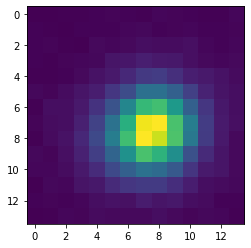

004448-u6-0071(1919.5,166.0)


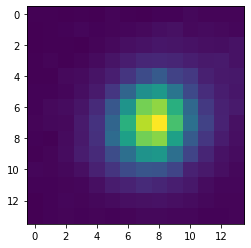

004448-u6-0071(1754.0,1101.0)


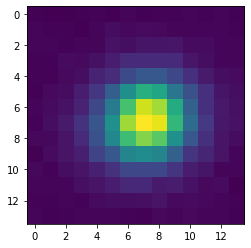

004448-u6-0071(1940.5,552.75)


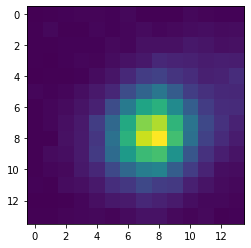

004448-u6-0071(1206.95458984375,253.1363677978516)


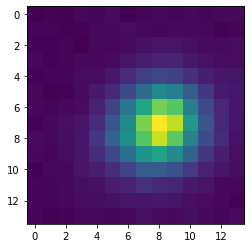

004448-u6-0071(600.0,1415.0)


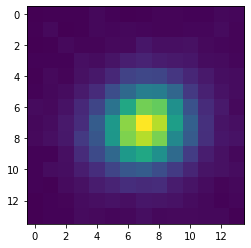

004448-u6-0071(336.5,1191.8333740234375)


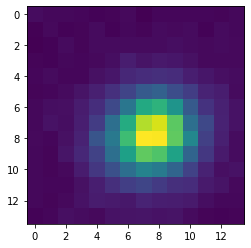

004448-u6-0071(169.5,836.1666870117188)


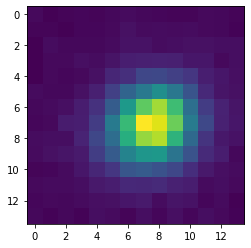

004448-u6-0071(1732.1666259765625,388.5)


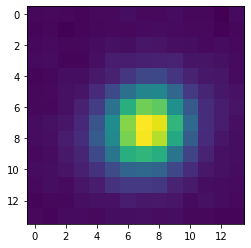

004448-u6-0071(313.29998779296875,344.70001220703125)


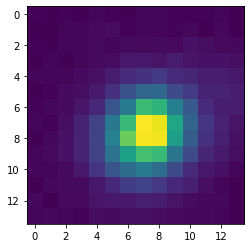

004448-u6-0071(1474.300048828125,58.70000076293945)


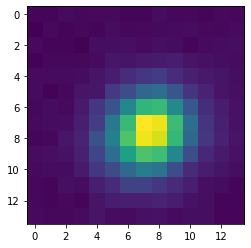

004448-u6-0071(1184.5,306.5)


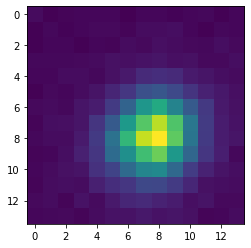

004448-u6-0071(1268.0,419.0)


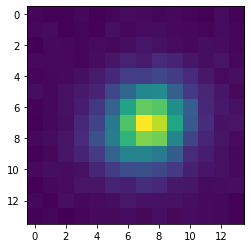

004448-u6-0071(1804.0,187.0)


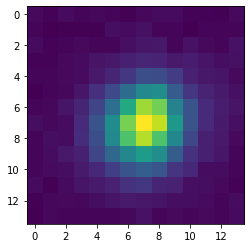

004448-u6-0071(296.0,26.0)


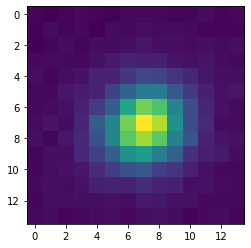

004448-u6-0071(7.75,1343.0)


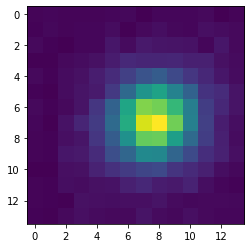

004448-u6-0071(563.0,1304.75)


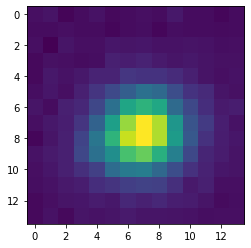

004448-u6-0071(1722.0,1086.75)


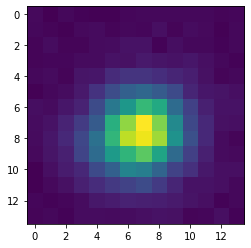

004448-u6-0071(678.5,653.0)


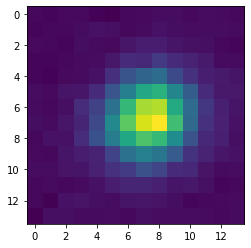

004448-u6-0071(580.0,912.5)


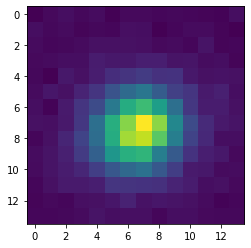

004448-u6-0071(57.5,678.0)


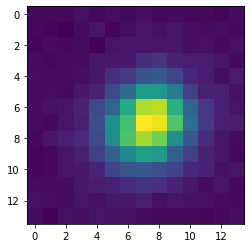

004448-u6-0071(1102.0,215.5)


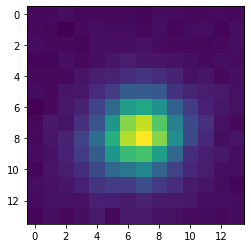

004448-u6-0071(702.5,1363.5)


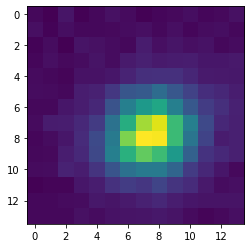

004448-u6-0071(1756.5,740.5)


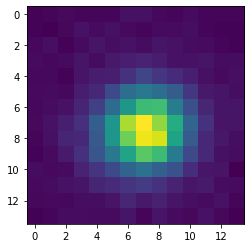

004448-u6-0071(1687.5,76.5)


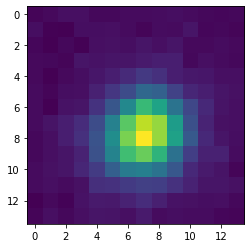

004448-u6-0071(1726.0,903.0)


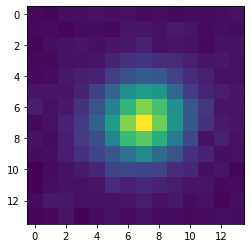

004448-u6-0071(1206.0,0.0)


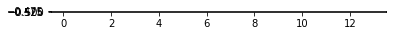

006425-u6-0728(1733.5,920.0)


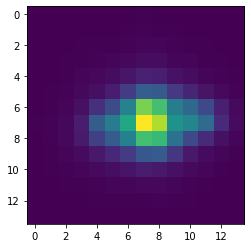

006425-u6-0728(1682.7857666015625,710.2142944335938)


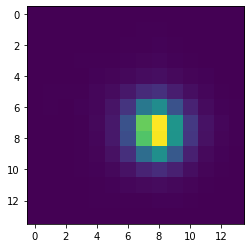

006425-u6-0728(1227.0,898.5)


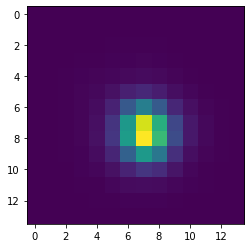

006425-u6-0728(923.5,511.5)


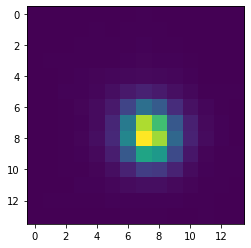

006425-u6-0728(1523.34619140625,304.1153869628906)


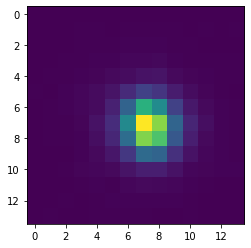

006425-u6-0728(39.35714340209961,902.7142944335938)


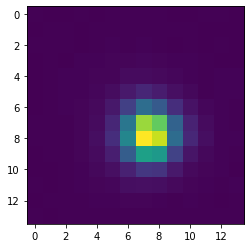

006425-u6-0728(1505.5,817.25)


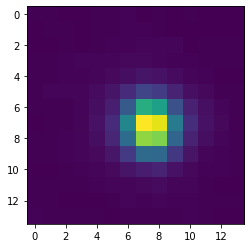

006425-u6-0728(579.8333129882812,1124.5)


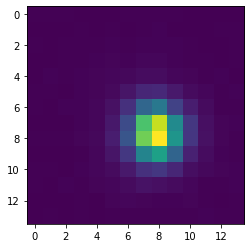

006425-u6-0728(920.5,597.8333129882812)


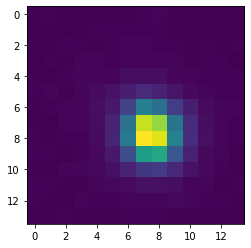

006425-u6-0728(795.5,1422.5)


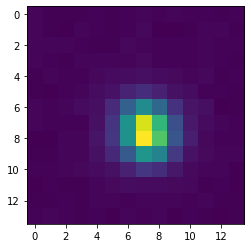

006425-u6-0728(921.75,755.0)


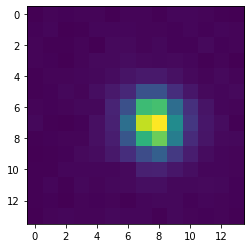

006425-u6-0728(1784.1666259765625,328.1666564941406)


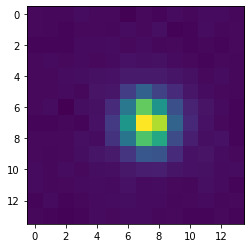

006425-u6-0728(270.5,818.5)


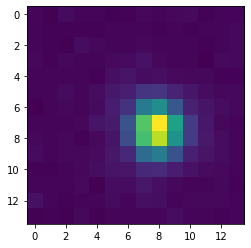

006425-u6-0728(2042.0,1341.0)


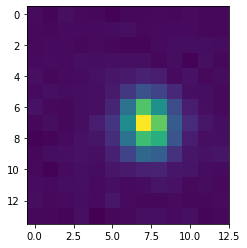

006425-u6-0728(521.0,568.5)


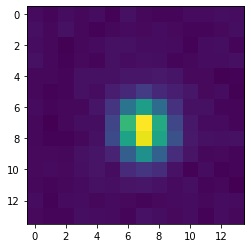

006425-u6-0728(941.0,247.0)


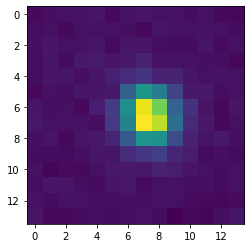

006425-u6-0728(1739.0,245.5)


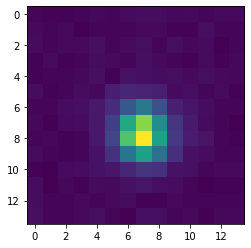

002248-u6-0195(643.8499755859375,657.0)


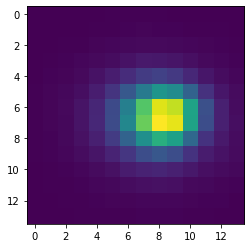

002248-u6-0195(211.5,1387.0)


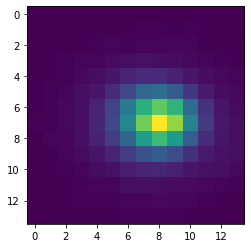

002248-u6-0195(902.3571166992188,1251.5)


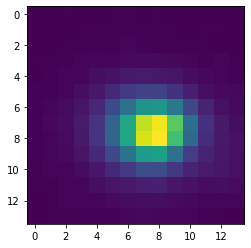

002248-u6-0195(1962.0,251.0)


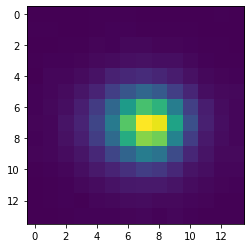

002248-u6-0195(1853.1666259765625,849.5)


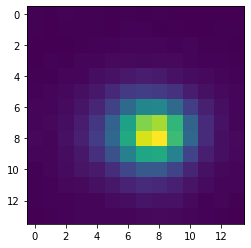

002248-u6-0195(1154.0,644.0)


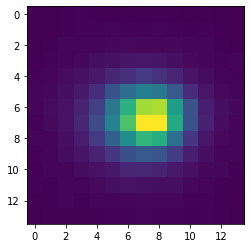

002248-u6-0195(1856.5,152.0)


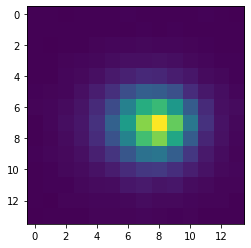

002248-u6-0195(1511.0,320.0)


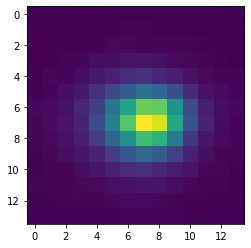

002248-u6-0195(158.09091186523438,1278.04541015625)


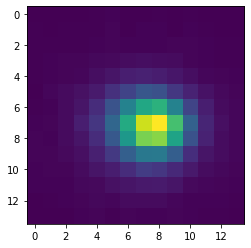

002248-u6-0195(1908.9705810546875,988.6764526367188)


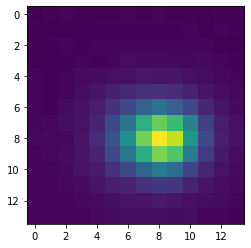

002248-u6-0195(593.5,146.5)


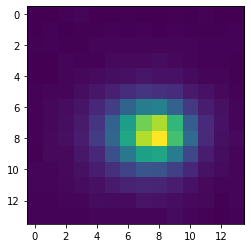

002248-u6-0195(1306.5,1360.0)


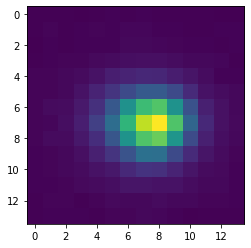

002248-u6-0195(89.0,1366.0)


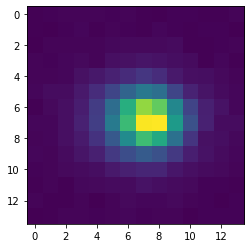

002248-u6-0195(158.0,1116.0)


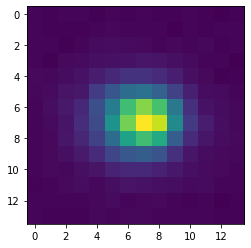

002248-u6-0195(471.0,680.5)


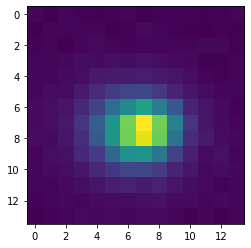

002248-u6-0195(752.0,688.5)


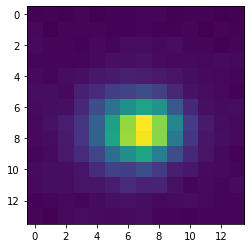

002248-u6-0195(323.3571472167969,357.78570556640625)


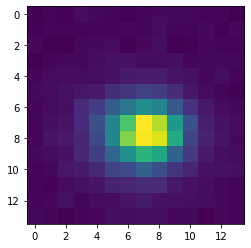

002248-u6-0195(1206.0,907.0)


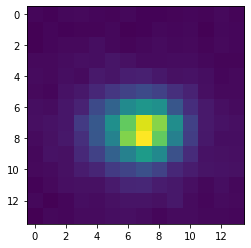

002248-u6-0195(715.5,1077.5)


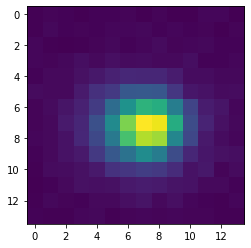

002248-u6-0195(1879.5,46.5)


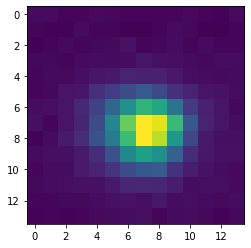

002248-u6-0195(1221.5,1327.5)


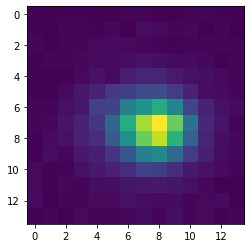

002248-u6-0195(60.0,49.75)


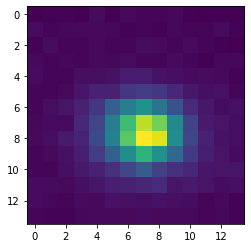

002248-u6-0195(326.0,742.5)


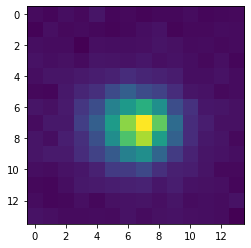

002248-u6-0195(957.5,1395.5)


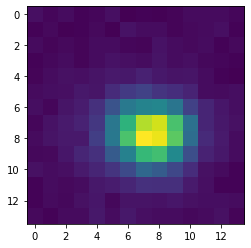

002248-u6-0195(1181.0,629.0)


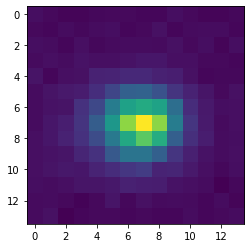

002248-u6-0195(834.5,608.5)


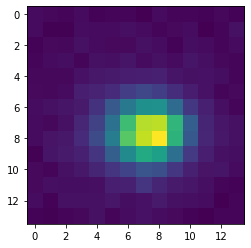

005137-u6-0136(1530.5625,477.796875)


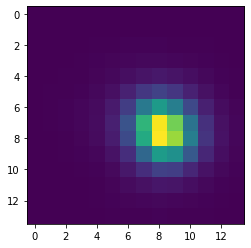

005137-u6-0136(663.2999877929688,1150.5)


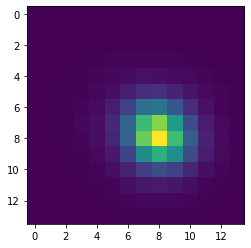

005137-u6-0136(521.0319213867189,45.32978820800781)


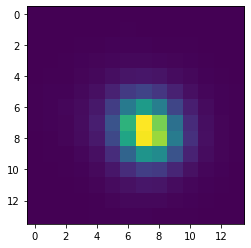

005137-u6-0136(61.5,1100.5)


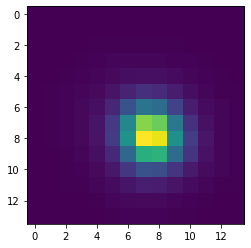

005137-u6-0136(1107.5625,136.875)


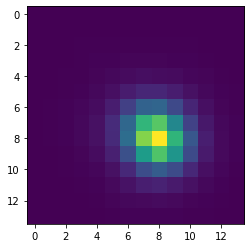

005137-u6-0136(1085.0555419921877,429.77777099609375)


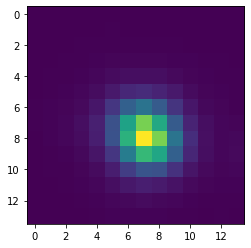

005137-u6-0136(1137.0,1439.5)


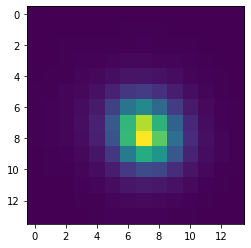

005137-u6-0136(1741.6666259765625,685.3333129882812)


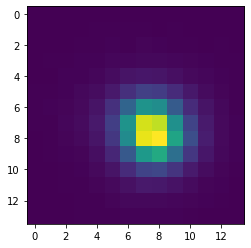

005137-u6-0136(1755.6514892578125,669.5606079101562)


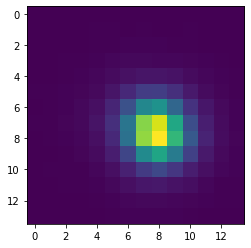

005137-u6-0136(1743.0909423828125,894.1818237304688)


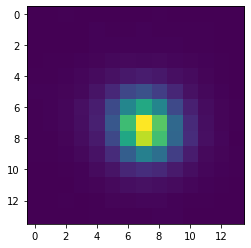

005137-u6-0136(562.5,224.5)


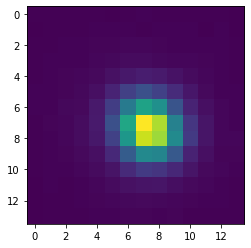

005137-u6-0136(489.8333435058594,690.5)


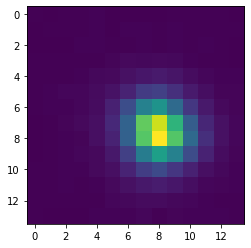

005137-u6-0136(1219.2857666015625,61.64285659790039)


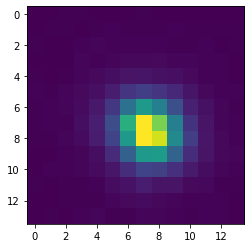

005137-u6-0136(301.0,106.0)


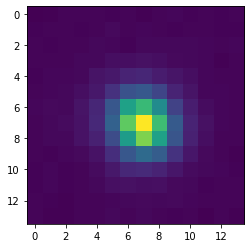

005137-u6-0136(552.0,524.0)


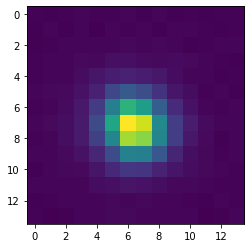

005137-u6-0136(1093.5,431.1666564941406)


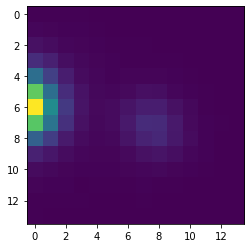

005137-u6-0136(29.5,747.5)


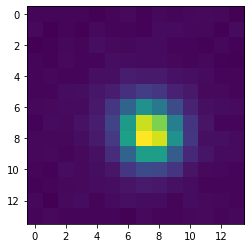

005137-u6-0136(124.0,417.5)


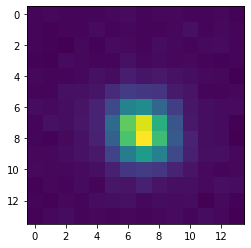

005137-u6-0136(29.5,999.5)


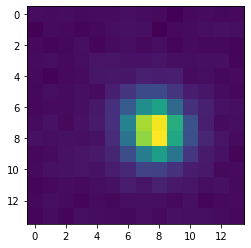

005137-u6-0136(1125.5,463.5)


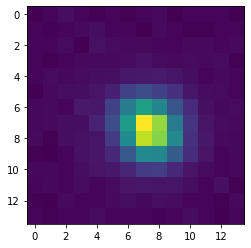

005137-u6-0136(1979.5,201.5)


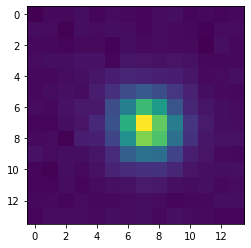

005137-u6-0136(424.5,1022.5)


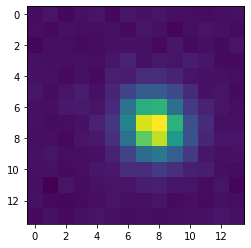

005137-u6-0136(1375.5,551.5)


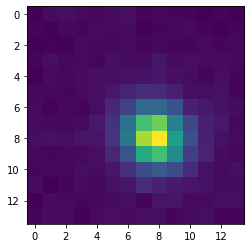

005137-u6-0136(1954.0,1273.5)


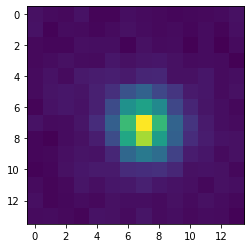

005137-u6-0136(1869.0,1094.0)


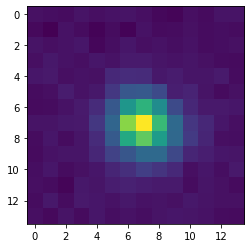

005137-u6-0136(437.0,957.0)


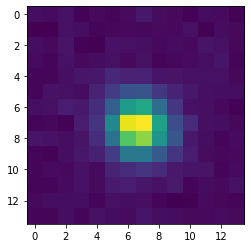

002328-u3-0131(594.5,1171.9000244140625)


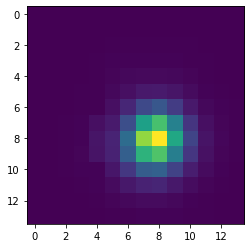

002328-u3-0131(1100.5,226.5)


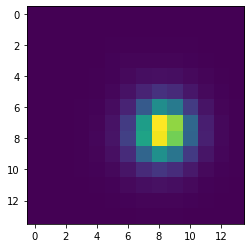

002328-u3-0131(1719.0,397.0)


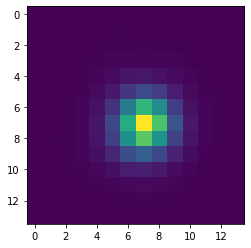

002328-u3-0131(721.2000122070312,363.20001220703125)


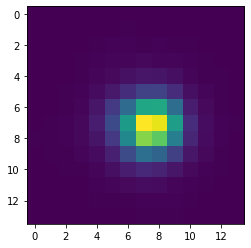

002328-u3-0131(1220.0,1160.0)


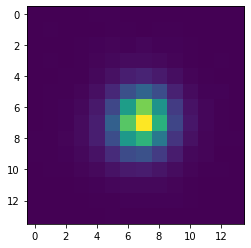

002328-u3-0131(395.5,461.5)


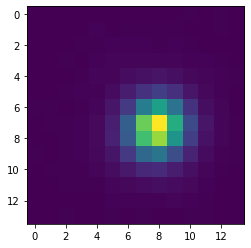

002328-u3-0131(600.5,614.75)


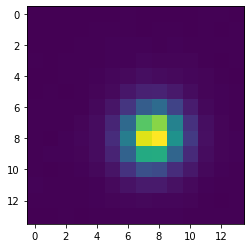

002328-u3-0131(351.0,812.375)


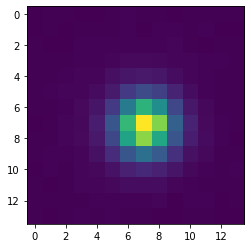

002328-u3-0131(1470.0,925.4000244140624)


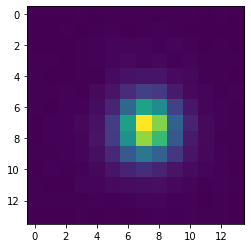

002328-u3-0131(117.5,169.5)


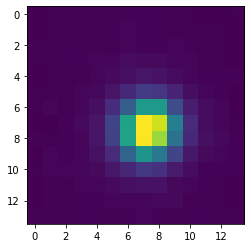

002328-u3-0131(818.5,1364.5)


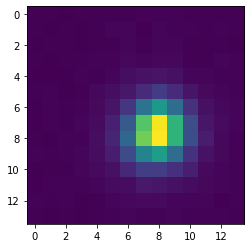

002328-u3-0131(537.3461303710939,896.1153564453125)


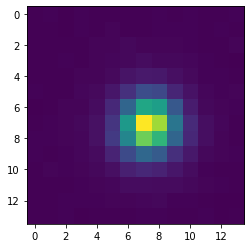

002328-u3-0131(797.0,966.0)


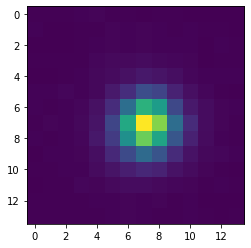

002328-u3-0131(341.5,853.25)


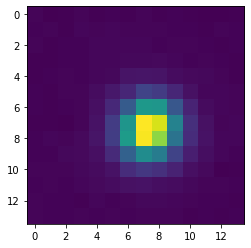

002328-u3-0131(905.0,547.5)


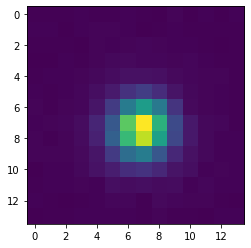

002328-u3-0131(65.04545593261719,107.86363983154295)


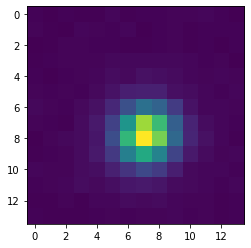

002328-u3-0131(927.5,1303.1666259765625)


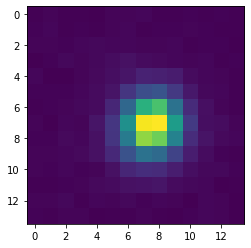

002328-u3-0131(1398.1666259765625,1075.5)


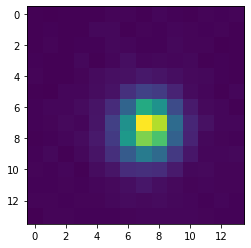

002328-u3-0131(1459.699951171875,530.2999877929689)


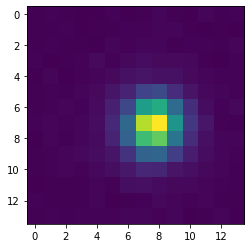

002328-u3-0131(989.5,207.5)


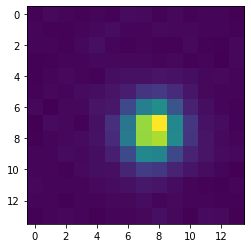

002328-u3-0131(1216.5,814.5)


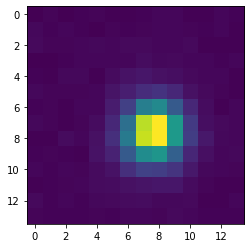

002328-u3-0131(1875.0,574.5)


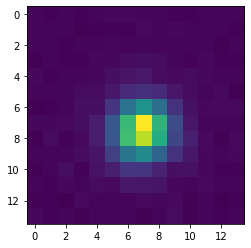

002328-u3-0131(233.5,942.0)


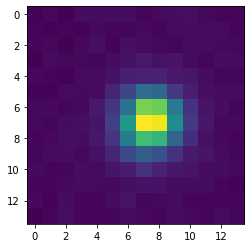

002328-u3-0131(1765.3333740234375,744.0)


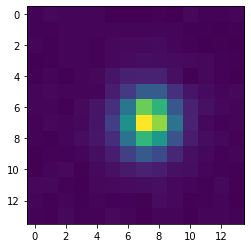

002328-u3-0131(1103.5,306.5)


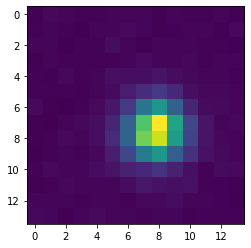

002328-u3-0131(1389.0,373.0)


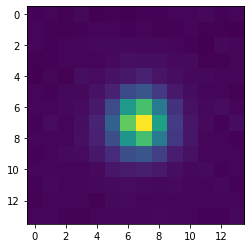

002328-u3-0131(750.75,1177.0)


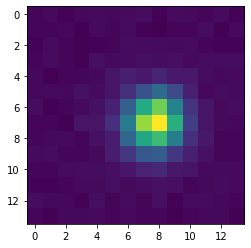

002328-u3-0131(315.1666564941406,1001.8333129882812)


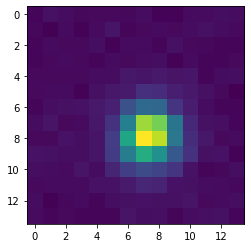

002328-u3-0131(1005.8333129882812,976.1666870117188)


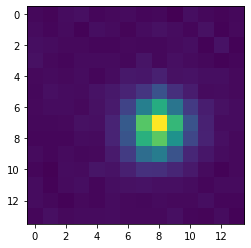

002328-u3-0131(57.0,616.5)


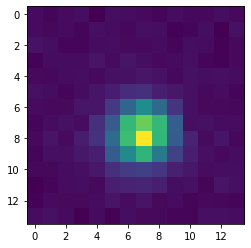

002328-u3-0131(1753.5,599.0)


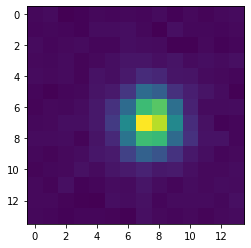

002328-u3-0131(743.5,1464.5)


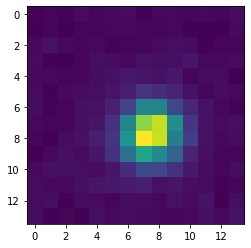

002328-u3-0131(674.5,1450.5)


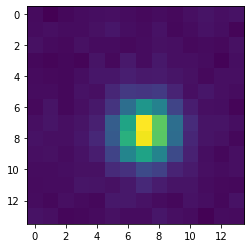

002328-u3-0131(1451.5,857.5)


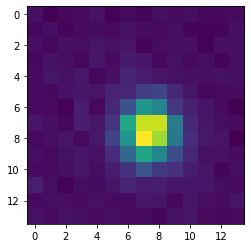

002328-u3-0131(311.5,489.5)


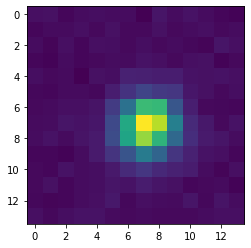

002328-u3-0131(215.0,1332.5)


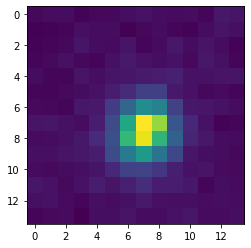

002328-u3-0131(1604.0,1202.0)


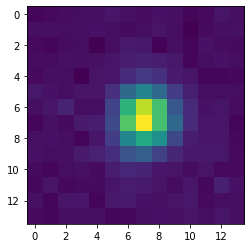

002328-u3-0131(504.0,729.0)


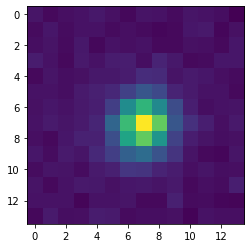

002328-u3-0131(1085.0,711.0)


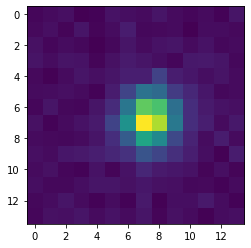

002328-u3-0131(635.5,705.0)


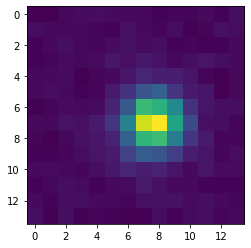

002328-u3-0131(825.0,658.0)


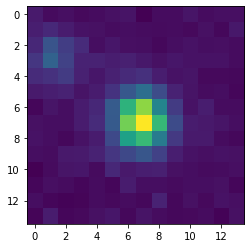

002328-u3-0131(329.0,406.0)


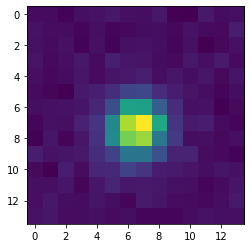

002328-u3-0131(391.0,334.5)


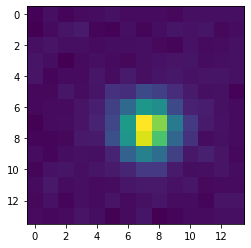

003643-u1-0053(798.9285888671875,232.35714721679688)


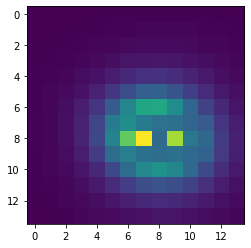

003643-u1-0053(227.26470947265625,218.3823547363281)


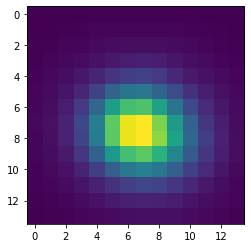

003643-u1-0053(331.0,952.0)


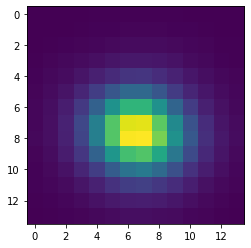

003643-u1-0053(178.92308044433594,652.0)


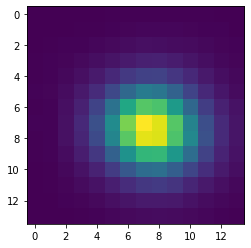

003643-u1-0053(1854.9927978515625,423.47100830078125)


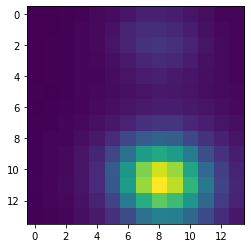

003643-u1-0053(907.0,328.0)


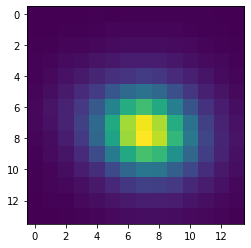

003643-u1-0053(96.16666412353516,1130.0)


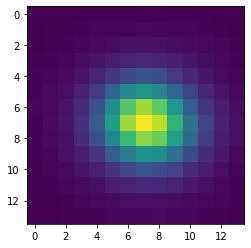

003643-u1-0053(276.5,498.0)


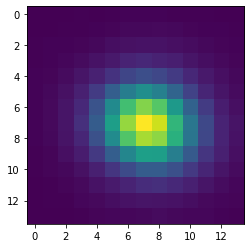

003643-u1-0053(308.68182373046875,16.5)


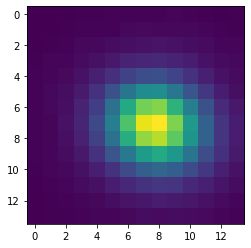

003643-u1-0053(1416.105224609375,1117.368408203125)


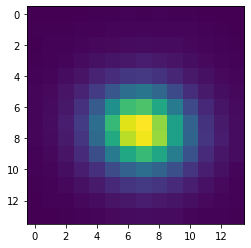

003643-u1-0053(454.0,861.5)


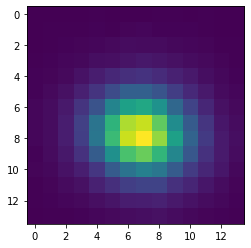

003643-u1-0053(524.388916015625,1431.5)


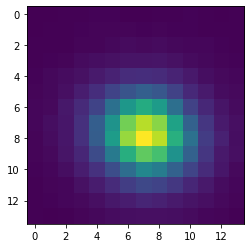

003643-u1-0053(477.0,750.5)


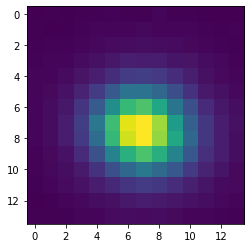

003643-u1-0053(1039.87841796875,622.8243408203125)


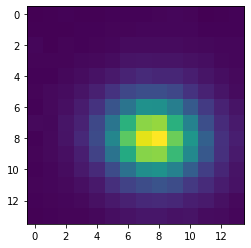

003643-u1-0053(536.0555419921875,8.777777671813965)


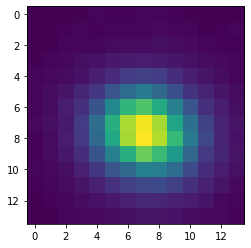

003643-u1-0053(477.5,705.0)


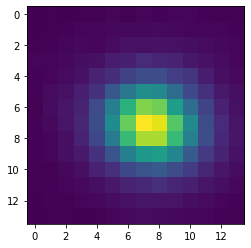

003643-u1-0053(904.7413940429688,720.8103637695312)


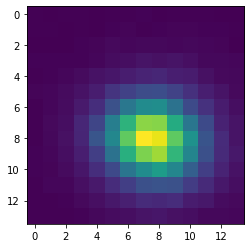

003643-u1-0053(1667.5,634.5)


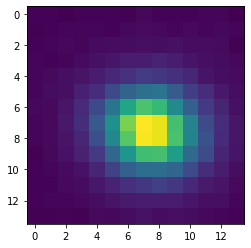

003643-u1-0053(1557.5,1059.5)


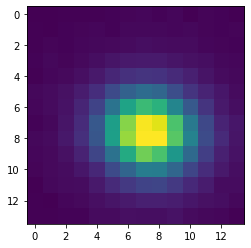

003643-u1-0053(1608.5,180.0)


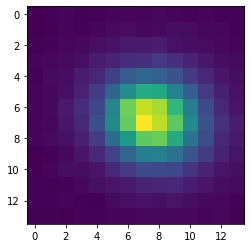

003643-u1-0053(1599.0,1295.0)


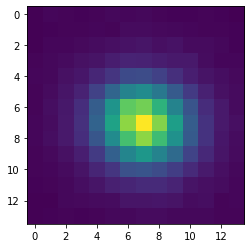

003643-u1-0053(1075.5,1345.0)


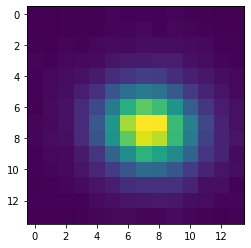

003643-u1-0053(201.625,635.5625)


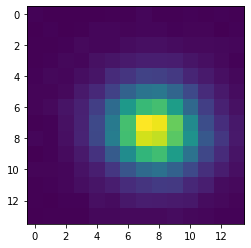

003643-u1-0053(1367.642822265625,549.5)


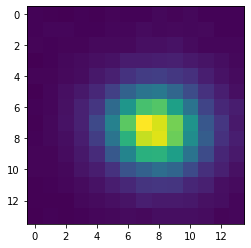

003643-u1-0053(687.0,581.5)


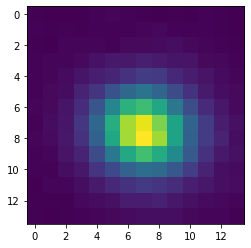

003643-u1-0053(910.5,801.5)


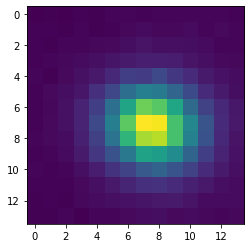

003643-u1-0053(201.73077392578125,115.80769348144531)


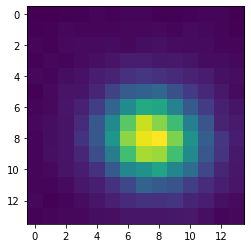

003643-u1-0053(1702.9000244140625,568.0999755859375)


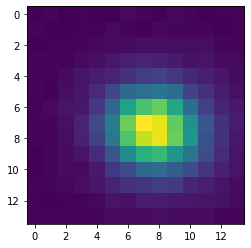

003643-u1-0053(1125.0,68.5)


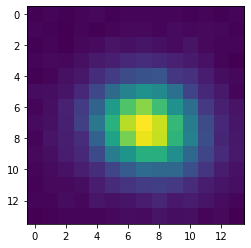

003643-u1-0053(1774.27783203125,1480.5555419921875)


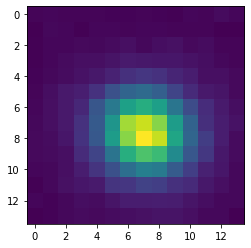

003643-u1-0053(761.7857055664062,1290.7857666015625)


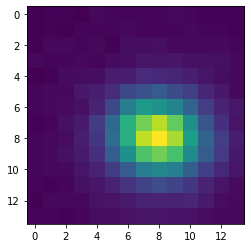

003643-u1-0053(1961.2142333984373,849.2142944335938)


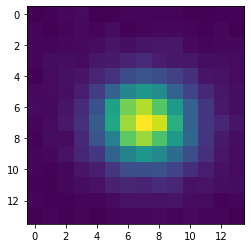

003643-u1-0053(523.7857055664061,384.7857055664063)


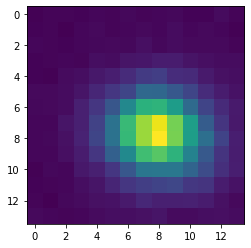

003643-u1-0053(964.0,1078.0)


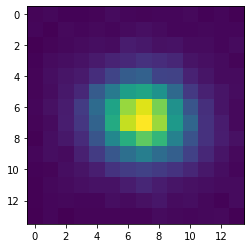

003643-u1-0053(1013.7142944335938,852.6428833007812)


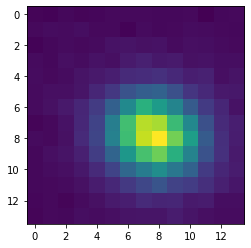

003643-u1-0053(1891.5,226.5)


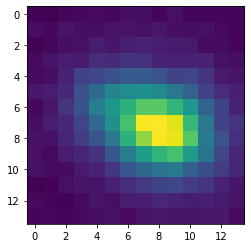

003643-u1-0053(284.0,666.0)


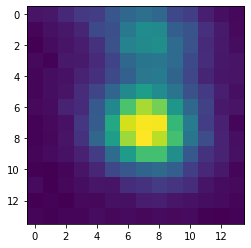

003643-u1-0053(1413.75,719.5)


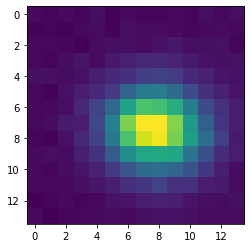

003643-u1-0053(49.5,298.5)


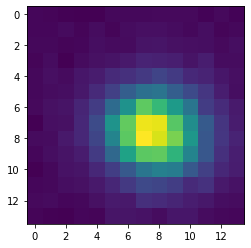

003643-u1-0053(1345.0,1283.0)


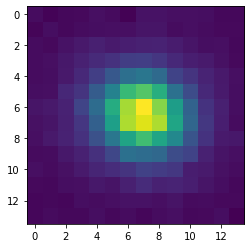

003643-u1-0053(1159.0,1092.0)


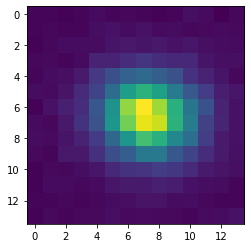

003643-u1-0053(1979.75,380.5)


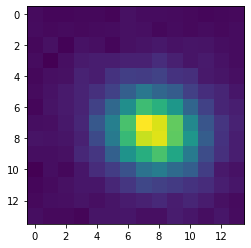

003643-u1-0053(1580.8636474609375,657.9545288085938)


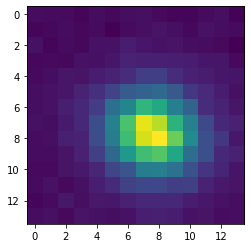

003643-u1-0053(584.5,217.1666717529297)


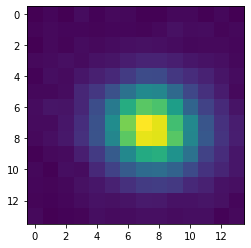

003643-u1-0053(1168.699951171875,979.7000122070312)


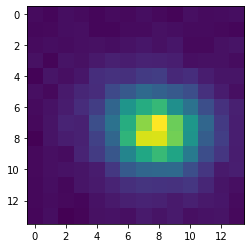

003643-u1-0053(1801.699951171875,655.7000122070312)


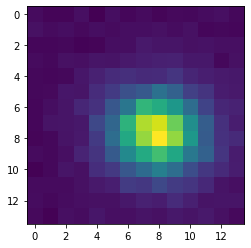

003643-u1-0053(578.5,1346.8333740234375)


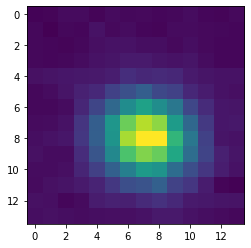

003643-u1-0053(1394.0,325.5)


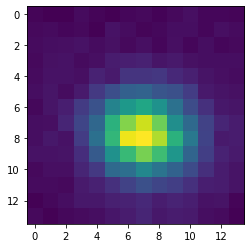

003643-u1-0053(164.5,1022.5)


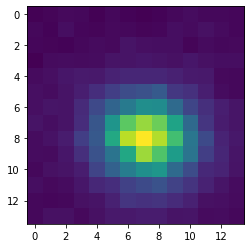

003643-u1-0053(578.5,924.5)


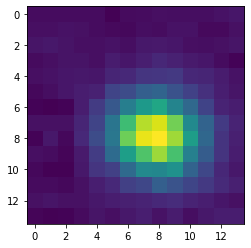

003643-u1-0053(2011.0,205.5)


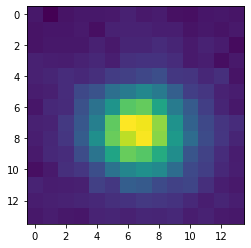

003643-u1-0053(692.0,667.5)


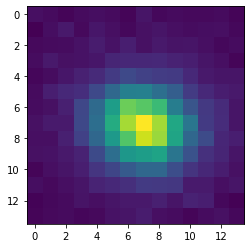

003643-u1-0053(1789.0,481.5)


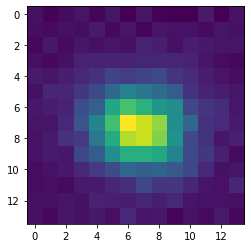

003643-u1-0053(450.5,1227.5)


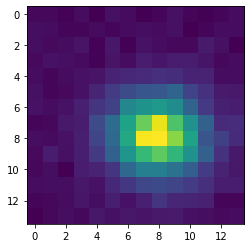

003643-u1-0053(1647.5,548.5)


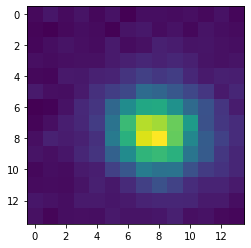

003643-u1-0053(1520.0,1029.0)


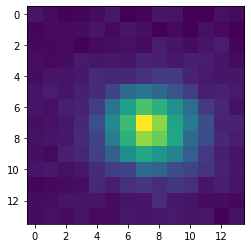

003643-u1-0053(1914.0,823.0)


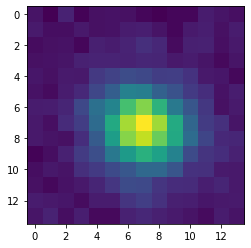

001895-u6-0228(191.4038391113281,843.1923217773438)


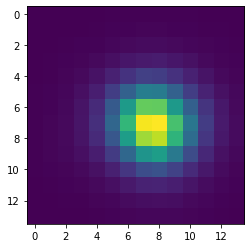

001895-u6-0228(2040.560546875,175.34848022460938)


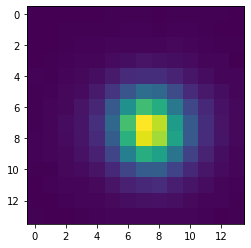

001895-u6-0228(509.5,811.25)


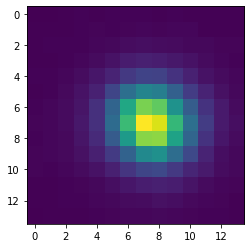

001895-u6-0228(1683.0714111328125,488.3571472167969)


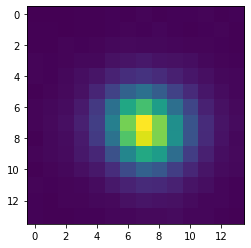

001895-u6-0228(1183.0,1300.0)


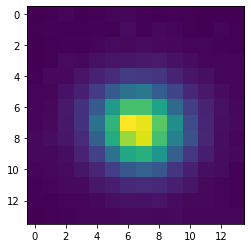

001895-u6-0228(943.25,832.75)


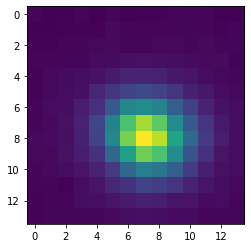

001895-u6-0228(879.0,532.5)


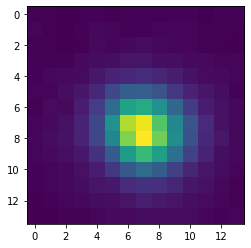

001895-u6-0228(1358.1666259765625,322.1666564941406)


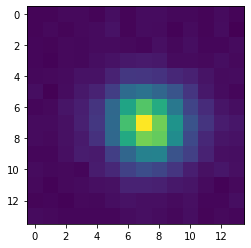

005731-u2-0071(460.5,992.6428833007812)


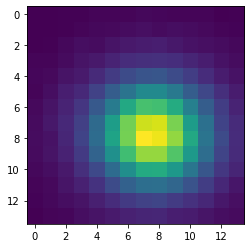

005731-u2-0071(801.4354858398438,532.1774291992189)


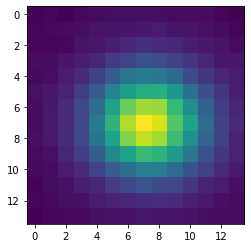

005731-u2-0071(733.6818237304688,758.5)


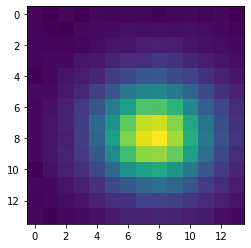

005731-u2-0071(1975.5,14.5)


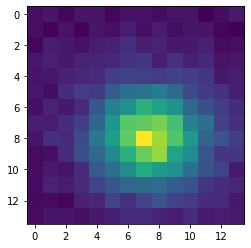

005731-u2-0071(774.1842041015625,1374.605224609375)


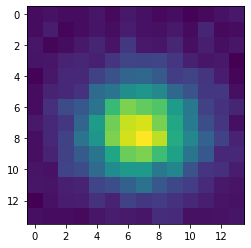

005731-u2-0071(1989.0,698.0)


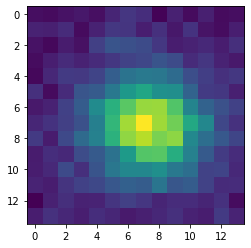

005731-u2-0071(1613.0,535.75)


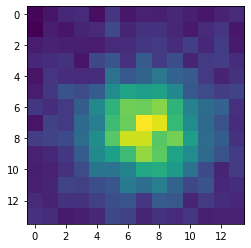

005731-u2-0071(137.5,836.5)


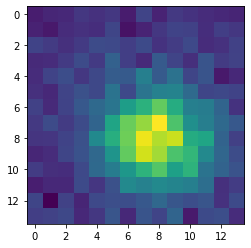

003818-u6-0055(690.0,1389.0)


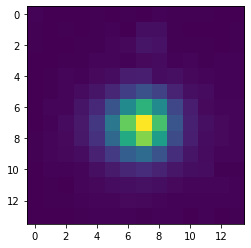

003818-u6-0055(956.0,891.375)


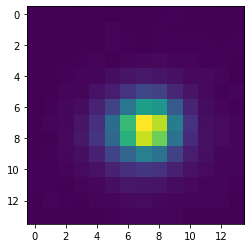

003818-u6-0055(605.0,967.0)


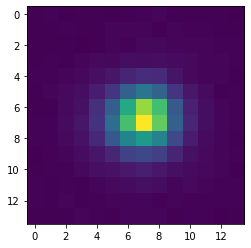

003818-u6-0055(51.0,653.0)


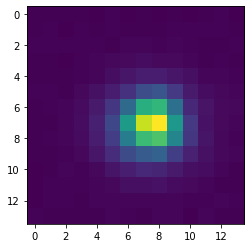

003818-u6-0055(306.0,1480.5)


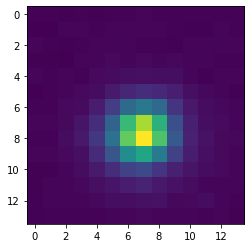

003818-u6-0055(824.125,1373.0)


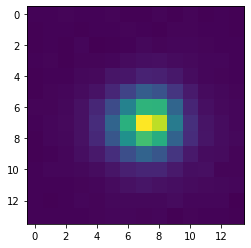

003818-u6-0055(1864.300048828125,10.699999809265137)


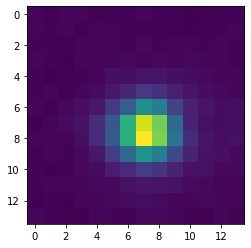

003818-u6-0055(1913.75,72.25)


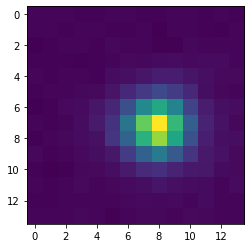

003818-u6-0055(2008.75,1222.0)


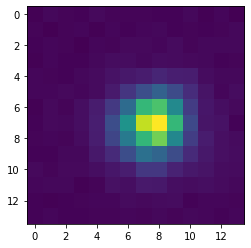

003818-u6-0055(1656.1666259765625,213.8333282470703)


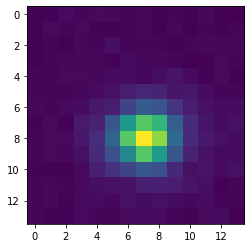

003818-u6-0055(1586.5,1145.5)


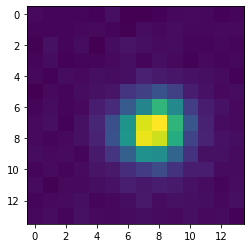

003818-u6-0055(1765.5,681.5)


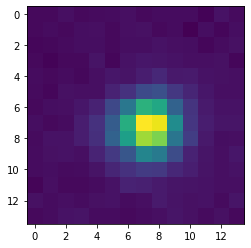

001478-u3-0111(1148.61767578125,53.79411697387695)


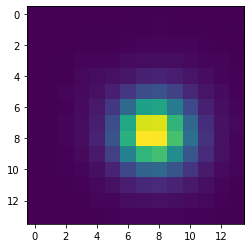

001478-u3-0111(95.5,516.5)


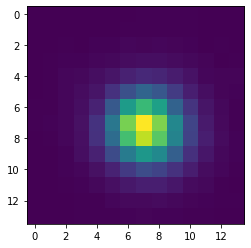

001478-u3-0111(15.199999809265135,1317.800048828125)


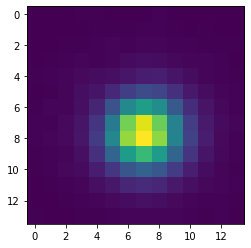

001478-u3-0111(1740.8809814453125,950.40478515625)


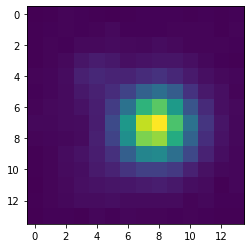

001478-u3-0111(1424.5,153.5)


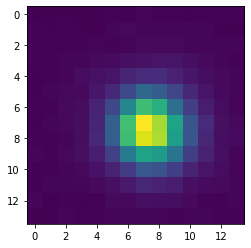

001478-u3-0111(1937.5,1451.5)


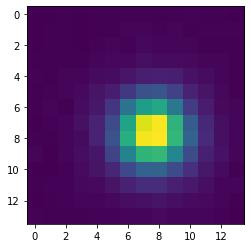

001478-u3-0111(305.5,76.5)


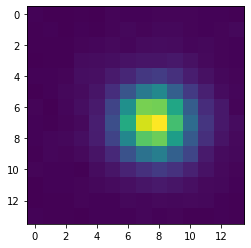

001478-u3-0111(1978.357177734375,513.3571166992189)


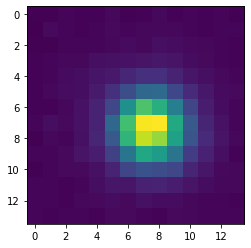

001478-u3-0111(1940.0,1401.5)


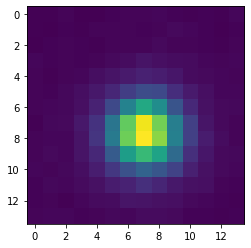

001478-u3-0111(1885.7857666015625,693.7857055664062)


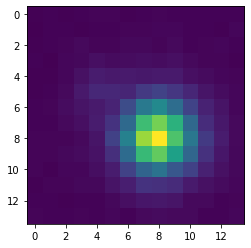

001478-u3-0111(1803.0,1343.0)


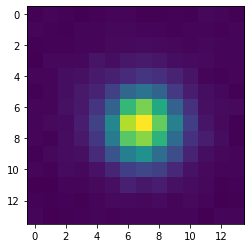

001478-u3-0111(1593.8333740234375,122.16666412353516)


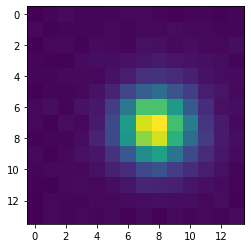

001478-u3-0111(1436.25,991.25)


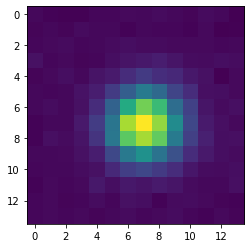

001478-u3-0111(1050.6666259765623,886.0)


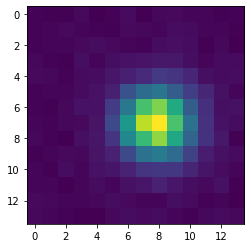

001478-u3-0111(1394.0,1048.5)


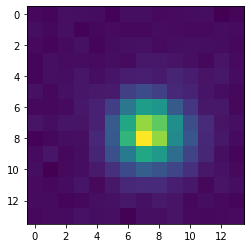

001478-u3-0111(1127.0,775.5)


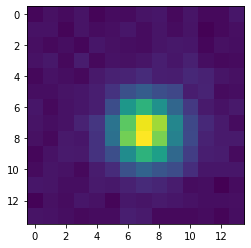

001478-u3-0111(1158.5,1140.5)


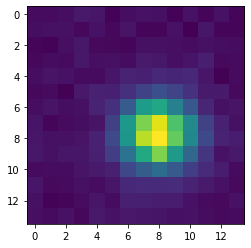

001478-u3-0111(1064.0,913.0)


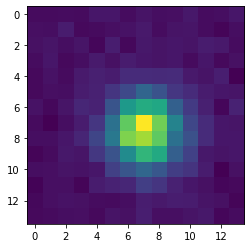

006597-u6-0032(73.90908813476562,25.47727203369141)


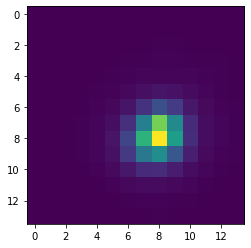

006597-u6-0032(113.5,1219.5)


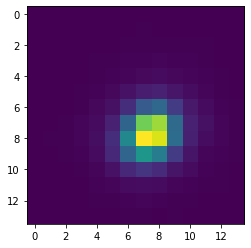

006597-u6-0032(1445.0833740234375,1402.9166259765625)


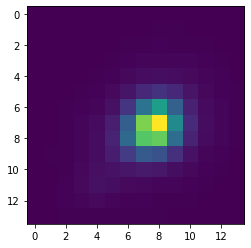

006597-u6-0032(619.5,1354.5)


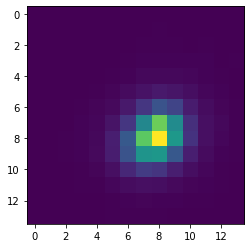

006597-u6-0032(646.9483032226562,822.2586059570312)


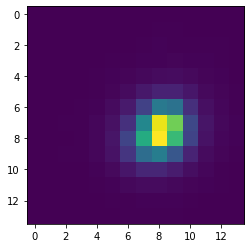

006597-u6-0032(300.0,624.0)


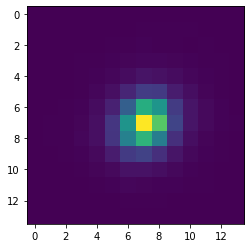

006597-u6-0032(647.5,1137.0)


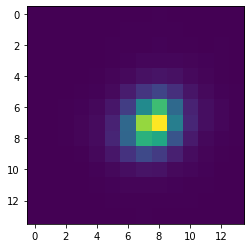

006597-u6-0032(1016.5,1149.5)


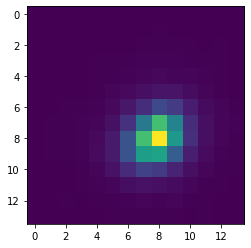

006597-u6-0032(213.35714721679688,780.6428833007812)


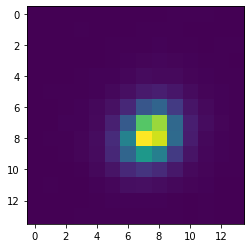

006597-u6-0032(966.2142944335938,971.7857055664062)


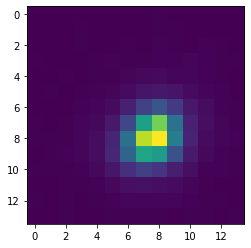

006597-u6-0032(388.0,765.0)


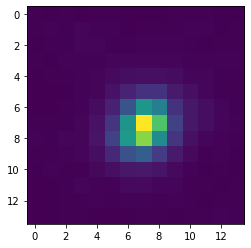

006597-u6-0032(1683.300048828125,988.2999877929688)


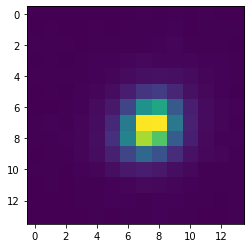

006597-u6-0032(520.5,1457.0)


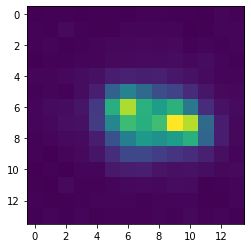

006597-u6-0032(1430.0,587.0)


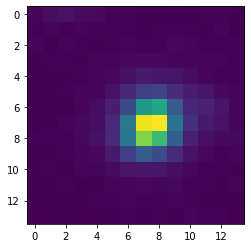

006597-u6-0032(144.5,299.0)


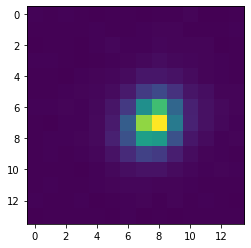

006597-u6-0032(1156.0,765.0)


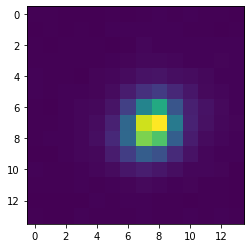

006597-u6-0032(1147.0,337.5)


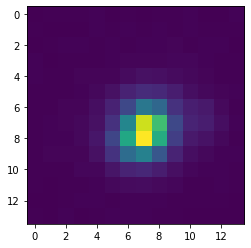

006597-u6-0032(842.5,1092.5)


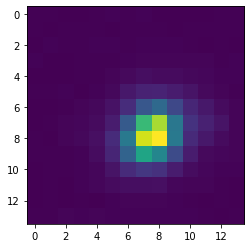

006597-u6-0032(1699.300048828125,1028.699951171875)


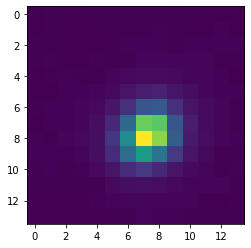

006597-u6-0032(31.70000076293945,610.2999877929688)


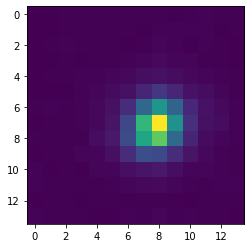

006597-u6-0032(1632.0,376.75)


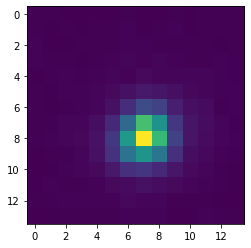

006597-u6-0032(350.29998779296875,267.70001220703125)


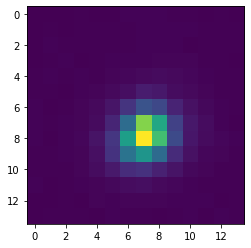

006597-u6-0032(1117.699951171875,534.2999877929689)


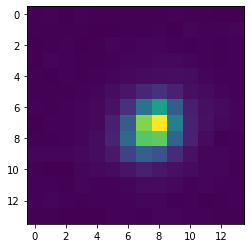

006597-u6-0032(1588.0,1023.3333129882812)


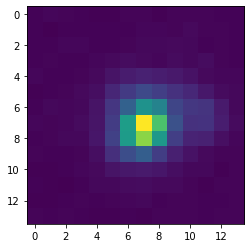

006597-u6-0032(102.5,697.0)


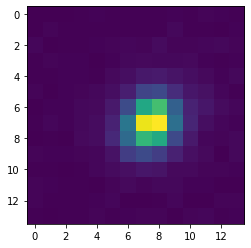

006597-u6-0032(346.5,1399.5)


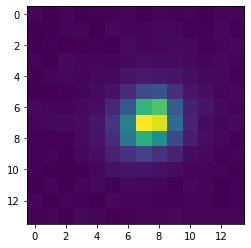

006597-u6-0032(1050.5,1015.5)


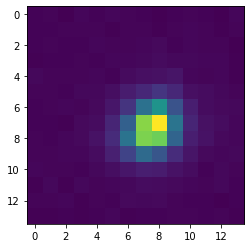

006597-u6-0032(498.5,840.5)


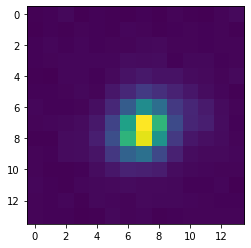

006597-u6-0032(1523.5,397.5)


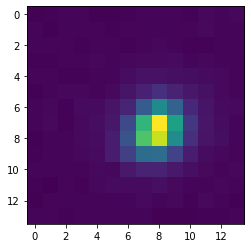

006597-u6-0032(2002.5,935.0)


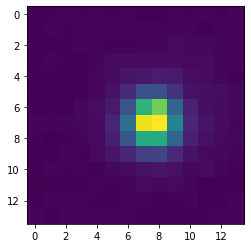

006597-u6-0032(1329.0,818.0)


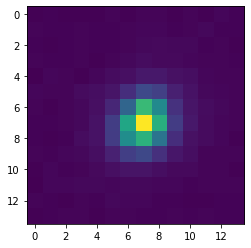

006597-u6-0032(1734.0,567.0)


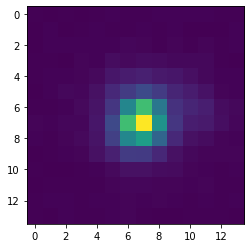

006597-u6-0032(635.0,699.0)


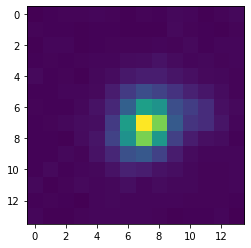

006597-u6-0032(164.0,521.0)


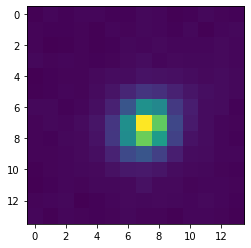

006597-u6-0032(1441.0,509.0)


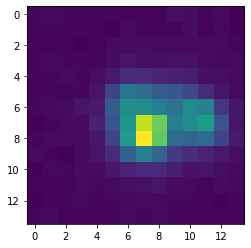

006597-u6-0032(1282.75,1261.0)


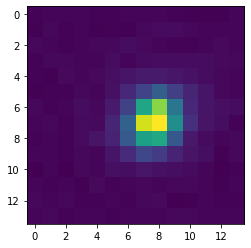

006597-u6-0032(483.0,1160.75)


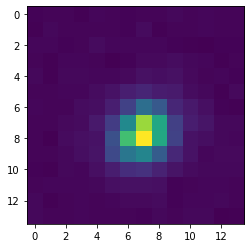

006597-u6-0032(836.0,1068.75)


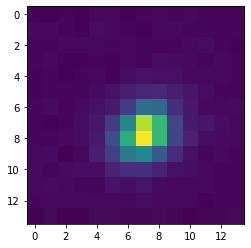

006597-u6-0032(1136.5,355.5)


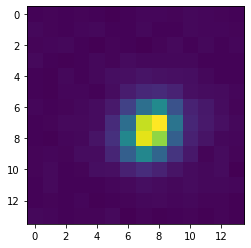

006597-u6-0032(1089.25,21.0)


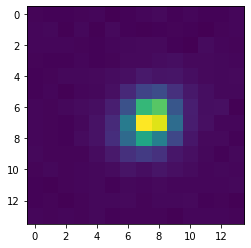

006597-u6-0032(1356.5,1386.0)


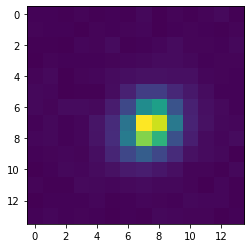

006597-u6-0032(1005.5,842.0)


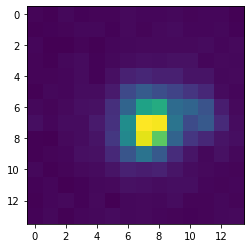

006597-u6-0032(1172.0,732.0)


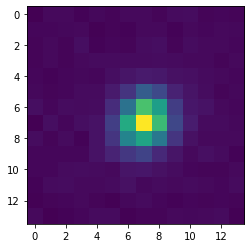

006597-u6-0032(1411.5,574.0)


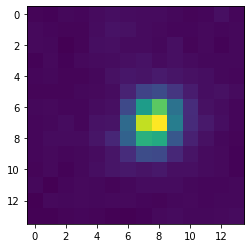

006597-u6-0032(532.5,569.0)


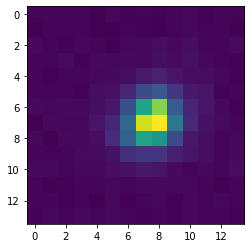

006597-u6-0032(1773.0,255.5)


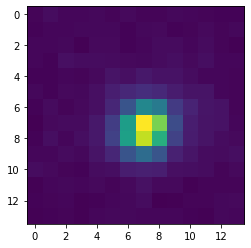

006597-u6-0032(1516.5,1085.0)


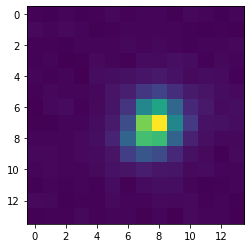

006597-u6-0032(486.0,980.5)


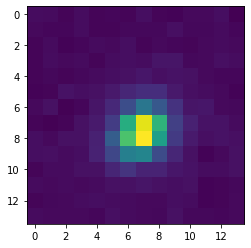

006597-u6-0032(288.5,928.0)


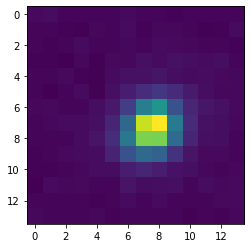

006597-u6-0032(142.0,460.5)


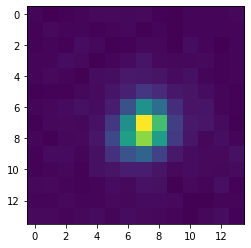

006597-u6-0032(350.5,1301.5)


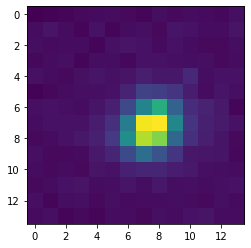

006597-u6-0032(597.0,1218.0)


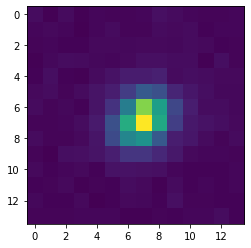

006597-u6-0032(143.5,877.0)


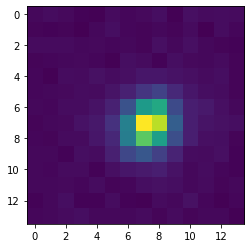

006597-u6-0032(19.5,700.5)


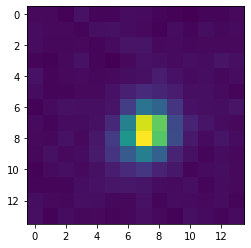

006597-u6-0032(923.5,943.5)


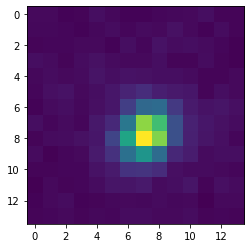

006597-u6-0032(1108.5,817.5)


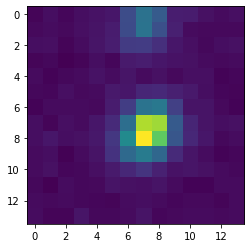

006597-u6-0032(579.5,629.5)


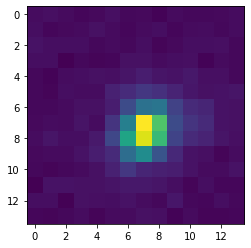

006597-u6-0032(1444.5,508.5)


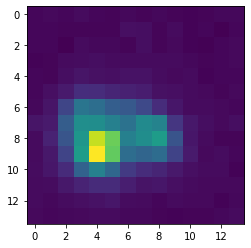

006597-u6-0032(1335.5,360.5)


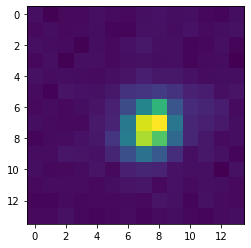

006597-u6-0032(243.0,1488.0)


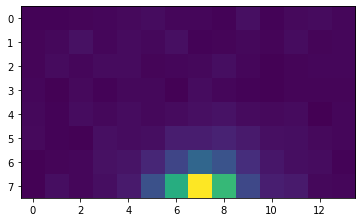

006597-u6-0032(1406.0,1484.0)


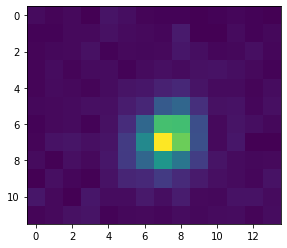

006597-u6-0032(115.0,1352.0)


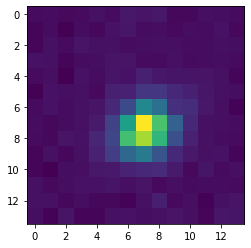

006597-u6-0032(1119.0,1284.0)


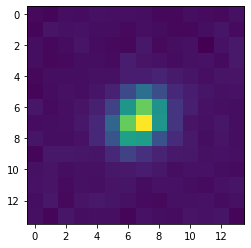

006597-u6-0032(1988.0,1200.0)


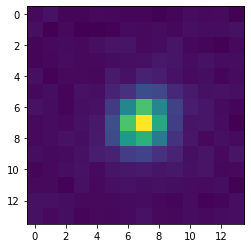

006597-u6-0032(1184.5,1136.0)


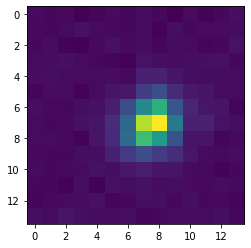

006597-u6-0032(1176.5,1121.0)


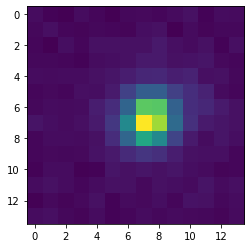

006597-u6-0032(1051.5,950.0)


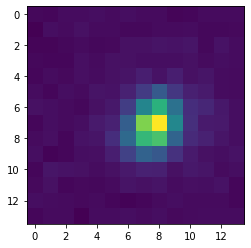

006597-u6-0032(760.0,897.0)


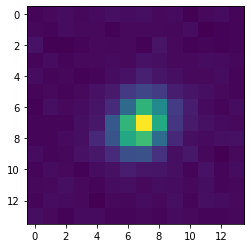

006597-u6-0032(114.0,891.5)


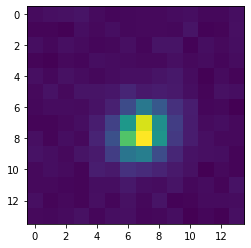

006597-u6-0032(775.0,664.0)


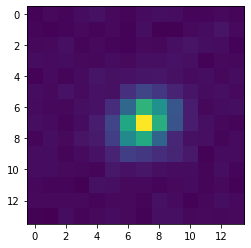

006597-u6-0032(1157.0,648.0)


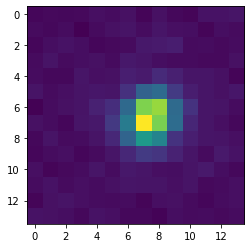

006597-u6-0032(889.0,598.0)


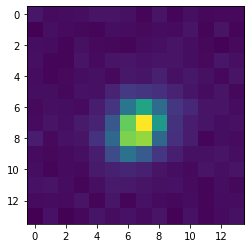

006597-u6-0032(718.0,485.0)


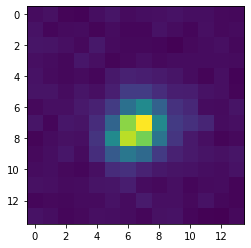

006597-u6-0032(1430.0,232.5)


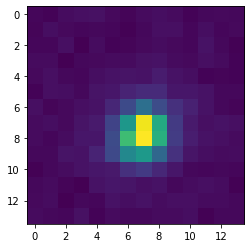

006597-u6-0032(324.0,76.0)


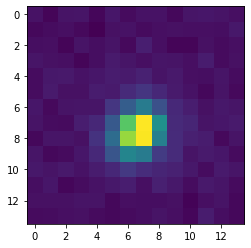

002248-u6-0210(282.125,845.5)


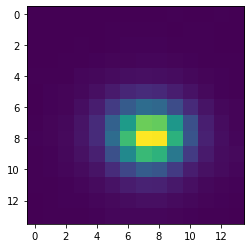

002248-u6-0210(185.5,867.5)


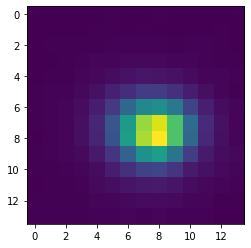

002248-u6-0210(1457.5,1474.0)


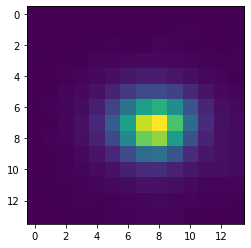

002248-u6-0210(1890.5,323.0)


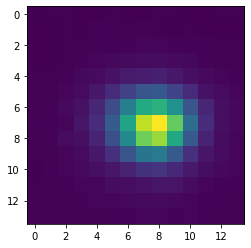

002248-u6-0210(201.0,789.0)


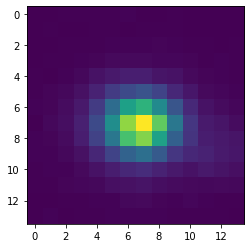

002248-u6-0210(202.0,668.0)


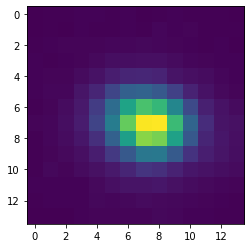

002248-u6-0210(889.2142944335938,261.64285278320307)


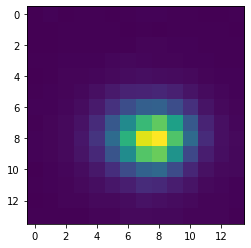

002248-u6-0210(1850.0294189453125,1435.676513671875)


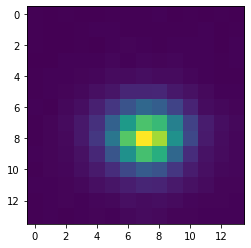

002248-u6-0210(864.5,836.0)


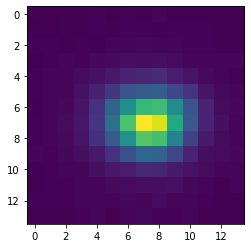

002248-u6-0210(1577.5,862.0)


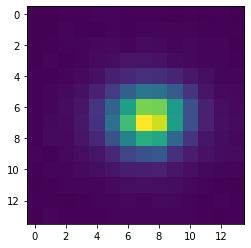

002248-u6-0210(561.0,1365.0)


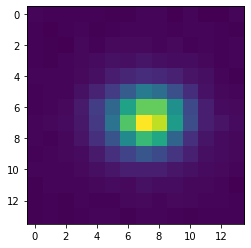

002248-u6-0210(369.0,1379.5)


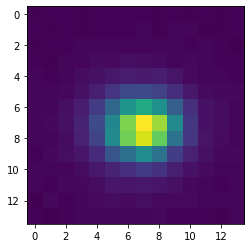

002248-u6-0210(813.0,165.5)


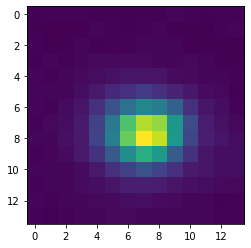

002248-u6-0210(935.0,339.0)


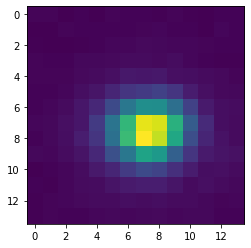

002248-u6-0210(1000.5,585.0)


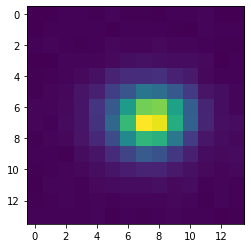

002248-u6-0210(452.0,91.5)


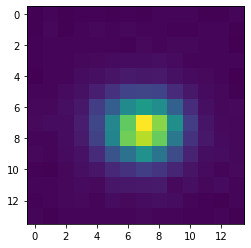

002248-u6-0210(340.0,1218.0)


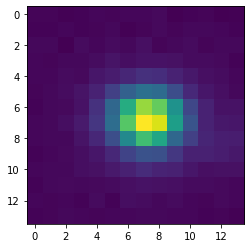

002248-u6-0210(1782.0999755859375,1052.9000244140623)


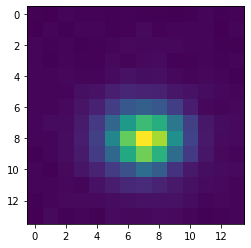

002248-u6-0210(804.0,252.5)


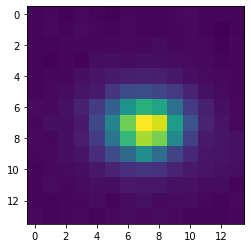

002248-u6-0210(1928.5,1415.0)


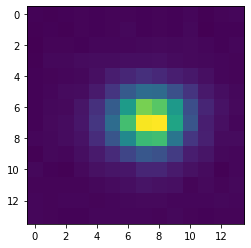

002248-u6-0210(1260.5,622.0)


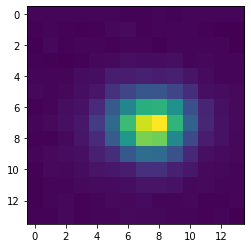

002248-u6-0210(1175.5,549.5)


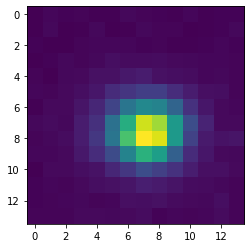

002248-u6-0210(2004.5,448.0)


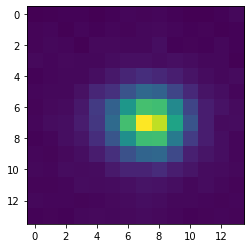

002248-u6-0210(841.0,1369.0)


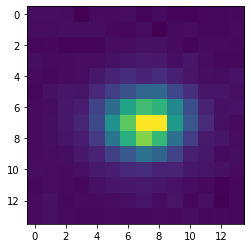

002248-u6-0210(1950.0,689.0)


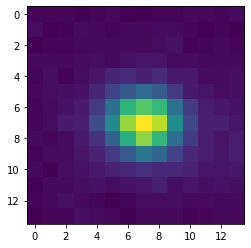

002248-u6-0210(830.0,149.0)


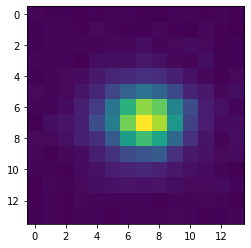

002248-u6-0210(905.0,1268.75)


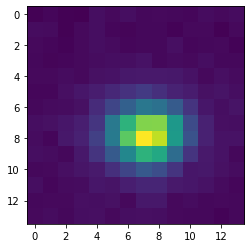

002248-u6-0210(382.25,974.0)


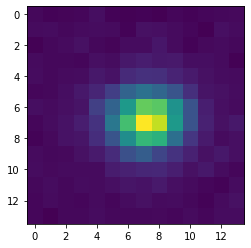

002248-u6-0210(706.8333129882812,1133.8333740234375)


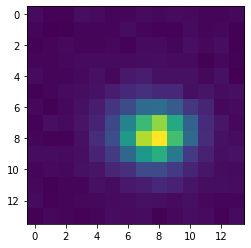

002248-u6-0210(1488.5,914.5)


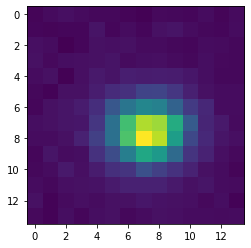

002248-u6-0210(969.5,232.5)


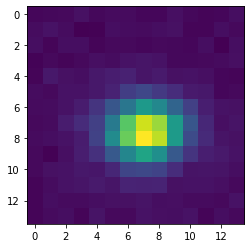

002248-u6-0210(1743.5,121.5)


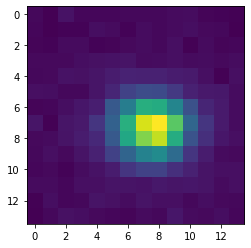

002248-u6-0210(1943.0,814.0)


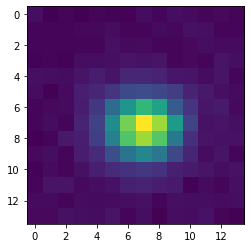

002248-u6-0210(1829.0,67.0)


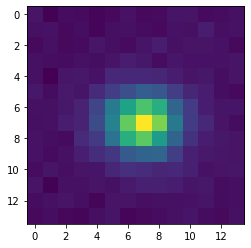

005870-u5-0383(1023.5,744.0)


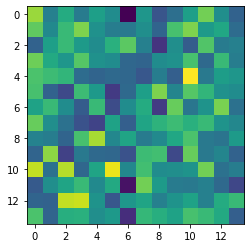

003644-u1-0194(45.25806427001953,833.5806274414062)


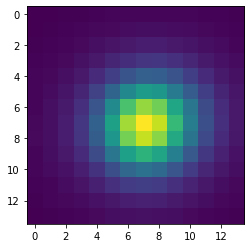

003644-u1-0194(1474.269287109375,842.5)


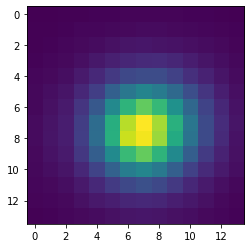

003644-u1-0194(80.64286041259766,216.7857208251953)


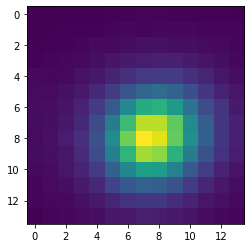

003644-u1-0194(1484.0,602.4000244140625)


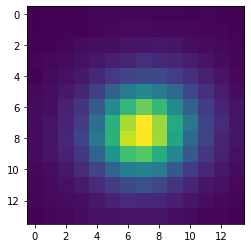

003644-u1-0194(1988.0,1338.5)


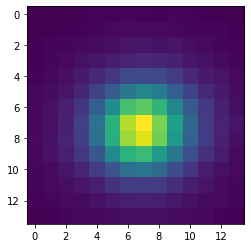

003644-u1-0194(548.1969604492189,80.07575988769531)


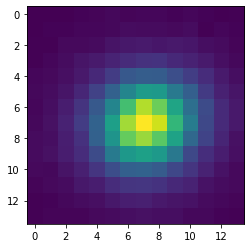

003644-u1-0194(1578.0,734.5)


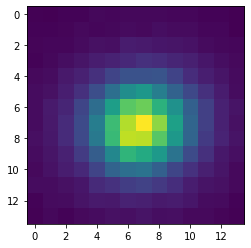

003644-u1-0194(794.5,732.5)


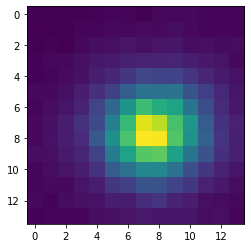

003644-u1-0194(1650.5,501.5)


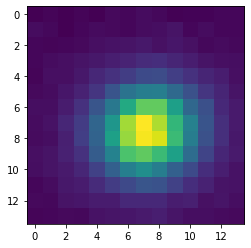

003644-u1-0194(850.6428833007812,786.3571166992188)


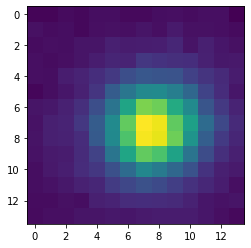

003644-u1-0194(266.0,752.375)


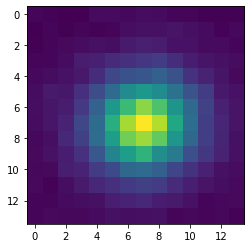

003644-u1-0194(1315.1666259765625,117.5)


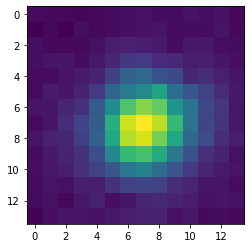

003644-u1-0194(301.5,727.5)


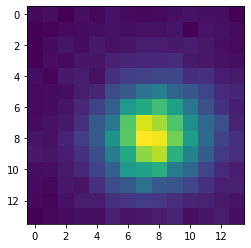

003644-u1-0194(69.0,215.5)


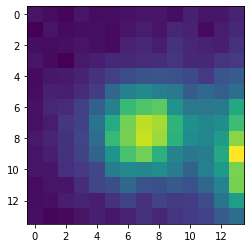

002304-u3-0338(1673.25,1189.0)


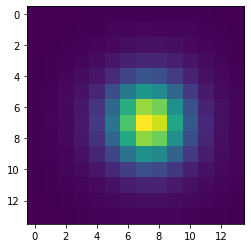

002304-u3-0338(532.779052734375,458.11627197265625)


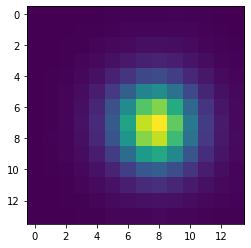

002304-u3-0338(1558.0,1133.5)


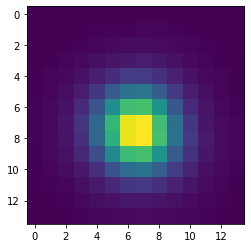

002304-u3-0338(183.93283081054688,183.84327697753903)


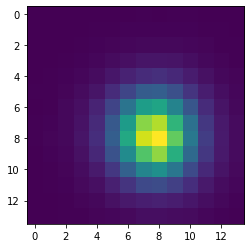

002304-u3-0338(523.5465087890625,630.8953247070312)


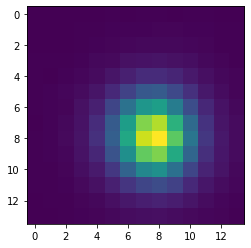

002304-u3-0338(1433.5,318.5)


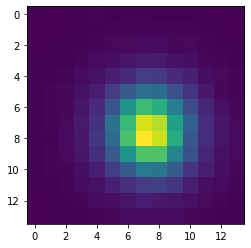

002304-u3-0338(1364.1666259765625,834.1666870117188)


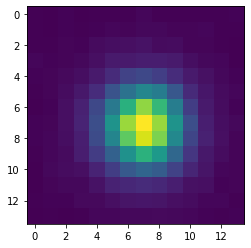

002304-u3-0338(1146.8333740234375,487.5)


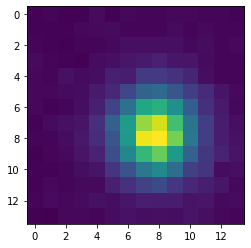

002304-u3-0338(188.75,510.0)


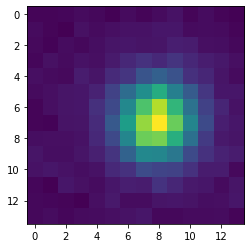

002304-u3-0338(589.8333129882812,599.1666870117188)


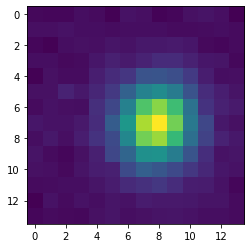

002304-u3-0338(1631.5,485.5)


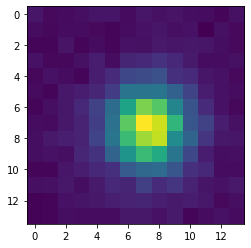

002304-u3-0338(403.5,506.5)


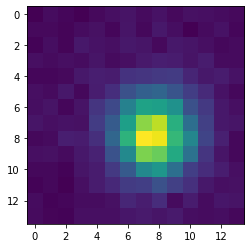

002304-u3-0338(1150.0,1396.0)


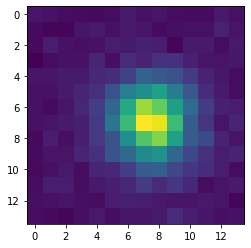

002304-u3-0338(1256.0,1268.0)


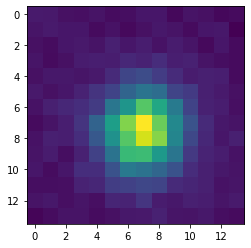

002304-u3-0338(457.5,1133.0)


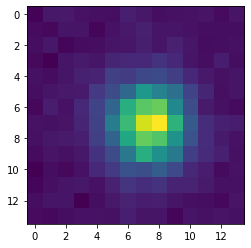

005087-u6-0170(15.19565200805664,1216.4130859375)


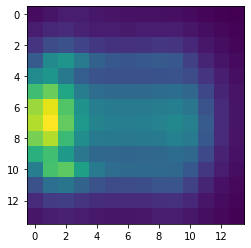

005087-u6-0170(1479.0,148.5)


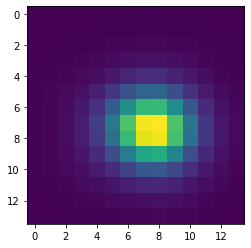

005087-u6-0170(1164.5,580.0)


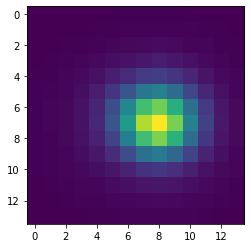

005087-u6-0170(601.0,977.25)


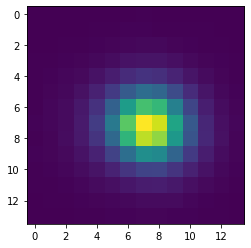

005087-u6-0170(627.875,1333.5)


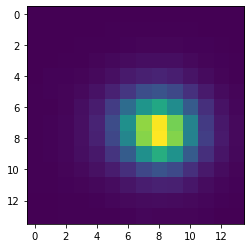

005087-u6-0170(534.75,906.0)


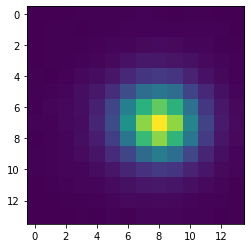

005087-u6-0170(1416.5,616.5)


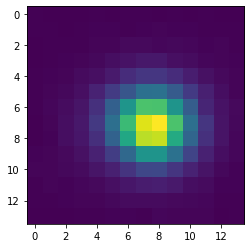

005087-u6-0170(558.5,1218.5)


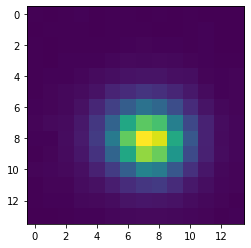

005087-u6-0170(552.7857055664061,1370.7857666015625)


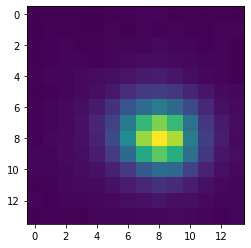

005087-u6-0170(226.5,783.1666870117188)


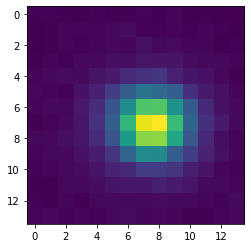

005087-u6-0170(173.5,651.8333129882812)


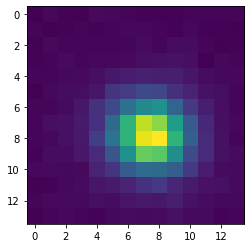

005087-u6-0170(1366.5,1104.5)


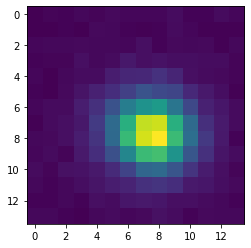

005087-u6-0170(1269.0,99.0)


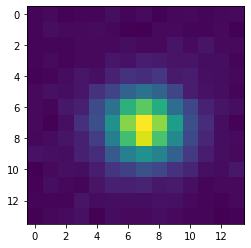

005087-u6-0170(317.0,66.0)


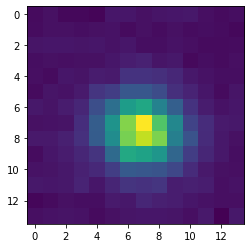

001458-u5-0635(812.9500122070312,1433.5)


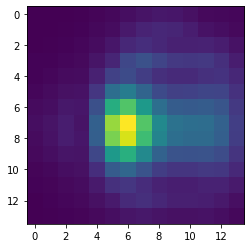

001458-u5-0635(1298.5,1354.5)


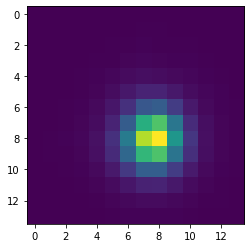

001458-u5-0635(1387.0,1388.3333740234375)


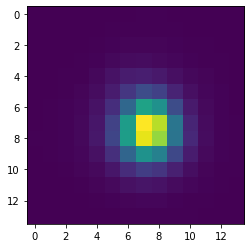

001458-u5-0635(1578.0,119.0)


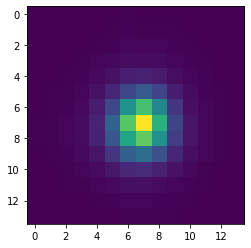

001458-u5-0635(1907.0,47.5)


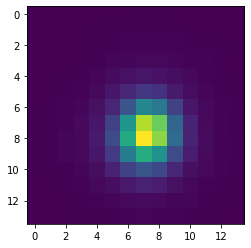

001458-u5-0635(1172.6875,1100.625)


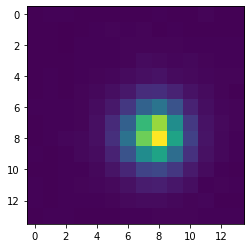

001458-u5-0635(1381.0,221.5)


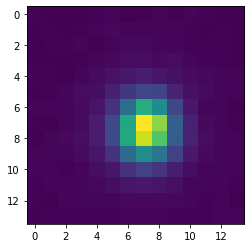

001458-u5-0635(462.0,413.0)


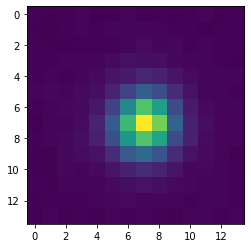

001458-u5-0635(57.0,759.0)


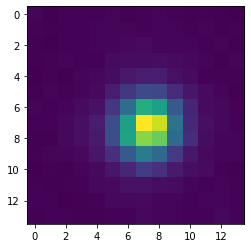

001458-u5-0635(857.0,775.0)


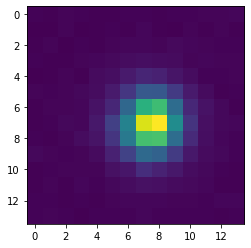

001458-u5-0635(1756.0,304.1666564941406)


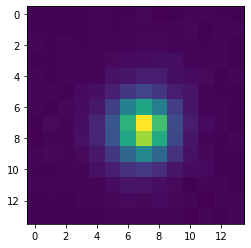

001458-u5-0635(298.0,967.0)


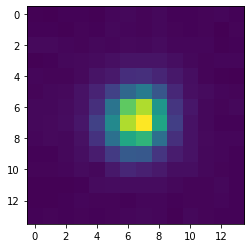

001458-u5-0635(1045.5,1436.0)


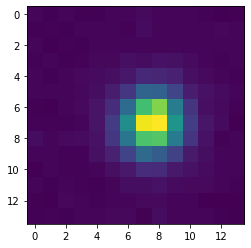

001458-u5-0635(1121.5,250.0)


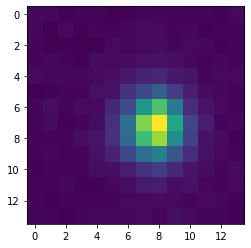

001458-u5-0635(376.5,15.5)


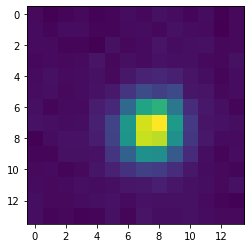

001458-u5-0635(1010.5,652.5)


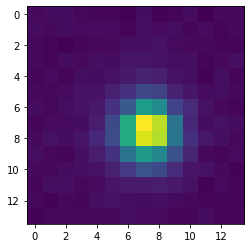

001458-u5-0635(1765.0,218.3333282470703)


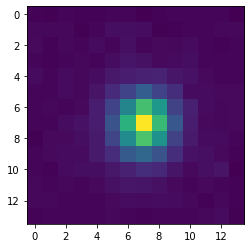

001458-u5-0635(1794.0,1134.0)


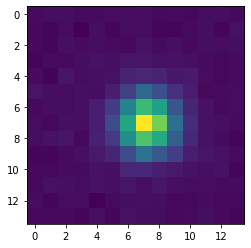

001458-u5-0635(1627.25,934.0)


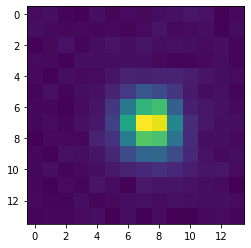

001458-u5-0635(389.5,631.0)


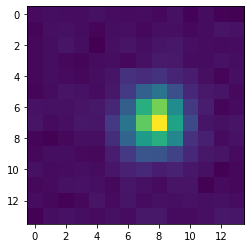

001458-u5-0635(1228.5,917.5)


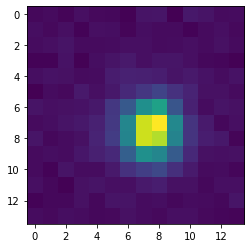

001458-u5-0635(1801.5,1479.0)


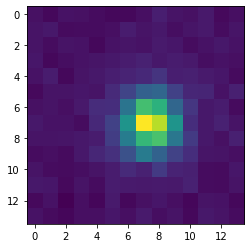

001458-u5-0635(211.0,1471.0)


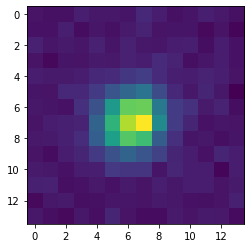

001458-u5-0635(591.0,1449.0)


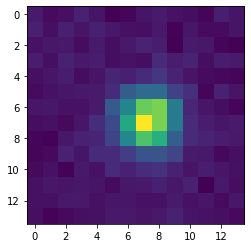

006417-u5-0169(157.0,1133.25)


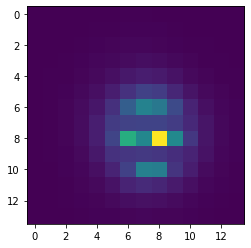

006417-u5-0169(1109.3583984375,110.86283111572266)


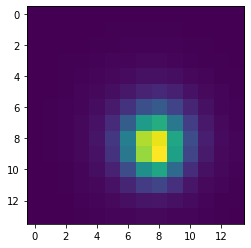

006417-u5-0169(72.0,87.36363983154297)


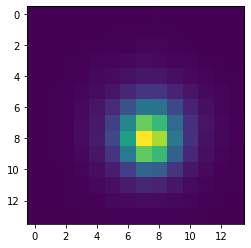

006417-u5-0169(1389.5,69.5)


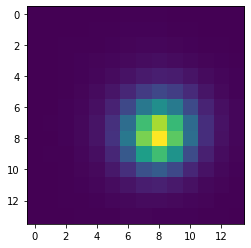

006417-u5-0169(104.11538696289062,28.11538505554199)


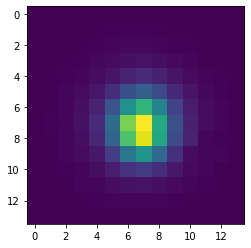

006417-u5-0169(491.5,1274.5)


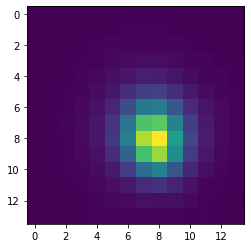

006417-u5-0169(374.5,781.125)


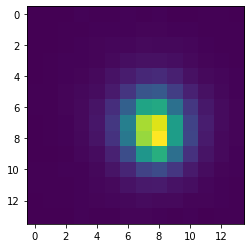

006417-u5-0169(653.5,1049.5)


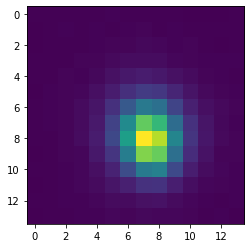

006417-u5-0169(1138.3333740234375,591.6666870117188)


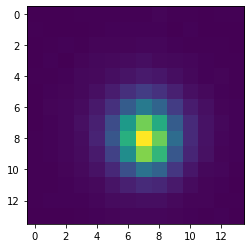

006417-u5-0169(573.5,94.5)


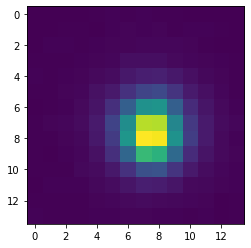

006417-u5-0169(1458.27783203125,798.0555419921875)


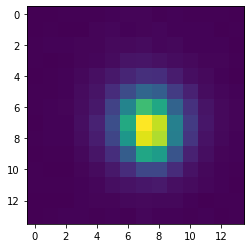

006417-u5-0169(1774.5,1220.0)


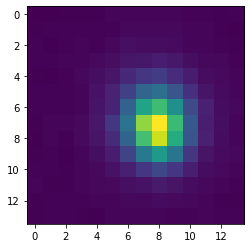

006417-u5-0169(685.5,591.5)


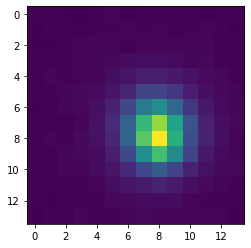

006417-u5-0169(108.0,548.5)


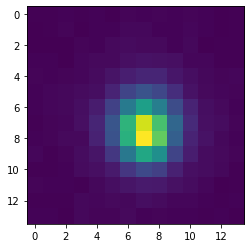

006417-u5-0169(382.0,166.5)


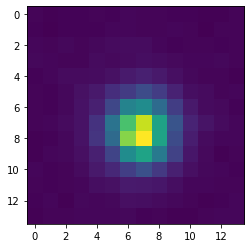

006417-u5-0169(703.5,583.5)


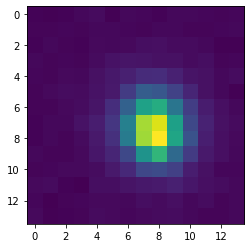

006417-u5-0169(632.0,1429.0)


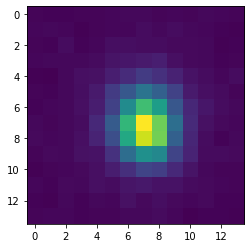

006417-u5-0169(562.5,540.25)


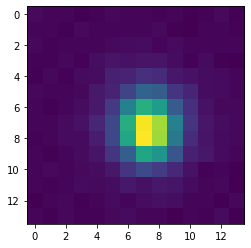

006417-u5-0169(1439.0,1418.0)


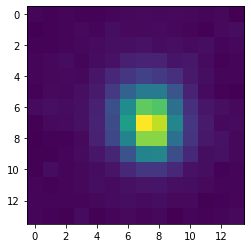

006417-u5-0169(622.0,719.0)


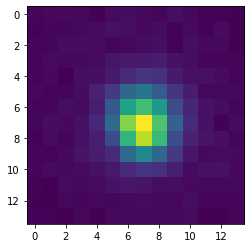

006417-u5-0169(1886.0,1111.0)


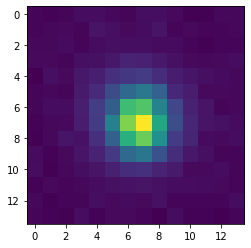

006417-u5-0169(2015.1666259765625,911.5)


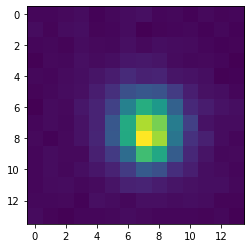

006417-u5-0169(1634.8333740234375,142.5)


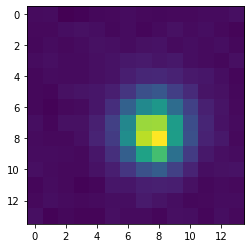

006417-u5-0169(666.7000122070312,263.70001220703125)


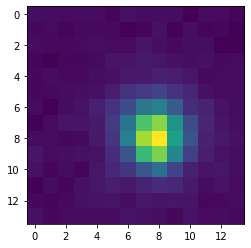

006417-u5-0169(286.5,1002.5)


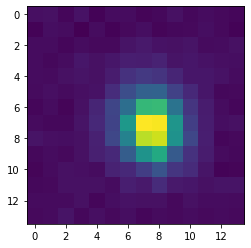

006417-u5-0169(448.21429443359375,105.35713958740234)


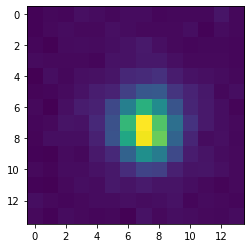

006417-u5-0169(21.0,32.5)


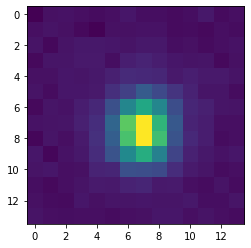

006417-u5-0169(1334.0,1376.3333740234375)


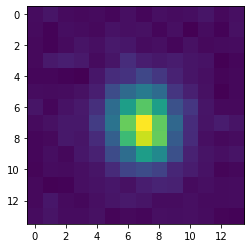

006417-u5-0169(673.5,454.5)


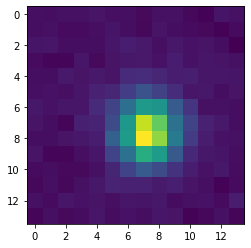

006417-u5-0169(1967.0,1245.5)


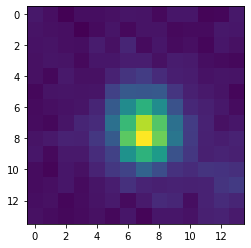

006417-u5-0169(1142.0,1005.5)


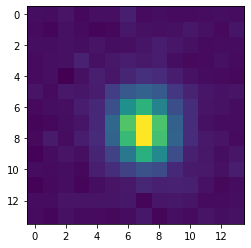

006417-u5-0169(1840.0,319.0)


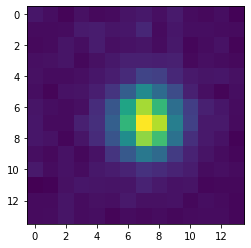

006417-u5-0169(354.0,135.0)


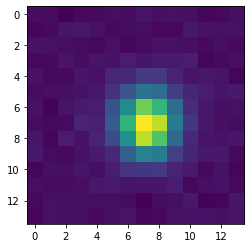

006417-u5-0169(1717.5,893.0)


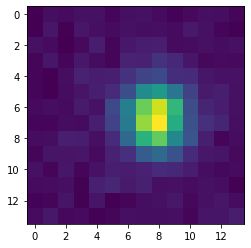

006417-u5-0169(450.5,610.0)


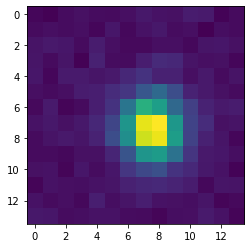

006417-u5-0169(757.5,540.0)


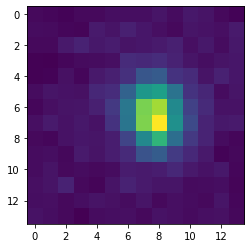

006417-u5-0169(425.5,856.5)


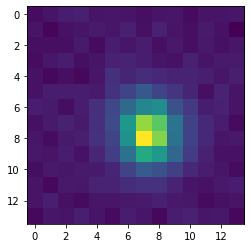

006417-u5-0169(1942.5,558.5)


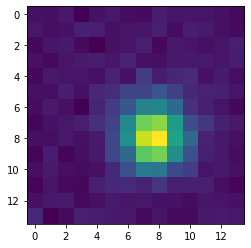

006417-u5-0169(1602.5,1241.0)


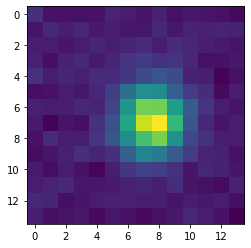

006417-u5-0169(207.0,1142.5)


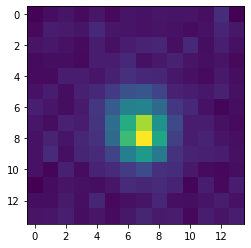

006417-u5-0169(1500.0,684.0)


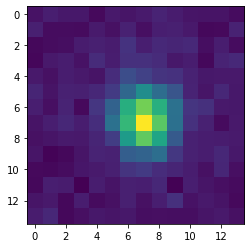

006417-u5-0169(1954.0,554.0)


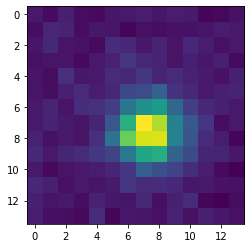

006417-u5-0169(339.0,446.0)


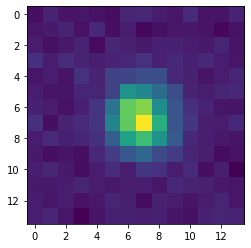

007121-u2-0383(645.5,732.5)


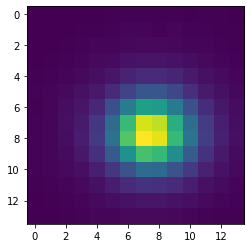

007121-u2-0383(4.0,43.0)


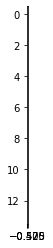

007121-u2-0383(1940.6612548828125,1022.5645141601562)


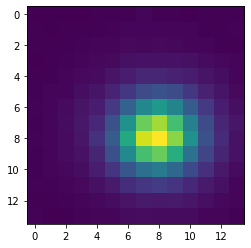

007121-u2-0383(447.70001220703125,611.0)


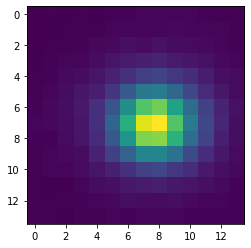

007121-u2-0383(1672.0,1416.5)


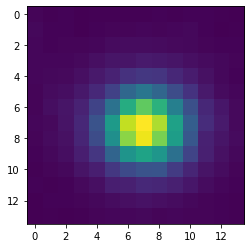

007121-u2-0383(1616.1666259765625,355.5)


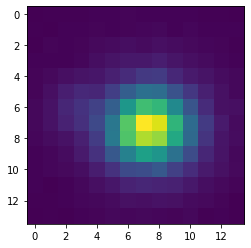

007121-u2-0383(52.5,80.5)


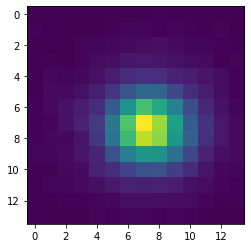

007121-u2-0383(820.0,208.0)


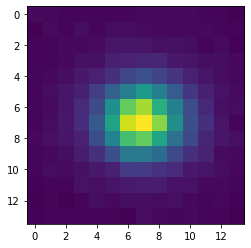

007121-u2-0383(1928.0,973.5)


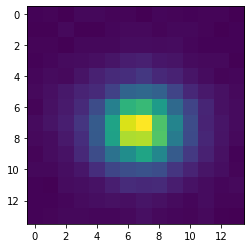

007121-u2-0383(1952.0,838.5)


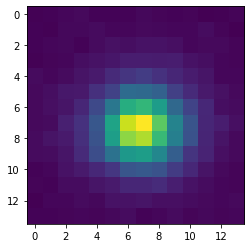

007121-u2-0383(37.0,264.0)


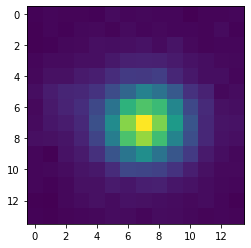

007121-u2-0383(1660.5,1410.5)


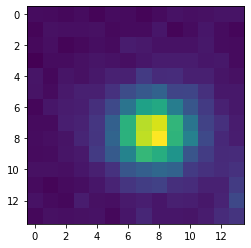

007121-u2-0383(560.0,822.0)


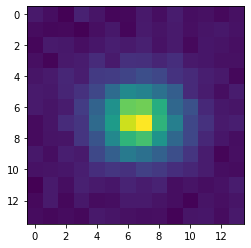

004858-u6-0539(1041.6666259765623,221.11111450195312)


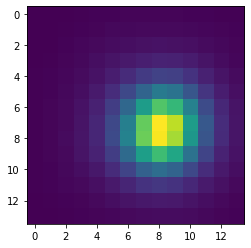

004858-u6-0539(1243.0,359.5)


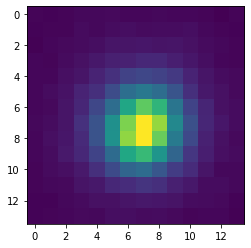

004858-u6-0539(1998.0,187.5)


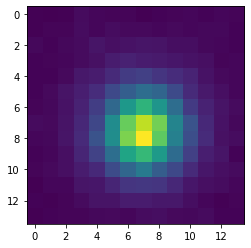

004858-u6-0539(715.5,1241.5)


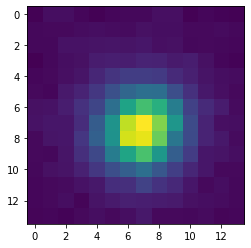

004858-u6-0539(181.5,813.5)


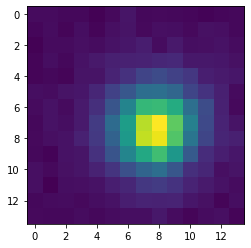

007038-u1-0412(1961.5,752.0555419921875)


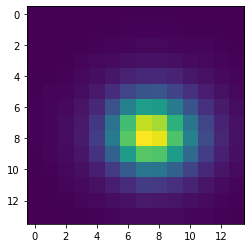

007038-u1-0412(560.2142944335939,1105.0)


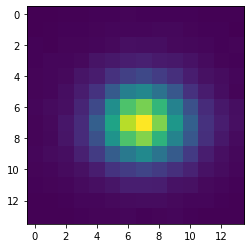

007038-u1-0412(2043.1842041015625,627.3947143554688)


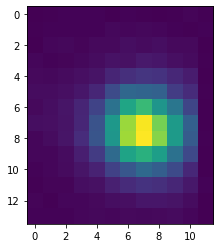

007038-u1-0412(606.0,753.0)


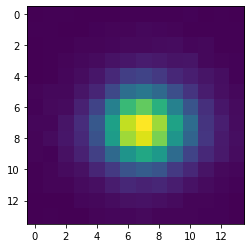

007038-u1-0412(1262.5,1374.5)


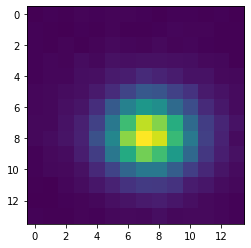

007038-u1-0412(285.75,604.25)


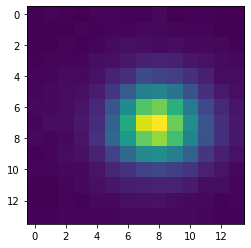

007038-u1-0412(1180.5,1467.0)


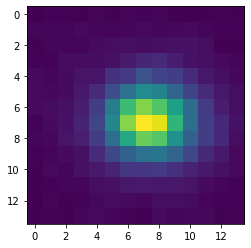

007038-u1-0412(1403.25,802.0)


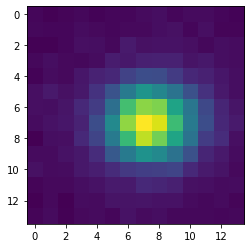

007038-u1-0412(696.875,765.0)


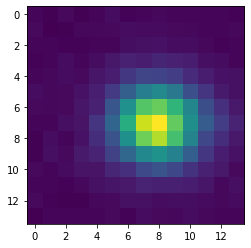

007038-u1-0412(1673.0,261.0)


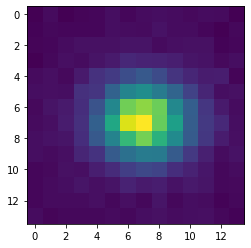

007038-u1-0412(1251.5,1454.0)


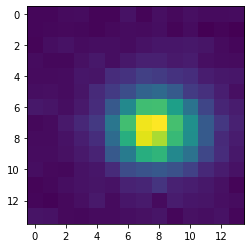

007038-u1-0412(1320.75,710.0)


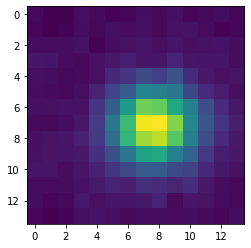

007038-u1-0412(1246.5,392.5)


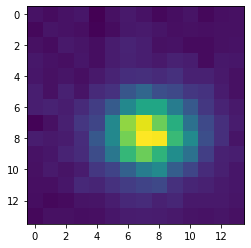

002888-u6-0052(1022.0714111328124,1410.2142333984375)


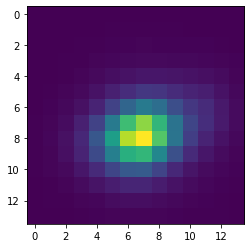

002888-u6-0052(1186.5,456.5)


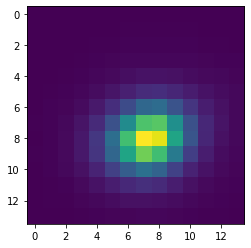

002888-u6-0052(651.0,460.0)


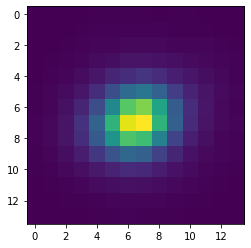

002888-u6-0052(593.6428833007812,1093.9285888671877)


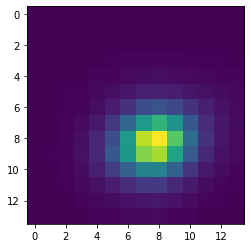

002888-u6-0052(1874.0,876.5)


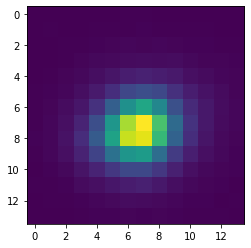

002888-u6-0052(440.0,401.5)


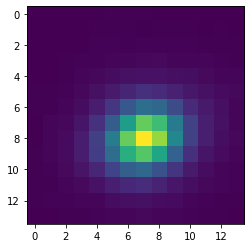

002888-u6-0052(343.5,570.0)


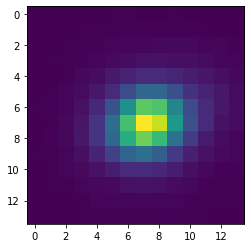

002888-u6-0052(661.0,904.5)


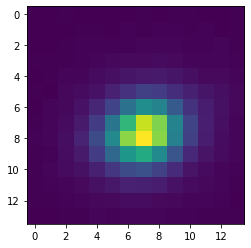

002888-u6-0052(1986.0714111328125,1472.642822265625)


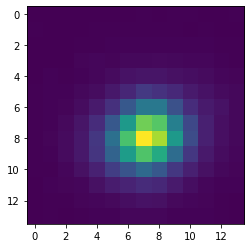

002888-u6-0052(360.8333435058594,166.1666717529297)


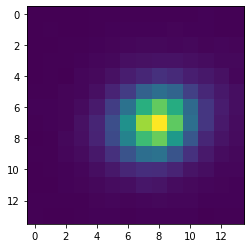

002888-u6-0052(839.0,809.0)


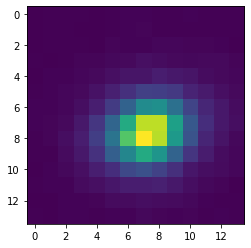

002888-u6-0052(1057.5,684.5)


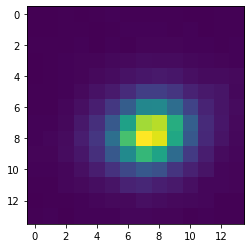

002888-u6-0052(1381.0384521484375,385.73077392578125)


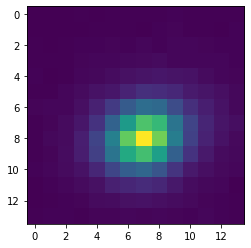

002888-u6-0052(1258.4000244140625,222.0)


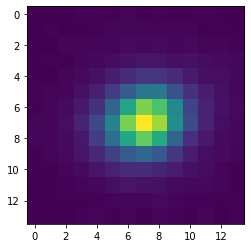

002888-u6-0052(1230.5,134.0)


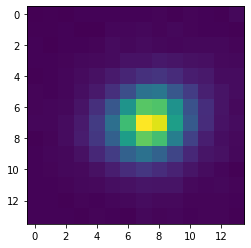

002888-u6-0052(1547.5,1321.5)


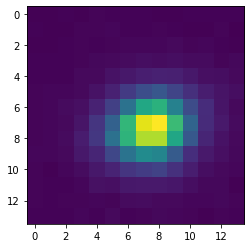

002888-u6-0052(977.5,153.5)


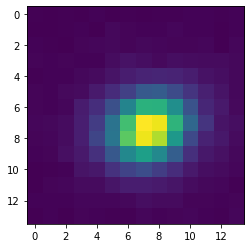

002888-u6-0052(1861.0,1467.0)


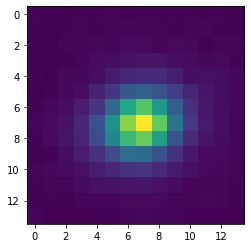

002888-u6-0052(438.5,1085.5)


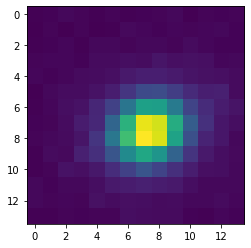

002888-u6-0052(637.1666870117188,778.5)


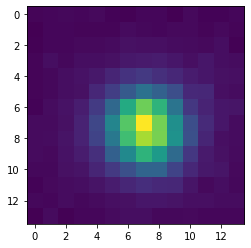

002888-u6-0052(1628.125,303.0)


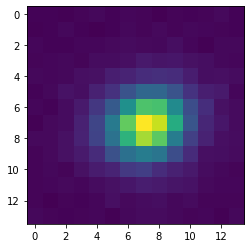

002888-u6-0052(150.6999969482422,995.2999877929688)


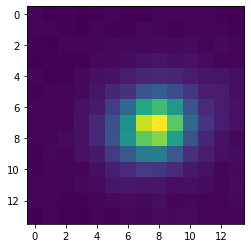

002888-u6-0052(2038.699951171875,528.2999877929689)


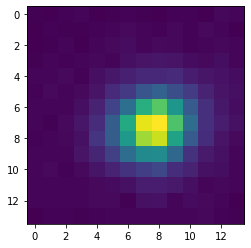

002888-u6-0052(674.0,1325.0)


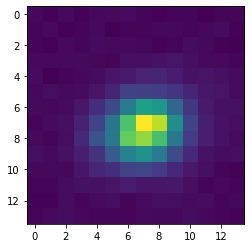

002888-u6-0052(1421.0,143.0)


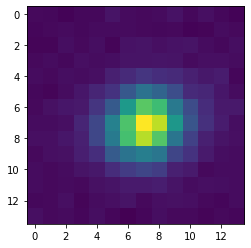

002888-u6-0052(1574.0,88.0)


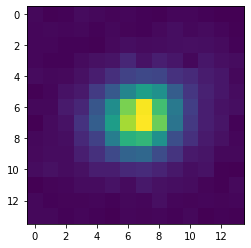

002888-u6-0052(1930.8333740234373,1410.1666259765625)


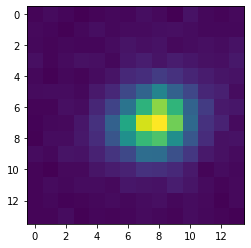

002888-u6-0052(1555.8333740234375,705.1666870117188)


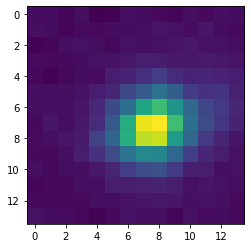

002888-u6-0052(2004.0,1003.5)


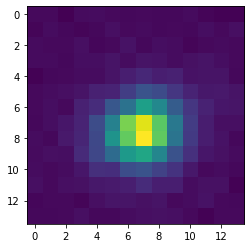

002888-u6-0052(793.0,702.0)


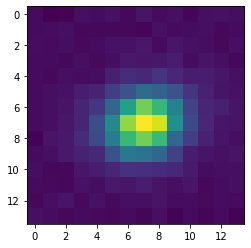

002888-u6-0052(2.5,544.0)


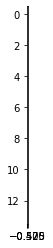

002888-u6-0052(329.0,383.5)


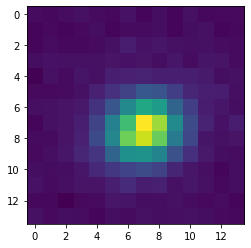

002888-u6-0052(1402.0,399.0)


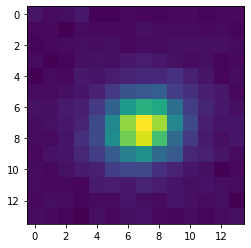

002888-u6-0052(148.5,295.5)


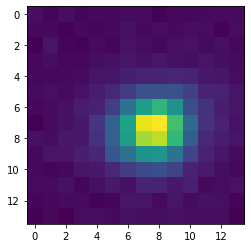

002888-u6-0052(574.5,883.0)


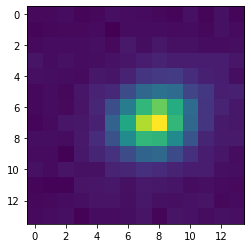

005622-u4-0273(66.90000152587889,1190.300048828125)


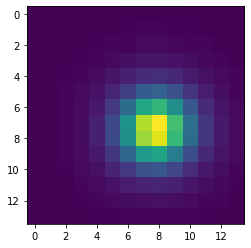

005622-u4-0273(1876.5,1093.300048828125)


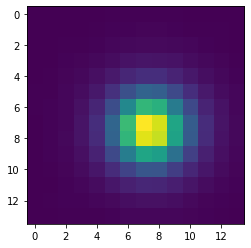

005622-u4-0273(731.1136474609375,995.227294921875)


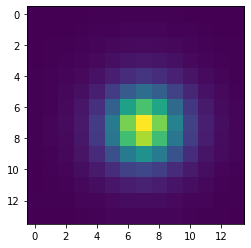

005622-u4-0273(1250.0,1419.0)


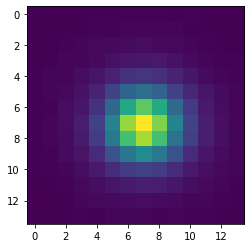

005622-u4-0273(1555.131591796875,157.6052703857422)


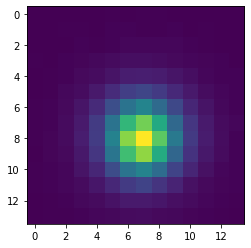

005622-u4-0273(1631.652587890625,440.2796630859375)


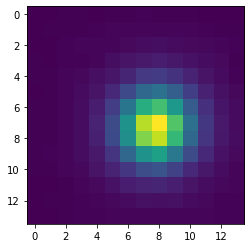

005622-u4-0273(1012.5625,901.34375)


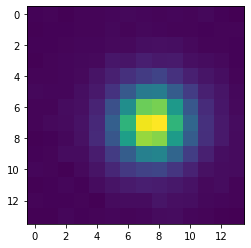

005622-u4-0273(837.6666870117188,516.3333129882811)


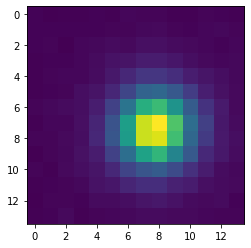

005622-u4-0273(988.5,563.5)


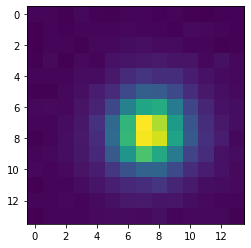

005622-u4-0273(506.0909118652344,873.8181762695312)


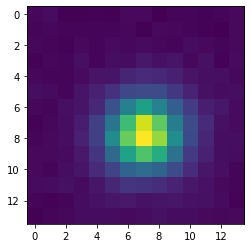

005622-u4-0273(529.2777709960939,1240.4444580078125)


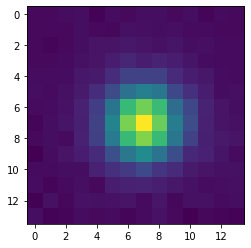

005622-u4-0273(332.3999938964844,1478.0)


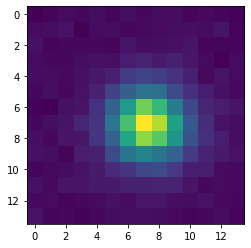

005622-u4-0273(1763.5,335.5)


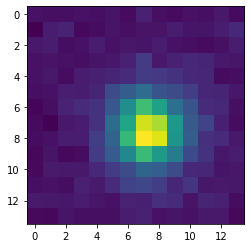

005622-u4-0273(315.70001220703125,344.70001220703125)


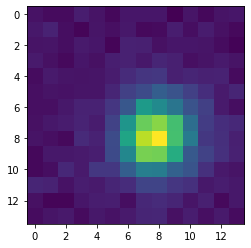

005622-u4-0273(1638.7857666015625,41.35714340209961)


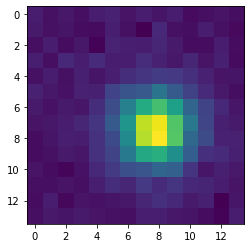

005622-u4-0273(1613.0,15.666666984558105)


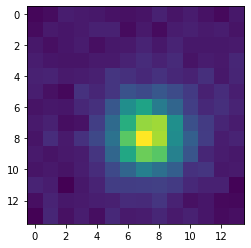

005622-u4-0273(1167.0,407.0)


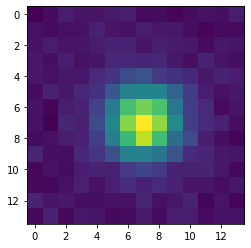

005622-u4-0273(418.1666564941406,929.8333129882812)


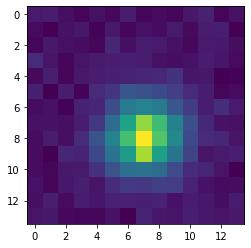

005622-u4-0273(1623.5,956.5)


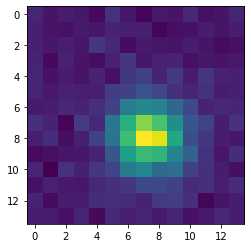

005622-u4-0273(580.5,595.0)


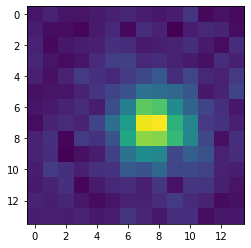

007121-u4-0788(925.5,362.5)


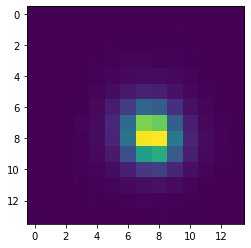

007121-u4-0788(557.0,770.2999877929688)


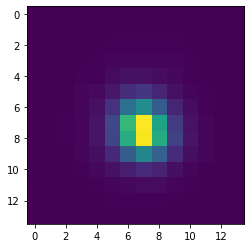

007121-u4-0788(408.2692260742188,738.0384521484375)


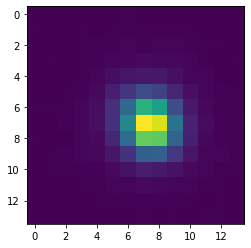

007121-u4-0788(693.8333129882812,802.1666870117188)


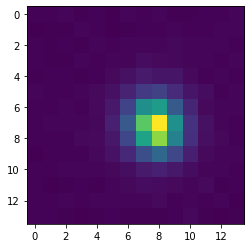

007121-u4-0788(1237.7857666015625,489.6428527832031)


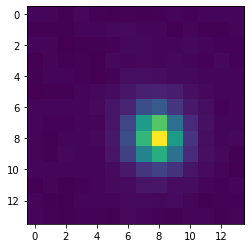

007121-u4-0788(409.0,1306.6666259765625)


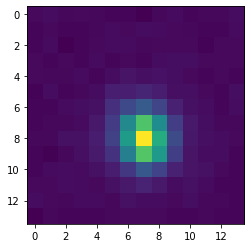

007121-u4-0788(1685.0,1462.0)


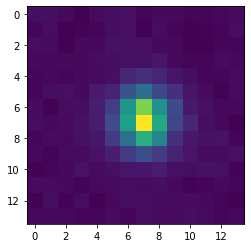

007121-u4-0788(1272.75,228.0)


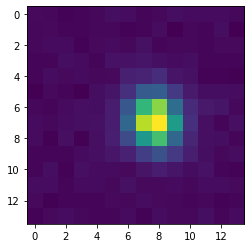

007121-u4-0788(796.0,74.5)


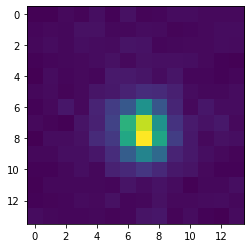

007121-u4-0788(2015.0,1194.0)


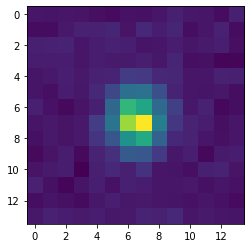

007121-u4-0788(147.0,1006.5)


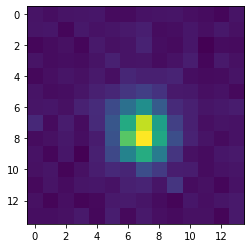

007121-u4-0788(249.0,79.5)


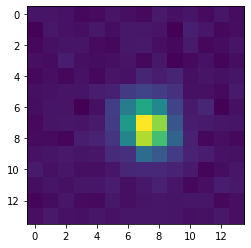

005313-u6-0118(1867.5,901.5)


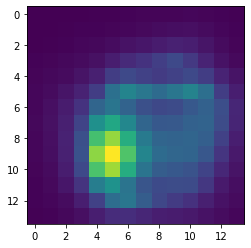

005313-u6-0118(2037.5,1326.0)


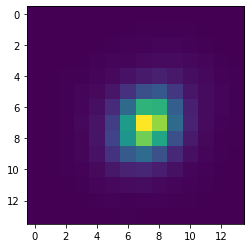

005313-u6-0118(365.5,603.0)


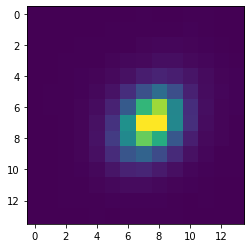

005313-u6-0118(216.5,947.5)


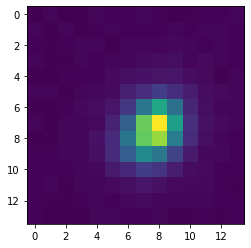

005313-u6-0118(1760.8333740234375,517.5)


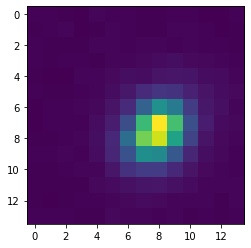

005313-u6-0118(1283.5,6.0)


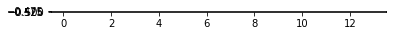

005313-u6-0118(1355.0,50.0)


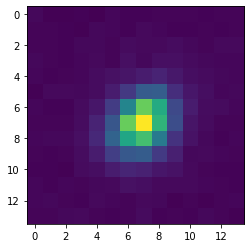

005313-u6-0118(48.0,937.0)


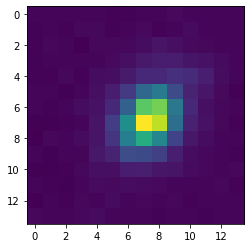

005313-u6-0118(819.0,215.0)


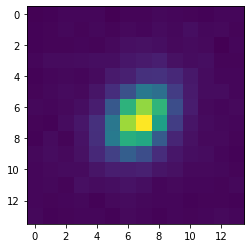

003635-u3-0152(103.73076629638672,1426.5)


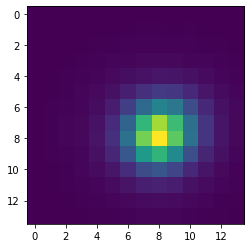

003635-u3-0152(1608.8876953125,921.3775634765624)


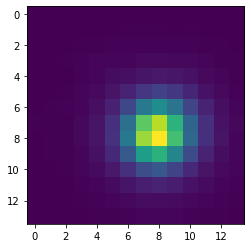

003635-u3-0152(531.0,1211.875)


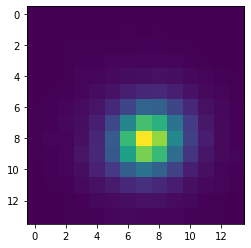

003635-u3-0152(266.0,1159.5)


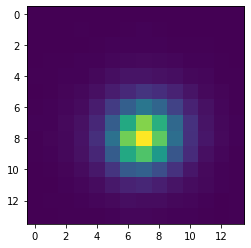

003635-u3-0152(234.0,989.0)


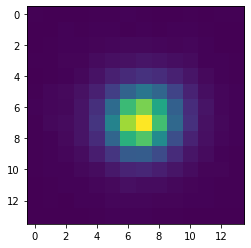

003635-u3-0152(882.8333129882812,411.1666564941406)


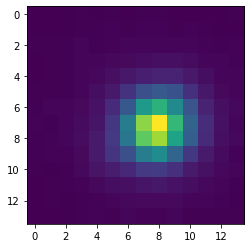

003635-u3-0152(777.0,1173.0)


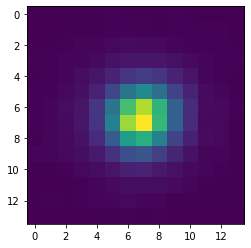

003635-u3-0152(1531.5,381.5)


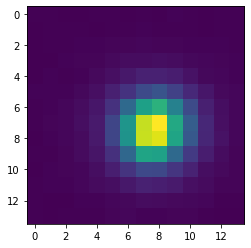

003635-u3-0152(912.5,755.5)


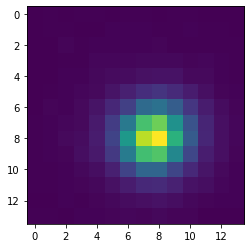

003635-u3-0152(221.2142791748047,114.21428680419922)


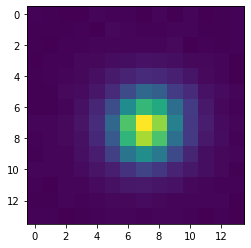

003635-u3-0152(1562.5,1412.5)


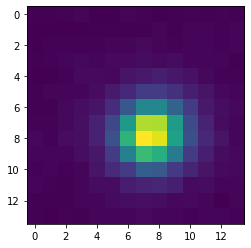

003635-u3-0152(985.3571166992188,627.2857055664062)


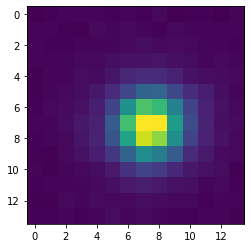

003635-u3-0152(129.16667175292972,616.1666870117188)


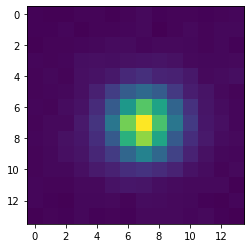

003635-u3-0152(591.5,1062.0)


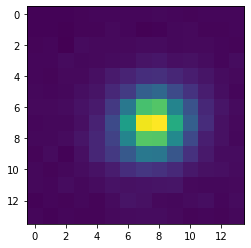

003635-u3-0152(439.5,360.5)


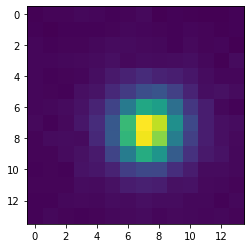

003635-u3-0152(1041.300048828125,130.69999694824222)


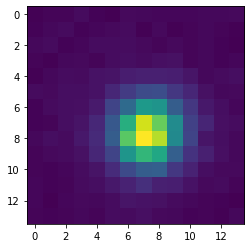

003635-u3-0152(68.5,28.5)


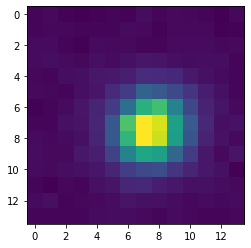

003635-u3-0152(1368.3333740234375,69.0)


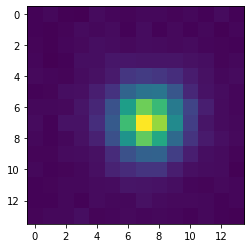

003635-u3-0152(1443.5,480.5)


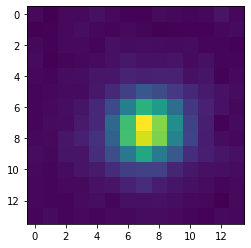

003635-u3-0152(123.0,714.0)


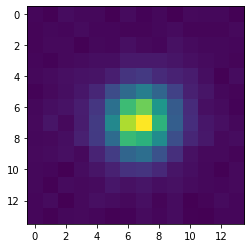

003635-u3-0152(245.1666717529297,1079.8333740234377)


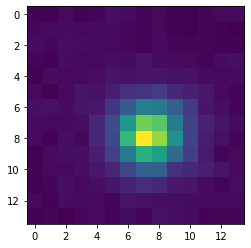

003635-u3-0152(1248.5,1225.5)


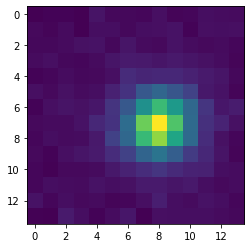

003635-u3-0152(1682.5,1325.0)


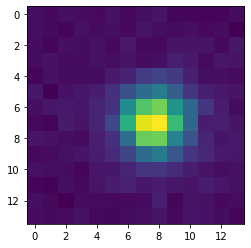

003635-u3-0152(1562.0,1081.0)


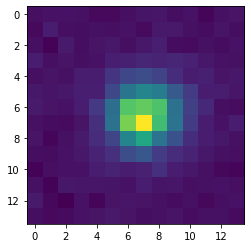

003635-u3-0152(1214.5,339.0)


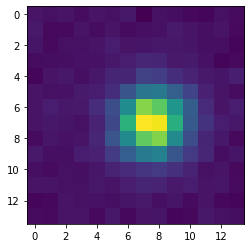

005312-u6-0051(1261.5,269.5)


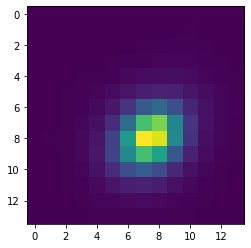

005312-u6-0051(134.0,156.0)


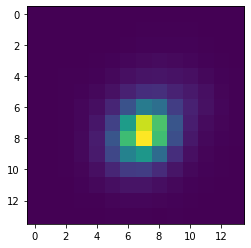

005312-u6-0051(1162.0,805.0)


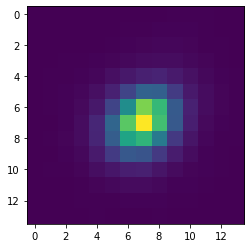

005312-u6-0051(1590.0,936.0)


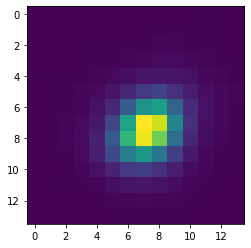

005312-u6-0051(1998.0,739.5)


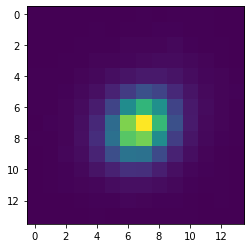

005312-u6-0051(1273.27783203125,599.7222290039062)


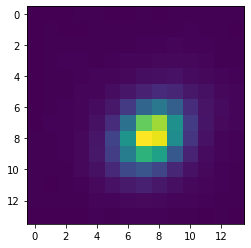

005312-u6-0051(1222.0,312.0)


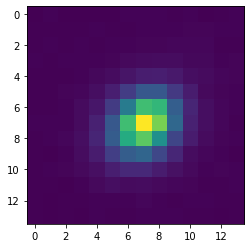

005312-u6-0051(985.7000122070312,939.2999877929688)


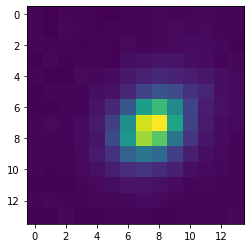

005312-u6-0051(398.70001220703125,1442.300048828125)


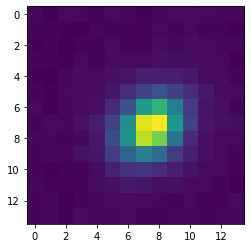

005312-u6-0051(1233.5,305.0)


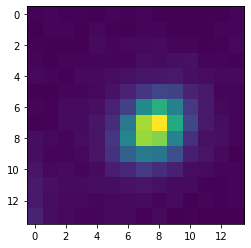

005312-u6-0051(1023.5,86.0)


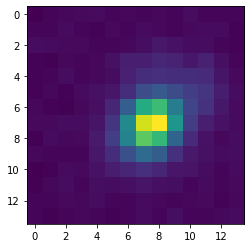

005312-u6-0051(1565.0,1373.5)


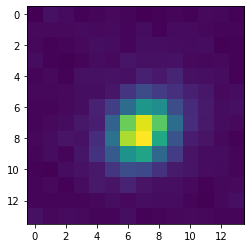

005312-u6-0051(9.5,988.5)


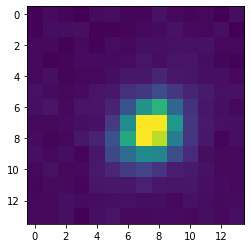

005312-u6-0051(853.5,648.5)


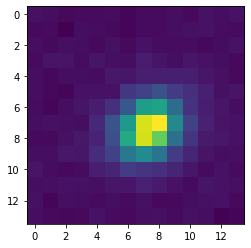

005312-u6-0051(936.5,302.5)


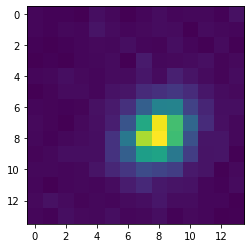

005312-u6-0051(585.5,471.0)


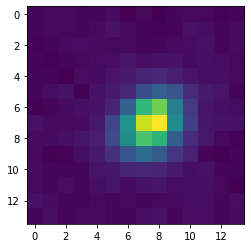

005312-u6-0051(368.5,78.0)


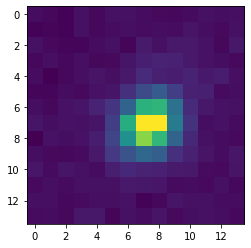

007170-u3-0634(162.91860961914062,661.6395263671875)


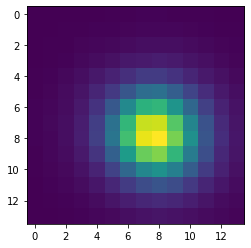

007170-u3-0634(1425.6363525390625,1285.9090576171875)


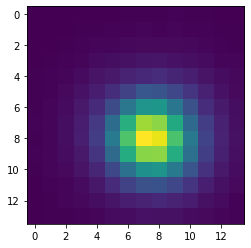

007170-u3-0634(1812.75,356.25)


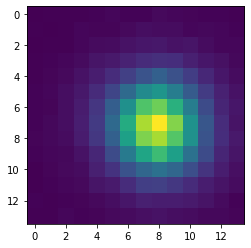

007170-u3-0634(1822.0,1284.7142333984375)


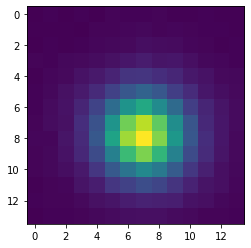

007170-u3-0634(1506.699951171875,352.0)


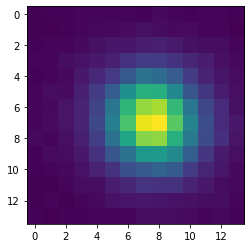

007170-u3-0634(707.1666870117188,1359.1666259765625)


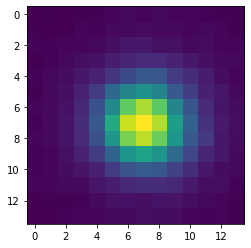

007170-u3-0634(1106.5,707.0)


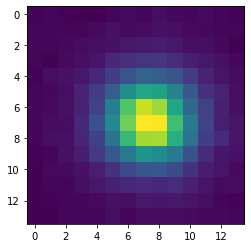

007170-u3-0634(1891.699951171875,1076.699951171875)


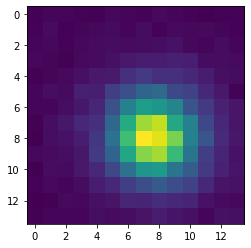

007170-u3-0634(1091.0,990.0)


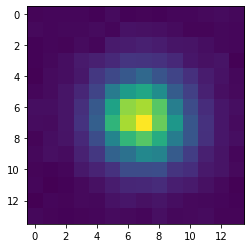

007170-u3-0634(103.83333587646484,1253.5)


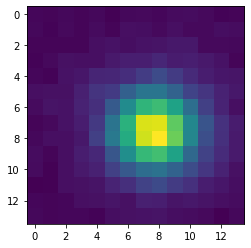

007170-u3-0634(1573.5,756.0)


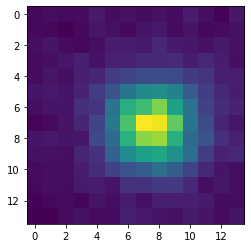

007161-u3-0387(1350.5,1136.5)


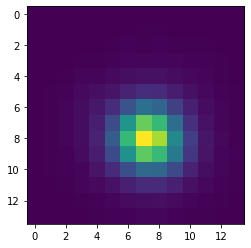

007161-u3-0387(792.0,1297.0)


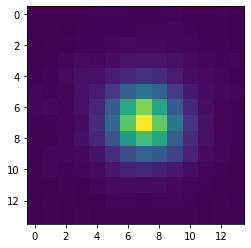

007161-u3-0387(1210.699951171875,944.7000122070312)


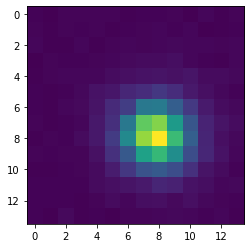

007161-u3-0387(1564.699951171875,497.70001220703125)


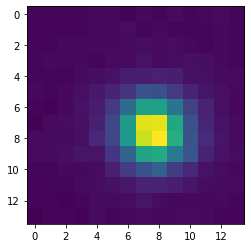

007161-u3-0387(949.8333129882812,1127.8333740234375)


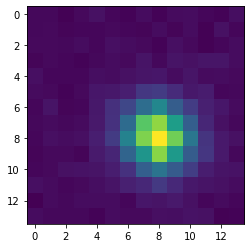

007161-u3-0387(1012.5,888.0)


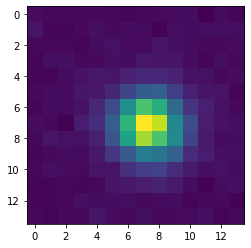

007161-u3-0387(1589.5,540.0)


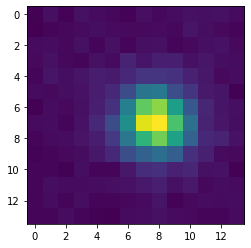

007054-u2-0604(1767.199951171875,694.0)


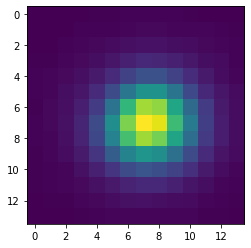

007054-u2-0604(1040.0,143.0)


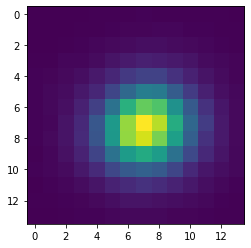

007054-u2-0604(813.5,1261.0)


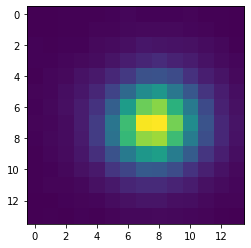

007054-u2-0604(1772.0,0.5)


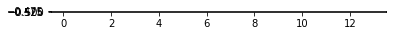

007054-u2-0604(667.1666870117188,157.5)


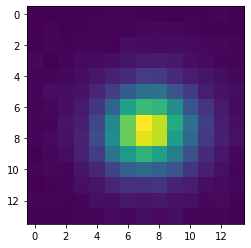

007054-u2-0604(746.5,1487.0)


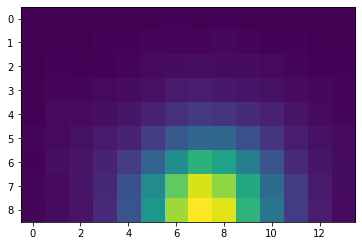

007054-u2-0604(1987.8333740234373,743.8333129882812)


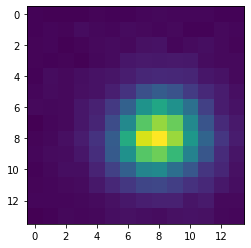

007054-u2-0604(1033.5,186.8333282470703)


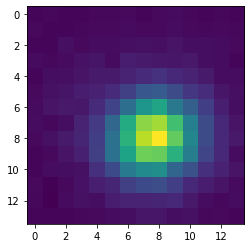

007054-u2-0604(2002.0,1427.0)


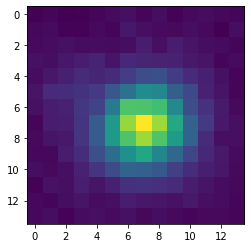

007054-u2-0604(1366.5,166.5)


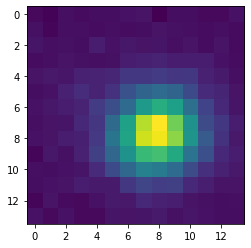

007054-u2-0604(1625.5,1264.5)


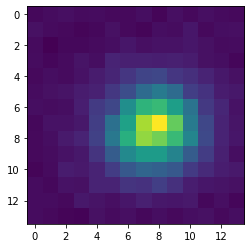

002886-u1-0279(1957.09375,35.0)


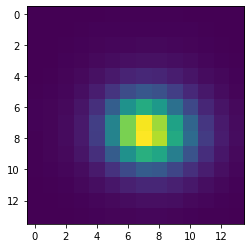

002886-u1-0279(555.875,387.5)


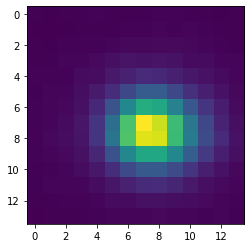

002886-u1-0279(601.7413940429688,35.94827651977539)


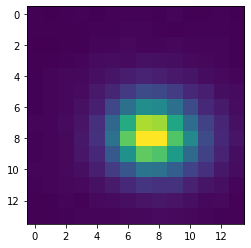

002886-u1-0279(247.125,904.25)


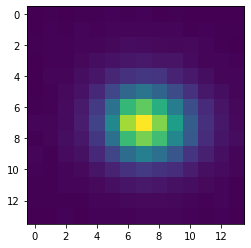

002886-u1-0279(1258.0,657.5)


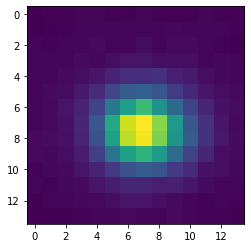

002886-u1-0279(797.0,792.0)


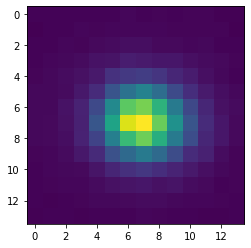

002886-u1-0279(1176.0,749.5)


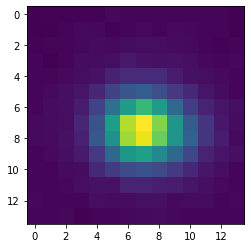

002886-u1-0279(692.5,47.5)


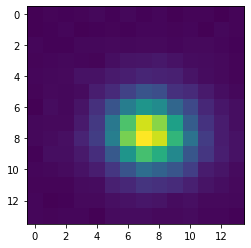

002886-u1-0279(1398.5,85.0)


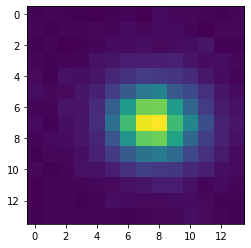

002886-u1-0279(1247.5,737.0)


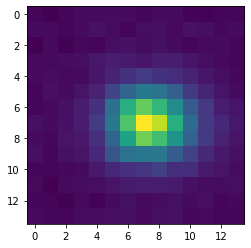

002886-u1-0279(1307.5,836.5)


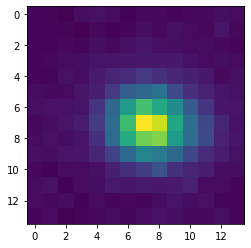

002886-u1-0279(1514.5,500.5)


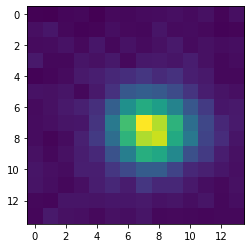

002886-u1-0279(1230.0,82.0)


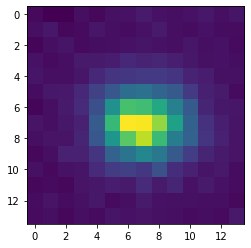

002886-u1-0279(357.5,444.5)


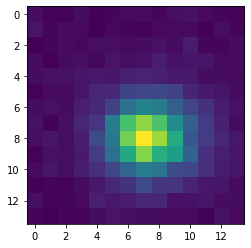

007106-u2-0397(640.4705810546875,419.8235168457031)


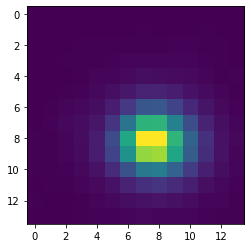

007106-u2-0397(1936.357177734375,710.5)


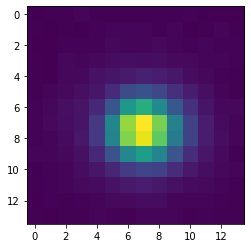

007106-u2-0397(1667.4285888671875,1104.0)


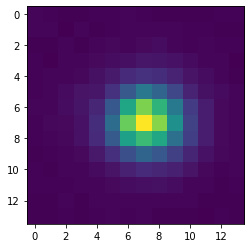

007106-u2-0397(443.0,298.70001220703125)


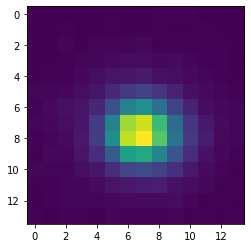

007106-u2-0397(1611.5,43.0)


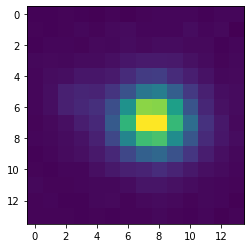

007106-u2-0397(1922.8333740234373,661.1666870117188)


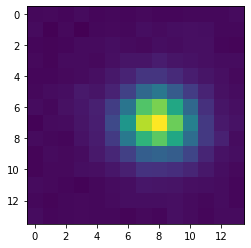

007106-u2-0397(1947.0,526.0)


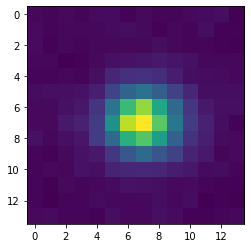

007106-u2-0397(1655.6666259765625,1098.0)


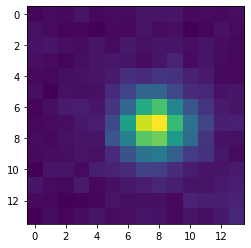

007106-u2-0397(555.0,509.25)


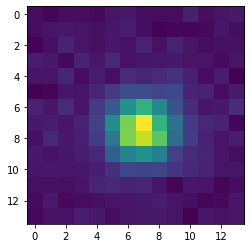

007106-u2-0397(1538.5,1481.0)


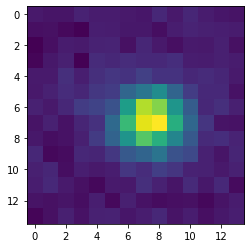

007106-u2-0397(176.5,1015.5)


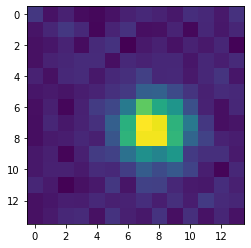

007106-u2-0397(1265.5,75.5)


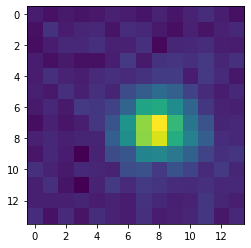

007106-u2-0397(1545.0,1148.0)


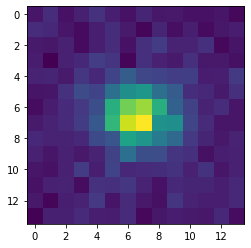

007106-u2-0397(461.0,1093.0)


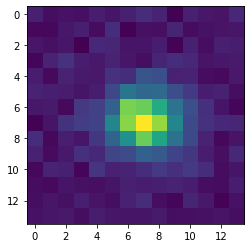

006412-u2-0141(68.88766479492189,130.64537048339844)


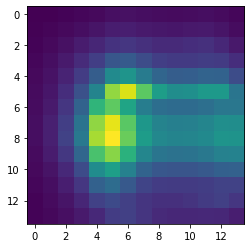

006412-u2-0141(1426.3095703125,685.1984252929688)


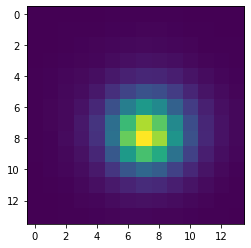

006412-u2-0141(1298.15673828125,731.932861328125)


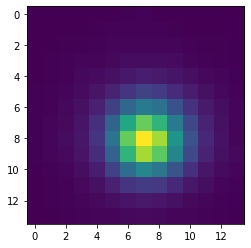

006412-u2-0141(398.1499938964844,1088.0)


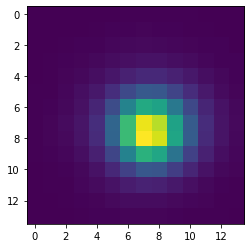

006412-u2-0141(792.7222290039062,740.5)


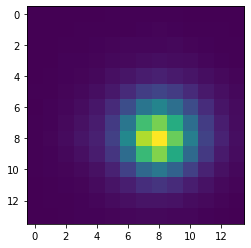

006412-u2-0141(597.5,392.5)


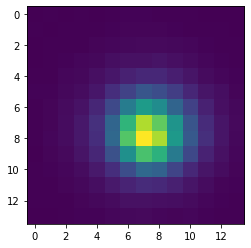

006412-u2-0141(1228.125,939.5)


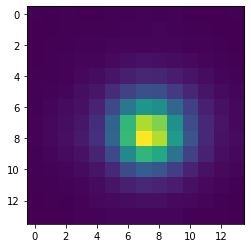

006412-u2-0141(554.5,322.5)


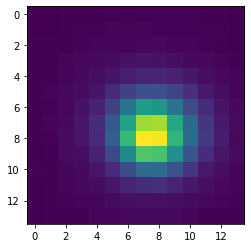

006412-u2-0141(36.5,390.5)


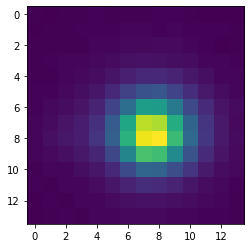

006412-u2-0141(1236.2857666015625,1331.0)


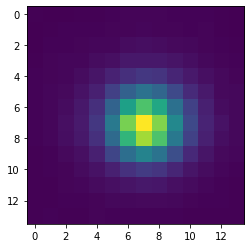

006412-u2-0141(1283.0,723.0)


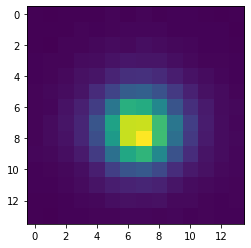

006412-u2-0141(2029.1842041015625,776.6052856445312)


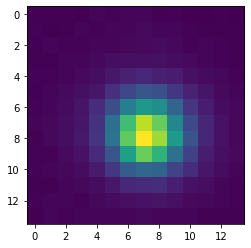

006412-u2-0141(1820.5,1042.5)


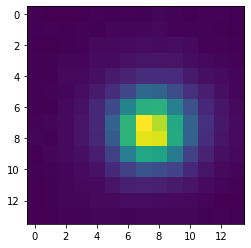

006412-u2-0141(749.0,10.333333015441896)


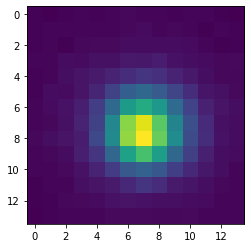

006412-u2-0141(404.5,892.25)


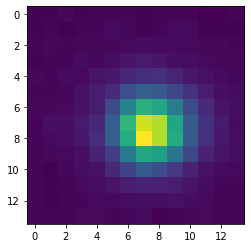

006412-u2-0141(1791.8333740234375,732.1666870117188)


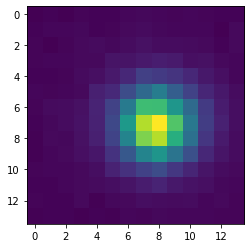

006412-u2-0141(1616.625,606.0)


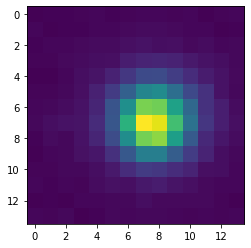

006412-u2-0141(1264.0,537.0)


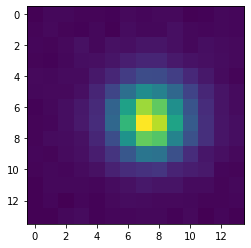

006412-u2-0141(1845.1363525390625,842.0454711914062)


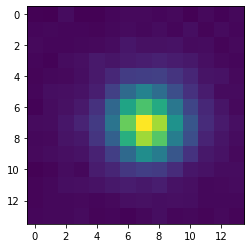

006412-u2-0141(252.5,1226.0)


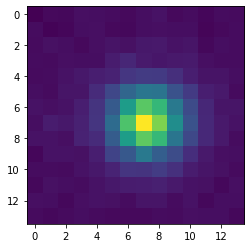

006412-u2-0141(521.5,953.5)


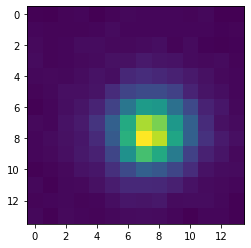

006412-u2-0141(1983.1666259765625,1142.5)


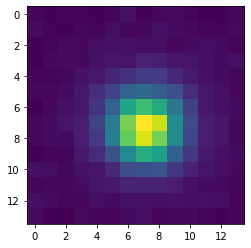

006412-u2-0141(1373.699951171875,1021.7000122070312)


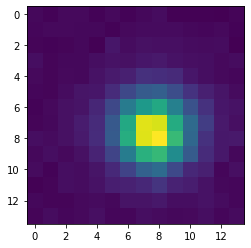

006412-u2-0141(1550.5,516.5)


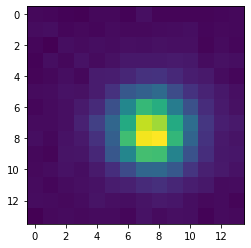

006412-u2-0141(211.64285278320312,1370.7857666015625)


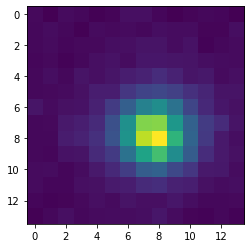

006412-u2-0141(1108.0,77.66666412353516)


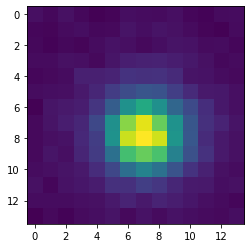

006412-u2-0141(375.5,1038.5)


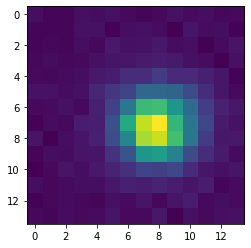

006412-u2-0141(1271.5,957.5)


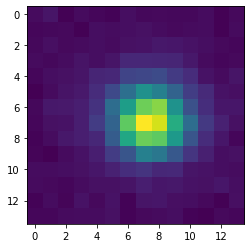

006412-u2-0141(619.5,829.5)


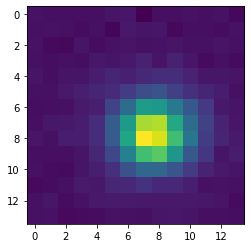

006412-u2-0141(271.5,94.5)


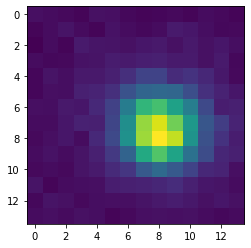

006412-u2-0141(1185.5,1256.0)


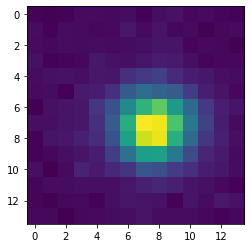

006412-u2-0141(1377.5,459.0)


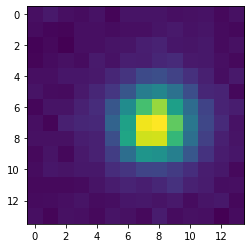

006412-u2-0141(908.5,260.0)


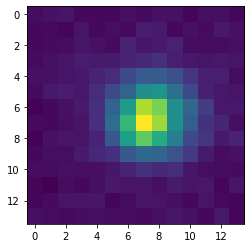

006412-u2-0141(1666.5,925.5)


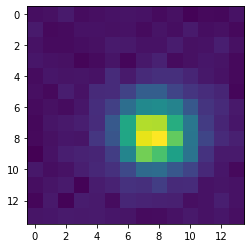

006412-u2-0141(1194.5,375.5)


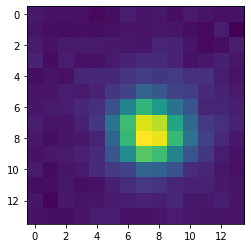

006412-u2-0141(272.5,1016.5)


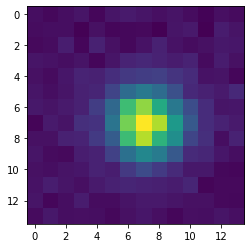

006412-u2-0141(457.5,313.5)


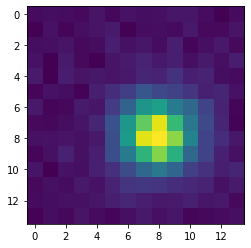

006412-u2-0141(1999.5,555.0)


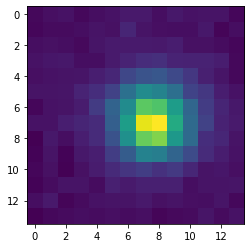

006412-u2-0141(69.0,144.0)


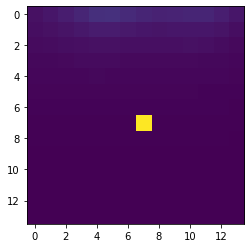

006920-u6-0386(1280.1666259765625,986.5)


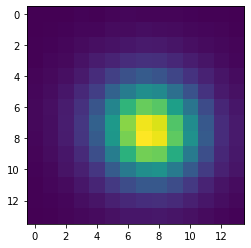

006920-u6-0386(1578.0,342.0)


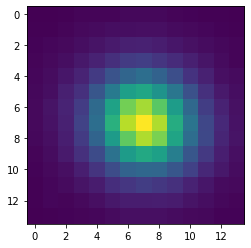

006920-u6-0386(1997.8243408203125,386.7162170410156)


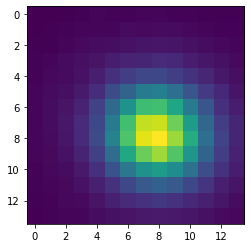

006920-u6-0386(856.5,1433.5)


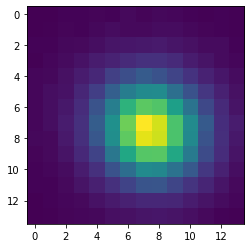

006920-u6-0386(1745.12158203125,564.1756591796875)


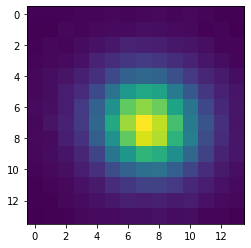

006920-u6-0386(212.7413787841797,89.81034851074219)


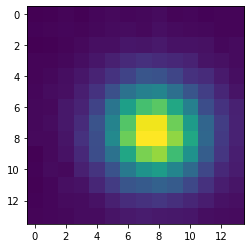

006920-u6-0386(1151.9193115234375,1311.5968017578125)


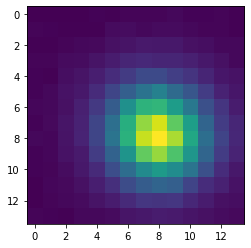

006920-u6-0386(1776.5,378.5)


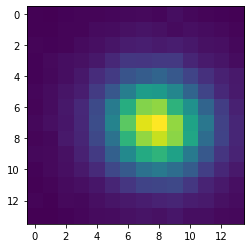

006920-u6-0386(1316.5,885.5)


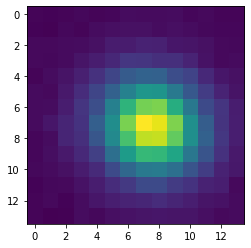

006920-u6-0386(705.5,864.5)


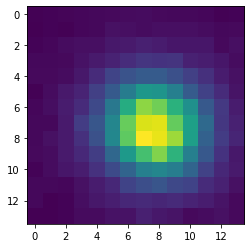

006920-u6-0386(1306.8333740234375,129.16667175292972)


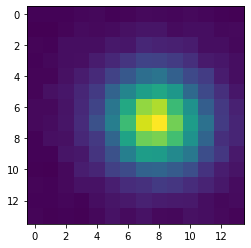

006920-u6-0386(706.75,668.5)


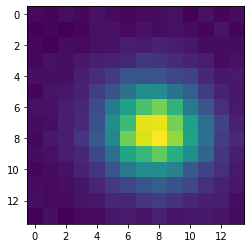

006920-u6-0386(1391.5,642.5)


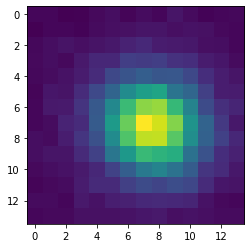

006920-u6-0386(1509.0,1365.5)


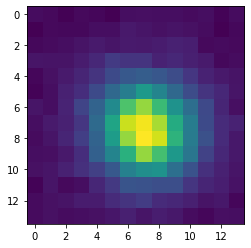

006920-u6-0386(2001.5,600.0)


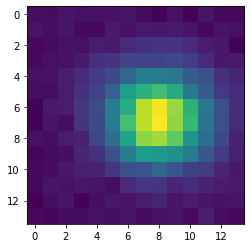

006920-u6-0386(481.0,772.0)


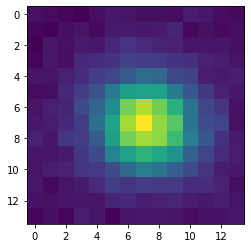

006314-u5-0654(1023.5,744.0)


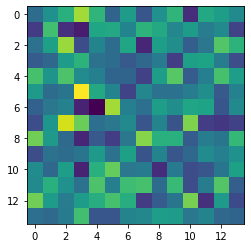

006447-u2-0282(64.5,272.5)


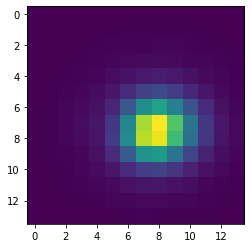

006447-u2-0282(520.125,1063.5)


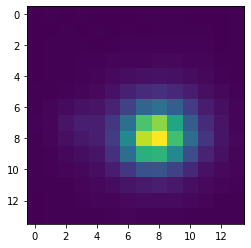

006447-u2-0282(115.5,306.5)


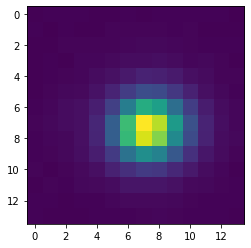

006447-u2-0282(65.5,1333.5)


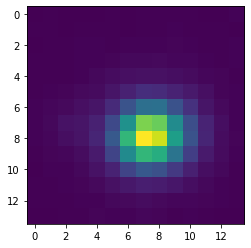

006447-u2-0282(1614.0833740234375,1331.0)


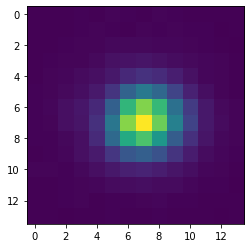

006447-u2-0282(1410.0833740234375,211.0)


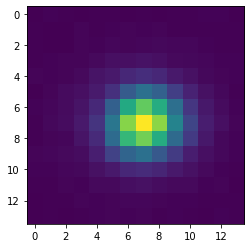

006447-u2-0282(935.5999755859376,1204.0)


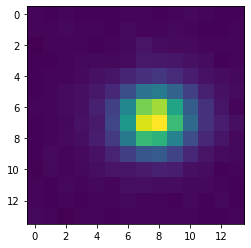

006447-u2-0282(1447.5,1364.5)


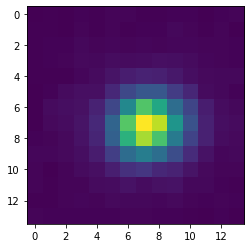

006447-u2-0282(887.0,1056.0)


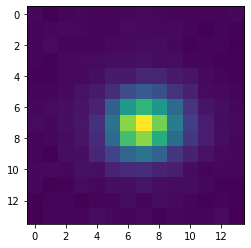

006447-u2-0282(1434.0,1203.0)


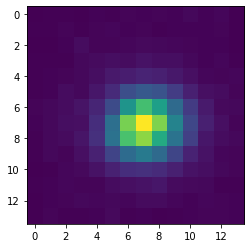

006447-u2-0282(1048.75,263.5)


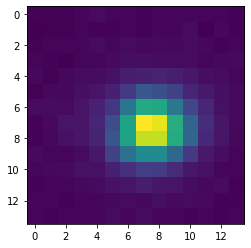

006447-u2-0282(1274.0,607.5)


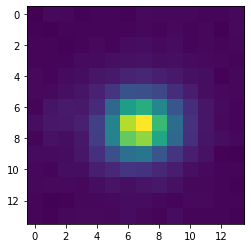

006447-u2-0282(1211.300048828125,829.7000122070312)


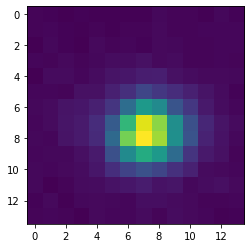

006447-u2-0282(1284.5,124.5)


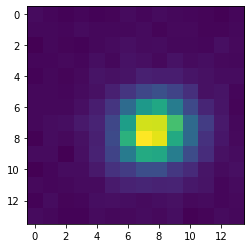

006447-u2-0282(1326.5,490.5)


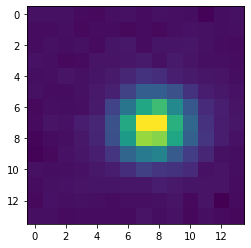

006447-u2-0282(924.5,43.5)


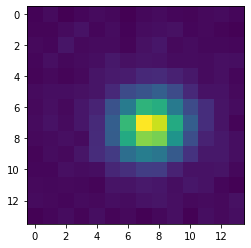

006447-u2-0282(679.0,1238.25)


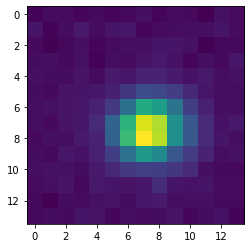

006447-u2-0282(918.0,452.5)


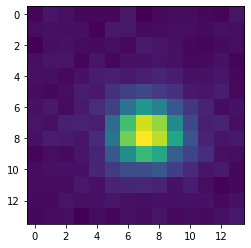

006447-u2-0282(706.5,1473.5)


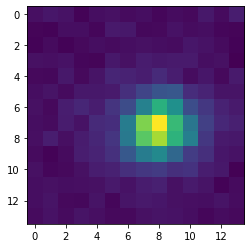

006447-u2-0282(1445.5,1187.5)


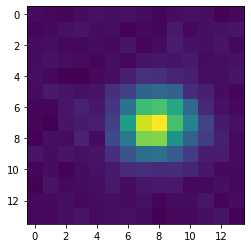

006447-u2-0282(236.0,1072.0)


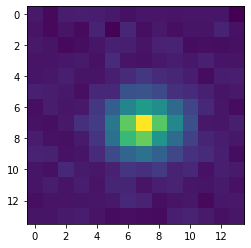

001331-u4-0228(1824.9959716796875,1221.7239990234375)


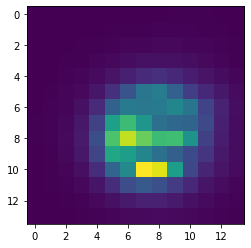

001331-u4-0228(592.1923217773438,450.80767822265625)


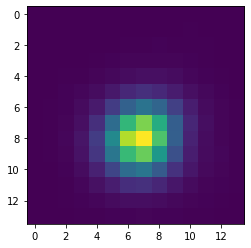

001331-u4-0228(1569.625,152.4375)


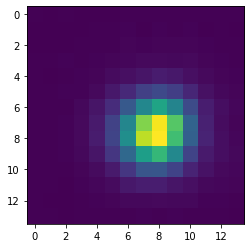

001331-u4-0228(991.5,1180.5)


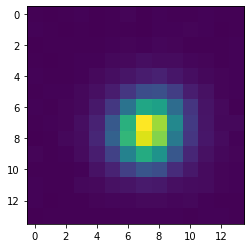

001331-u4-0228(643.6428833007812,523.3571166992189)


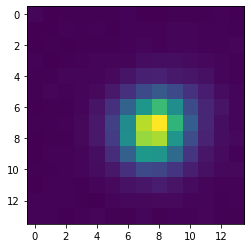

001331-u4-0228(1643.75,840.5)


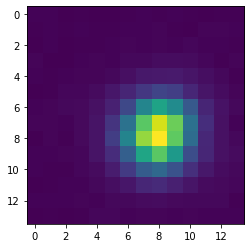

001331-u4-0228(1584.300048828125,89.30000305175781)


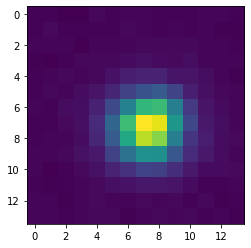

001331-u4-0228(735.0,400.5)


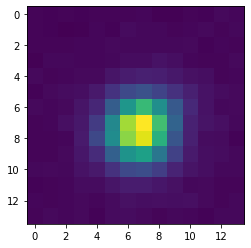

001331-u4-0228(67.0,439.0)


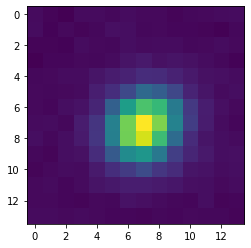

001331-u4-0228(1089.75,659.75)


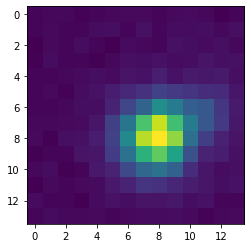

001331-u4-0228(1571.5,1124.5)


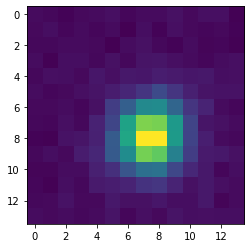

001331-u4-0228(1787.5,472.5)


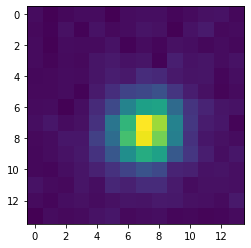

001331-u4-0228(1655.0,117.75)


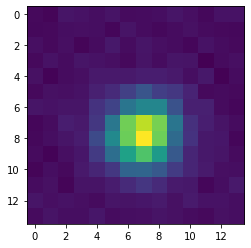

001331-u4-0228(12.833333015441895,77.16666412353516)


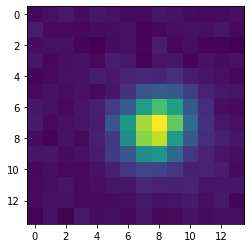

001331-u4-0228(188.5,1395.0)


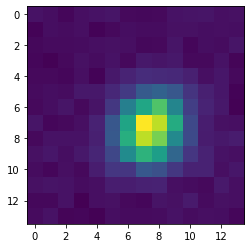

001331-u4-0228(913.5,30.5)


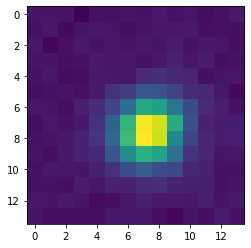

001331-u4-0228(391.5,1057.0)


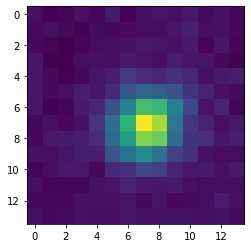

003225-u6-0319(267.32608032226557,591.0652465820312)


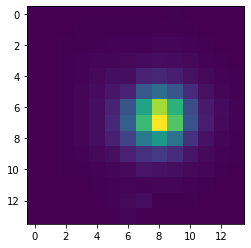

003225-u6-0319(470.0,1429.0)


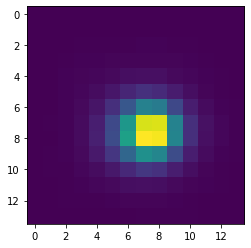

003225-u6-0319(1590.8125,1328.0)


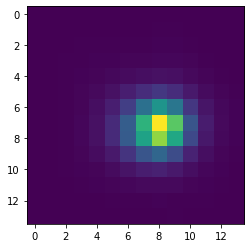

003225-u6-0319(1012.5,1374.5)


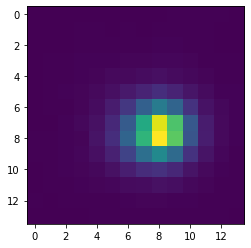

003225-u6-0319(893.4000244140625,601.0)


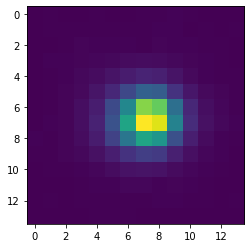

003225-u6-0319(293.78570556640625,34.21428680419922)


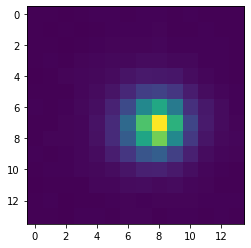

003225-u6-0319(1793.5,1271.5)


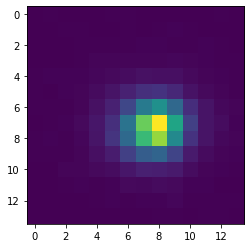

003225-u6-0319(1374.0,1242.0)


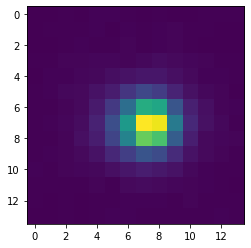

003225-u6-0319(888.75,966.5)


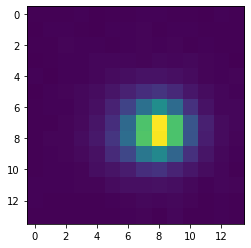

003225-u6-0319(1283.75,1340.5)


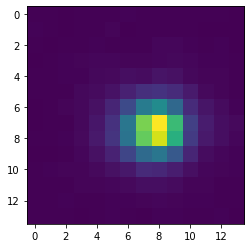

003225-u6-0319(1152.0,375.5)


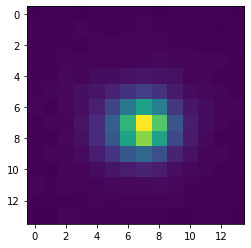

003225-u6-0319(220.5,313.0)


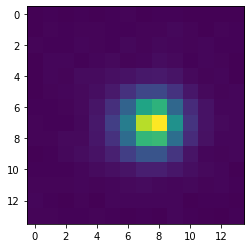

003225-u6-0319(406.0,924.5)


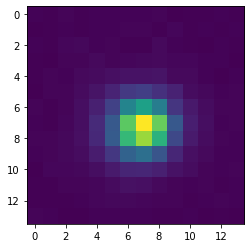

003225-u6-0319(37.5,222.5)


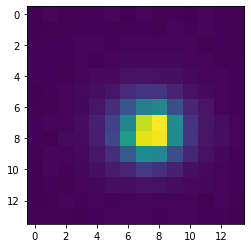

003225-u6-0319(997.8333129882812,1368.5)


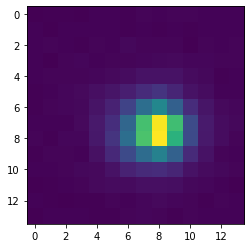

003225-u6-0319(297.29998779296875,1414.699951171875)


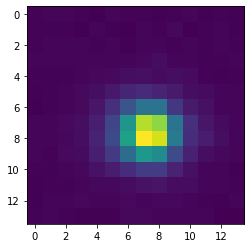

003225-u6-0319(485.0,791.5)


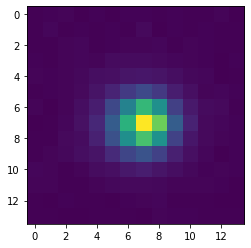

003225-u6-0319(477.70001220703125,392.2999877929688)


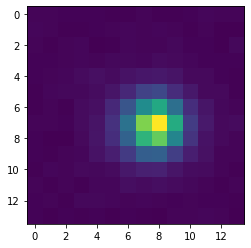

003225-u6-0319(26.29999923706055,263.29998779296875)


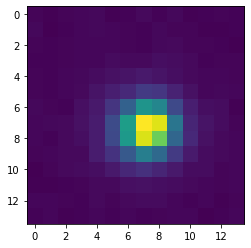

003225-u6-0319(498.5,1313.0)


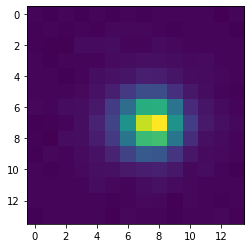

003225-u6-0319(1085.5,1113.5)


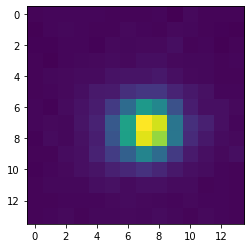

003225-u6-0319(596.0,733.75)


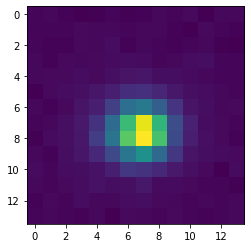

003225-u6-0319(1075.0,522.75)


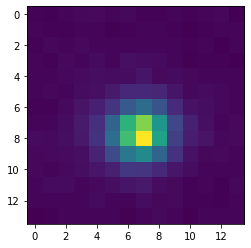

003225-u6-0319(1968.8333740234373,142.8333282470703)


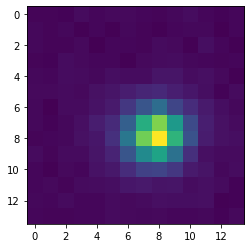

003225-u6-0319(1569.0,39.0)


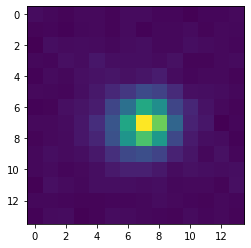

003225-u6-0319(1438.0,1350.5)


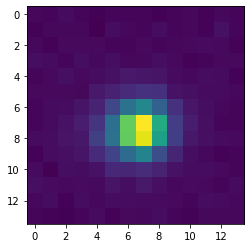

003225-u6-0319(897.5,1129.5)


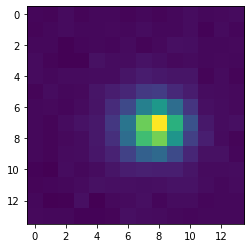

003225-u6-0319(902.5,255.5)


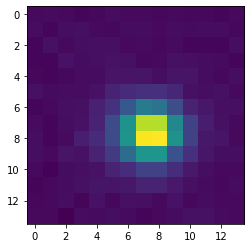

003225-u6-0319(1827.5,237.5)


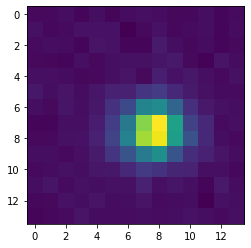

003225-u6-0319(1453.5,204.5)


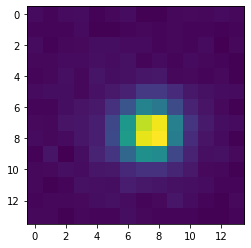

003225-u6-0319(808.5,1254.5)


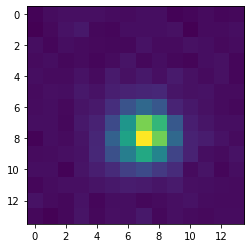

003225-u6-0319(416.5,1207.5)


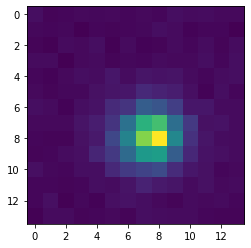

003225-u6-0319(1480.5,1081.5)


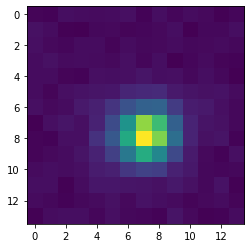

003225-u6-0319(424.0,601.0)


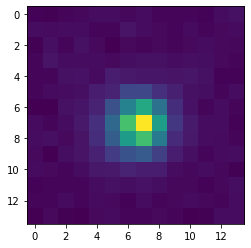

003225-u6-0319(686.0,410.0)


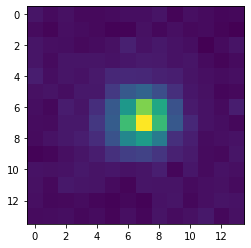

003225-u6-0319(2010.0,325.0)


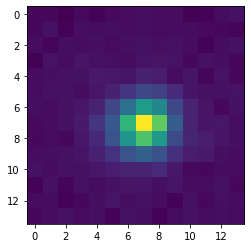

003225-u6-0319(1447.0,59.5)


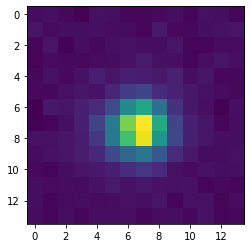

003513-u6-0031(246.0620880126953,234.8006591796875)


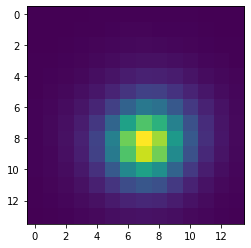

003513-u6-0031(145.5,781.5)


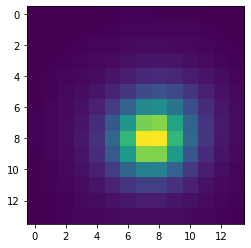

003513-u6-0031(1643.65380859375,683.1153564453125)


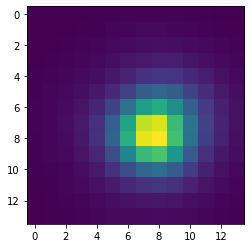

003513-u6-0031(1678.9166259765625,932.2222290039062)


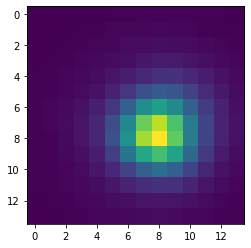

003513-u6-0031(1848.300048828125,1078.5)


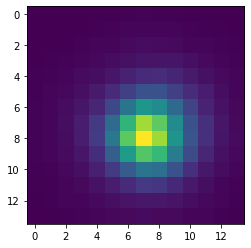

003513-u6-0031(430.5,266.5)


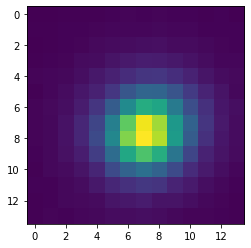

003513-u6-0031(551.3571166992189,1148.357177734375)


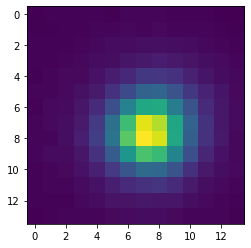

003513-u6-0031(1230.1666259765625,57.83333206176758)


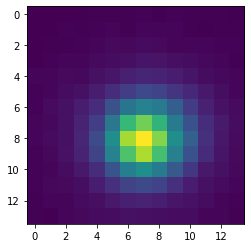

003513-u6-0031(959.0454711914062,386.6818237304688)


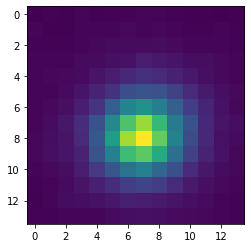

003513-u6-0031(1863.1842041015625,1303.605224609375)


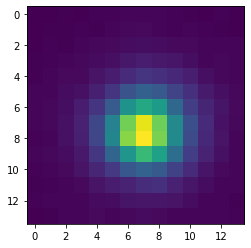

003513-u6-0031(710.0,615.0)


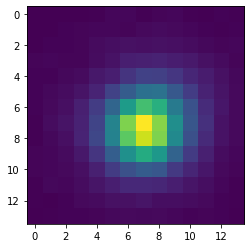

003513-u6-0031(1575.0,1096.0)


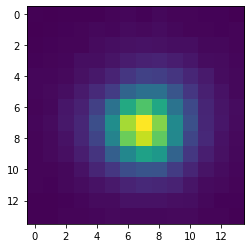

003513-u6-0031(304.0,238.0)


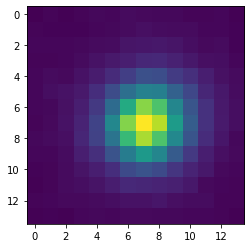

003513-u6-0031(105.72222137451172,1025.27783203125)


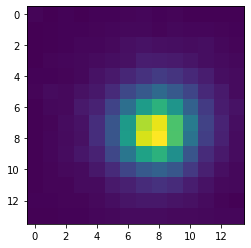

003513-u6-0031(1219.5,580.5)


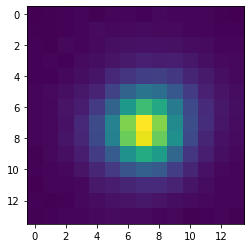

003513-u6-0031(916.0,511.8333435058594)


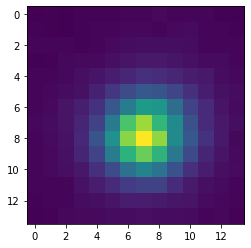

003513-u6-0031(351.0,1335.0)


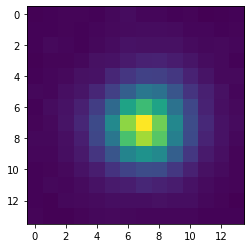

003513-u6-0031(2004.5,561.5)


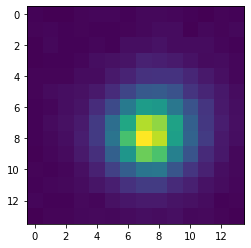

003513-u6-0031(673.5,146.5)


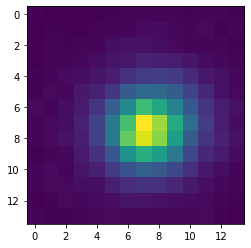

003513-u6-0031(1965.300048828125,1005.7000122070312)


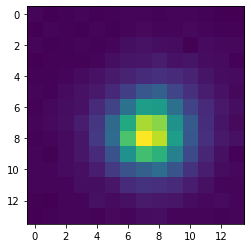

003513-u6-0031(416.6428527832031,654.2857055664062)


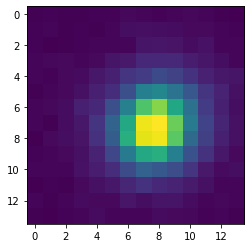

003513-u6-0031(1183.0,412.0)


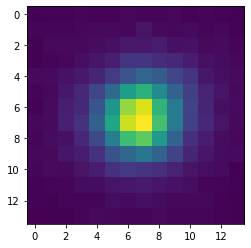

003513-u6-0031(1411.0,142.0)


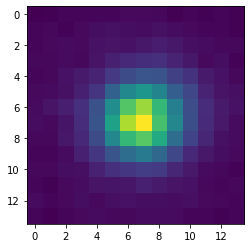

003513-u6-0031(1436.0,87.0)


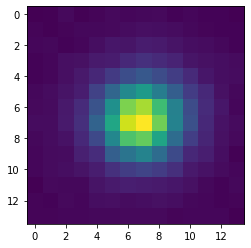

003513-u6-0031(1364.5,1365.8333740234375)


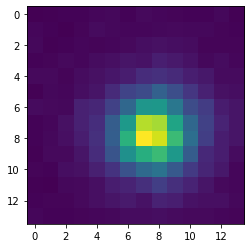

003513-u6-0031(750.0,1402.3333740234375)


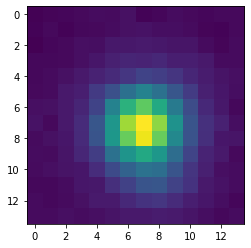

003513-u6-0031(1437.5,1352.5)


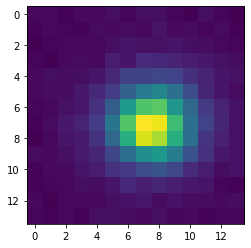

003513-u6-0031(2036.0,509.3333435058594)


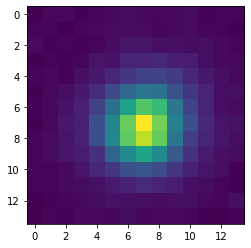

003513-u6-0031(1810.3333740234373,497.0)


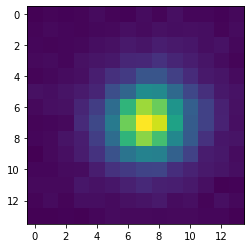

003513-u6-0031(1603.5,1371.5)


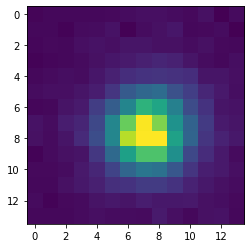

003513-u6-0031(916.5,993.5)


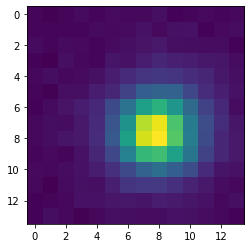

003513-u6-0031(1031.0,1126.0)


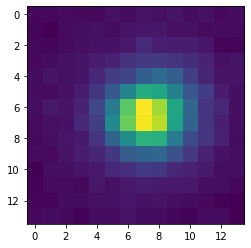

003513-u6-0031(595.0,471.25)


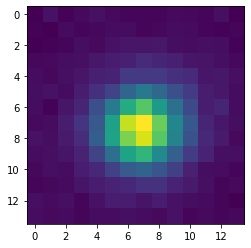

003513-u6-0031(953.8333129882812,1125.8333740234377)


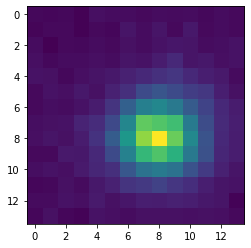

003513-u6-0031(715.0,856.5)


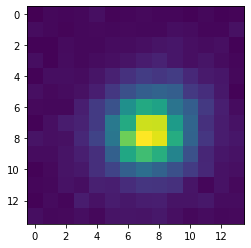

003513-u6-0031(1310.5,1201.5)


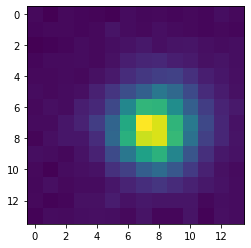

003513-u6-0031(1480.5,705.5)


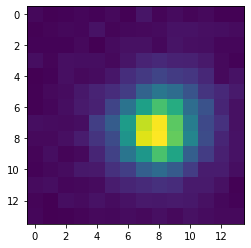

003513-u6-0031(2021.5,379.5)


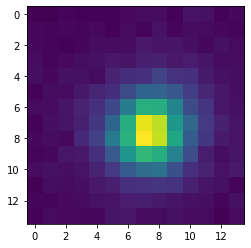

003513-u6-0031(760.0,320.5)


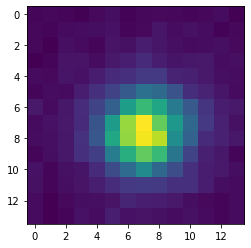

003513-u6-0031(39.0,215.0)


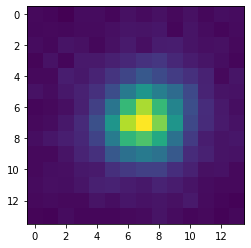

003513-u6-0031(874.5,22.5)


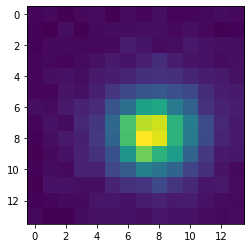

003513-u6-0031(1217.5,1388.5)


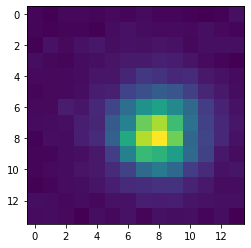

003513-u6-0031(1768.5,1297.5)


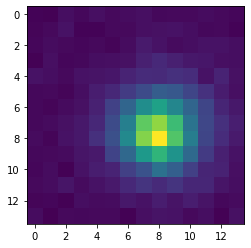

003513-u6-0031(811.0,1272.0)


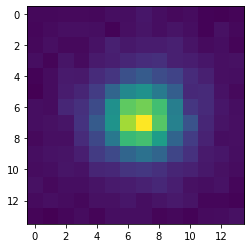

003513-u6-0031(1181.0,1152.0)


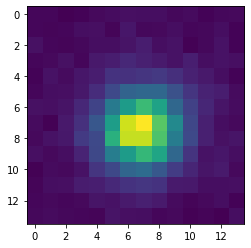

003513-u6-0031(483.0,416.0)


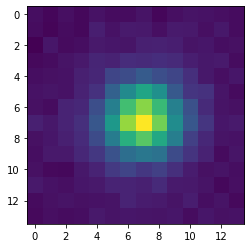

003513-u6-0031(1116.0,372.5)


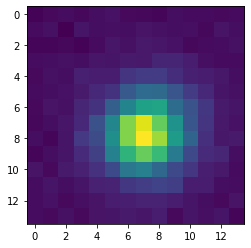

005194-u1-0288(895.5,564.5)


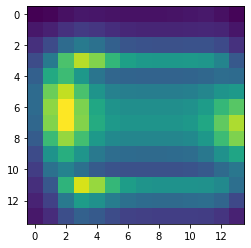

005194-u1-0288(401.8571472167969,601.5)


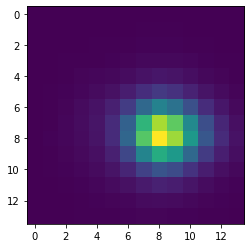

005194-u1-0288(253.4565277099609,157.1413116455078)


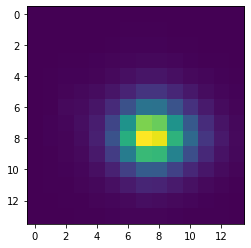

005194-u1-0288(1193.4285888671875,58.71428680419922)


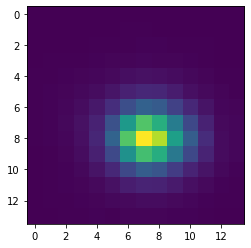

005194-u1-0288(478.4444580078125,574.0)


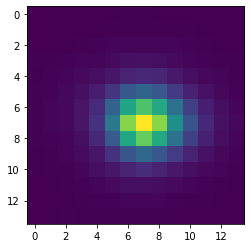

005194-u1-0288(1547.5,825.5)


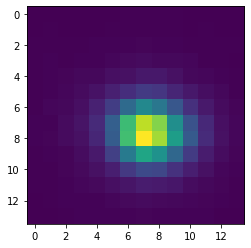

005194-u1-0288(1802.5,1408.0)


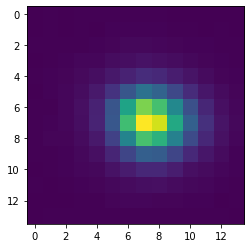

005194-u1-0288(73.5,536.5)


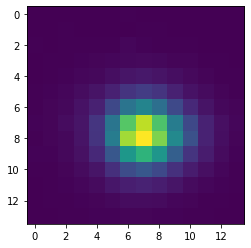

005194-u1-0288(566.4285888671875,762.0)


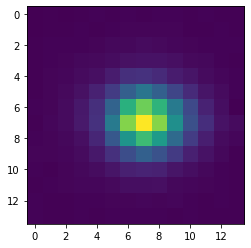

005194-u1-0288(1358.5,2.0)


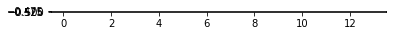

005194-u1-0288(583.5,805.0)


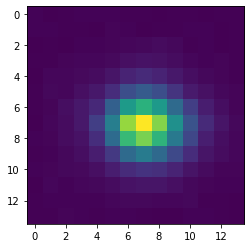

005194-u1-0288(1029.0,782.0)


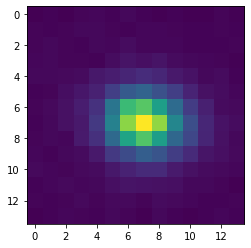

005194-u1-0288(361.5,42.0)


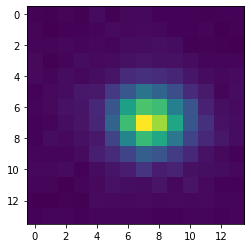

005194-u1-0288(34.5,748.5)


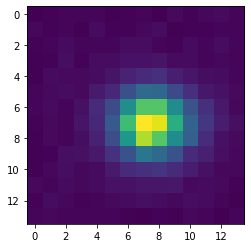

005194-u1-0288(245.0,585.0)


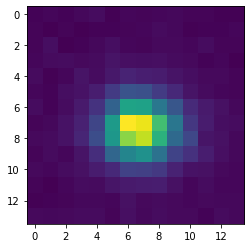

005194-u1-0288(356.1666564941406,156.1666717529297)


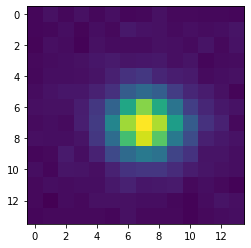

005194-u1-0288(1215.5,1042.5)


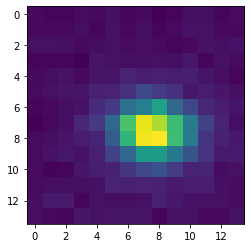

005194-u1-0288(36.5,357.5)


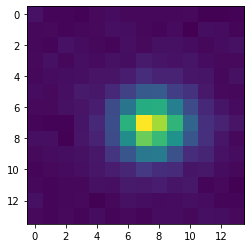

005194-u1-0288(708.5,168.5)


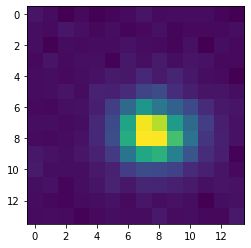

005194-u1-0288(1921.5,1064.0)


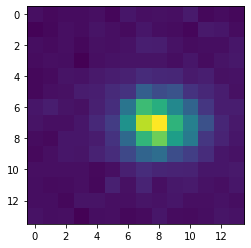

005194-u1-0288(740.5,624.0)


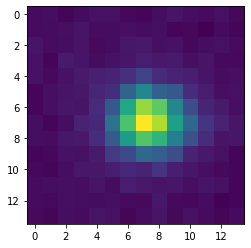

005765-u5-0013(1904.2142333984373,1422.0714111328125)


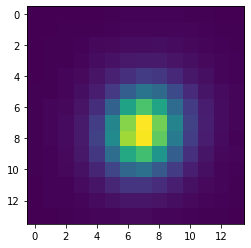

005765-u5-0013(1553.5,587.5)


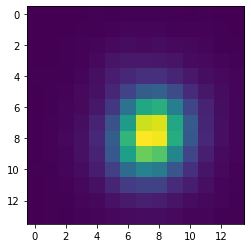

005765-u5-0013(1826.0,925.5)


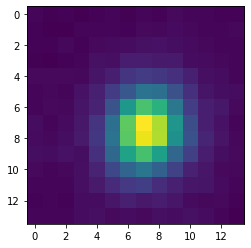

005765-u5-0013(455.0,711.0)


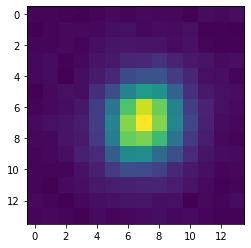

005765-u5-0013(157.7413787841797,379.0517272949219)


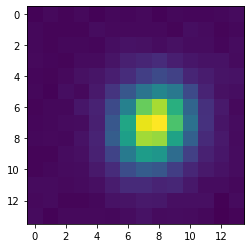

005765-u5-0013(236.0,1226.75)


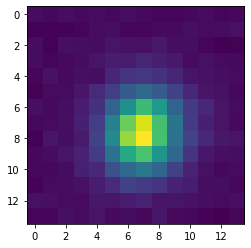

005765-u5-0013(853.5,1342.5)


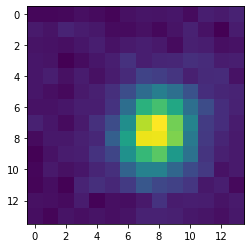

005765-u5-0013(1373.0,195.0)


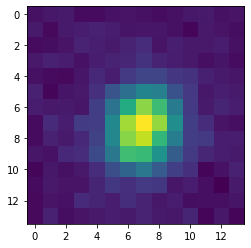

005765-u5-0013(1966.5,784.0)


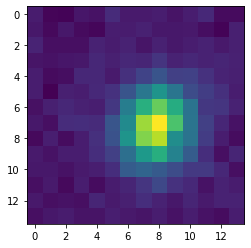

005765-u5-0013(1065.0,1271.5)


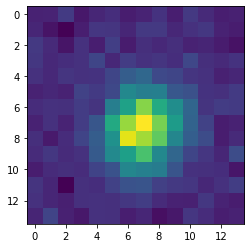

005765-u5-0013(1201.5,713.0)


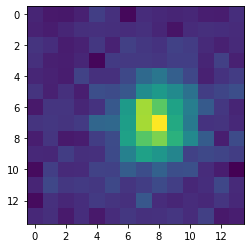

005765-u5-0013(1541.0,1038.0)


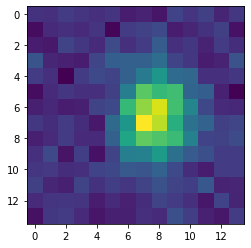

005314-u1-0236(228.0483856201172,1413.6370849609375)


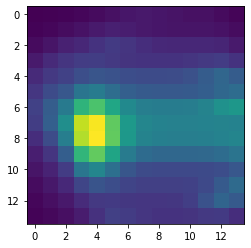

005314-u1-0236(223.0,1297.5)


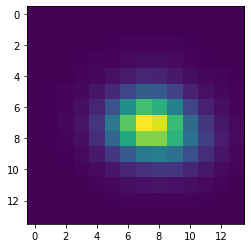

005314-u1-0236(274.0,948.0)


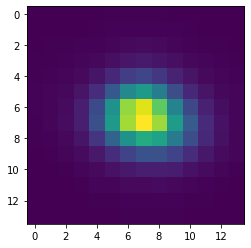

005314-u1-0236(1525.0,340.0)


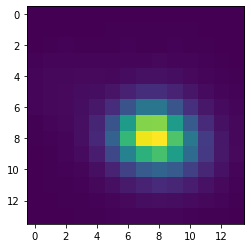

005314-u1-0236(95.5,511.0)


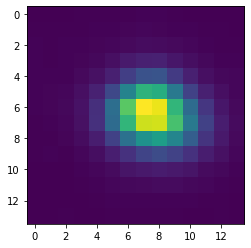

005314-u1-0236(1195.5,480.5)


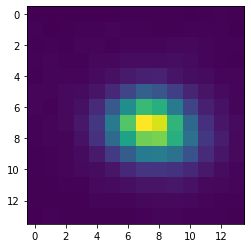

005314-u1-0236(1360.0,1065.5)


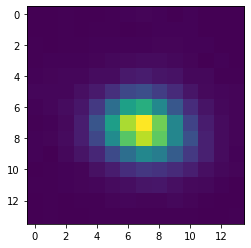

005314-u1-0236(1569.1666259765625,337.5)


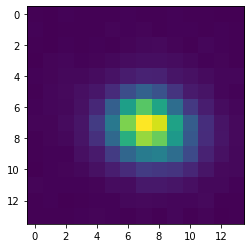

005314-u1-0236(532.5,353.0)


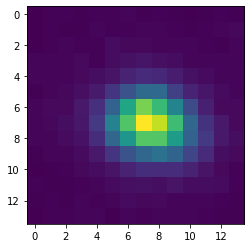

005314-u1-0236(1176.0,1352.5)


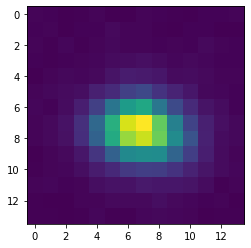

005314-u1-0236(463.0,1437.0)


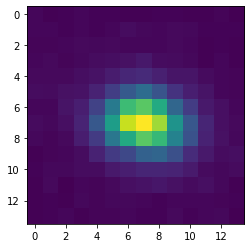

005314-u1-0236(686.0,1471.5)


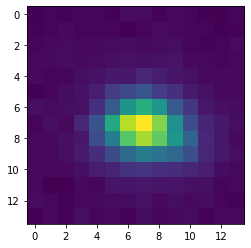

005314-u1-0236(860.0,277.25)


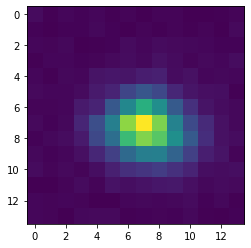

005314-u1-0236(1843.0,1209.5)


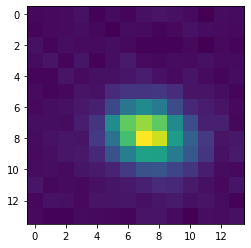

005314-u1-0236(37.5,375.5)


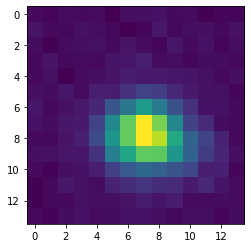

003634-u4-0105(1759.4337158203125,1393.8795166015625)


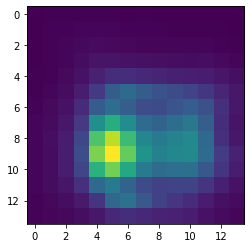

003634-u4-0105(1092.199951171875,391.20001220703125)


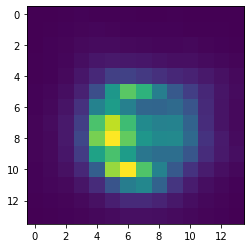

003634-u4-0105(323.78570556640625,1243.7857666015625)


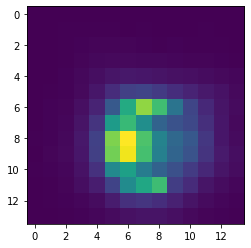

003634-u4-0105(901.8571166992188,878.1428833007812)


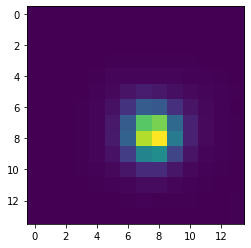

003634-u4-0105(1253.5,1268.5)


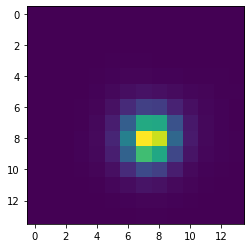

003634-u4-0105(215.85134887695312,215.01351928710938)


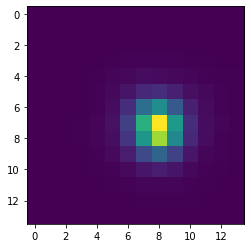

003634-u4-0105(1510.0,933.5)


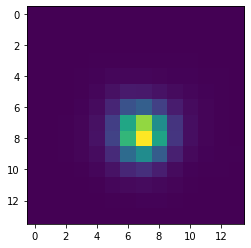

003634-u4-0105(357.0,178.0)


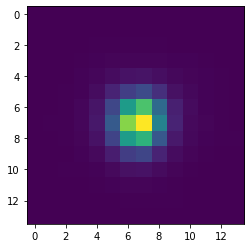

003634-u4-0105(1182.0517578125,604.7413940429688)


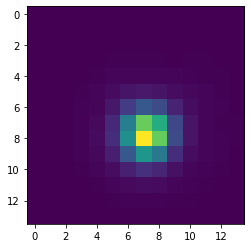

003634-u4-0105(516.5,687.0)


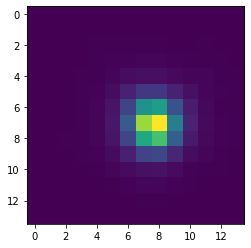

003634-u4-0105(1919.5,1473.0999755859375)


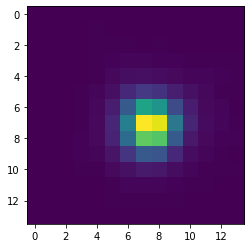

003634-u4-0105(1346.72216796875,930.2777709960938)


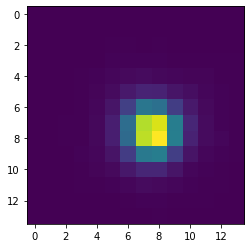

003634-u4-0105(202.0,648.0)


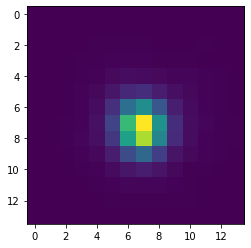

003634-u4-0105(1777.9000244140625,114.0999984741211)


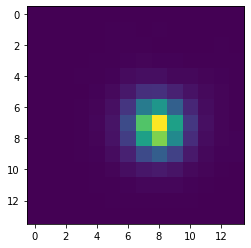

003634-u4-0105(1774.0,100.0)


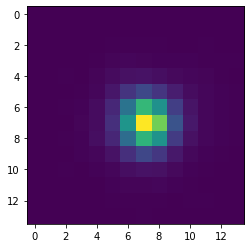

003634-u4-0105(2033.0,975.5)


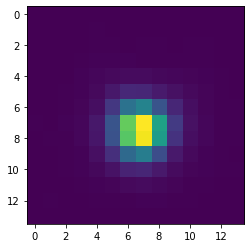

003634-u4-0105(1014.8809814453124,542.40478515625)


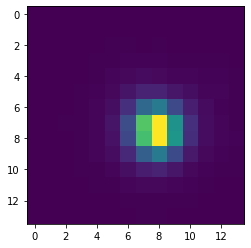

003634-u4-0105(891.5,1262.5)


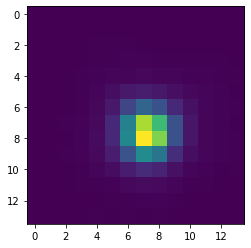

003634-u4-0105(522.5,237.5)


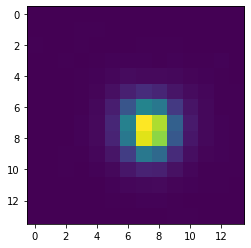

003634-u4-0105(617.5526123046875,868.2894897460938)


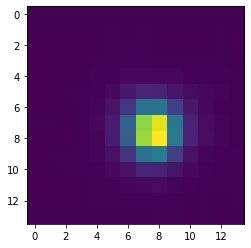

003634-u4-0105(1094.0,1011.5)


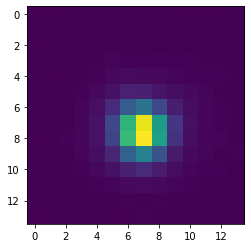

003634-u4-0105(486.0,746.5)


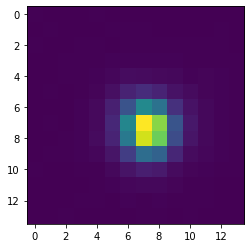

003634-u4-0105(958.0,80.5)


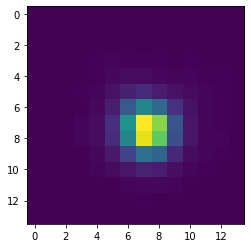

003634-u4-0105(760.0,1435.5)


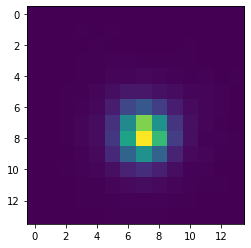

003634-u4-0105(251.0,1232.5)


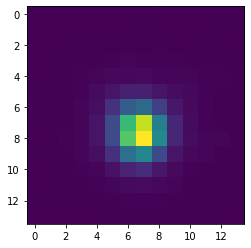

003634-u4-0105(1732.4000244140625,341.0)


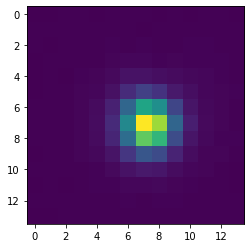

003634-u4-0105(1221.7857666015625,1145.7857666015625)


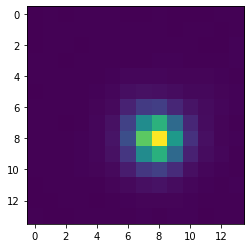

003634-u4-0105(1593.0,1346.0)


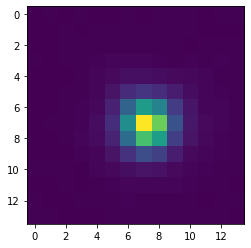

003634-u4-0105(1172.5,736.5)


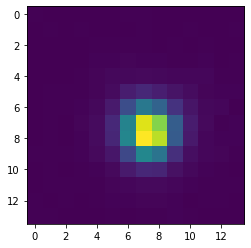

003634-u4-0105(2012.5,635.5)


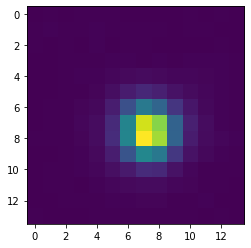

003634-u4-0105(1266.0,1304.0)


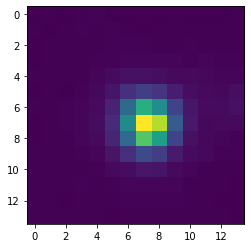

003634-u4-0105(584.7000122070312,981.7000122070312)


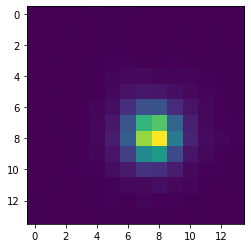

003634-u4-0105(181.0,470.0)


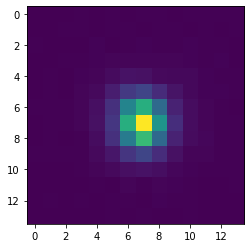

003634-u4-0105(465.0,208.0)


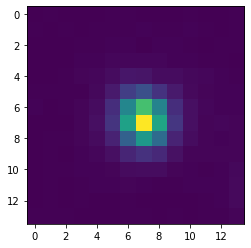

003634-u4-0105(1363.0,167.0)


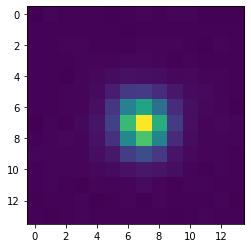

003634-u4-0105(949.5,295.5)


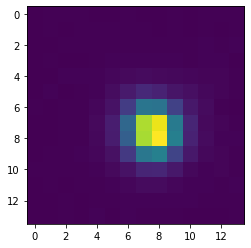

003634-u4-0105(1501.5,1296.5)


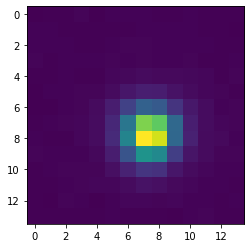

003634-u4-0105(1570.5,970.1666870117188)


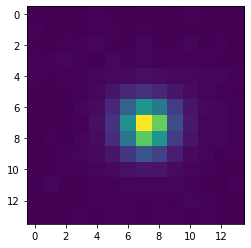

003634-u4-0105(443.8333435058594,716.5)


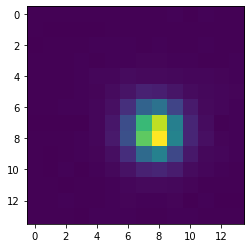

003634-u4-0105(762.5,9.166666984558104)


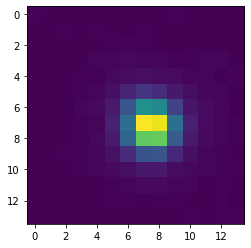

003634-u4-0105(1081.699951171875,1431.699951171875)


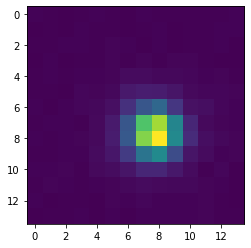

003634-u4-0105(1608.699951171875,1111.699951171875)


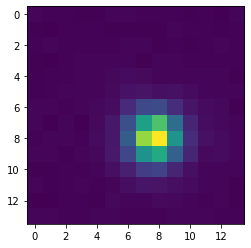

003634-u4-0105(798.2999877929688,74.30000305175781)


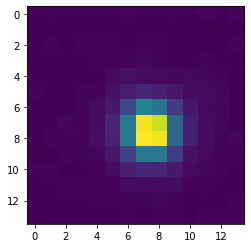

003634-u4-0105(1493.5,1053.5)


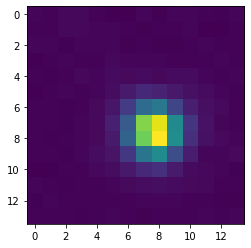

003634-u4-0105(423.5,582.5)


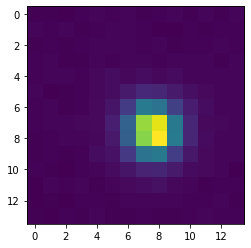

003634-u4-0105(1574.5,547.5)


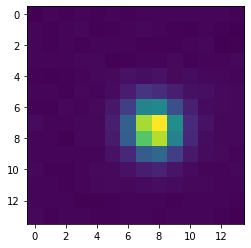

003634-u4-0105(869.0,507.0)


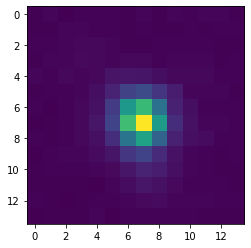

003634-u4-0105(2017.1666259765625,435.5)


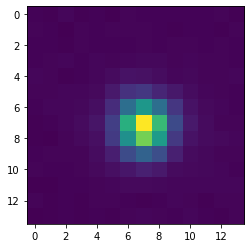

003634-u4-0105(474.0,212.0)


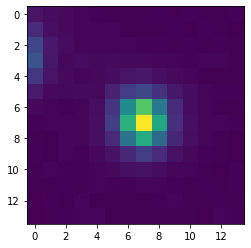

003634-u4-0105(581.3571166992188,145.7857208251953)


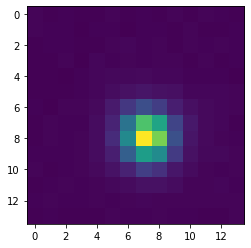

003634-u4-0105(58.5,1183.5)


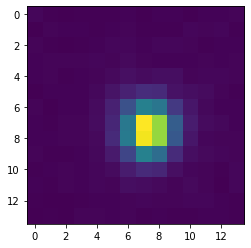

003634-u4-0105(47.25,549.75)


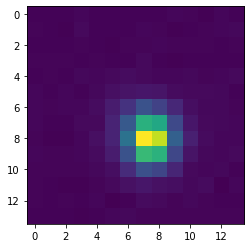

003634-u4-0105(1717.5,349.0)


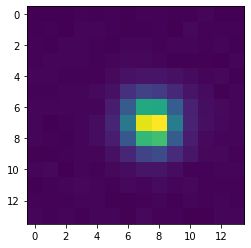

003634-u4-0105(910.3333129882812,1277.0)


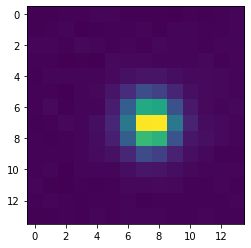

003634-u4-0105(80.0,1167.3333740234375)


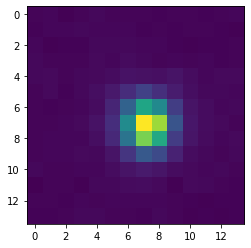

003634-u4-0105(1602.0,1008.3333129882812)


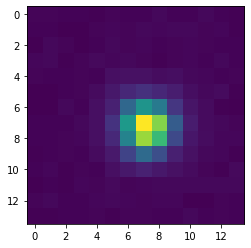

003634-u4-0105(356.0,912.3333129882812)


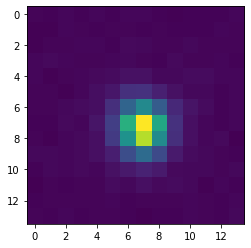

003634-u4-0105(874.5,1378.5)


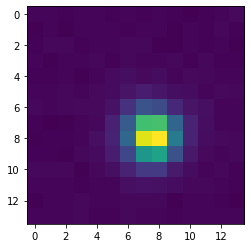

003634-u4-0105(13.5,966.5)


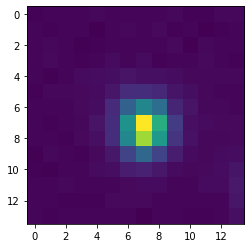

003634-u4-0105(211.5,716.5)


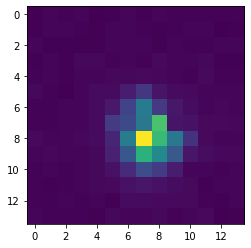

003634-u4-0105(1767.5,464.5)


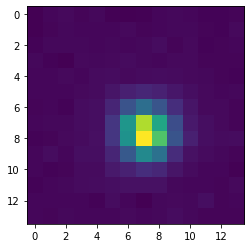

003634-u4-0105(423.5,158.5)


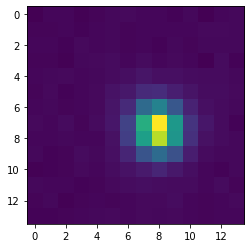

003634-u4-0105(1150.0,596.0)


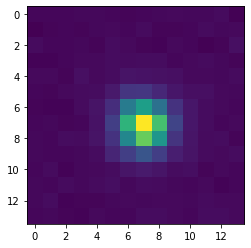

003634-u4-0105(1307.0,578.0)


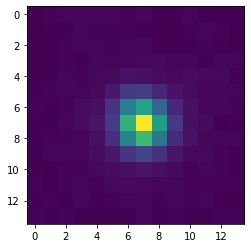

003634-u4-0105(1356.0,560.0)


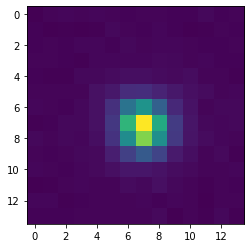

003634-u4-0105(26.0,304.5)


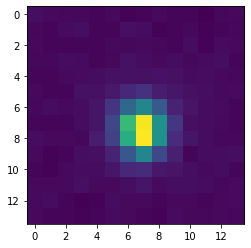

003634-u4-0105(1153.5,295.0)


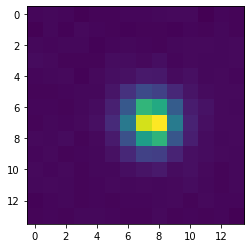

003634-u4-0105(97.0,269.0)


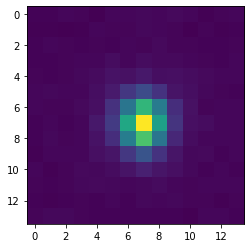

003634-u4-0105(1937.0,48.5)


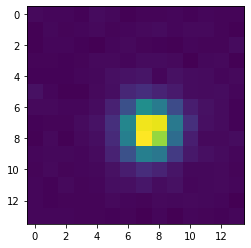

003634-u4-0105(730.0,397.0)


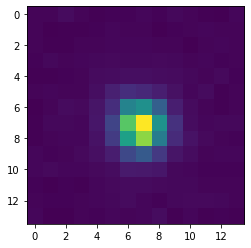

003634-u4-0105(1634.0,343.0)


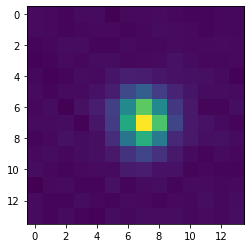

003634-u4-0105(188.0,48.0)


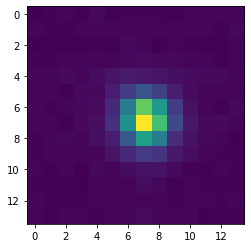

003634-u4-0105(488.0,1460.25)


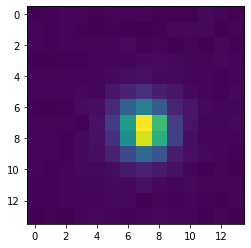

003634-u4-0105(1507.0,1343.25)


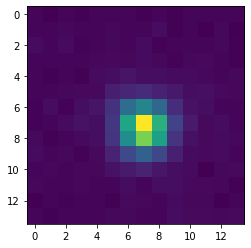

003634-u4-0105(647.0,1287.75)


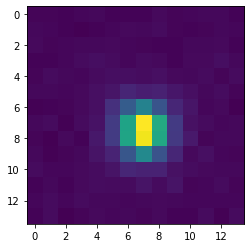

003634-u4-0105(110.0,1152.75)


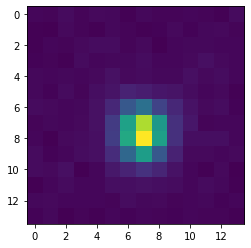

003634-u4-0105(420.0,1151.25)


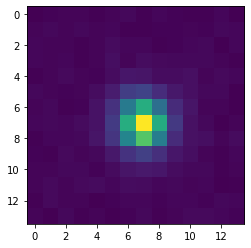

003634-u4-0105(1130.25,1043.0)


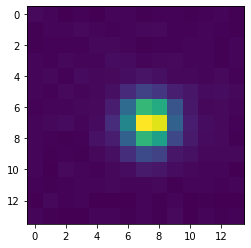

003634-u4-0105(540.25,724.0)


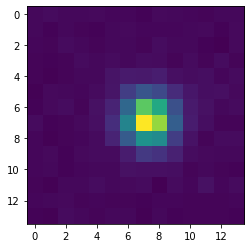

003634-u4-0105(638.0,649.25)


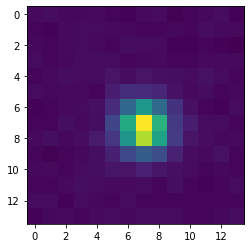

003634-u4-0105(151.75,614.0)


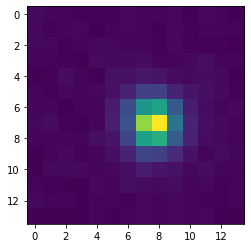

003634-u4-0105(50.0,389.75)


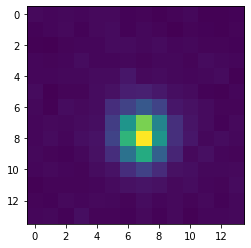

003634-u4-0105(1090.5,342.5)


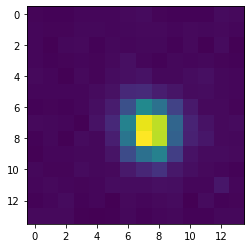

003634-u4-0105(619.0,101.25)


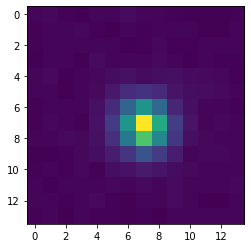

003634-u4-0105(480.8333435058594,20.16666603088379)


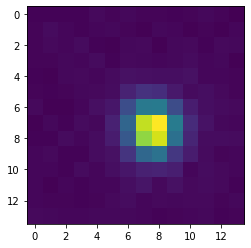

003634-u4-0105(54.0,1485.25)


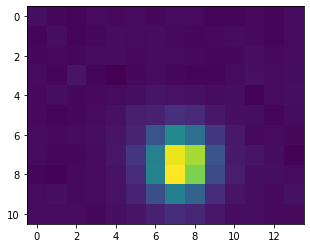

003634-u4-0105(1469.0,1304.25)


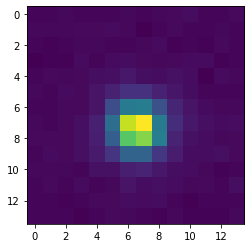

003634-u4-0105(398.0,1161.0)


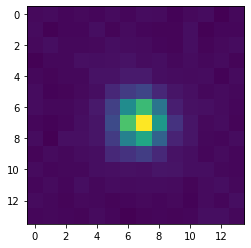

003634-u4-0105(745.5,1026.0)


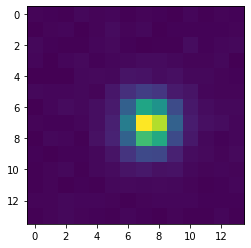

003634-u4-0105(34.0,839.0)


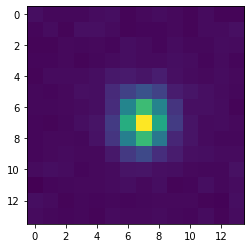

003634-u4-0105(1420.0,724.5)


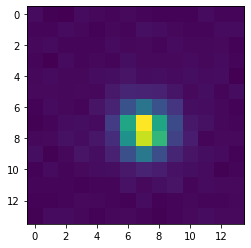

003634-u4-0105(750.0,133.0)


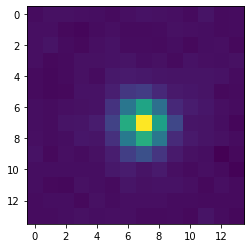

003634-u4-0105(1864.0,1311.5)


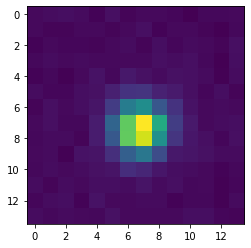

003634-u4-0105(183.5,881.0)


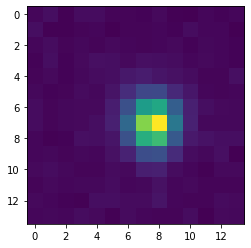

003634-u4-0105(1285.5,572.0)


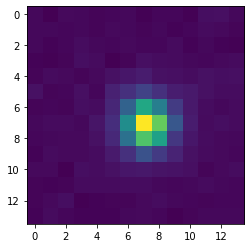

003634-u4-0105(2032.5,1413.5)


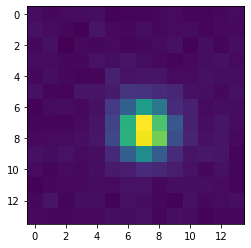

003634-u4-0105(1289.5,1377.5)


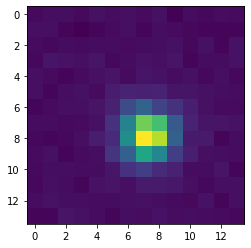

003634-u4-0105(732.5,1013.5)


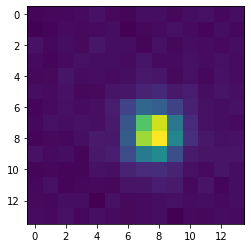

003634-u4-0105(2020.5,976.5)


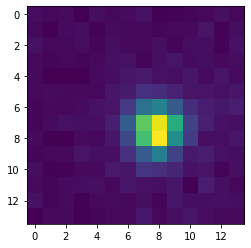

003634-u4-0105(984.5,671.5)


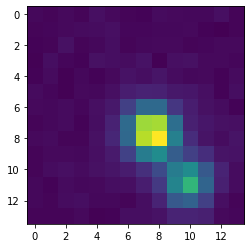

003634-u4-0105(502.0,435.0)


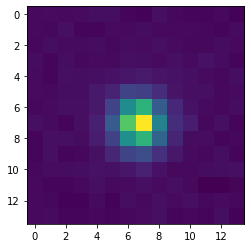

003634-u4-0105(1741.5,130.5)


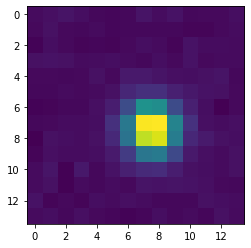

003634-u4-0105(1249.5,116.5)


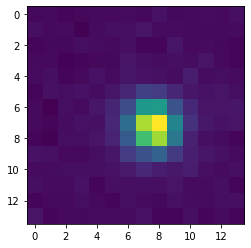

003634-u4-0105(1778.5,27.5)


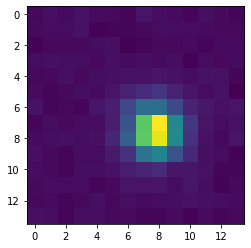

003634-u4-0105(1806.5,1454.5)


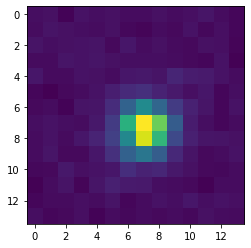

003634-u4-0105(1319.5,1073.5)


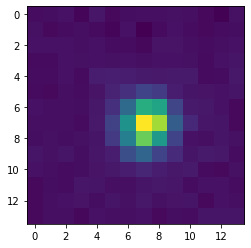

003634-u4-0105(1804.5,1032.5)


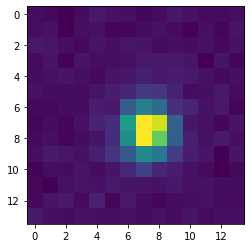

003634-u4-0105(1530.5,988.5)


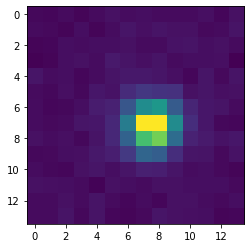

003634-u4-0105(427.5,763.5)


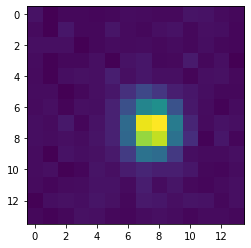

003634-u4-0105(999.0,1467.0)


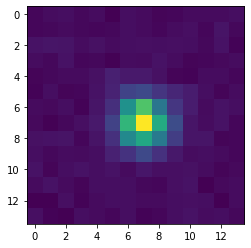

003634-u4-0105(1736.5,1423.0)


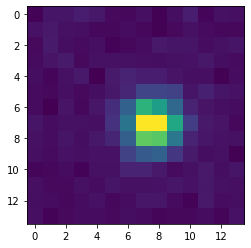

003634-u4-0105(1172.0,1382.5)


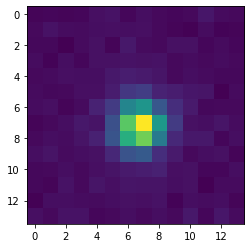

003634-u4-0105(1188.0,1260.5)


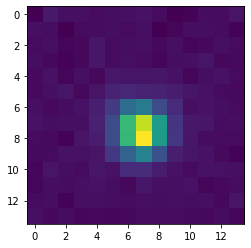

003634-u4-0105(568.0,1199.0)


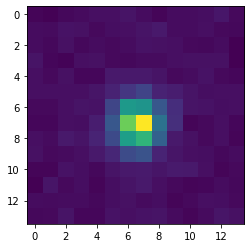

003634-u4-0105(1309.0,1172.5)


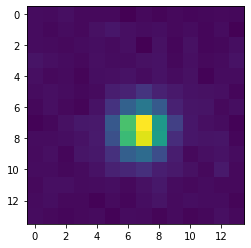

003634-u4-0105(587.5,1136.0)


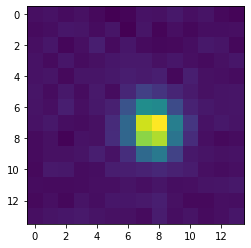

003634-u4-0105(1561.0,997.5)


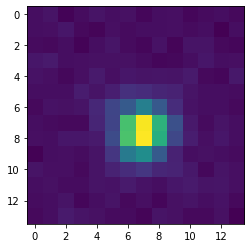

003634-u4-0105(491.0,977.5)


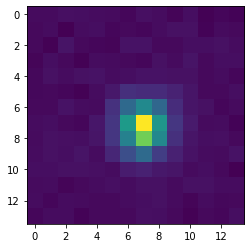

003634-u4-0105(21.0,970.5)


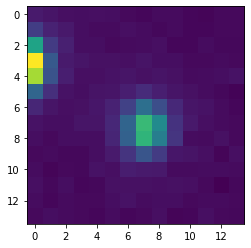

003634-u4-0105(1787.5,722.0)


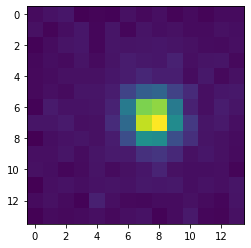

003634-u4-0105(987.0,675.0)


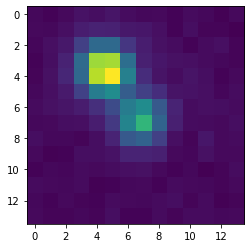

003634-u4-0105(276.0,645.0)


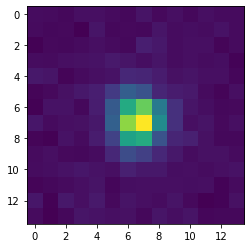

003634-u4-0105(2002.5,589.0)


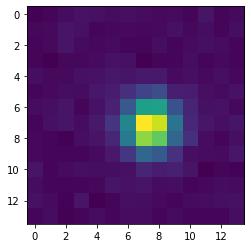

003634-u4-0105(440.0,494.0)


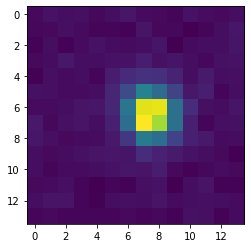

003634-u4-0105(147.5,223.0)


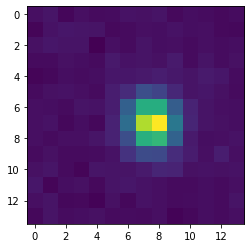

003634-u4-0105(624.0,198.0)


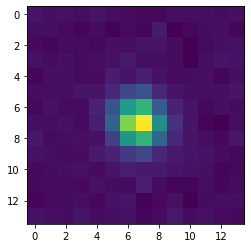

003634-u4-0105(2003.5,185.0)


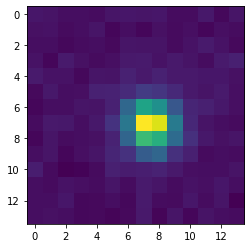

003634-u4-0105(3.0,106.0)


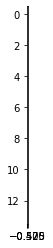

003634-u4-0105(148.5,98.0)


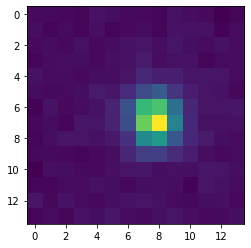

007170-u5-0166(1945.0,895.03125)


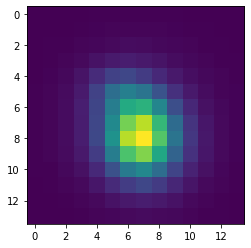

007170-u5-0166(977.5,692.5)


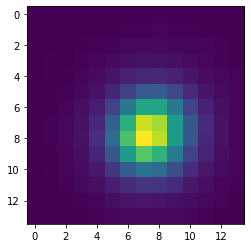

007170-u5-0166(1688.5,543.0)


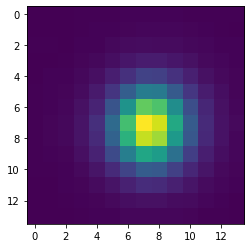

007170-u5-0166(1037.5,213.5)


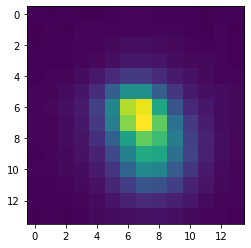

007170-u5-0166(607.2930908203125,1090.1207275390623)


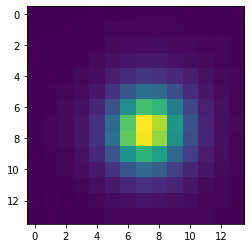

007170-u5-0166(1596.0,782.2777709960938)


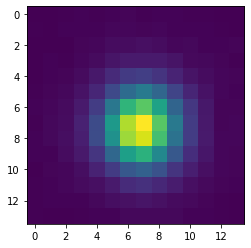

007170-u5-0166(324.7272644042969,1291.3636474609375)


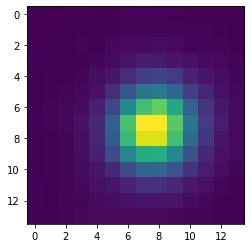

007170-u5-0166(354.1842041015625,1361.4473876953125)


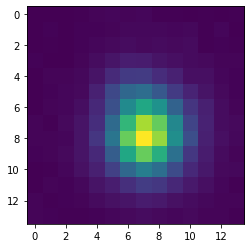

007170-u5-0166(929.5,999.5)


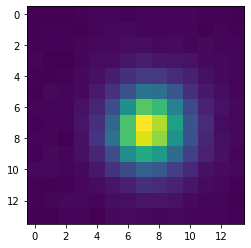

007170-u5-0166(698.6666870117188,1019.3333129882812)


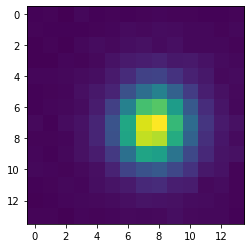

007170-u5-0166(567.0,1223.300048828125)


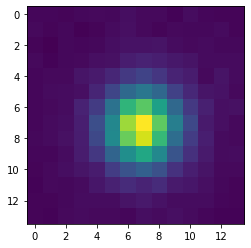

007170-u5-0166(1475.0,1234.5714111328125)


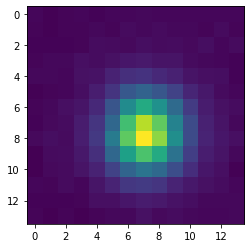

007170-u5-0166(1793.0,1051.4285888671877)


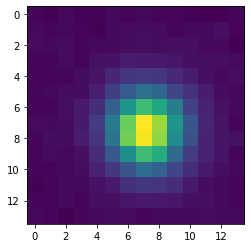

007170-u5-0166(136.30000305175778,1131.300048828125)


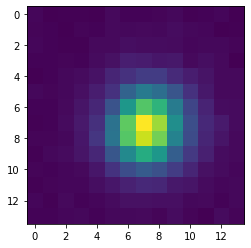

007170-u5-0166(1986.0,1485.0)


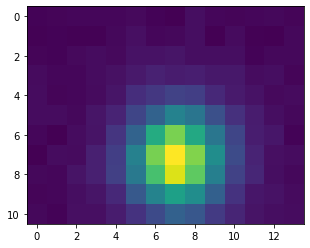

007170-u5-0166(1799.9444580078125,1192.27783203125)


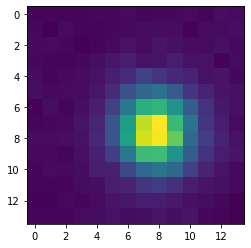

007170-u5-0166(568.5,1371.8333740234375)


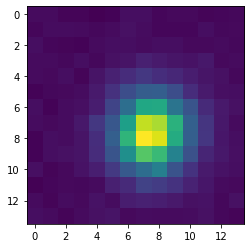

007170-u5-0166(264.0,1213.0)


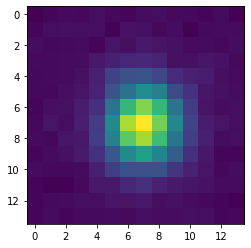

007170-u5-0166(1821.5,767.5)


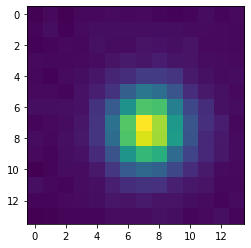

007170-u5-0166(919.0,1049.5)


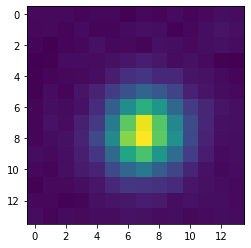

007170-u5-0166(691.5,1461.1666259765625)


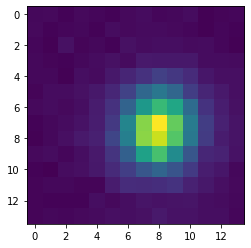

007170-u5-0166(383.5,832.25)


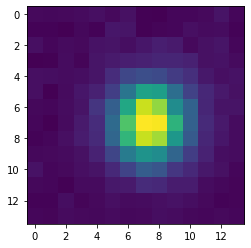

007170-u5-0166(271.5,203.5)


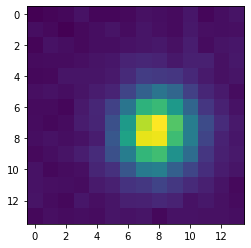

007170-u5-0166(1548.25,14.75)


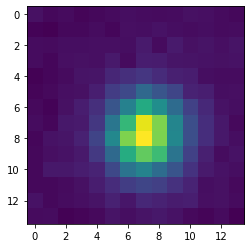

007170-u5-0166(1775.4473876953125,615.2894897460938)


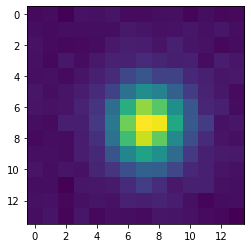

007170-u5-0166(1545.699951171875,1337.699951171875)


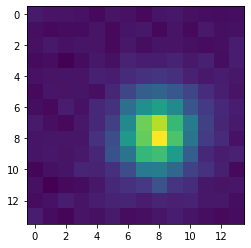

007170-u5-0166(1025.5,1475.0)


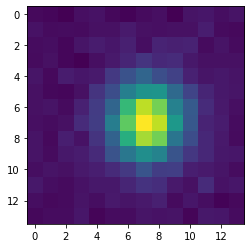

007170-u5-0166(988.0,573.0)


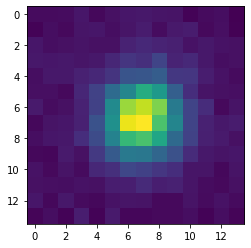

007170-u5-0166(1037.5,376.0)


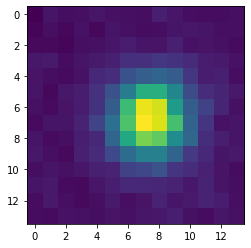

007170-u5-0166(1835.0,1234.0)


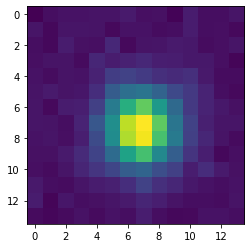

007170-u5-0166(1108.0,768.0)


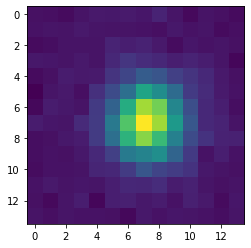

007170-u5-0166(540.5,1188.5)


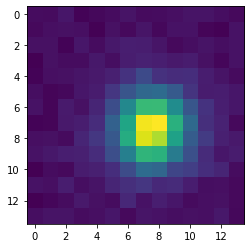

007170-u5-0166(1780.5,1356.0)


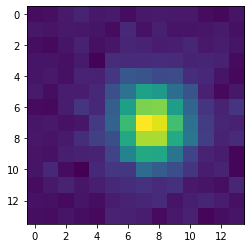

007170-u5-0166(1119.25,882.0)


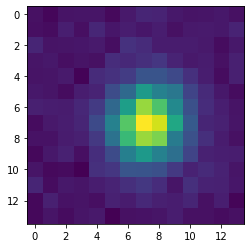

007170-u5-0166(1417.75,366.75)


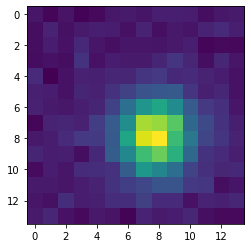

007170-u5-0166(1082.5,210.5)


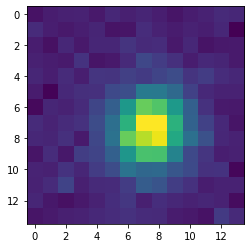

007170-u5-0166(238.6666717529297,1005.0)


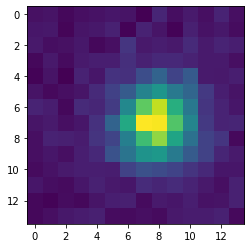

007170-u5-0166(1206.5,343.5)


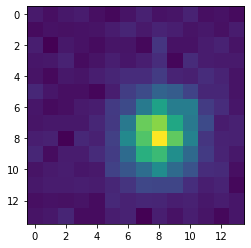

007170-u5-0166(1802.0,678.0)


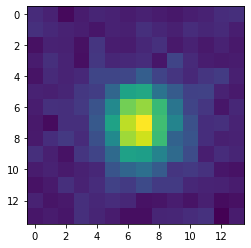

007170-u5-0166(1796.5,301.0)


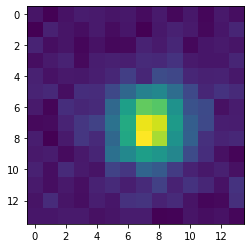

007170-u5-0166(524.5,1297.0)


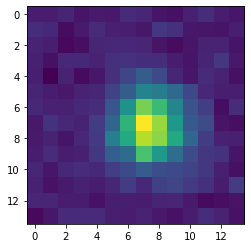

007170-u5-0166(819.0,557.5)


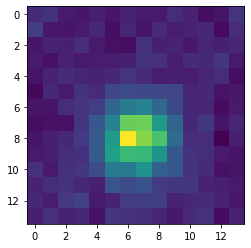

007170-u5-0166(1098.0,61.5)


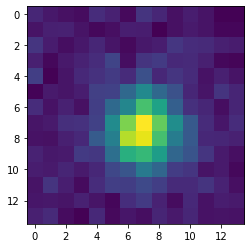

007170-u5-0166(297.5,971.5)


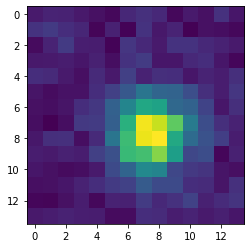

007170-u5-0166(165.5,951.5)


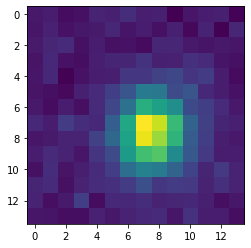

007170-u5-0166(486.5,844.5)


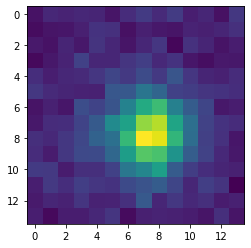

007170-u5-0166(1707.5,219.5)


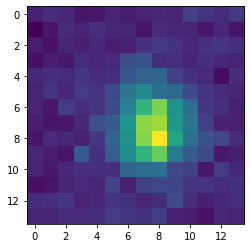

007170-u5-0166(130.5,1162.5)


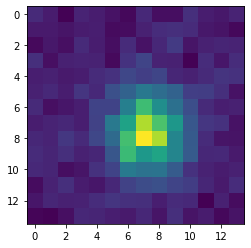

007170-u5-0166(483.0,1149.0)


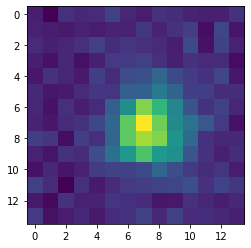

007170-u5-0166(1799.0,414.5)


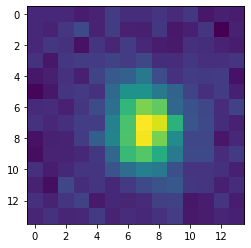

007170-u5-0166(1221.0,214.5)


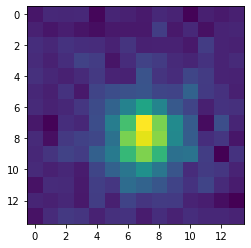

007170-u5-0166(1306.0,64.5)


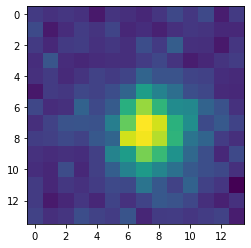

006513-u4-0710(218.27777099609372,741.2777709960938)


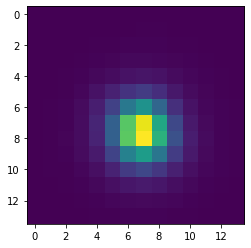

006513-u4-0710(1053.5,54.5)


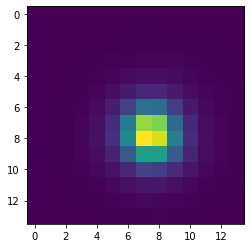

006513-u4-0710(1358.9000244140625,235.5)


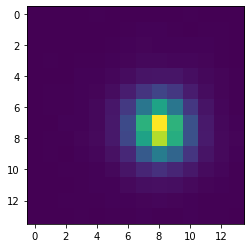

006513-u4-0710(1109.0999755859377,732.9000244140625)


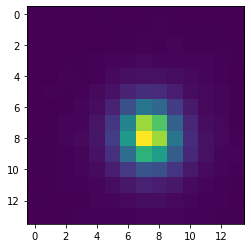

006513-u4-0710(834.5,441.5)


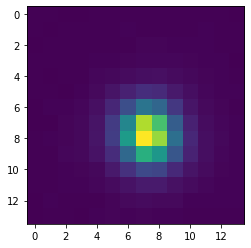

006513-u4-0710(3.8333332538604736,754.1666870117188)


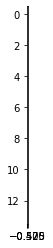

006513-u4-0710(112.5,1226.5)


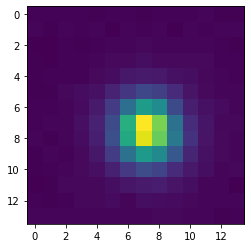

006513-u4-0710(346.3571472167969,553.2857055664061)


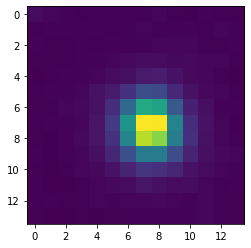

006513-u4-0710(337.0,543.0)


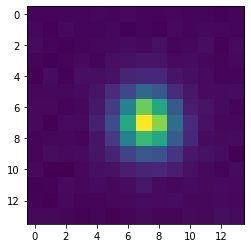

006513-u4-0710(2016.5,546.5)


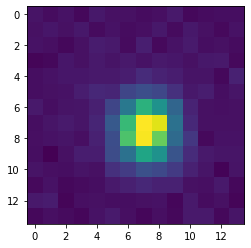

006513-u4-0710(1453.0,798.5)


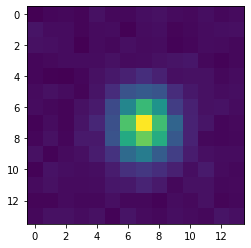

003015-u2-0269(126.5,1275.0)


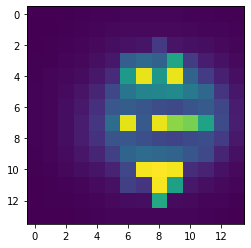

003015-u2-0269(1317.5,329.5)


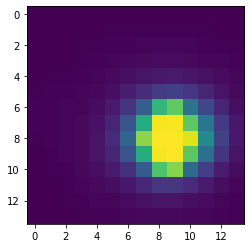

003015-u2-0269(214.5,193.5)


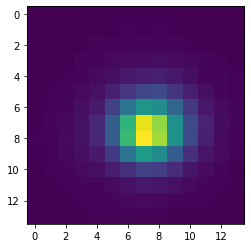

003015-u2-0269(1072.5,155.0)


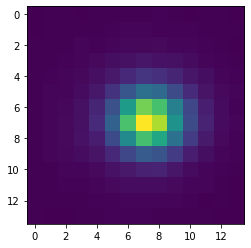

003015-u2-0269(948.8157958984376,1214.394775390625)


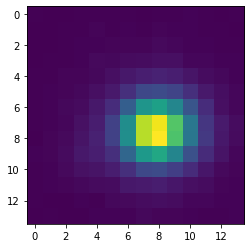

003015-u2-0269(757.5,688.5)


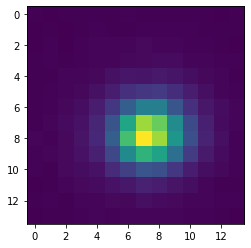

003015-u2-0269(267.71054077148443,1118.4473876953123)


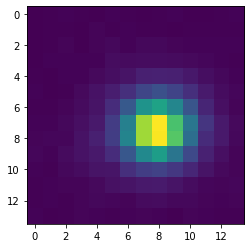

003015-u2-0269(1121.0,509.5)


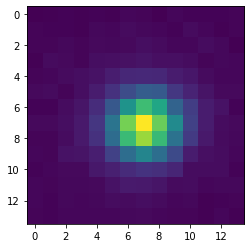

003015-u2-0269(429.8333435058594,1055.5)


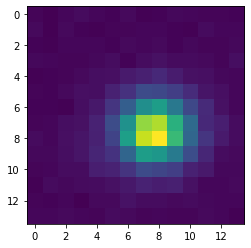

003015-u2-0269(252.5,446.0)


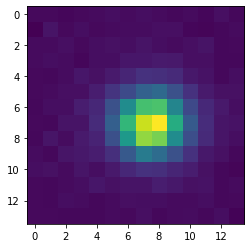

003015-u2-0269(1263.0,173.0)


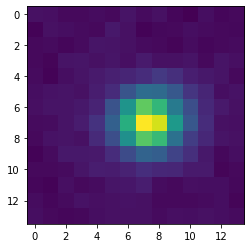

003015-u2-0269(458.0,559.0)


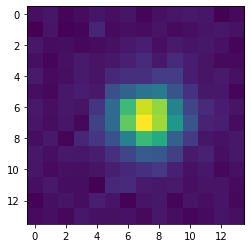

005849-u2-0014(670.4705810546875,1147.7059326171875)


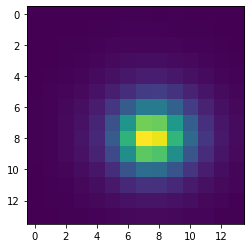

005849-u2-0014(1636.7105712890625,1212.4210205078125)


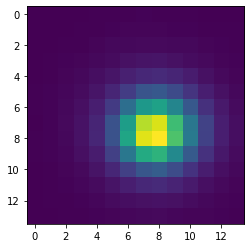

005849-u2-0014(798.388916015625,118.53704071044922)


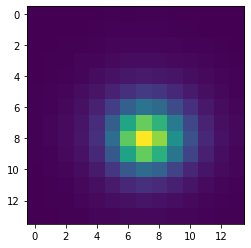

005849-u2-0014(107.0,486.5)


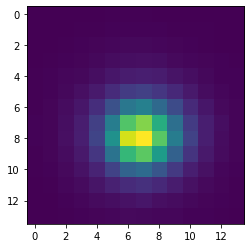

005849-u2-0014(1619.9000244140625,29.5)


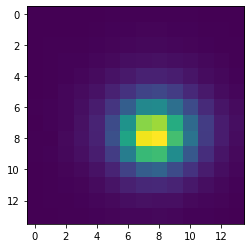

005849-u2-0014(2021.0,324.0)


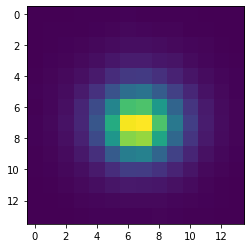

005849-u2-0014(1400.197021484375,1433.0758056640625)


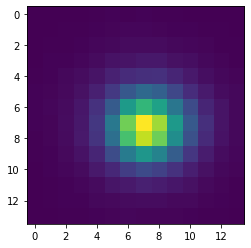

005849-u2-0014(1499.5,498.5)


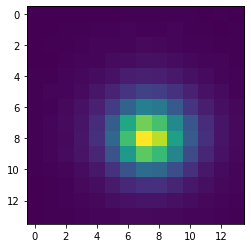

005849-u2-0014(189.0,1020.875)


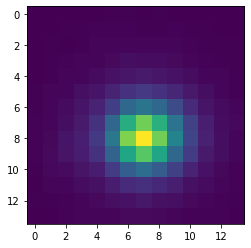

005849-u2-0014(357.0,1024.0)


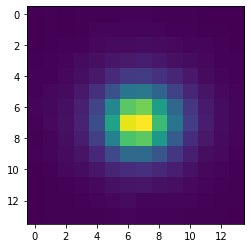

005849-u2-0014(1583.0,1391.5)


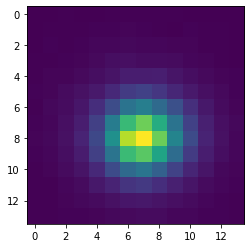

005849-u2-0014(898.5,423.5)


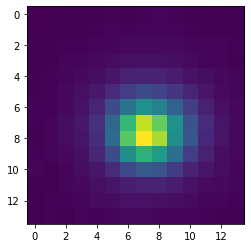

005849-u2-0014(1037.5,243.0)


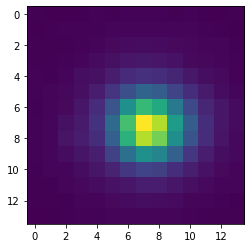

005849-u2-0014(717.0,1021.2999877929688)


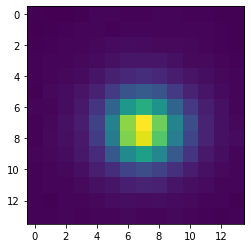

005849-u2-0014(591.7413940429688,249.9482727050781)


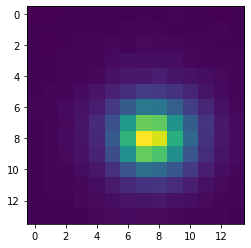

005849-u2-0014(1816.7857666015625,118.21428680419922)


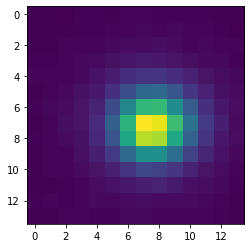

005849-u2-0014(1924.230712890625,898.8846435546875)


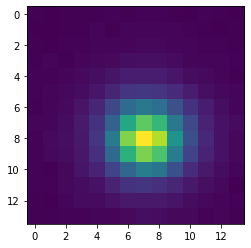

005849-u2-0014(993.8333129882812,454.5)


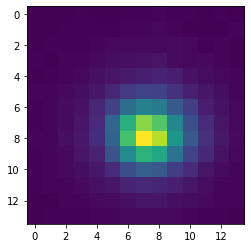

005849-u2-0014(74.875,28.0)


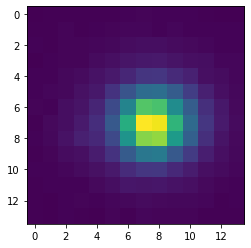

005849-u2-0014(1898.9000244140625,824.0999755859375)


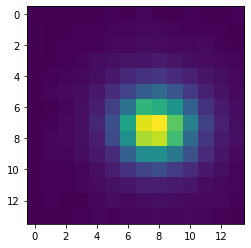

005849-u2-0014(44.5,1263.5)


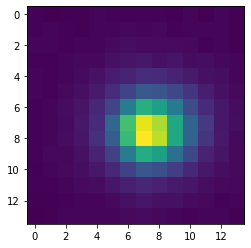

005849-u2-0014(1370.5,584.75)


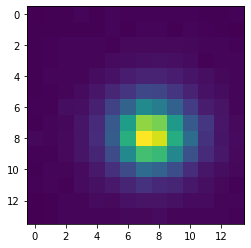

005849-u2-0014(29.5,99.5)


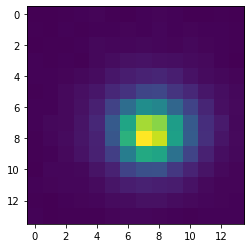

005849-u2-0014(1840.5,221.5)


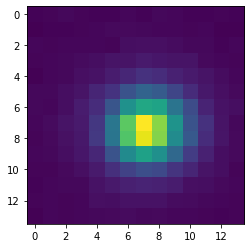

005849-u2-0014(153.5,154.5)


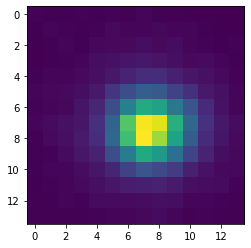

005849-u2-0014(1146.2894287109375,4.552631378173828)


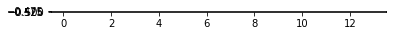

005849-u2-0014(1824.5,1057.0)


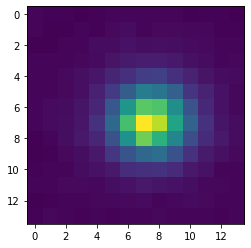

005849-u2-0014(1033.27783203125,713.4444580078125)


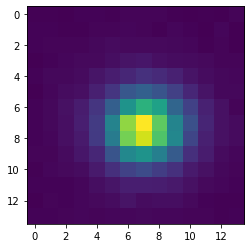

005849-u2-0014(887.2777709960938,1408.4444580078125)


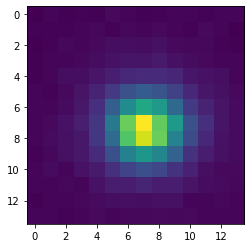

005849-u2-0014(736.7222290039062,928.4444580078124)


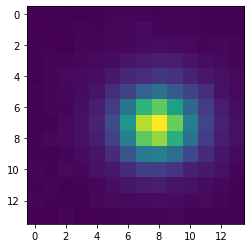

005849-u2-0014(374.6000061035156,85.0)


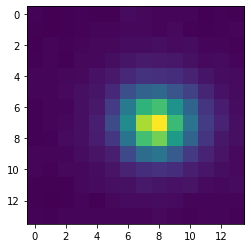

005849-u2-0014(1948.5999755859373,1148.0)


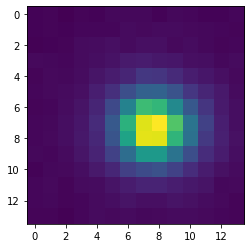

005849-u2-0014(1338.0,1012.5)


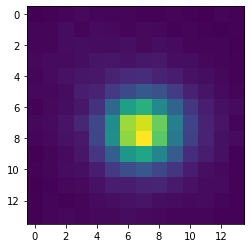

005849-u2-0014(7.0,286.0)


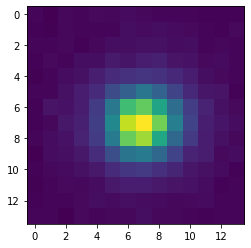

005849-u2-0014(317.25,190.5)


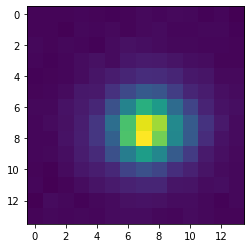

005849-u2-0014(1217.0,5.5)


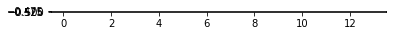

005849-u2-0014(1976.5,1345.0)


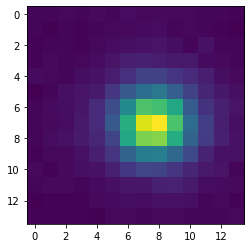

005849-u2-0014(99.5,528.0)


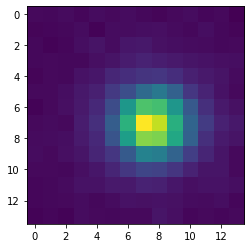

005849-u2-0014(545.5,176.5)


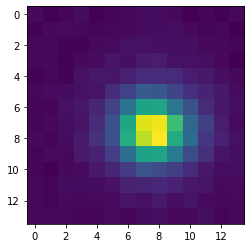

005849-u2-0014(1509.0,50.5)


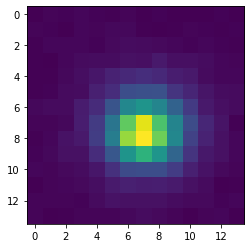

005849-u2-0014(1358.5,962.8333129882812)


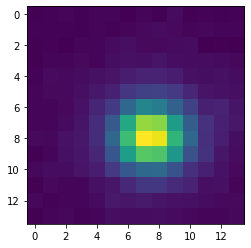

005849-u2-0014(1661.5,1430.5)


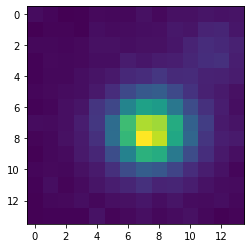

005849-u2-0014(802.1666870117188,572.5)


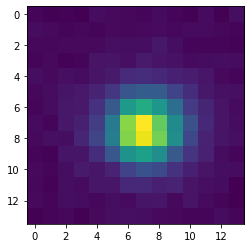

005849-u2-0014(1466.5,89.0)


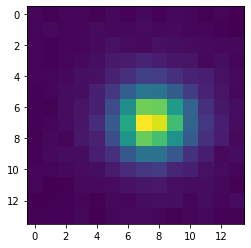

005849-u2-0014(1390.5,177.0)


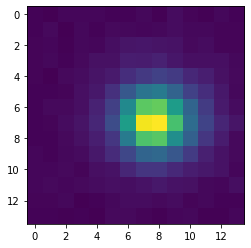

005849-u2-0014(324.5,390.5)


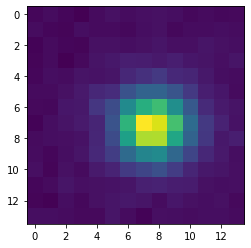

005849-u2-0014(1152.5,143.5)


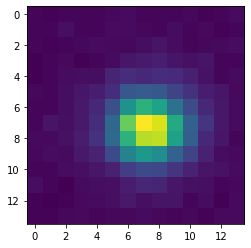

005849-u2-0014(1317.0,1338.0)


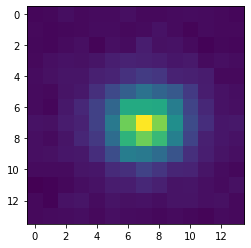

005849-u2-0014(1809.5,464.0)


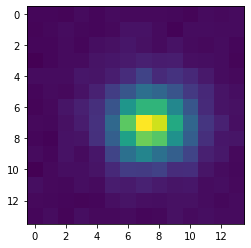

005849-u2-0014(1112.0,225.0)


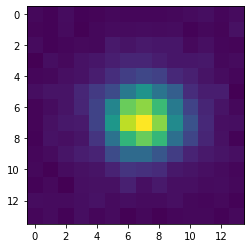

005849-u2-0014(498.0,525.0)


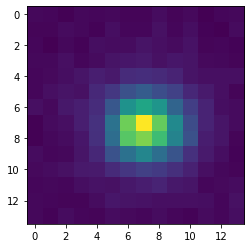

005849-u2-0014(353.0,906.25)


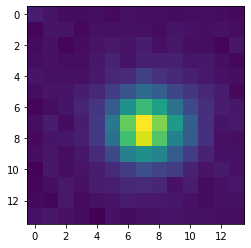

005849-u2-0014(1114.0,263.25)


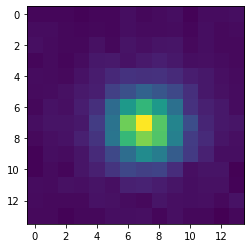

005849-u2-0014(3.5,886.5)


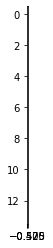

005849-u2-0014(932.0,1360.0)


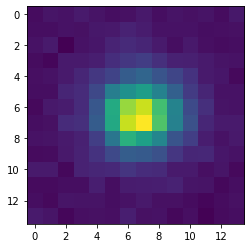

005849-u2-0014(12.5,842.0)


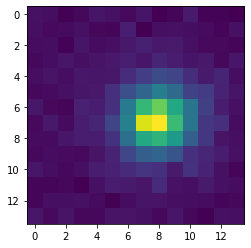

005849-u2-0014(585.0,621.5)


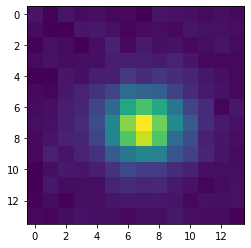

005849-u2-0014(1510.0,513.0)


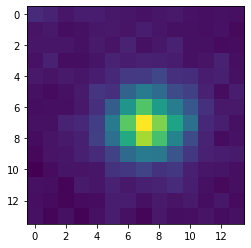

005849-u2-0014(119.0,266.0)


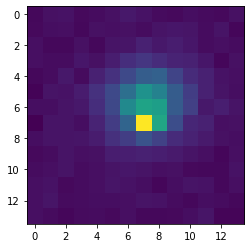

005849-u2-0014(667.0,262.0)


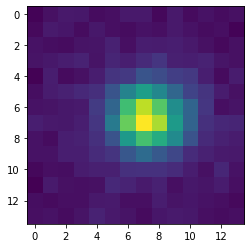

005849-u2-0014(430.5,249.0)


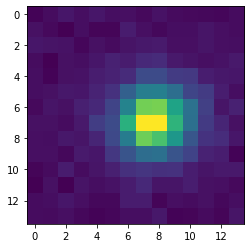

005849-u2-0014(1732.5,78.0)


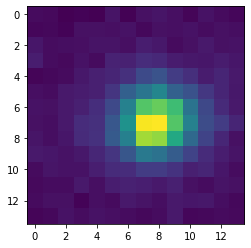

005066-u3-0091(408.0675659179688,686.2026977539062)


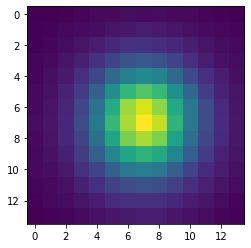

005066-u3-0091(733.5,398.5)


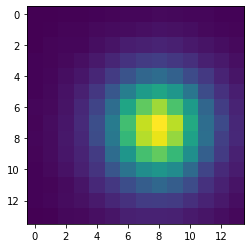

005066-u3-0091(100.0,1276.5)


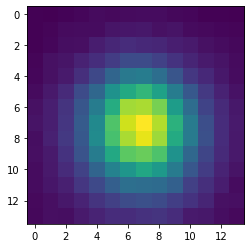

005066-u3-0091(449.0757446289063,391.80303955078125)


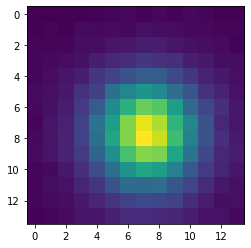

005066-u3-0091(1485.0,822.0)


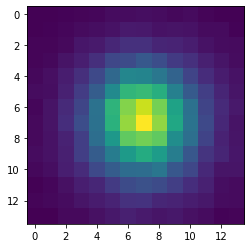

005066-u3-0091(218.0,655.0)


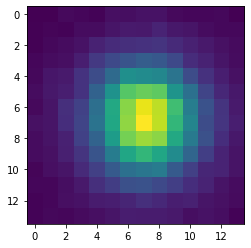

005066-u3-0091(1567.0,886.5)


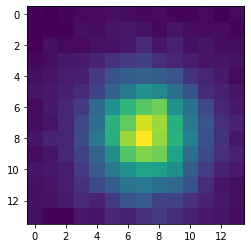

005066-u3-0091(1249.5,960.5)


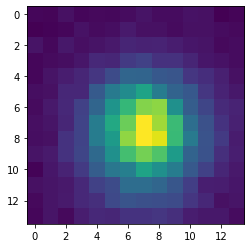

005066-u3-0091(1688.5,1344.5)


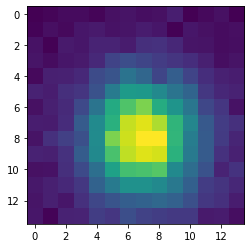

006552-u5-0386(220.0,749.0)


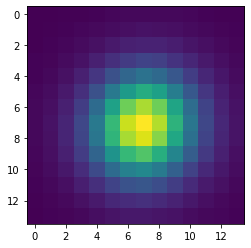

006552-u5-0386(1603.0,770.0)


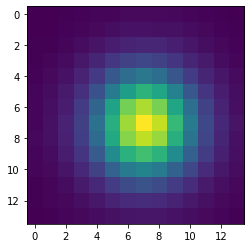

006552-u5-0386(201.0,978.25)


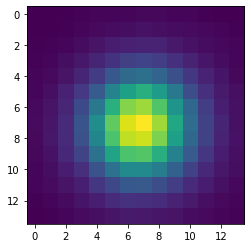

006552-u5-0386(355.3461608886719,981.576904296875)


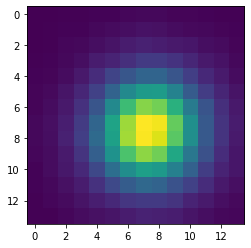

006552-u5-0386(642.8076782226562,346.19232177734375)


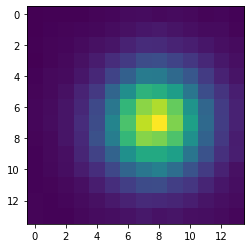

006552-u5-0386(130.256103515625,596.719482421875)


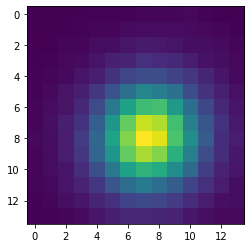

006552-u5-0386(287.5,637.7857055664062)


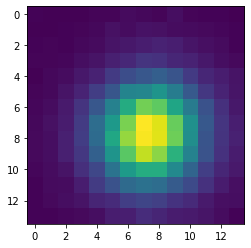

006552-u5-0386(222.5,4.5)


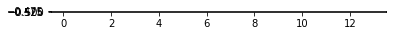

006552-u5-0386(1829.5,1.0)


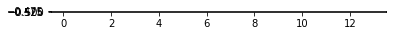

006552-u5-0386(73.0,774.0)


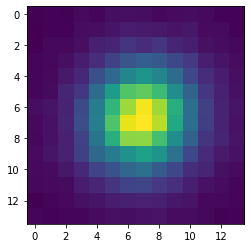

006552-u5-0386(1271.0,1179.0)


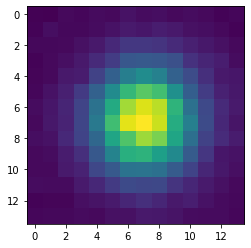

006552-u5-0386(1279.642822265625,1356.0714111328125)


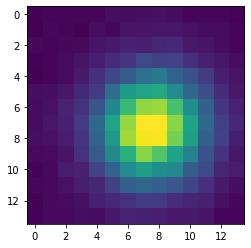

006552-u5-0386(720.1153564453125,950.6538696289062)


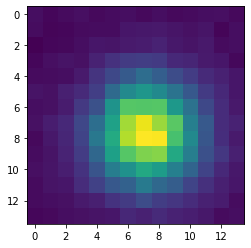

006552-u5-0386(988.0,1488.0)


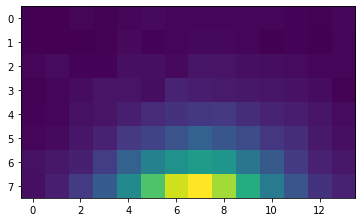

005782-u4-0085(228.0,431.0)


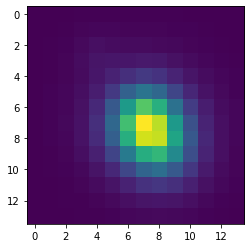

005782-u4-0085(1179.0,980.0)


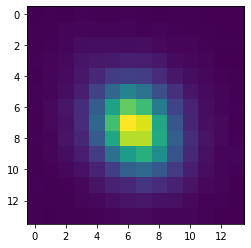

005782-u4-0085(282.70001220703125,279.29998779296875)


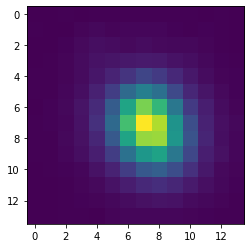

005782-u4-0085(588.2999877929688,770.7000122070312)


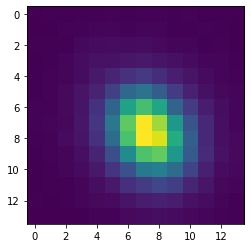

005782-u4-0085(178.0,217.5)


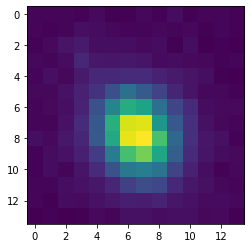

005782-u4-0085(1408.5,1134.25)


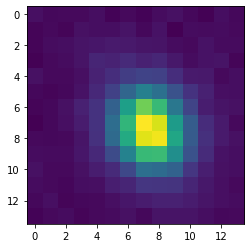

005782-u4-0085(572.5,1279.5)


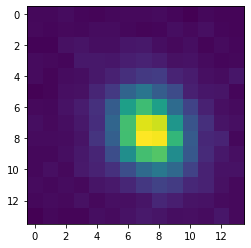

005782-u4-0085(937.5,904.5)


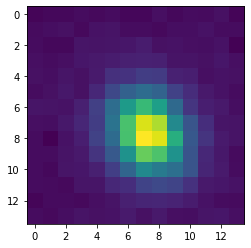

005782-u4-0085(621.5,1104.1666259765623)


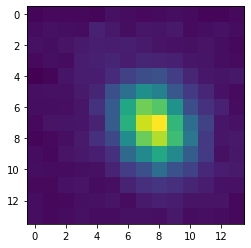

005782-u4-0085(334.0,1241.5)


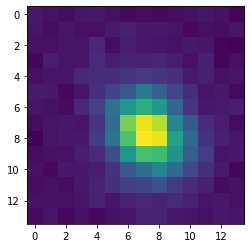

005782-u4-0085(1139.0,1010.0)


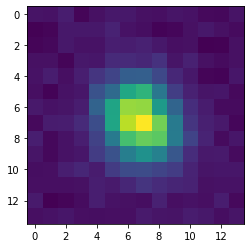

In [8]:
for path in AllPath:
#     print(path)
    data = pd.read_csv(path,header=None)
    data = np.array(data)
    hdulist = fits.open('frame3/u_fit/'+path[11:25]+'.fit.gz')
    image_data = hdulist[0].data
#     os.mkdir("xing/"+path[5:19])

    for i in range(len(data)):
        x = data[i][1]
        y = data[i][0]
        ima = image_data[int(y) - 7:int(y) + 7, int(x) - 7:int(x) + 7]
        # cv2.imwrite('picture/('+str(x)+',' + str(y) + ').png', ima)
        # misc.imsave('picture/('+str(x)+',' + str(y) + ').png', ima)
        # mp.imsave('picture/('+str(x)+',' + str(y) + ').png', ima)
#         str1 = '('+str(x)+','+str(y)+')'
#         plt.title(str1, color='#0000FF')
        
        print(path[11:25]+'('+str(x)+',' + str(y) + ')')
        plt.imshow(ima)
        plt.show()
#         plt.savefig('xing/'+path[5:19]+'/('+str(x)+',' + str(y) + ').jpg')

# ugr三个波段亮点坐标进行筛选

In [58]:
fileDir1 = "data/u_csv/"
pathDir1 = os.listdir(fileDir1)
# print(pathDir1[0])
for path1 in pathDir1:
    path2 = path1[0:7]+'g'+path1[8:]
    path3 = path1[0:7] + 'r' + path1[8:]
    A = np.array(pd.read_csv("data/u_csv/"+path1, header=None))
    B = np.array(pd.read_csv("data/g_csv/"+path2, header=None))
    C = np.array(pd.read_csv("data/r_csv/"+path3, header=None))

    for i in range(A.shape[0]):
        a = np.intersect1d(np.where(abs(B[:, 0] - A[i, 0] <= 7)),
                           np.where(abs(B[:, 1] - A[i, 1] <= 7)))  # 找A的元素上下波动2在B中有没有匹配
        b = np.intersect1d(np.where(abs(C[:, 0] - A[i, 0] <= 7)),
                           np.where(abs(C[:, 1] - A[i, 1] <= 7)))  # 找A的元素上下波动2在C中有没有匹配
        if a.shape[0] > 0 and b.shape[0] > 0:  # 如果在B中找得到匹配，也在C中找得到匹配，那就把i提出来
            # print(i)
            f = open('data/csv/' + path1[0:7]+path1[8:], 'a', encoding='utf-8', newline='')
            # 基于文件对象构建 csv写入对象
            csv_writer = csv.writer(f)
            csv_writer.writerow([A[i,0], A[i,1]])

In [88]:
dir="world2pix3/"    #目录路径
#获取当前目录下所有的文件路径
AllPath = []
for root,dirs,files in os.walk(dir):
    for file in files:
        #f.writelines(os.path.join(root,file)+"\n")
        if file != ".DS_Store":
            AllPath.append(os.path.join(root,file))

print(AllPath[0])

world2pix3/005182-4-00110.csv


In [90]:
# fileDir1 = "world2pix3/"
# pathDir1 = os.listdir(fileDir1)

for path1 in AllPath:
#     path2 = path1[0:10]+path1[11:]
#     print(path1)
    A = np.array(pd.read_csv(path1, header=None))
    path2 = path1[11:20]+path1[21:]
    B = np.array(pd.read_csv("data/csv/"+path2, header=None))

    for i in range(A.shape[0]):
        a = np.intersect1d(np.where(abs(B[:, 0] - A[i, 0] <= 7)),
                           np.where(abs(B[:, 1] - A[i, 1] <= 7)))  # 找A的元素上下波动2在B中有没有匹配
        if a.shape[0] == A.shape[0] :  # 如果在B中找得到匹配，也在C中找得到匹配，那就把i提出来
            # print(i)
            f = open('data/check_csv/' + path2, 'a', encoding='utf-8', newline='')
            # 基于文件对象构建 csv写入对象
            csv_writer = csv.writer(f)
            csv_writer.writerow([A[i,0], A[i,1]])